In [117]:
import pydicom as dicom
import matplotlib.pylab as plt
import glob
import pandas as pd
import numpy as np
Data=pd.read_csv('Data.csv')
Data= Data.dropna()
#Data=Data.drop_duplicates(subset=['Olgu Numarası'])
Data['path']='PNG/'+Data['Olgu Numarası']+'/'+Data['Kesit Numarası']+'.jpg'
Data=Data.drop(['Olgu Numarası','Kesit Numarası','Tip'],axis=1)


In [118]:
for i in Data.index:
    if Data['Sınıf'][i]=='Akut apandisit ile uyumlu':
        Data['Sınıf'][i]='first'
    elif Data['Sınıf'][i]=='Akut kolesistit ile uyumlu':
        Data['Sınıf'][i]='second'#'2'
    elif Data['Sınıf'][i]=='Böbrek taşı':
        Data['Sınıf'][i]='forth'#'4'
    elif Data['Sınıf'][i]=='Üreter taşı':
        Data['Sınıf'][i]='forth'#'4'
    elif Data['Sınıf'][i]=='Abdominal aort anevrizma':
        Data['Sınıf'][i]='sixth'#'6'
    elif Data['Sınıf'][i]=='Akut divertikülit ile uyumlu':
        Data['Sınıf'][i]='fifth'#'5'
    elif Data['Sınıf'][i]=='Akut pankreatit ile uyumlu':
        Data['Sınıf'][i]='third'#'3'
    elif Data['Sınıf'][i]=='Abdominal aort diseksiyon':
        Data['Sınıf'][i]='fifth'#'5'
    elif Data['Sınıf'][i]!='Abdominal aort diseksiyon' or Data['Sınıf'][i]!='Akut pankreatit ile uyumlu' or Data['Sınıf'][i]!='Akut divertikülit ile uyumlu' or Data['Sınıf'][i]!='Abdominal aort anevrizma' or Data['Sınıf'][i]!='Üreter taşı' or Data['Sınıf'][i]!='Böbrek taşı' or Data['Sınıf'][i]!='Akut kolesistit ile uyumlu' or Data['Sınıf'][i]!='Akut apandisit ile uyumlu':
        Data['Sınıf'][i]=None


In [123]:

df=Data.drop('Koordinatlar',axis=1)
df=df.dropna()
df=df.drop_duplicates(subset=['path'])
df

,Sınıf,path
1,first,PNG/10238/Seri4/39830356056.jpg
3,first,PNG/10238/Seri4/39830356060.jpg
5,first,PNG/10238/Seri4/39830356064.jpg
7,first,PNG/10238/Seri4/39830356069.jpg
8,first,PNG/10238/Seri4/39830356074.jpg
...,...,...
38206,forth,PNG/26498/Seri2/26373981332.jpg
38207,forth,PNG/26498/Seri2/26373981333.jpg
38208,forth,PNG/26498/Seri2/26373981334.jpg
38209,forth,PNG/26498/Seri2/26373981335.jpg


In [124]:
Fseries = pd.Series(df.path, name="filepaths")

Lseries = pd.Series(df.Sınıf, name="labels")
tumor_data = pd.concat([Fseries,Lseries], axis=1)
tumor_df = pd.DataFrame(tumor_data)
print(tumor_df.head())
print(tumor_df["labels"].value_counts())

#shape of datatset
tumor_df.shape

                         filepaths labels
1  PNG/10238/Seri4/39830356056.jpg  first
3  PNG/10238/Seri4/39830356060.jpg  first
5  PNG/10238/Seri4/39830356064.jpg  first
7  PNG/10238/Seri4/39830356069.jpg  first
8  PNG/10238/Seri4/39830356074.jpg  first
sixth     8981
third     6430
first     5063
second    4692
forth     2049
fifth     1888
Name: labels, dtype: int64


(29103, 2)

In [125]:
from sklearn.model_selection import train_test_split 
train_images, test_images = train_test_split(tumor_df, test_size=0.3, random_state=33)
train_set, val_set = train_test_split(tumor_df, test_size=0.2, random_state=33)

In [126]:
print(train_set.shape)
print(test_images.shape)
print(val_set.shape)
print(train_images.shape)


(23282, 2)
(8731, 2)
(5821, 2)
(20372, 2)


In [148]:
with tf.device('/gpu:0'):
    #Generate batches of tensor image data with real-time data augmentation.
    image_gen = ImageDataGenerator(preprocessing_function= tf.keras.applications.mobilenet_v2.preprocess_input)
    train = image_gen.flow_from_dataframe(dataframe= train_set,x_col="filepaths",y_col="labels",
                                          target_size=(100,100),

                                          class_mode='categorical', #used for Sequential Model
                                          batch_size=7,
                                          shuffle=False            #do not shuffle data
                                         )
    test = image_gen.flow_from_dataframe(dataframe= test_images,x_col="filepaths", y_col="labels",
                                        target_size=(100,100),

                                         class_mode='categorical',
                                         batch_size=7,
                                         shuffle= False
                                        )
    val = image_gen.flow_from_dataframe(dataframe= val_set,x_col="filepaths", y_col="labels",
                                        target_size=(100,100),

                                        class_mode='categorical',
                                        batch_size=7,
                                        shuffle=False
                                       )

Found 23282 validated image filenames belonging to 6 classes.
Found 8731 validated image filenames belonging to 6 classes.
Found 5821 validated image filenames belonging to 6 classes.


In [128]:
import os
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings(action="ignore")
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.preprocessing import StandardScaler 
from sklearn.model_selection import train_test_split 
from sklearn.metrics import classification_report
#tensorflow libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import MaxPooling2D, Dense, Dropout,Flatten, Conv2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import TensorBoard,EarlyStopping 
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
tf.debugging.set_log_device_placement(True)

Num GPUs Available:  1


In [129]:
with tf.device('/gpu:0'):
    from keras.applications.vgg16 import VGG16, preprocess_input
    IMG_SIZE=(100,100)
    vgg16_weight_path = 'C:/Users/omerf/OneDrive/Desktop/SYZ/vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5'
    base_model = VGG16(
        weights=vgg16_weight_path,
        include_top=False, 
        input_shape=IMG_SIZE + (3,)
    )

    base_model.summary()

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/repli

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/re

 block1_conv2 (Conv2D)       (None, 100, 100, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 50, 50, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 50, 50, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 50, 50, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 25, 25, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 25, 25, 256)       295168    
                                                                 
 block3_conv2 (Conv2D)       (None, 25, 25, 256)       590080    
                                                                 
 block3_conv3 (Conv2D)       (None, 25, 25, 256)       590080    
          

In [130]:
with tf.device('/gpu:0'):
    NUM_CLASSES = 6
    from keras import layers
    from tensorflow.keras.optimizers import Adam, RMSprop

    model = Sequential()
    model.add(base_model)
    model.add(layers.Flatten())

    model.add(layers.Dense(NUM_CLASSES, activation='softmax'))

    

    model.compile(
        loss='categorical_crossentropy',
        optimizer=RMSprop(lr=1e-4),
        metrics=['accuracy']
    )


    model.summary()

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:

In [131]:
#fitting model
import time

with tf.device('/gpu:0'):
    start = time.time()

    History = model.fit(train,validation_data= val, epochs=10,verbose=1)
    print("Total time: ", time.time() - start, "seconds")

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableO

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/rep

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  13/3326 [..............................] - ETA: 5:03 - loss: 2.1258 - accuracy: 0.1538Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  14/3326 [..............................] - ETA: 5:03 - loss: 2.1176 - accuracy: 0.1531Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  15/3326 [..............................] - ETA: 5:04 - loss: 2.0908 - accuracy: 0.1524Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  60/3326 [..............................] - ETA: 4:59 - loss: 1.7967 - accuracy: 0.2929Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  61/3326 [..............................] - ETA: 4:58 - loss: 1.7948 - accuracy: 0.2904Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  62/3326 [..............................] - ETA: 4:58 - loss: 1.7918 - accuracy: 0.2926Executing op ReadVariableOp in devic

  83/3326 [..............................] - ETA: 4:56 - loss: 1.7452 - accuracy: 0.3098Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  84/3326 [..............................] - ETA: 4:56 - loss: 1.7427 - accuracy: 0.3078Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  85/3326 [..............................] - ETA: 4:56 - loss: 1.7439 - accuracy: 0.3059Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 107/3326 [..............................] - ETA: 4:53 - loss: 1.7152 - accuracy: 0.3097Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 108/3326 [..............................] - ETA: 4:53 - loss: 1.7125 - accuracy: 0.3108Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 109/3326 [..............................] - ETA: 4:53 - loss: 1.7123 - accuracy: 0.3106Executing op ReadVariableOp in devic

 130/3326 [>.............................] - ETA: 4:51 - loss: 1.6819 - accuracy: 0.3407Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 131/3326 [>.............................] - ETA: 4:51 - loss: 1.6795 - accuracy: 0.3402Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 132/3326 [>.............................] - ETA: 4:51 - loss: 1.6774 - accuracy: 0.3409Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 154/3326 [>.............................] - ETA: 4:49 - loss: 1.6599 - accuracy: 0.3534Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 155/3326 [>.............................] - ETA: 4:49 - loss: 1.6569 - accuracy: 0.3548Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 156/3326 [>.............................] - ETA: 4:49 - loss: 1.6562 - accuracy: 0.3553Executing op ReadVariableOp in devic

 177/3326 [>.............................] - ETA: 4:46 - loss: 1.6221 - accuracy: 0.3721Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 178/3326 [>.............................] - ETA: 4:46 - loss: 1.6219 - accuracy: 0.3732Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 179/3326 [>.............................] - ETA: 4:46 - loss: 1.6203 - accuracy: 0.3743Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 201/3326 [>.............................] - ETA: 4:44 - loss: 1.5824 - accuracy: 0.3916Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 202/3326 [>.............................] - ETA: 4:44 - loss: 1.5798 - accuracy: 0.3925Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 203/3326 [>.............................] - ETA: 4:44 - loss: 1.5763 - accuracy: 0.3941Executing op ReadVariableOp in devic

 224/3326 [=>............................] - ETA: 4:42 - loss: 1.5507 - accuracy: 0.4107Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 225/3326 [=>............................] - ETA: 4:42 - loss: 1.5495 - accuracy: 0.4108Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 226/3326 [=>............................] - ETA: 4:42 - loss: 1.5484 - accuracy: 0.4115Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 248/3326 [=>............................] - ETA: 4:39 - loss: 1.5174 - accuracy: 0.4251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 249/3326 [=>............................] - ETA: 4:39 - loss: 1.5187 - accuracy: 0.4246Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 250/3326 [=>............................] - ETA: 4:39 - loss: 1.5183 - accuracy: 0.4240Executing op ReadVariableOp in devic

 271/3326 [=>............................] - ETA: 4:37 - loss: 1.4944 - accuracy: 0.4360Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 272/3326 [=>............................] - ETA: 4:37 - loss: 1.4935 - accuracy: 0.4364Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 273/3326 [=>............................] - ETA: 4:37 - loss: 1.4960 - accuracy: 0.4369Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 295/3326 [=>............................] - ETA: 4:35 - loss: 1.4753 - accuracy: 0.4465Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 296/3326 [=>............................] - ETA: 4:35 - loss: 1.4713 - accuracy: 0.4484Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 297/3326 [=>............................] - ETA: 4:35 - loss: 1.4695 - accuracy: 0.4488Executing op ReadVariableOp in devic

 318/3326 [=>............................] - ETA: 4:33 - loss: 1.4519 - accuracy: 0.4546Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 319/3326 [=>............................] - ETA: 4:33 - loss: 1.4500 - accuracy: 0.4554Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 320/3326 [=>............................] - ETA: 4:33 - loss: 1.4496 - accuracy: 0.4554Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 342/3326 [==>...........................] - ETA: 4:31 - loss: 1.4417 - accuracy: 0.4637Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 343/3326 [==>...........................] - ETA: 4:31 - loss: 1.4391 - accuracy: 0.4644Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 344/3326 [==>...........................] - ETA: 4:31 - loss: 1.4384 - accuracy: 0.4647Executing op ReadVariableOp in devic

 365/3326 [==>...........................] - ETA: 4:29 - loss: 1.4110 - accuracy: 0.4755Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 366/3326 [==>...........................] - ETA: 4:29 - loss: 1.4158 - accuracy: 0.4746Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 367/3326 [==>...........................] - ETA: 4:29 - loss: 1.4159 - accuracy: 0.4749Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 389/3326 [==>...........................] - ETA: 4:26 - loss: 1.3944 - accuracy: 0.4859Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 390/3326 [==>...........................] - ETA: 4:26 - loss: 1.3939 - accuracy: 0.4857Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 391/3326 [==>...........................] - ETA: 4:26 - loss: 1.3927 - accuracy: 0.4859Executing op ReadVariableOp in devic

 412/3326 [==>...........................] - ETA: 4:24 - loss: 1.3775 - accuracy: 0.4920Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 413/3326 [==>...........................] - ETA: 4:24 - loss: 1.3776 - accuracy: 0.4919Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 414/3326 [==>...........................] - ETA: 4:24 - loss: 1.3777 - accuracy: 0.4914Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 436/3326 [==>...........................] - ETA: 4:22 - loss: 1.3591 - accuracy: 0.4990Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 437/3326 [==>...........................] - ETA: 4:22 - loss: 1.3584 - accuracy: 0.4989Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 438/3326 [==>...........................] - ETA: 4:22 - loss: 1.3581 - accuracy: 0.4987Executing op ReadVariableOp in devic

 459/3326 [===>..........................] - ETA: 4:20 - loss: 1.3488 - accuracy: 0.5011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 460/3326 [===>..........................] - ETA: 4:20 - loss: 1.3481 - accuracy: 0.5012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 461/3326 [===>..........................] - ETA: 4:20 - loss: 1.3479 - accuracy: 0.5014Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 483/3326 [===>..........................] - ETA: 4:18 - loss: 1.3302 - accuracy: 0.5064Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 484/3326 [===>..........................] - ETA: 4:18 - loss: 1.3297 - accuracy: 0.5068Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 485/3326 [===>..........................] - ETA: 4:17 - loss: 1.3289 - accuracy: 0.5069Executing op ReadVariableOp in devic

 506/3326 [===>..........................] - ETA: 4:16 - loss: 1.3159 - accuracy: 0.5090Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 507/3326 [===>..........................] - ETA: 4:16 - loss: 1.3147 - accuracy: 0.5094Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 508/3326 [===>..........................] - ETA: 4:15 - loss: 1.3133 - accuracy: 0.5101Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 530/3326 [===>..........................] - ETA: 4:13 - loss: 1.2976 - accuracy: 0.5154Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 531/3326 [===>..........................] - ETA: 4:13 - loss: 1.2966 - accuracy: 0.5155Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 532/3326 [===>..........................] - ETA: 4:13 - loss: 1.2954 - accuracy: 0.5161Executing op ReadVariableOp in devic

 553/3326 [===>..........................] - ETA: 4:11 - loss: 1.2810 - accuracy: 0.5205Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 554/3326 [===>..........................] - ETA: 4:11 - loss: 1.2799 - accuracy: 0.5211Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 555/3326 [====>.........................] - ETA: 4:11 - loss: 1.2789 - accuracy: 0.5218Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 577/3326 [====>.........................] - ETA: 4:09 - loss: 1.2702 - accuracy: 0.5256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 578/3326 [====>.........................] - ETA: 4:09 - loss: 1.2687 - accuracy: 0.5260Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 579/3326 [====>.........................] - ETA: 4:09 - loss: 1.2678 - accuracy: 0.5260Executing op ReadVariableOp in devic

 600/3326 [====>.........................] - ETA: 4:07 - loss: 1.2650 - accuracy: 0.5290Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 601/3326 [====>.........................] - ETA: 4:07 - loss: 1.2645 - accuracy: 0.5291Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 602/3326 [====>.........................] - ETA: 4:07 - loss: 1.2638 - accuracy: 0.5292Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 624/3326 [====>.........................] - ETA: 4:05 - loss: 1.2510 - accuracy: 0.5359Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 625/3326 [====>.........................] - ETA: 4:05 - loss: 1.2504 - accuracy: 0.5360Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 626/3326 [====>.........................] - ETA: 4:05 - loss: 1.2494 - accuracy: 0.5365Executing op ReadVariableOp in devic

 647/3326 [====>.........................] - ETA: 4:03 - loss: 1.2394 - accuracy: 0.5401Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 648/3326 [====>.........................] - ETA: 4:03 - loss: 1.2385 - accuracy: 0.5403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 649/3326 [====>.........................] - ETA: 4:03 - loss: 1.2385 - accuracy: 0.5408Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 671/3326 [=====>........................] - ETA: 4:01 - loss: 1.2285 - accuracy: 0.5444Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 672/3326 [=====>........................] - ETA: 4:00 - loss: 1.2278 - accuracy: 0.5442Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 673/3326 [=====>........................] - ETA: 4:00 - loss: 1.2273 - accuracy: 0.5447Executing op ReadVariableOp in devic

 694/3326 [=====>........................] - ETA: 3:58 - loss: 1.2167 - accuracy: 0.5492Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 695/3326 [=====>........................] - ETA: 3:58 - loss: 1.2167 - accuracy: 0.5492Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 696/3326 [=====>........................] - ETA: 3:58 - loss: 1.2161 - accuracy: 0.5497Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 718/3326 [=====>........................] - ETA: 3:56 - loss: 1.2053 - accuracy: 0.5533Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 719/3326 [=====>........................] - ETA: 3:56 - loss: 1.2048 - accuracy: 0.5535Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 720/3326 [=====>........................] - ETA: 3:56 - loss: 1.2044 - accuracy: 0.5538Executing op ReadVariableOp in devic

 741/3326 [=====>........................] - ETA: 3:54 - loss: 1.1921 - accuracy: 0.5583Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 742/3326 [=====>........................] - ETA: 3:54 - loss: 1.1913 - accuracy: 0.5587Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 743/3326 [=====>........................] - ETA: 3:54 - loss: 1.1903 - accuracy: 0.5591Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 765/3326 [=====>........................] - ETA: 3:52 - loss: 1.1829 - accuracy: 0.5628Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 766/3326 [=====>........................] - ETA: 3:52 - loss: 1.1820 - accuracy: 0.5632Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 767/3326 [=====>........................] - ETA: 3:52 - loss: 1.1810 - accuracy: 0.5634Executing op ReadVariableOp in devic

 788/3326 [======>.......................] - ETA: 3:50 - loss: 1.1722 - accuracy: 0.5667Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 789/3326 [======>.......................] - ETA: 3:50 - loss: 1.1714 - accuracy: 0.5671Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 790/3326 [======>.......................] - ETA: 3:50 - loss: 1.1703 - accuracy: 0.5675Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 812/3326 [======>.......................] - ETA: 3:48 - loss: 1.1646 - accuracy: 0.5707Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 813/3326 [======>.......................] - ETA: 3:48 - loss: 1.1649 - accuracy: 0.5709Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 814/3326 [======>.......................] - ETA: 3:48 - loss: 1.1649 - accuracy: 0.5711Executing op ReadVariableOp in devic

 835/3326 [======>.......................] - ETA: 3:46 - loss: 1.1595 - accuracy: 0.5735Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 836/3326 [======>.......................] - ETA: 3:46 - loss: 1.1594 - accuracy: 0.5733Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 837/3326 [======>.......................] - ETA: 3:45 - loss: 1.1586 - accuracy: 0.5736Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 859/3326 [======>.......................] - ETA: 3:43 - loss: 1.1494 - accuracy: 0.5764Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 860/3326 [======>.......................] - ETA: 3:43 - loss: 1.1492 - accuracy: 0.5767Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 861/3326 [======>.......................] - ETA: 3:43 - loss: 1.1491 - accuracy: 0.5767Executing op ReadVariableOp in devic

 882/3326 [======>.......................] - ETA: 3:41 - loss: 1.1389 - accuracy: 0.5807Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 883/3326 [======>.......................] - ETA: 3:41 - loss: 1.1381 - accuracy: 0.5810Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 884/3326 [======>.......................] - ETA: 3:41 - loss: 1.1370 - accuracy: 0.5813Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 906/3326 [=======>......................] - ETA: 3:39 - loss: 1.1290 - accuracy: 0.5851Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 907/3326 [=======>......................] - ETA: 3:39 - loss: 1.1286 - accuracy: 0.5853Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 908/3326 [=======>......................] - ETA: 3:39 - loss: 1.1283 - accuracy: 0.5854Executing op ReadVariableOp in devic

 929/3326 [=======>......................] - ETA: 3:37 - loss: 1.1186 - accuracy: 0.5893Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 930/3326 [=======>......................] - ETA: 3:37 - loss: 1.1179 - accuracy: 0.5894Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 931/3326 [=======>......................] - ETA: 3:37 - loss: 1.1170 - accuracy: 0.5897Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 953/3326 [=======>......................] - ETA: 3:35 - loss: 1.1064 - accuracy: 0.5936Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 954/3326 [=======>......................] - ETA: 3:35 - loss: 1.1063 - accuracy: 0.5936Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 955/3326 [=======>......................] - ETA: 3:35 - loss: 1.1059 - accuracy: 0.5936Executing op ReadVariableOp in devic

 976/3326 [=======>......................] - ETA: 3:33 - loss: 1.0959 - accuracy: 0.5981Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 977/3326 [=======>......................] - ETA: 3:33 - loss: 1.0957 - accuracy: 0.5982Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 978/3326 [=======>......................] - ETA: 3:33 - loss: 1.0954 - accuracy: 0.5985Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1000/3326 [========>.....................] - ETA: 3:31 - loss: 1.0859 - accuracy: 0.6027Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1001/3326 [========>.....................] - ETA: 3:31 - loss: 1.0850 - accuracy: 0.6030Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1002/3326 [========>.....................] - ETA: 3:31 - loss: 1.0846 - accuracy: 0.6031Executing op ReadVariableOp in devic

1023/3326 [========>.....................] - ETA: 3:29 - loss: 1.0757 - accuracy: 0.6054Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1024/3326 [========>.....................] - ETA: 3:29 - loss: 1.0757 - accuracy: 0.6053Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1025/3326 [========>.....................] - ETA: 3:28 - loss: 1.0753 - accuracy: 0.6054Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1047/3326 [========>.....................] - ETA: 3:26 - loss: 1.0687 - accuracy: 0.6077Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1048/3326 [========>.....................] - ETA: 3:26 - loss: 1.0684 - accuracy: 0.6077Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1049/3326 [========>.....................] - ETA: 3:26 - loss: 1.0680 - accuracy: 0.6079Executing op ReadVariableOp in devic

1070/3326 [========>.....................] - ETA: 3:24 - loss: 1.0648 - accuracy: 0.6089Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1071/3326 [========>.....................] - ETA: 3:24 - loss: 1.0646 - accuracy: 0.6090Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1072/3326 [========>.....................] - ETA: 3:24 - loss: 1.0643 - accuracy: 0.6091Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1094/3326 [========>.....................] - ETA: 3:22 - loss: 1.0578 - accuracy: 0.6115Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1095/3326 [========>.....................] - ETA: 3:22 - loss: 1.0575 - accuracy: 0.6115Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1096/3326 [========>.....................] - ETA: 3:22 - loss: 1.0571 - accuracy: 0.6116Executing op ReadVariableOp in devic

1117/3326 [=========>....................] - ETA: 3:20 - loss: 1.0487 - accuracy: 0.6145Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1118/3326 [=========>....................] - ETA: 3:20 - loss: 1.0482 - accuracy: 0.6146Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1119/3326 [=========>....................] - ETA: 3:20 - loss: 1.0478 - accuracy: 0.6147Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1141/3326 [=========>....................] - ETA: 3:18 - loss: 1.0406 - accuracy: 0.6176Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1142/3326 [=========>....................] - ETA: 3:18 - loss: 1.0406 - accuracy: 0.6177Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1143/3326 [=========>....................] - ETA: 3:18 - loss: 1.0401 - accuracy: 0.6179Executing op ReadVariableOp in devic

1164/3326 [=========>....................] - ETA: 3:16 - loss: 1.0356 - accuracy: 0.6198Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1165/3326 [=========>....................] - ETA: 3:16 - loss: 1.0352 - accuracy: 0.6199Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1166/3326 [=========>....................] - ETA: 3:15 - loss: 1.0353 - accuracy: 0.6197Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1188/3326 [=========>....................] - ETA: 3:13 - loss: 1.0270 - accuracy: 0.6231Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1189/3326 [=========>....................] - ETA: 3:13 - loss: 1.0266 - accuracy: 0.6232Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1190/3326 [=========>....................] - ETA: 3:13 - loss: 1.0262 - accuracy: 0.6233Executing op ReadVariableOp in devic

1211/3326 [=========>....................] - ETA: 3:11 - loss: 1.0194 - accuracy: 0.6257Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1212/3326 [=========>....................] - ETA: 3:11 - loss: 1.0195 - accuracy: 0.6256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1213/3326 [=========>....................] - ETA: 3:11 - loss: 1.0190 - accuracy: 0.6258Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1235/3326 [==========>...................] - ETA: 3:09 - loss: 1.0096 - accuracy: 0.6297Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1236/3326 [==========>...................] - ETA: 3:09 - loss: 1.0091 - accuracy: 0.6298Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1237/3326 [==========>...................] - ETA: 3:09 - loss: 1.0094 - accuracy: 0.6294Executing op ReadVariableOp in devic

1258/3326 [==========>...................] - ETA: 3:07 - loss: 1.0049 - accuracy: 0.6314Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1259/3326 [==========>...................] - ETA: 3:07 - loss: 1.0045 - accuracy: 0.6315Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1260/3326 [==========>...................] - ETA: 3:07 - loss: 1.0038 - accuracy: 0.6317Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1282/3326 [==========>...................] - ETA: 3:05 - loss: 0.9972 - accuracy: 0.6342Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1283/3326 [==========>...................] - ETA: 3:05 - loss: 0.9969 - accuracy: 0.6341Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1284/3326 [==========>...................] - ETA: 3:05 - loss: 0.9964 - accuracy: 0.6343Executing op ReadVariableOp in devic

1305/3326 [==========>...................] - ETA: 3:03 - loss: 0.9911 - accuracy: 0.6361Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1306/3326 [==========>...................] - ETA: 3:03 - loss: 0.9908 - accuracy: 0.6363Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1307/3326 [==========>...................] - ETA: 3:03 - loss: 0.9908 - accuracy: 0.6362Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1329/3326 [==========>...................] - ETA: 3:01 - loss: 0.9829 - accuracy: 0.6396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1330/3326 [==========>...................] - ETA: 3:01 - loss: 0.9824 - accuracy: 0.6397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1331/3326 [===========>..................] - ETA: 3:01 - loss: 0.9819 - accuracy: 0.6399Executing op ReadVariableOp in devic

1352/3326 [===========>..................] - ETA: 2:59 - loss: 0.9777 - accuracy: 0.6411Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1353/3326 [===========>..................] - ETA: 2:59 - loss: 0.9774 - accuracy: 0.6411Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1354/3326 [===========>..................] - ETA: 2:58 - loss: 0.9774 - accuracy: 0.6411Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1376/3326 [===========>..................] - ETA: 2:56 - loss: 0.9725 - accuracy: 0.6432Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1377/3326 [===========>..................] - ETA: 2:56 - loss: 0.9731 - accuracy: 0.6433Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1378/3326 [===========>..................] - ETA: 2:56 - loss: 0.9731 - accuracy: 0.6433Executing op ReadVariableOp in devic

1399/3326 [===========>..................] - ETA: 2:54 - loss: 0.9682 - accuracy: 0.6453Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1400/3326 [===========>..................] - ETA: 2:54 - loss: 0.9685 - accuracy: 0.6453Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1401/3326 [===========>..................] - ETA: 2:54 - loss: 0.9681 - accuracy: 0.6455Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1423/3326 [===========>..................] - ETA: 2:52 - loss: 0.9621 - accuracy: 0.6477Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1424/3326 [===========>..................] - ETA: 2:52 - loss: 0.9617 - accuracy: 0.6480Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1425/3326 [===========>..................] - ETA: 2:52 - loss: 0.9610 - accuracy: 0.6482Executing op ReadVariableOp in devic

1446/3326 [============>.................] - ETA: 2:50 - loss: 0.9568 - accuracy: 0.6497Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1447/3326 [============>.................] - ETA: 2:50 - loss: 0.9563 - accuracy: 0.6499Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1448/3326 [============>.................] - ETA: 2:50 - loss: 0.9565 - accuracy: 0.6500Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1470/3326 [============>.................] - ETA: 2:48 - loss: 0.9530 - accuracy: 0.6509Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1471/3326 [============>.................] - ETA: 2:48 - loss: 0.9528 - accuracy: 0.6510Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1472/3326 [============>.................] - ETA: 2:48 - loss: 0.9528 - accuracy: 0.6509Executing op ReadVariableOp in devic

1493/3326 [============>.................] - ETA: 2:46 - loss: 0.9468 - accuracy: 0.6534Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1494/3326 [============>.................] - ETA: 2:46 - loss: 0.9463 - accuracy: 0.6537Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1495/3326 [============>.................] - ETA: 2:46 - loss: 0.9461 - accuracy: 0.6537Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1517/3326 [============>.................] - ETA: 2:44 - loss: 0.9416 - accuracy: 0.6556Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1518/3326 [============>.................] - ETA: 2:44 - loss: 0.9417 - accuracy: 0.6556Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1519/3326 [============>.................] - ETA: 2:44 - loss: 0.9414 - accuracy: 0.6556Executing op ReadVariableOp in devic

1540/3326 [============>.................] - ETA: 2:42 - loss: 0.9359 - accuracy: 0.6575Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1541/3326 [============>.................] - ETA: 2:42 - loss: 0.9355 - accuracy: 0.6577Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1542/3326 [============>.................] - ETA: 2:41 - loss: 0.9349 - accuracy: 0.6580Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1564/3326 [=============>................] - ETA: 2:39 - loss: 0.9281 - accuracy: 0.6609Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1565/3326 [=============>................] - ETA: 2:39 - loss: 0.9277 - accuracy: 0.6610Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1566/3326 [=============>................] - ETA: 2:39 - loss: 0.9275 - accuracy: 0.6610Executing op ReadVariableOp in devic

1587/3326 [=============>................] - ETA: 2:37 - loss: 0.9243 - accuracy: 0.6629Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1588/3326 [=============>................] - ETA: 2:37 - loss: 0.9243 - accuracy: 0.6629Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1589/3326 [=============>................] - ETA: 2:37 - loss: 0.9242 - accuracy: 0.6630Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1611/3326 [=============>................] - ETA: 2:35 - loss: 0.9175 - accuracy: 0.6653Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1612/3326 [=============>................] - ETA: 2:35 - loss: 0.9172 - accuracy: 0.6655Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1613/3326 [=============>................] - ETA: 2:35 - loss: 0.9173 - accuracy: 0.6654Executing op ReadVariableOp in devic

1634/3326 [=============>................] - ETA: 2:33 - loss: 0.9125 - accuracy: 0.6672Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1635/3326 [=============>................] - ETA: 2:33 - loss: 0.9121 - accuracy: 0.6675Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1636/3326 [=============>................] - ETA: 2:33 - loss: 0.9117 - accuracy: 0.6676Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1658/3326 [=============>................] - ETA: 2:31 - loss: 0.9058 - accuracy: 0.6693Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1659/3326 [=============>................] - ETA: 2:31 - loss: 0.9057 - accuracy: 0.6692Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1660/3326 [=============>................] - ETA: 2:31 - loss: 0.9059 - accuracy: 0.6692Executing op ReadVariableOp in devic

1681/3326 [==============>...............] - ETA: 2:29 - loss: 0.9021 - accuracy: 0.6709Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1682/3326 [==============>...............] - ETA: 2:29 - loss: 0.9017 - accuracy: 0.6710Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1683/3326 [==============>...............] - ETA: 2:29 - loss: 0.9014 - accuracy: 0.6710Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1705/3326 [==============>...............] - ETA: 2:27 - loss: 0.8971 - accuracy: 0.6726Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1706/3326 [==============>...............] - ETA: 2:27 - loss: 0.8968 - accuracy: 0.6727Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1707/3326 [==============>...............] - ETA: 2:26 - loss: 0.8964 - accuracy: 0.6729Executing op ReadVariableOp in devic

1728/3326 [==============>...............] - ETA: 2:25 - loss: 0.8924 - accuracy: 0.6749Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1729/3326 [==============>...............] - ETA: 2:24 - loss: 0.8923 - accuracy: 0.6750Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1730/3326 [==============>...............] - ETA: 2:24 - loss: 0.8925 - accuracy: 0.6750Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1752/3326 [==============>...............] - ETA: 2:22 - loss: 0.8880 - accuracy: 0.6765Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1753/3326 [==============>...............] - ETA: 2:22 - loss: 0.8875 - accuracy: 0.6767Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1754/3326 [==============>...............] - ETA: 2:22 - loss: 0.8872 - accuracy: 0.6767Executing op ReadVariableOp in devic

1775/3326 [===============>..............] - ETA: 2:20 - loss: 0.8825 - accuracy: 0.6788Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1776/3326 [===============>..............] - ETA: 2:20 - loss: 0.8821 - accuracy: 0.6789Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1777/3326 [===============>..............] - ETA: 2:20 - loss: 0.8817 - accuracy: 0.6791Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1799/3326 [===============>..............] - ETA: 2:18 - loss: 0.8759 - accuracy: 0.6811Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1800/3326 [===============>..............] - ETA: 2:18 - loss: 0.8763 - accuracy: 0.6810Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1801/3326 [===============>..............] - ETA: 2:18 - loss: 0.8760 - accuracy: 0.6811Executing op ReadVariableOp in devic

1822/3326 [===============>..............] - ETA: 2:16 - loss: 0.8747 - accuracy: 0.6820Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1823/3326 [===============>..............] - ETA: 2:16 - loss: 0.8744 - accuracy: 0.6821Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1824/3326 [===============>..............] - ETA: 2:16 - loss: 0.8740 - accuracy: 0.6822Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1846/3326 [===============>..............] - ETA: 2:14 - loss: 0.8679 - accuracy: 0.6843Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1847/3326 [===============>..............] - ETA: 2:14 - loss: 0.8675 - accuracy: 0.6845Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1848/3326 [===============>..............] - ETA: 2:14 - loss: 0.8671 - accuracy: 0.6846Executing op ReadVariableOp in devic

1869/3326 [===============>..............] - ETA: 2:12 - loss: 0.8632 - accuracy: 0.6867Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1870/3326 [===============>..............] - ETA: 2:12 - loss: 0.8630 - accuracy: 0.6867Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1871/3326 [===============>..............] - ETA: 2:12 - loss: 0.8625 - accuracy: 0.6869Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1893/3326 [================>.............] - ETA: 2:10 - loss: 0.8584 - accuracy: 0.6886Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1894/3326 [================>.............] - ETA: 2:10 - loss: 0.8581 - accuracy: 0.6887Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1895/3326 [================>.............] - ETA: 2:10 - loss: 0.8579 - accuracy: 0.6888Executing op ReadVariableOp in devic

1916/3326 [================>.............] - ETA: 2:08 - loss: 0.8551 - accuracy: 0.6902Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1917/3326 [================>.............] - ETA: 2:08 - loss: 0.8548 - accuracy: 0.6903Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1918/3326 [================>.............] - ETA: 2:07 - loss: 0.8547 - accuracy: 0.6903Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1940/3326 [================>.............] - ETA: 2:05 - loss: 0.8520 - accuracy: 0.6914Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1941/3326 [================>.............] - ETA: 2:05 - loss: 0.8518 - accuracy: 0.6915Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1942/3326 [================>.............] - ETA: 2:05 - loss: 0.8517 - accuracy: 0.6916Executing op ReadVariableOp in devic

1963/3326 [================>.............] - ETA: 2:03 - loss: 0.8492 - accuracy: 0.6928Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1964/3326 [================>.............] - ETA: 2:03 - loss: 0.8488 - accuracy: 0.6930Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1965/3326 [================>.............] - ETA: 2:03 - loss: 0.8486 - accuracy: 0.6930Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1987/3326 [================>.............] - ETA: 2:01 - loss: 0.8453 - accuracy: 0.6942Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1988/3326 [================>.............] - ETA: 2:01 - loss: 0.8451 - accuracy: 0.6944Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1989/3326 [================>.............] - ETA: 2:01 - loss: 0.8447 - accuracy: 0.6945Executing op ReadVariableOp in devic

2010/3326 [=================>............] - ETA: 1:59 - loss: 0.8409 - accuracy: 0.6958Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2011/3326 [=================>............] - ETA: 1:59 - loss: 0.8408 - accuracy: 0.6959Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2012/3326 [=================>............] - ETA: 1:59 - loss: 0.8406 - accuracy: 0.6959Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2034/3326 [=================>............] - ETA: 1:57 - loss: 0.8379 - accuracy: 0.6970Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2035/3326 [=================>............] - ETA: 1:57 - loss: 0.8376 - accuracy: 0.6972Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2036/3326 [=================>............] - ETA: 1:57 - loss: 0.8373 - accuracy: 0.6972Executing op ReadVariableOp in devic

2057/3326 [=================>............] - ETA: 1:55 - loss: 0.8338 - accuracy: 0.6987Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2058/3326 [=================>............] - ETA: 1:55 - loss: 0.8335 - accuracy: 0.6987Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2059/3326 [=================>............] - ETA: 1:55 - loss: 0.8333 - accuracy: 0.6988Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2081/3326 [=================>............] - ETA: 1:53 - loss: 0.8300 - accuracy: 0.7003Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2082/3326 [=================>............] - ETA: 1:53 - loss: 0.8296 - accuracy: 0.7004Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2083/3326 [=================>............] - ETA: 1:52 - loss: 0.8296 - accuracy: 0.7003Executing op ReadVariableOp in devic

2104/3326 [=================>............] - ETA: 1:51 - loss: 0.8260 - accuracy: 0.7017Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2105/3326 [=================>............] - ETA: 1:50 - loss: 0.8258 - accuracy: 0.7018Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2106/3326 [=================>............] - ETA: 1:50 - loss: 0.8256 - accuracy: 0.7019Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2128/3326 [==================>...........] - ETA: 1:48 - loss: 0.8216 - accuracy: 0.7035Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2129/3326 [==================>...........] - ETA: 1:48 - loss: 0.8221 - accuracy: 0.7033Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2130/3326 [==================>...........] - ETA: 1:48 - loss: 0.8221 - accuracy: 0.7034Executing op ReadVariableOp in devic

2151/3326 [==================>...........] - ETA: 1:46 - loss: 0.8191 - accuracy: 0.7046Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2152/3326 [==================>...........] - ETA: 1:46 - loss: 0.8190 - accuracy: 0.7047Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2153/3326 [==================>...........] - ETA: 1:46 - loss: 0.8187 - accuracy: 0.7047Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2175/3326 [==================>...........] - ETA: 1:44 - loss: 0.8146 - accuracy: 0.7063Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2176/3326 [==================>...........] - ETA: 1:44 - loss: 0.8146 - accuracy: 0.7063Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2177/3326 [==================>...........] - ETA: 1:44 - loss: 0.8145 - accuracy: 0.7063Executing op ReadVariableOp in devic

2198/3326 [==================>...........] - ETA: 1:42 - loss: 0.8109 - accuracy: 0.7078Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2199/3326 [==================>...........] - ETA: 1:42 - loss: 0.8108 - accuracy: 0.7079Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2200/3326 [==================>...........] - ETA: 1:42 - loss: 0.8107 - accuracy: 0.7079Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2222/3326 [===================>..........] - ETA: 1:40 - loss: 0.8080 - accuracy: 0.7092Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2223/3326 [===================>..........] - ETA: 1:40 - loss: 0.8079 - accuracy: 0.7093Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2224/3326 [===================>..........] - ETA: 1:40 - loss: 0.8077 - accuracy: 0.7093Executing op ReadVariableOp in devic

2245/3326 [===================>..........] - ETA: 1:38 - loss: 0.8040 - accuracy: 0.7108Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2246/3326 [===================>..........] - ETA: 1:38 - loss: 0.8039 - accuracy: 0.7109Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2247/3326 [===================>..........] - ETA: 1:37 - loss: 0.8037 - accuracy: 0.7110Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2269/3326 [===================>..........] - ETA: 1:35 - loss: 0.8004 - accuracy: 0.7122Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2270/3326 [===================>..........] - ETA: 1:35 - loss: 0.8006 - accuracy: 0.7122Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2271/3326 [===================>..........] - ETA: 1:35 - loss: 0.8003 - accuracy: 0.7123Executing op ReadVariableOp in devic

2292/3326 [===================>..........] - ETA: 1:33 - loss: 0.8044 - accuracy: 0.7134Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2293/3326 [===================>..........] - ETA: 1:33 - loss: 0.8041 - accuracy: 0.7135Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2294/3326 [===================>..........] - ETA: 1:33 - loss: 0.8043 - accuracy: 0.7135Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2316/3326 [===================>..........] - ETA: 1:31 - loss: 0.8025 - accuracy: 0.7143Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2317/3326 [===================>..........] - ETA: 1:31 - loss: 0.8023 - accuracy: 0.7144Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2318/3326 [===================>..........] - ETA: 1:31 - loss: 0.8021 - accuracy: 0.7144Executing op ReadVariableOp in devic

2339/3326 [====================>.........] - ETA: 1:29 - loss: 0.7985 - accuracy: 0.7154Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2340/3326 [====================>.........] - ETA: 1:29 - loss: 0.7993 - accuracy: 0.7153Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2341/3326 [====================>.........] - ETA: 1:29 - loss: 0.7994 - accuracy: 0.7153Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2363/3326 [====================>.........] - ETA: 1:27 - loss: 0.7963 - accuracy: 0.7165Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2364/3326 [====================>.........] - ETA: 1:27 - loss: 0.7963 - accuracy: 0.7165Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2365/3326 [====================>.........] - ETA: 1:27 - loss: 0.7963 - accuracy: 0.7166Executing op ReadVariableOp in devic

2386/3326 [====================>.........] - ETA: 1:25 - loss: 0.7922 - accuracy: 0.7182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2387/3326 [====================>.........] - ETA: 1:25 - loss: 0.7923 - accuracy: 0.7182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2388/3326 [====================>.........] - ETA: 1:25 - loss: 0.7923 - accuracy: 0.7182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2410/3326 [====================>.........] - ETA: 1:23 - loss: 0.7899 - accuracy: 0.7190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2411/3326 [====================>.........] - ETA: 1:23 - loss: 0.7896 - accuracy: 0.7191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2412/3326 [====================>.........] - ETA: 1:23 - loss: 0.7893 - accuracy: 0.7193Executing op ReadVariableOp in devic

2433/3326 [====================>.........] - ETA: 1:21 - loss: 0.7868 - accuracy: 0.7203Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2434/3326 [====================>.........] - ETA: 1:21 - loss: 0.7864 - accuracy: 0.7204Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2435/3326 [====================>.........] - ETA: 1:20 - loss: 0.7864 - accuracy: 0.7204Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2457/3326 [=====================>........] - ETA: 1:18 - loss: 0.7851 - accuracy: 0.7212Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2458/3326 [=====================>........] - ETA: 1:18 - loss: 0.7848 - accuracy: 0.7213Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2459/3326 [=====================>........] - ETA: 1:18 - loss: 0.7846 - accuracy: 0.7214Executing op ReadVariableOp in devic

2480/3326 [=====================>........] - ETA: 1:16 - loss: 0.7828 - accuracy: 0.7222Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2481/3326 [=====================>........] - ETA: 1:16 - loss: 0.7826 - accuracy: 0.7223Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2482/3326 [=====================>........] - ETA: 1:16 - loss: 0.7825 - accuracy: 0.7223Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2504/3326 [=====================>........] - ETA: 1:14 - loss: 0.7796 - accuracy: 0.7235Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2505/3326 [=====================>........] - ETA: 1:14 - loss: 0.7794 - accuracy: 0.7235Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2506/3326 [=====================>........] - ETA: 1:14 - loss: 0.7792 - accuracy: 0.7236Executing op ReadVariableOp in devic

2527/3326 [=====================>........] - ETA: 1:12 - loss: 0.7759 - accuracy: 0.7248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2528/3326 [=====================>........] - ETA: 1:12 - loss: 0.7757 - accuracy: 0.7249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2529/3326 [=====================>........] - ETA: 1:12 - loss: 0.7756 - accuracy: 0.7249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2551/3326 [======================>.......] - ETA: 1:10 - loss: 0.7728 - accuracy: 0.7259Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2552/3326 [======================>.......] - ETA: 1:10 - loss: 0.7727 - accuracy: 0.7259Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2553/3326 [======================>.......] - ETA: 1:10 - loss: 0.7726 - accuracy: 0.7259Executing op ReadVariableOp in devic

2574/3326 [======================>.......] - ETA: 1:08 - loss: 0.7714 - accuracy: 0.7269Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2575/3326 [======================>.......] - ETA: 1:08 - loss: 0.7712 - accuracy: 0.7270Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2576/3326 [======================>.......] - ETA: 1:08 - loss: 0.7710 - accuracy: 0.7271Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2598/3326 [======================>.......] - ETA: 1:06 - loss: 0.7687 - accuracy: 0.7280Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2599/3326 [======================>.......] - ETA: 1:06 - loss: 0.7687 - accuracy: 0.7280Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2600/3326 [======================>.......] - ETA: 1:05 - loss: 0.7684 - accuracy: 0.7281Executing op ReadVariableOp in devic

2621/3326 [======================>.......] - ETA: 1:04 - loss: 0.7658 - accuracy: 0.7290Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2622/3326 [======================>.......] - ETA: 1:03 - loss: 0.7656 - accuracy: 0.7291Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2623/3326 [======================>.......] - ETA: 1:03 - loss: 0.7656 - accuracy: 0.7290Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2645/3326 [======================>.......] - ETA: 1:01 - loss: 0.7626 - accuracy: 0.7302Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2646/3326 [======================>.......] - ETA: 1:01 - loss: 0.7624 - accuracy: 0.7303Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2647/3326 [======================>.......] - ETA: 1:01 - loss: 0.7623 - accuracy: 0.7302Executing op ReadVariableOp in devic

2668/3326 [=======================>......] - ETA: 59s - loss: 0.7594 - accuracy: 0.7313Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2669/3326 [=======================>......] - ETA: 59s - loss: 0.7605 - accuracy: 0.7313Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2670/3326 [=======================>......] - ETA: 59s - loss: 0.7606 - accuracy: 0.7311Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2692/3326 [=======================>......] - ETA: 57s - loss: 0.7569 - accuracy: 0.7326Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2693/3326 [=======================>......] - ETA: 57s - loss: 0.7566 - accuracy: 0.7327Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2694/3326 [=======================>......] - ETA: 57s - loss: 0.7564 - accuracy: 0.7327Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2716/3326 [=======================>......] - ETA: 55s - loss: 0.7550 - accuracy: 0.7336Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2717/3326 [=======================>......] - ETA: 55s - loss: 0.7548 - accuracy: 0.7336Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2718/3326 [=======================>......] - ETA: 55s - loss: 0.7546 - accuracy: 0.7337Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2763/3326 [=======================>......] - ETA: 51s - loss: 0.7496 - accuracy: 0.7355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2764/3326 [=======================>......] - ETA: 51s - loss: 0.7493 - accuracy: 0.7356Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2765/3326 [=======================>......] - ETA: 50s - loss: 0.7491 - accuracy: 0.7357Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2787/3326 [========================>.....] - ETA: 48s - loss: 0.7489 - accuracy: 0.7361Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2788/3326 [========================>.....] - ETA: 48s - loss: 0.7488 - accuracy: 0.7361Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2789/3326 [========================>.....] - ETA: 48s - loss: 0.7486 - accuracy: 0.7362Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2834/3326 [========================>.....] - ETA: 44s - loss: 0.7449 - accuracy: 0.7377Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2835/3326 [========================>.....] - ETA: 44s - loss: 0.7447 - accuracy: 0.7377Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2836/3326 [========================>.....] - ETA: 44s - loss: 0.7445 - accuracy: 0.7378Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2858/3326 [========================>.....] - ETA: 42s - loss: 0.7435 - accuracy: 0.7386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2859/3326 [========================>.....] - ETA: 42s - loss: 0.7433 - accuracy: 0.7387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2860/3326 [========================>.....] - ETA: 42s - loss: 0.7434 - accuracy: 0.7387Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2905/3326 [=========================>....] - ETA: 38s - loss: 0.7393 - accuracy: 0.7404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2906/3326 [=========================>....] - ETA: 38s - loss: 0.7393 - accuracy: 0.7403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2907/3326 [=========================>....] - ETA: 38s - loss: 0.7391 - accuracy: 0.7404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2929/3326 [=========================>....] - ETA: 36s - loss: 0.7370 - accuracy: 0.7409Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2930/3326 [=========================>....] - ETA: 35s - loss: 0.7369 - accuracy: 0.7410Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2931/3326 [=========================>....] - ETA: 35s - loss: 0.7368 - accuracy: 0.7410Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2976/3326 [=========================>....] - ETA: 31s - loss: 0.7316 - accuracy: 0.7429Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2977/3326 [=========================>....] - ETA: 31s - loss: 0.7316 - accuracy: 0.7429Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2978/3326 [=========================>....] - ETA: 31s - loss: 0.7315 - accuracy: 0.7429Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3000/3326 [==========================>...] - ETA: 29s - loss: 0.7312 - accuracy: 0.7434Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3001/3326 [==========================>...] - ETA: 29s - loss: 0.7311 - accuracy: 0.7434Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3002/3326 [==========================>...] - ETA: 29s - loss: 0.7312 - accuracy: 0.7434Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3047/3326 [==========================>...] - ETA: 25s - loss: 0.7260 - accuracy: 0.7454Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3048/3326 [==========================>...] - ETA: 25s - loss: 0.7260 - accuracy: 0.7455Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3049/3326 [==========================>...] - ETA: 25s - loss: 0.7260 - accuracy: 0.7454Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3071/3326 [==========================>...] - ETA: 23s - loss: 0.7246 - accuracy: 0.7462Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3072/3326 [==========================>...] - ETA: 23s - loss: 0.7246 - accuracy: 0.7463Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3073/3326 [==========================>...] - ETA: 22s - loss: 0.7245 - accuracy: 0.7462Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3118/3326 [===========================>..] - ETA: 18s - loss: 0.7202 - accuracy: 0.7481Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3119/3326 [===========================>..] - ETA: 18s - loss: 0.7200 - accuracy: 0.7481Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3120/3326 [===========================>..] - ETA: 18s - loss: 0.7199 - accuracy: 0.7482Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3142/3326 [===========================>..] - ETA: 16s - loss: 0.7179 - accuracy: 0.7489Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3143/3326 [===========================>..] - ETA: 16s - loss: 0.7181 - accuracy: 0.7490Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3144/3326 [===========================>..] - ETA: 16s - loss: 0.7181 - accuracy: 0.7490Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3189/3326 [===========================>..] - ETA: 12s - loss: 0.7159 - accuracy: 0.7501Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3190/3326 [===========================>..] - ETA: 12s - loss: 0.7159 - accuracy: 0.7501Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3191/3326 [===========================>..] - ETA: 12s - loss: 0.7158 - accuracy: 0.7501Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3213/3326 [===========================>..] - ETA: 10s - loss: 0.7137 - accuracy: 0.7508Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3214/3326 [===========================>..] - ETA: 10s - loss: 0.7136 - accuracy: 0.7509Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3215/3326 [===========================>..] - ETA: 10s - loss: 0.7133 - accuracy: 0.7510Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3260/3326 [============================>.] - ETA: 5s - loss: 0.7098 - accuracy: 0.7523Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3261/3326 [============================>.] - ETA: 5s - loss: 0.7097 - accuracy: 0.7524Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3262/3326 [============================>.] - ETA: 5s - loss: 0.7095 - accuracy: 0.7524Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3284/3326 [============================>.] - ETA: 3s - loss: 0.7074 - accuracy: 0.7533Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3285/3326 [============================>.] - ETA: 3s - loss: 0.7072 - accuracy: 0.7534Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3286/3326 [============================>.] - ETA: 3s - loss: 0.7071 - accuracy: 0.7535Executing op ReadVariableOp in device /job

Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  13/3326 [..............................] - ETA: 5:03 - loss: 0.2727 - accuracy: 0.9011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  14/3326 [..............................] - ETA: 5:04 - loss: 0.2917 - accuracy: 0.8980Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  15/3326 [..............................] - ETA: 5:04 - loss: 0.2902 - accuracy: 0.8952Executing op ReadVariableOp in devic

  36/3326 [..............................] - ETA: 4:59 - loss: 0.3278 - accuracy: 0.8968Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  37/3326 [..............................] - ETA: 4:59 - loss: 0.3222 - accuracy: 0.8996Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  38/3326 [..............................] - ETA: 4:59 - loss: 0.3197 - accuracy: 0.8985Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  60/3326 [..............................] - ETA: 4:58 - loss: 0.3320 - accuracy: 0.8857Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  61/3326 [..............................] - ETA: 4:58 - loss: 0.3347 - accuracy: 0.8852Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  62/3326 [..............................] - ETA: 4:58 - loss: 0.3316 - accuracy: 0.8871Executing op ReadVariableOp in devic

  83/3326 [..............................] - ETA: 4:55 - loss: 0.3121 - accuracy: 0.9002Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  84/3326 [..............................] - ETA: 4:55 - loss: 0.3263 - accuracy: 0.8963Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  85/3326 [..............................] - ETA: 4:55 - loss: 0.3379 - accuracy: 0.8941Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 107/3326 [..............................] - ETA: 4:54 - loss: 0.3499 - accuracy: 0.8959Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 108/3326 [..............................] - ETA: 4:54 - loss: 0.3470 - accuracy: 0.8968Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 109/3326 [..............................] - ETA: 4:53 - loss: 0.3481 - accuracy: 0.8952Executing op ReadVariableOp in devic

 130/3326 [>.............................] - ETA: 4:52 - loss: 0.3715 - accuracy: 0.8813Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 131/3326 [>.............................] - ETA: 4:52 - loss: 0.3700 - accuracy: 0.8822Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 132/3326 [>.............................] - ETA: 4:52 - loss: 0.3676 - accuracy: 0.8831Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 154/3326 [>.............................] - ETA: 4:50 - loss: 0.3757 - accuracy: 0.8785Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 155/3326 [>.............................] - ETA: 4:50 - loss: 0.3764 - accuracy: 0.8783Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 156/3326 [>.............................] - ETA: 4:50 - loss: 0.3760 - accuracy: 0.8782Executing op ReadVariableOp in devic

 177/3326 [>.............................] - ETA: 4:49 - loss: 0.3652 - accuracy: 0.8814Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 178/3326 [>.............................] - ETA: 4:49 - loss: 0.3651 - accuracy: 0.8804Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 179/3326 [>.............................] - ETA: 4:49 - loss: 0.3643 - accuracy: 0.8811Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 201/3326 [>.............................] - ETA: 4:46 - loss: 0.3746 - accuracy: 0.8806Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 202/3326 [>.............................] - ETA: 4:46 - loss: 0.3738 - accuracy: 0.8805Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 203/3326 [>.............................] - ETA: 4:46 - loss: 0.3728 - accuracy: 0.8811Executing op ReadVariableOp in devic

 224/3326 [=>............................] - ETA: 4:44 - loss: 0.3647 - accuracy: 0.8865Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 225/3326 [=>............................] - ETA: 4:44 - loss: 0.3747 - accuracy: 0.8857Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 226/3326 [=>............................] - ETA: 4:44 - loss: 0.3738 - accuracy: 0.8856Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 248/3326 [=>............................] - ETA: 4:42 - loss: 0.3736 - accuracy: 0.8888Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 249/3326 [=>............................] - ETA: 4:42 - loss: 0.3737 - accuracy: 0.8887Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 250/3326 [=>............................] - ETA: 4:42 - loss: 0.3731 - accuracy: 0.8891Executing op ReadVariableOp in devic

 271/3326 [=>............................] - ETA: 4:40 - loss: 0.3703 - accuracy: 0.8898Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 272/3326 [=>............................] - ETA: 4:40 - loss: 0.3716 - accuracy: 0.8892Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 273/3326 [=>............................] - ETA: 4:40 - loss: 0.3728 - accuracy: 0.8885Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 295/3326 [=>............................] - ETA: 4:38 - loss: 0.3663 - accuracy: 0.8901Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 296/3326 [=>............................] - ETA: 4:38 - loss: 0.3658 - accuracy: 0.8900Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 297/3326 [=>............................] - ETA: 4:38 - loss: 0.3680 - accuracy: 0.8899Executing op ReadVariableOp in devic

 318/3326 [=>............................] - ETA: 4:36 - loss: 0.3697 - accuracy: 0.8917Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 319/3326 [=>............................] - ETA: 4:36 - loss: 0.3701 - accuracy: 0.8912Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 320/3326 [=>............................] - ETA: 4:36 - loss: 0.3709 - accuracy: 0.8906Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 342/3326 [==>...........................] - ETA: 4:34 - loss: 0.3681 - accuracy: 0.8910Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 343/3326 [==>...........................] - ETA: 4:34 - loss: 0.3684 - accuracy: 0.8909Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 344/3326 [==>...........................] - ETA: 4:33 - loss: 0.3690 - accuracy: 0.8904Executing op ReadVariableOp in devic

 365/3326 [==>...........................] - ETA: 4:31 - loss: 0.3810 - accuracy: 0.8888Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 366/3326 [==>...........................] - ETA: 4:31 - loss: 0.3809 - accuracy: 0.8888Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 367/3326 [==>...........................] - ETA: 4:31 - loss: 0.3809 - accuracy: 0.8887Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 389/3326 [==>...........................] - ETA: 4:29 - loss: 0.3875 - accuracy: 0.8843Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 390/3326 [==>...........................] - ETA: 4:29 - loss: 0.3869 - accuracy: 0.8846Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 391/3326 [==>...........................] - ETA: 4:29 - loss: 0.3859 - accuracy: 0.8849Executing op ReadVariableOp in devic

 412/3326 [==>...........................] - ETA: 4:27 - loss: 0.3918 - accuracy: 0.8838Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 413/3326 [==>...........................] - ETA: 4:27 - loss: 0.3925 - accuracy: 0.8834Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 414/3326 [==>...........................] - ETA: 4:27 - loss: 0.3922 - accuracy: 0.8830Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 436/3326 [==>...........................] - ETA: 4:24 - loss: 0.3846 - accuracy: 0.8837Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 437/3326 [==>...........................] - ETA: 4:24 - loss: 0.3837 - accuracy: 0.8839Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 438/3326 [==>...........................] - ETA: 4:24 - loss: 0.3829 - accuracy: 0.8842Executing op ReadVariableOp in devic

 459/3326 [===>..........................] - ETA: 4:22 - loss: 0.3830 - accuracy: 0.8855Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 460/3326 [===>..........................] - ETA: 4:22 - loss: 0.3829 - accuracy: 0.8851Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 461/3326 [===>..........................] - ETA: 4:22 - loss: 0.3830 - accuracy: 0.8850Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 483/3326 [===>..........................] - ETA: 4:20 - loss: 0.3784 - accuracy: 0.8861Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 484/3326 [===>..........................] - ETA: 4:20 - loss: 0.3788 - accuracy: 0.8858Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 485/3326 [===>..........................] - ETA: 4:20 - loss: 0.3789 - accuracy: 0.8857Executing op ReadVariableOp in devic

 506/3326 [===>..........................] - ETA: 4:18 - loss: 0.3858 - accuracy: 0.8854Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 507/3326 [===>..........................] - ETA: 4:18 - loss: 0.3858 - accuracy: 0.8850Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 508/3326 [===>..........................] - ETA: 4:18 - loss: 0.3850 - accuracy: 0.8853Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 530/3326 [===>..........................] - ETA: 4:16 - loss: 0.3859 - accuracy: 0.8857Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 531/3326 [===>..........................] - ETA: 4:16 - loss: 0.3853 - accuracy: 0.8859Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 532/3326 [===>..........................] - ETA: 4:16 - loss: 0.3861 - accuracy: 0.8856Executing op ReadVariableOp in devic

 553/3326 [===>..........................] - ETA: 4:14 - loss: 0.3796 - accuracy: 0.8874Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 554/3326 [===>..........................] - ETA: 4:14 - loss: 0.3838 - accuracy: 0.8868Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 555/3326 [====>.........................] - ETA: 4:14 - loss: 0.3834 - accuracy: 0.8870Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 577/3326 [====>.........................] - ETA: 4:12 - loss: 0.3849 - accuracy: 0.8861Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 578/3326 [====>.........................] - ETA: 4:11 - loss: 0.3850 - accuracy: 0.8861Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 579/3326 [====>.........................] - ETA: 4:11 - loss: 0.3847 - accuracy: 0.8860Executing op ReadVariableOp in devic

 600/3326 [====>.........................] - ETA: 4:10 - loss: 0.3823 - accuracy: 0.8857Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 601/3326 [====>.........................] - ETA: 4:09 - loss: 0.3826 - accuracy: 0.8854Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 602/3326 [====>.........................] - ETA: 4:09 - loss: 0.3832 - accuracy: 0.8854Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 624/3326 [====>.........................] - ETA: 4:07 - loss: 0.3824 - accuracy: 0.8848Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 625/3326 [====>.........................] - ETA: 4:07 - loss: 0.3826 - accuracy: 0.8848Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 626/3326 [====>.........................] - ETA: 4:07 - loss: 0.3821 - accuracy: 0.8850Executing op ReadVariableOp in devic

 647/3326 [====>.........................] - ETA: 4:05 - loss: 0.3788 - accuracy: 0.8850Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 648/3326 [====>.........................] - ETA: 4:05 - loss: 0.3789 - accuracy: 0.8849Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 649/3326 [====>.........................] - ETA: 4:05 - loss: 0.3784 - accuracy: 0.8851Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 671/3326 [=====>........................] - ETA: 4:03 - loss: 0.3810 - accuracy: 0.8848Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 672/3326 [=====>........................] - ETA: 4:03 - loss: 0.3809 - accuracy: 0.8848Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 673/3326 [=====>........................] - ETA: 4:03 - loss: 0.3807 - accuracy: 0.8847Executing op ReadVariableOp in devic

 694/3326 [=====>........................] - ETA: 4:01 - loss: 0.3774 - accuracy: 0.8860Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 695/3326 [=====>........................] - ETA: 4:01 - loss: 0.3770 - accuracy: 0.8861Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 696/3326 [=====>........................] - ETA: 4:01 - loss: 0.3765 - accuracy: 0.8863Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 718/3326 [=====>........................] - ETA: 3:59 - loss: 0.3752 - accuracy: 0.8874Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 719/3326 [=====>........................] - ETA: 3:59 - loss: 0.3835 - accuracy: 0.8873Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 720/3326 [=====>........................] - ETA: 3:59 - loss: 0.3830 - accuracy: 0.8875Executing op ReadVariableOp in devic

 741/3326 [=====>........................] - ETA: 3:57 - loss: 0.3815 - accuracy: 0.8874Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 742/3326 [=====>........................] - ETA: 3:56 - loss: 0.3811 - accuracy: 0.8876Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 743/3326 [=====>........................] - ETA: 3:56 - loss: 0.3815 - accuracy: 0.8873Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 765/3326 [=====>........................] - ETA: 3:54 - loss: 0.3792 - accuracy: 0.8870Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 766/3326 [=====>........................] - ETA: 3:54 - loss: 0.3788 - accuracy: 0.8872Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 767/3326 [=====>........................] - ETA: 3:54 - loss: 0.3785 - accuracy: 0.8871Executing op ReadVariableOp in devic

 788/3326 [======>.......................] - ETA: 3:52 - loss: 0.3775 - accuracy: 0.8872Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 789/3326 [======>.......................] - ETA: 3:52 - loss: 0.3792 - accuracy: 0.8870Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 790/3326 [======>.......................] - ETA: 3:52 - loss: 0.3795 - accuracy: 0.8868Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 812/3326 [======>.......................] - ETA: 3:50 - loss: 0.3770 - accuracy: 0.8872Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 813/3326 [======>.......................] - ETA: 3:50 - loss: 0.3766 - accuracy: 0.8874Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 814/3326 [======>.......................] - ETA: 3:50 - loss: 0.3764 - accuracy: 0.8873Executing op ReadVariableOp in devic

 835/3326 [======>.......................] - ETA: 3:48 - loss: 0.3741 - accuracy: 0.8883Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 836/3326 [======>.......................] - ETA: 3:48 - loss: 0.3752 - accuracy: 0.8882Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 837/3326 [======>.......................] - ETA: 3:48 - loss: 0.3748 - accuracy: 0.8884Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 859/3326 [======>.......................] - ETA: 3:45 - loss: 0.3799 - accuracy: 0.8874Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 860/3326 [======>.......................] - ETA: 3:45 - loss: 0.3798 - accuracy: 0.8874Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 861/3326 [======>.......................] - ETA: 3:45 - loss: 0.3796 - accuracy: 0.8875Executing op ReadVariableOp in devic

 882/3326 [======>.......................] - ETA: 3:43 - loss: 0.3773 - accuracy: 0.8881Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 883/3326 [======>.......................] - ETA: 3:43 - loss: 0.3771 - accuracy: 0.8882Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 884/3326 [======>.......................] - ETA: 3:43 - loss: 0.3768 - accuracy: 0.8883Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 906/3326 [=======>......................] - ETA: 3:41 - loss: 0.3749 - accuracy: 0.8888Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 907/3326 [=======>......................] - ETA: 3:41 - loss: 0.3745 - accuracy: 0.8890Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 908/3326 [=======>......................] - ETA: 3:41 - loss: 0.3741 - accuracy: 0.8891Executing op ReadVariableOp in devic

 929/3326 [=======>......................] - ETA: 3:39 - loss: 0.3799 - accuracy: 0.8874Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 930/3326 [=======>......................] - ETA: 3:39 - loss: 0.3795 - accuracy: 0.8876Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 931/3326 [=======>......................] - ETA: 3:39 - loss: 0.3792 - accuracy: 0.8877Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 953/3326 [=======>......................] - ETA: 3:37 - loss: 0.3753 - accuracy: 0.8885Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 954/3326 [=======>......................] - ETA: 3:37 - loss: 0.3756 - accuracy: 0.8884Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 955/3326 [=======>......................] - ETA: 3:37 - loss: 0.3757 - accuracy: 0.8884Executing op ReadVariableOp in devic

 976/3326 [=======>......................] - ETA: 3:35 - loss: 0.3765 - accuracy: 0.8873Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 977/3326 [=======>......................] - ETA: 3:35 - loss: 0.3769 - accuracy: 0.8873Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 978/3326 [=======>......................] - ETA: 3:35 - loss: 0.3766 - accuracy: 0.8874Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1000/3326 [========>.....................] - ETA: 3:32 - loss: 0.3791 - accuracy: 0.8864Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1001/3326 [========>.....................] - ETA: 3:32 - loss: 0.3788 - accuracy: 0.8865Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1002/3326 [========>.....................] - ETA: 3:32 - loss: 0.3791 - accuracy: 0.8864Executing op ReadVariableOp in devic

1023/3326 [========>.....................] - ETA: 3:30 - loss: 0.3774 - accuracy: 0.8867Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1024/3326 [========>.....................] - ETA: 3:30 - loss: 0.3783 - accuracy: 0.8866Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1025/3326 [========>.....................] - ETA: 3:30 - loss: 0.3783 - accuracy: 0.8866Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1047/3326 [========>.....................] - ETA: 3:28 - loss: 0.3812 - accuracy: 0.8862Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1048/3326 [========>.....................] - ETA: 3:28 - loss: 0.3810 - accuracy: 0.8863Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1049/3326 [========>.....................] - ETA: 3:28 - loss: 0.3807 - accuracy: 0.8864Executing op ReadVariableOp in devic

1070/3326 [========>.....................] - ETA: 3:26 - loss: 0.3809 - accuracy: 0.8861Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1071/3326 [========>.....................] - ETA: 3:26 - loss: 0.3809 - accuracy: 0.8861Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1072/3326 [========>.....................] - ETA: 3:26 - loss: 0.3808 - accuracy: 0.8862Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1094/3326 [========>.....................] - ETA: 3:24 - loss: 0.3788 - accuracy: 0.8864Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1095/3326 [========>.....................] - ETA: 3:24 - loss: 0.3785 - accuracy: 0.8865Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1096/3326 [========>.....................] - ETA: 3:24 - loss: 0.3782 - accuracy: 0.8866Executing op ReadVariableOp in devic

1117/3326 [=========>....................] - ETA: 3:22 - loss: 0.3798 - accuracy: 0.8863Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1118/3326 [=========>....................] - ETA: 3:22 - loss: 0.3799 - accuracy: 0.8861Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1119/3326 [=========>....................] - ETA: 3:22 - loss: 0.3799 - accuracy: 0.8860Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1141/3326 [=========>....................] - ETA: 3:20 - loss: 0.3798 - accuracy: 0.8864Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1142/3326 [=========>....................] - ETA: 3:19 - loss: 0.3805 - accuracy: 0.8864Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1143/3326 [=========>....................] - ETA: 3:19 - loss: 0.3804 - accuracy: 0.8864Executing op ReadVariableOp in devic

1164/3326 [=========>....................] - ETA: 3:17 - loss: 0.3798 - accuracy: 0.8868Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1165/3326 [=========>....................] - ETA: 3:17 - loss: 0.3795 - accuracy: 0.8869Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1166/3326 [=========>....................] - ETA: 3:17 - loss: 0.3794 - accuracy: 0.8869Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1188/3326 [=========>....................] - ETA: 3:15 - loss: 0.3795 - accuracy: 0.8873Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1189/3326 [=========>....................] - ETA: 3:15 - loss: 0.3794 - accuracy: 0.8873Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1190/3326 [=========>....................] - ETA: 3:15 - loss: 0.3793 - accuracy: 0.8873Executing op ReadVariableOp in devic

1211/3326 [=========>....................] - ETA: 3:13 - loss: 0.3786 - accuracy: 0.8870Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1212/3326 [=========>....................] - ETA: 3:13 - loss: 0.3783 - accuracy: 0.8871Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1213/3326 [=========>....................] - ETA: 3:13 - loss: 0.3782 - accuracy: 0.8872Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1235/3326 [==========>...................] - ETA: 3:11 - loss: 0.3779 - accuracy: 0.8877Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1236/3326 [==========>...................] - ETA: 3:11 - loss: 0.3780 - accuracy: 0.8875Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1237/3326 [==========>...................] - ETA: 3:11 - loss: 0.3778 - accuracy: 0.8876Executing op ReadVariableOp in devic

1258/3326 [==========>...................] - ETA: 3:09 - loss: 0.3762 - accuracy: 0.8876Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1259/3326 [==========>...................] - ETA: 3:09 - loss: 0.3762 - accuracy: 0.8876Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1260/3326 [==========>...................] - ETA: 3:09 - loss: 0.3762 - accuracy: 0.8875Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1282/3326 [==========>...................] - ETA: 3:07 - loss: 0.3759 - accuracy: 0.8876Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1283/3326 [==========>...................] - ETA: 3:06 - loss: 0.3756 - accuracy: 0.8877Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1284/3326 [==========>...................] - ETA: 3:06 - loss: 0.3753 - accuracy: 0.8877Executing op ReadVariableOp in devic

1305/3326 [==========>...................] - ETA: 3:04 - loss: 0.3757 - accuracy: 0.8878Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1306/3326 [==========>...................] - ETA: 3:04 - loss: 0.3754 - accuracy: 0.8879Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1307/3326 [==========>...................] - ETA: 3:04 - loss: 0.3751 - accuracy: 0.8880Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1329/3326 [==========>...................] - ETA: 3:02 - loss: 0.3757 - accuracy: 0.8878Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1330/3326 [==========>...................] - ETA: 3:02 - loss: 0.3754 - accuracy: 0.8879Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1331/3326 [===========>..................] - ETA: 3:02 - loss: 0.3762 - accuracy: 0.8876Executing op ReadVariableOp in devic

1352/3326 [===========>..................] - ETA: 3:00 - loss: 0.3755 - accuracy: 0.8879Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1353/3326 [===========>..................] - ETA: 3:00 - loss: 0.3756 - accuracy: 0.8879Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1354/3326 [===========>..................] - ETA: 3:00 - loss: 0.3755 - accuracy: 0.8878Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1376/3326 [===========>..................] - ETA: 2:58 - loss: 0.3766 - accuracy: 0.8870Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1377/3326 [===========>..................] - ETA: 2:58 - loss: 0.3763 - accuracy: 0.8871Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1378/3326 [===========>..................] - ETA: 2:58 - loss: 0.3762 - accuracy: 0.8871Executing op ReadVariableOp in devic

1399/3326 [===========>..................] - ETA: 2:56 - loss: 0.3742 - accuracy: 0.8882Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1400/3326 [===========>..................] - ETA: 2:56 - loss: 0.3742 - accuracy: 0.8882Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1401/3326 [===========>..................] - ETA: 2:56 - loss: 0.3739 - accuracy: 0.8882Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1423/3326 [===========>..................] - ETA: 2:54 - loss: 0.3714 - accuracy: 0.8890Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1424/3326 [===========>..................] - ETA: 2:54 - loss: 0.3712 - accuracy: 0.8890Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1425/3326 [===========>..................] - ETA: 2:53 - loss: 0.3718 - accuracy: 0.8888Executing op ReadVariableOp in devic

1446/3326 [============>.................] - ETA: 2:52 - loss: 0.3713 - accuracy: 0.8888Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1447/3326 [============>.................] - ETA: 2:51 - loss: 0.3712 - accuracy: 0.8887Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1448/3326 [============>.................] - ETA: 2:51 - loss: 0.3711 - accuracy: 0.8887Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1470/3326 [============>.................] - ETA: 2:49 - loss: 0.3774 - accuracy: 0.8884Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1471/3326 [============>.................] - ETA: 2:49 - loss: 0.3775 - accuracy: 0.8883Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1472/3326 [============>.................] - ETA: 2:49 - loss: 0.3777 - accuracy: 0.8882Executing op ReadVariableOp in devic

1493/3326 [============>.................] - ETA: 2:47 - loss: 0.3790 - accuracy: 0.8872Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1494/3326 [============>.................] - ETA: 2:47 - loss: 0.3792 - accuracy: 0.8872Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1495/3326 [============>.................] - ETA: 2:47 - loss: 0.3789 - accuracy: 0.8872Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1517/3326 [============>.................] - ETA: 2:45 - loss: 0.3784 - accuracy: 0.8875Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1518/3326 [============>.................] - ETA: 2:45 - loss: 0.3785 - accuracy: 0.8874Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1519/3326 [============>.................] - ETA: 2:45 - loss: 0.3782 - accuracy: 0.8875Executing op ReadVariableOp in devic

1540/3326 [============>.................] - ETA: 2:43 - loss: 0.3780 - accuracy: 0.8872Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1541/3326 [============>.................] - ETA: 2:43 - loss: 0.3778 - accuracy: 0.8873Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1542/3326 [============>.................] - ETA: 2:43 - loss: 0.3794 - accuracy: 0.8871Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1564/3326 [=============>................] - ETA: 2:41 - loss: 0.3846 - accuracy: 0.8866Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1565/3326 [=============>................] - ETA: 2:41 - loss: 0.3846 - accuracy: 0.8866Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1566/3326 [=============>................] - ETA: 2:41 - loss: 0.3846 - accuracy: 0.8865Executing op ReadVariableOp in devic

1587/3326 [=============>................] - ETA: 2:39 - loss: 0.3838 - accuracy: 0.8865Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1588/3326 [=============>................] - ETA: 2:38 - loss: 0.3839 - accuracy: 0.8864Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1589/3326 [=============>................] - ETA: 2:38 - loss: 0.3838 - accuracy: 0.8864Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1611/3326 [=============>................] - ETA: 2:36 - loss: 0.3855 - accuracy: 0.8860Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1612/3326 [=============>................] - ETA: 2:36 - loss: 0.3857 - accuracy: 0.8859Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1613/3326 [=============>................] - ETA: 2:36 - loss: 0.3861 - accuracy: 0.8856Executing op ReadVariableOp in devic

1634/3326 [=============>................] - ETA: 2:34 - loss: 0.3923 - accuracy: 0.8856Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1635/3326 [=============>................] - ETA: 2:34 - loss: 0.3924 - accuracy: 0.8856Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1636/3326 [=============>................] - ETA: 2:34 - loss: 0.3923 - accuracy: 0.8857Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1658/3326 [=============>................] - ETA: 2:32 - loss: 0.3900 - accuracy: 0.8864Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1659/3326 [=============>................] - ETA: 2:32 - loss: 0.3899 - accuracy: 0.8864Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1660/3326 [=============>................] - ETA: 2:32 - loss: 0.3897 - accuracy: 0.8865Executing op ReadVariableOp in devic

1681/3326 [==============>...............] - ETA: 2:30 - loss: 0.3877 - accuracy: 0.8869Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1682/3326 [==============>...............] - ETA: 2:30 - loss: 0.3875 - accuracy: 0.8870Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1683/3326 [==============>...............] - ETA: 2:30 - loss: 0.3873 - accuracy: 0.8870Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1705/3326 [==============>...............] - ETA: 2:28 - loss: 0.3859 - accuracy: 0.8876Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1706/3326 [==============>...............] - ETA: 2:28 - loss: 0.3860 - accuracy: 0.8876Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1707/3326 [==============>...............] - ETA: 2:28 - loss: 0.3858 - accuracy: 0.8877Executing op ReadVariableOp in devic

1728/3326 [==============>...............] - ETA: 2:26 - loss: 0.3892 - accuracy: 0.8872Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1729/3326 [==============>...............] - ETA: 2:26 - loss: 0.3891 - accuracy: 0.8872Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1730/3326 [==============>...............] - ETA: 2:25 - loss: 0.3892 - accuracy: 0.8871Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1752/3326 [==============>...............] - ETA: 2:23 - loss: 0.3900 - accuracy: 0.8871Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1753/3326 [==============>...............] - ETA: 2:23 - loss: 0.3899 - accuracy: 0.8872Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1754/3326 [==============>...............] - ETA: 2:23 - loss: 0.3898 - accuracy: 0.8872Executing op ReadVariableOp in devic

1775/3326 [===============>..............] - ETA: 2:21 - loss: 0.3908 - accuracy: 0.8867Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1776/3326 [===============>..............] - ETA: 2:21 - loss: 0.3908 - accuracy: 0.8867Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1777/3326 [===============>..............] - ETA: 2:21 - loss: 0.3909 - accuracy: 0.8866Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1799/3326 [===============>..............] - ETA: 2:19 - loss: 0.3891 - accuracy: 0.8870Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1800/3326 [===============>..............] - ETA: 2:19 - loss: 0.3889 - accuracy: 0.8871Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1801/3326 [===============>..............] - ETA: 2:19 - loss: 0.3887 - accuracy: 0.8871Executing op ReadVariableOp in devic

1822/3326 [===============>..............] - ETA: 2:17 - loss: 0.3880 - accuracy: 0.8875Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1823/3326 [===============>..............] - ETA: 2:17 - loss: 0.3879 - accuracy: 0.8875Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1824/3326 [===============>..............] - ETA: 2:17 - loss: 0.3877 - accuracy: 0.8876Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1846/3326 [===============>..............] - ETA: 2:15 - loss: 0.3883 - accuracy: 0.8876Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1847/3326 [===============>..............] - ETA: 2:15 - loss: 0.3883 - accuracy: 0.8876Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1848/3326 [===============>..............] - ETA: 2:15 - loss: 0.3882 - accuracy: 0.8877Executing op ReadVariableOp in devic

1869/3326 [===============>..............] - ETA: 2:13 - loss: 0.3874 - accuracy: 0.8876Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1870/3326 [===============>..............] - ETA: 2:13 - loss: 0.3873 - accuracy: 0.8877Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1871/3326 [===============>..............] - ETA: 2:13 - loss: 0.3871 - accuracy: 0.8878Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1893/3326 [================>.............] - ETA: 2:11 - loss: 0.3889 - accuracy: 0.8872Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1894/3326 [================>.............] - ETA: 2:10 - loss: 0.3889 - accuracy: 0.8872Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1895/3326 [================>.............] - ETA: 2:10 - loss: 0.3887 - accuracy: 0.8872Executing op ReadVariableOp in devic

1916/3326 [================>.............] - ETA: 2:08 - loss: 0.3873 - accuracy: 0.8876Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1917/3326 [================>.............] - ETA: 2:08 - loss: 0.3873 - accuracy: 0.8876Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1918/3326 [================>.............] - ETA: 2:08 - loss: 0.3872 - accuracy: 0.8877Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1940/3326 [================>.............] - ETA: 2:06 - loss: 0.3864 - accuracy: 0.8876Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1941/3326 [================>.............] - ETA: 2:06 - loss: 0.3873 - accuracy: 0.8875Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1942/3326 [================>.............] - ETA: 2:06 - loss: 0.3875 - accuracy: 0.8875Executing op ReadVariableOp in devic

1963/3326 [================>.............] - ETA: 2:04 - loss: 0.3868 - accuracy: 0.8879Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1964/3326 [================>.............] - ETA: 2:04 - loss: 0.3876 - accuracy: 0.8878Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1965/3326 [================>.............] - ETA: 2:04 - loss: 0.3874 - accuracy: 0.8878Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1987/3326 [================>.............] - ETA: 2:02 - loss: 0.3887 - accuracy: 0.8878Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1988/3326 [================>.............] - ETA: 2:02 - loss: 0.3885 - accuracy: 0.8878Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1989/3326 [================>.............] - ETA: 2:02 - loss: 0.3885 - accuracy: 0.8878Executing op ReadVariableOp in devic

2010/3326 [=================>............] - ETA: 2:00 - loss: 0.3899 - accuracy: 0.8871Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2011/3326 [=================>............] - ETA: 2:00 - loss: 0.3898 - accuracy: 0.8871Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2012/3326 [=================>............] - ETA: 2:00 - loss: 0.3898 - accuracy: 0.8871Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2034/3326 [=================>............] - ETA: 1:58 - loss: 0.3894 - accuracy: 0.8871Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2035/3326 [=================>............] - ETA: 1:57 - loss: 0.3894 - accuracy: 0.8871Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2036/3326 [=================>............] - ETA: 1:57 - loss: 0.3892 - accuracy: 0.8872Executing op ReadVariableOp in devic

2057/3326 [=================>............] - ETA: 1:55 - loss: 0.3923 - accuracy: 0.8874Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2058/3326 [=================>............] - ETA: 1:55 - loss: 0.3921 - accuracy: 0.8875Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2059/3326 [=================>............] - ETA: 1:55 - loss: 0.3919 - accuracy: 0.8875Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2081/3326 [=================>............] - ETA: 1:53 - loss: 0.3907 - accuracy: 0.8876Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2082/3326 [=================>............] - ETA: 1:53 - loss: 0.3907 - accuracy: 0.8876Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2083/3326 [=================>............] - ETA: 1:53 - loss: 0.3915 - accuracy: 0.8875Executing op ReadVariableOp in devic

2104/3326 [=================>............] - ETA: 1:51 - loss: 0.3933 - accuracy: 0.8869Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2105/3326 [=================>............] - ETA: 1:51 - loss: 0.3933 - accuracy: 0.8868Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2106/3326 [=================>............] - ETA: 1:51 - loss: 0.3931 - accuracy: 0.8869Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2128/3326 [==================>...........] - ETA: 1:49 - loss: 0.3922 - accuracy: 0.8871Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2129/3326 [==================>...........] - ETA: 1:49 - loss: 0.3924 - accuracy: 0.8870Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2130/3326 [==================>...........] - ETA: 1:49 - loss: 0.3925 - accuracy: 0.8869Executing op ReadVariableOp in devic

2151/3326 [==================>...........] - ETA: 1:47 - loss: 0.3928 - accuracy: 0.8870Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2152/3326 [==================>...........] - ETA: 1:47 - loss: 0.3927 - accuracy: 0.8870Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2153/3326 [==================>...........] - ETA: 1:47 - loss: 0.3929 - accuracy: 0.8870Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2175/3326 [==================>...........] - ETA: 1:45 - loss: 0.3923 - accuracy: 0.8870Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2176/3326 [==================>...........] - ETA: 1:45 - loss: 0.3923 - accuracy: 0.8869Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2177/3326 [==================>...........] - ETA: 1:45 - loss: 0.3921 - accuracy: 0.8870Executing op ReadVariableOp in devic

2198/3326 [==================>...........] - ETA: 1:43 - loss: 0.3904 - accuracy: 0.8874Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2199/3326 [==================>...........] - ETA: 1:42 - loss: 0.3905 - accuracy: 0.8874Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2200/3326 [==================>...........] - ETA: 1:42 - loss: 0.3903 - accuracy: 0.8875Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2222/3326 [===================>..........] - ETA: 1:40 - loss: 0.3919 - accuracy: 0.8873Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2223/3326 [===================>..........] - ETA: 1:40 - loss: 0.3918 - accuracy: 0.8873Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2224/3326 [===================>..........] - ETA: 1:40 - loss: 0.3916 - accuracy: 0.8874Executing op ReadVariableOp in devic

2245/3326 [===================>..........] - ETA: 1:38 - loss: 0.3903 - accuracy: 0.8877Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2246/3326 [===================>..........] - ETA: 1:38 - loss: 0.3906 - accuracy: 0.8875Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2247/3326 [===================>..........] - ETA: 1:38 - loss: 0.3909 - accuracy: 0.8873Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2269/3326 [===================>..........] - ETA: 1:36 - loss: 0.3907 - accuracy: 0.8874Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2270/3326 [===================>..........] - ETA: 1:36 - loss: 0.3905 - accuracy: 0.8874Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2271/3326 [===================>..........] - ETA: 1:36 - loss: 0.3914 - accuracy: 0.8873Executing op ReadVariableOp in devic

2292/3326 [===================>..........] - ETA: 1:34 - loss: 0.3930 - accuracy: 0.8867Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2293/3326 [===================>..........] - ETA: 1:34 - loss: 0.3929 - accuracy: 0.8867Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2294/3326 [===================>..........] - ETA: 1:34 - loss: 0.3928 - accuracy: 0.8867Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2316/3326 [===================>..........] - ETA: 1:32 - loss: 0.3908 - accuracy: 0.8872Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2317/3326 [===================>..........] - ETA: 1:32 - loss: 0.3908 - accuracy: 0.8872Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2318/3326 [===================>..........] - ETA: 1:32 - loss: 0.3906 - accuracy: 0.8873Executing op ReadVariableOp in devic

2339/3326 [====================>.........] - ETA: 1:30 - loss: 0.3895 - accuracy: 0.8876Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2340/3326 [====================>.........] - ETA: 1:30 - loss: 0.3894 - accuracy: 0.8877Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2341/3326 [====================>.........] - ETA: 1:30 - loss: 0.3896 - accuracy: 0.8877Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2363/3326 [====================>.........] - ETA: 1:27 - loss: 0.3893 - accuracy: 0.8878Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2364/3326 [====================>.........] - ETA: 1:27 - loss: 0.3914 - accuracy: 0.8877Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2365/3326 [====================>.........] - ETA: 1:27 - loss: 0.3913 - accuracy: 0.8878Executing op ReadVariableOp in devic

2386/3326 [====================>.........] - ETA: 1:25 - loss: 0.3899 - accuracy: 0.8880Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2387/3326 [====================>.........] - ETA: 1:25 - loss: 0.3897 - accuracy: 0.8881Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2388/3326 [====================>.........] - ETA: 1:25 - loss: 0.3896 - accuracy: 0.8881Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2410/3326 [====================>.........] - ETA: 1:23 - loss: 0.3897 - accuracy: 0.8883Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2411/3326 [====================>.........] - ETA: 1:23 - loss: 0.3896 - accuracy: 0.8883Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2412/3326 [====================>.........] - ETA: 1:23 - loss: 0.3912 - accuracy: 0.8882Executing op ReadVariableOp in devic

2433/3326 [====================>.........] - ETA: 1:21 - loss: 0.3909 - accuracy: 0.8881Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2434/3326 [====================>.........] - ETA: 1:21 - loss: 0.3907 - accuracy: 0.8881Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2435/3326 [====================>.........] - ETA: 1:21 - loss: 0.3908 - accuracy: 0.8881Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2457/3326 [=====================>........] - ETA: 1:19 - loss: 0.3901 - accuracy: 0.8885Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2458/3326 [=====================>........] - ETA: 1:19 - loss: 0.3900 - accuracy: 0.8884Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2459/3326 [=====================>........] - ETA: 1:19 - loss: 0.3899 - accuracy: 0.8884Executing op ReadVariableOp in devic

2480/3326 [=====================>........] - ETA: 1:17 - loss: 0.3896 - accuracy: 0.8884Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2481/3326 [=====================>........] - ETA: 1:17 - loss: 0.3898 - accuracy: 0.8884Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2482/3326 [=====================>........] - ETA: 1:17 - loss: 0.3897 - accuracy: 0.8884Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2504/3326 [=====================>........] - ETA: 1:15 - loss: 0.3893 - accuracy: 0.8884Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2505/3326 [=====================>........] - ETA: 1:15 - loss: 0.3891 - accuracy: 0.8885Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2506/3326 [=====================>........] - ETA: 1:14 - loss: 0.3890 - accuracy: 0.8885Executing op ReadVariableOp in devic

2527/3326 [=====================>........] - ETA: 1:12 - loss: 0.3896 - accuracy: 0.8884Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2528/3326 [=====================>........] - ETA: 1:12 - loss: 0.3895 - accuracy: 0.8884Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2529/3326 [=====================>........] - ETA: 1:12 - loss: 0.3894 - accuracy: 0.8885Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2551/3326 [======================>.......] - ETA: 1:10 - loss: 0.3884 - accuracy: 0.8887Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2552/3326 [======================>.......] - ETA: 1:10 - loss: 0.3890 - accuracy: 0.8887Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2553/3326 [======================>.......] - ETA: 1:10 - loss: 0.3892 - accuracy: 0.8886Executing op ReadVariableOp in devic

2574/3326 [======================>.......] - ETA: 1:08 - loss: 0.3887 - accuracy: 0.8886Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2575/3326 [======================>.......] - ETA: 1:08 - loss: 0.3886 - accuracy: 0.8886Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2576/3326 [======================>.......] - ETA: 1:08 - loss: 0.3885 - accuracy: 0.8886Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2598/3326 [======================>.......] - ETA: 1:06 - loss: 0.3895 - accuracy: 0.8884Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2599/3326 [======================>.......] - ETA: 1:06 - loss: 0.3894 - accuracy: 0.8885Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2600/3326 [======================>.......] - ETA: 1:06 - loss: 0.3895 - accuracy: 0.8885Executing op ReadVariableOp in devic

2621/3326 [======================>.......] - ETA: 1:04 - loss: 0.3915 - accuracy: 0.8884Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2622/3326 [======================>.......] - ETA: 1:04 - loss: 0.3914 - accuracy: 0.8884Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2623/3326 [======================>.......] - ETA: 1:04 - loss: 0.3912 - accuracy: 0.8885Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2645/3326 [======================>.......] - ETA: 1:02 - loss: 0.3904 - accuracy: 0.8884Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2646/3326 [======================>.......] - ETA: 1:02 - loss: 0.3903 - accuracy: 0.8884Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2647/3326 [======================>.......] - ETA: 1:02 - loss: 0.3902 - accuracy: 0.8884Executing op ReadVariableOp in devic

2668/3326 [=======================>......] - ETA: 1:00 - loss: 0.3900 - accuracy: 0.8885Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2669/3326 [=======================>......] - ETA: 1:00 - loss: 0.3899 - accuracy: 0.8885Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2670/3326 [=======================>......] - ETA: 59s - loss: 0.3898 - accuracy: 0.8886 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2692/3326 [=======================>......] - ETA: 57s - loss: 0.3903 - accuracy: 0.8885Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2693/3326 [=======================>......] - ETA: 57s - loss: 0.3902 - accuracy: 0.8885Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2694/3326 [=======================>......] - ETA: 57s - loss: 0.3901 - accuracy: 0.8886Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2716/3326 [=======================>......] - ETA: 55s - loss: 0.3892 - accuracy: 0.8888Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2717/3326 [=======================>......] - ETA: 55s - loss: 0.3892 - accuracy: 0.8887Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2718/3326 [=======================>......] - ETA: 55s - loss: 0.3892 - accuracy: 0.8887Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2763/3326 [=======================>......] - ETA: 51s - loss: 0.3891 - accuracy: 0.8891Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2764/3326 [=======================>......] - ETA: 51s - loss: 0.3893 - accuracy: 0.8890Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2765/3326 [=======================>......] - ETA: 51s - loss: 0.3893 - accuracy: 0.8890Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2787/3326 [========================>.....] - ETA: 49s - loss: 0.3889 - accuracy: 0.8889Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2788/3326 [========================>.....] - ETA: 49s - loss: 0.3889 - accuracy: 0.8889Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2789/3326 [========================>.....] - ETA: 49s - loss: 0.3889 - accuracy: 0.8889Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2834/3326 [========================>.....] - ETA: 44s - loss: 0.3908 - accuracy: 0.8894Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2835/3326 [========================>.....] - ETA: 44s - loss: 0.3907 - accuracy: 0.8894Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2836/3326 [========================>.....] - ETA: 44s - loss: 0.3908 - accuracy: 0.8893Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2858/3326 [========================>.....] - ETA: 42s - loss: 0.3905 - accuracy: 0.8894Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2859/3326 [========================>.....] - ETA: 42s - loss: 0.3906 - accuracy: 0.8894Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2860/3326 [========================>.....] - ETA: 42s - loss: 0.3906 - accuracy: 0.8894Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2905/3326 [=========================>....] - ETA: 38s - loss: 0.3897 - accuracy: 0.8894Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2906/3326 [=========================>....] - ETA: 38s - loss: 0.3900 - accuracy: 0.8893Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2907/3326 [=========================>....] - ETA: 38s - loss: 0.3899 - accuracy: 0.8893Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2929/3326 [=========================>....] - ETA: 36s - loss: 0.3908 - accuracy: 0.8891Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2930/3326 [=========================>....] - ETA: 36s - loss: 0.3909 - accuracy: 0.8890Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2931/3326 [=========================>....] - ETA: 36s - loss: 0.3908 - accuracy: 0.8891Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2976/3326 [=========================>....] - ETA: 31s - loss: 0.3896 - accuracy: 0.8893Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2977/3326 [=========================>....] - ETA: 31s - loss: 0.3895 - accuracy: 0.8893Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2978/3326 [=========================>....] - ETA: 31s - loss: 0.3896 - accuracy: 0.8893Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3000/3326 [==========================>...] - ETA: 29s - loss: 0.3901 - accuracy: 0.8891Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3001/3326 [==========================>...] - ETA: 29s - loss: 0.3901 - accuracy: 0.8892Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3002/3326 [==========================>...] - ETA: 29s - loss: 0.3900 - accuracy: 0.8892Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3047/3326 [==========================>...] - ETA: 25s - loss: 0.3898 - accuracy: 0.8892Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3048/3326 [==========================>...] - ETA: 25s - loss: 0.3897 - accuracy: 0.8892Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3049/3326 [==========================>...] - ETA: 25s - loss: 0.3896 - accuracy: 0.8892Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3071/3326 [==========================>...] - ETA: 23s - loss: 0.3902 - accuracy: 0.8889Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3072/3326 [==========================>...] - ETA: 23s - loss: 0.3901 - accuracy: 0.8889Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3073/3326 [==========================>...] - ETA: 23s - loss: 0.3900 - accuracy: 0.8889Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3118/3326 [===========================>..] - ETA: 19s - loss: 0.3899 - accuracy: 0.8887Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3119/3326 [===========================>..] - ETA: 18s - loss: 0.3899 - accuracy: 0.8887Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3120/3326 [===========================>..] - ETA: 18s - loss: 0.3898 - accuracy: 0.8887Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3142/3326 [===========================>..] - ETA: 16s - loss: 0.3898 - accuracy: 0.8888Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3143/3326 [===========================>..] - ETA: 16s - loss: 0.3898 - accuracy: 0.8888Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3144/3326 [===========================>..] - ETA: 16s - loss: 0.3897 - accuracy: 0.8889Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3189/3326 [===========================>..] - ETA: 12s - loss: 0.3891 - accuracy: 0.8891Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3190/3326 [===========================>..] - ETA: 12s - loss: 0.3889 - accuracy: 0.8891Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3191/3326 [===========================>..] - ETA: 12s - loss: 0.3889 - accuracy: 0.8892Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3213/3326 [===========================>..] - ETA: 10s - loss: 0.3900 - accuracy: 0.8889Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3214/3326 [===========================>..] - ETA: 10s - loss: 0.3899 - accuracy: 0.8890Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3215/3326 [===========================>..] - ETA: 10s - loss: 0.3898 - accuracy: 0.8890Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3260/3326 [============================>.] - ETA: 6s - loss: 0.3884 - accuracy: 0.8894Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3261/3326 [============================>.] - ETA: 5s - loss: 0.3883 - accuracy: 0.8894Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3262/3326 [============================>.] - ETA: 5s - loss: 0.3882 - accuracy: 0.8895Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3284/3326 [============================>.] - ETA: 3s - loss: 0.3883 - accuracy: 0.8895Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3285/3326 [============================>.] - ETA: 3s - loss: 0.3883 - accuracy: 0.8895Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3286/3326 [============================>.] - ETA: 3s - loss: 0.3882 - accuracy: 0.8895Executing op ReadVariableOp in device /job

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

  15/3326 [..............................] - ETA: 5:01 - loss: 0.8171 - accuracy: 0.8286Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  16/3326 [..............................] - ETA: 5:01 - loss: 0.7931 - accuracy: 0.8304Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  17/3326 [..............................] - ETA: 5:01 - loss: 0.7613 - accuracy: 0.8319Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  39/3326 [..............................] - ETA: 5:00 - loss: 0.4327 - accuracy: 0.8901Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  40/3326 [..............................] - ETA: 5:00 - loss: 0.4220 - accuracy: 0.8929Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  41/3326 [..............................] - ETA: 5:00 - loss: 0.4118 - accuracy: 0.8955Executing op ReadVariableOp in devic

  62/3326 [..............................] - ETA: 4:58 - loss: 0.3923 - accuracy: 0.8986Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  63/3326 [..............................] - ETA: 4:58 - loss: 0.3880 - accuracy: 0.8980Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  64/3326 [..............................] - ETA: 4:58 - loss: 0.3896 - accuracy: 0.8973Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  86/3326 [..............................] - ETA: 4:56 - loss: 0.3863 - accuracy: 0.8970Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  87/3326 [..............................] - ETA: 4:56 - loss: 0.3833 - accuracy: 0.8982Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  88/3326 [..............................] - ETA: 4:56 - loss: 0.3790 - accuracy: 0.8994Executing op ReadVariableOp in devic

 109/3326 [..............................] - ETA: 4:54 - loss: 0.3894 - accuracy: 0.9043Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 110/3326 [..............................] - ETA: 4:54 - loss: 0.3862 - accuracy: 0.9052Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 111/3326 [>.............................] - ETA: 4:54 - loss: 0.3835 - accuracy: 0.9060Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 133/3326 [>.............................] - ETA: 4:51 - loss: 0.3688 - accuracy: 0.9076Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 134/3326 [>.............................] - ETA: 4:51 - loss: 0.3676 - accuracy: 0.9072Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 135/3326 [>.............................] - ETA: 4:51 - loss: 0.3788 - accuracy: 0.9048Executing op ReadVariableOp in devic

 156/3326 [>.............................] - ETA: 4:49 - loss: 0.3624 - accuracy: 0.9048Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 157/3326 [>.............................] - ETA: 4:49 - loss: 0.3601 - accuracy: 0.9054Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 158/3326 [>.............................] - ETA: 4:49 - loss: 0.3604 - accuracy: 0.9051Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 180/3326 [>.............................] - ETA: 4:47 - loss: 0.3709 - accuracy: 0.9095Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 181/3326 [>.............................] - ETA: 4:47 - loss: 0.3691 - accuracy: 0.9100Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 182/3326 [>.............................] - ETA: 4:47 - loss: 0.3695 - accuracy: 0.9097Executing op ReadVariableOp in devic

 203/3326 [>.............................] - ETA: 4:45 - loss: 0.3610 - accuracy: 0.9113Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 204/3326 [>.............................] - ETA: 4:45 - loss: 0.3600 - accuracy: 0.9111Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 205/3326 [>.............................] - ETA: 4:45 - loss: 0.3610 - accuracy: 0.9108Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 227/3326 [=>............................] - ETA: 4:43 - loss: 0.3590 - accuracy: 0.9087Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 228/3326 [=>............................] - ETA: 4:43 - loss: 0.3575 - accuracy: 0.9091Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 229/3326 [=>............................] - ETA: 4:43 - loss: 0.3569 - accuracy: 0.9089Executing op ReadVariableOp in devic

 250/3326 [=>............................] - ETA: 4:41 - loss: 0.5777 - accuracy: 0.9086Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 251/3326 [=>............................] - ETA: 4:41 - loss: 0.5832 - accuracy: 0.9067Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 252/3326 [=>............................] - ETA: 4:41 - loss: 0.5820 - accuracy: 0.9070Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 274/3326 [=>............................] - ETA: 4:39 - loss: 0.5494 - accuracy: 0.9098Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 275/3326 [=>............................] - ETA: 4:39 - loss: 0.5480 - accuracy: 0.9101Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 276/3326 [=>............................] - ETA: 4:38 - loss: 0.5468 - accuracy: 0.9099Executing op ReadVariableOp in devic

 297/3326 [=>............................] - ETA: 4:37 - loss: 0.5185 - accuracy: 0.9129Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 298/3326 [=>............................] - ETA: 4:37 - loss: 0.5168 - accuracy: 0.9132Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 299/3326 [=>............................] - ETA: 4:36 - loss: 0.5151 - accuracy: 0.9135Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 321/3326 [=>............................] - ETA: 4:34 - loss: 0.4952 - accuracy: 0.9141Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 322/3326 [=>............................] - ETA: 4:34 - loss: 0.4939 - accuracy: 0.9144Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 323/3326 [=>............................] - ETA: 4:34 - loss: 0.4927 - accuracy: 0.9146Executing op ReadVariableOp in devic

 344/3326 [==>...........................] - ETA: 4:32 - loss: 0.4751 - accuracy: 0.9165Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 345/3326 [==>...........................] - ETA: 4:32 - loss: 0.4738 - accuracy: 0.9168Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 346/3326 [==>...........................] - ETA: 4:32 - loss: 0.4732 - accuracy: 0.9166Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 368/3326 [==>...........................] - ETA: 4:30 - loss: 0.4913 - accuracy: 0.9119Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 369/3326 [==>...........................] - ETA: 4:30 - loss: 0.4902 - accuracy: 0.9121Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 370/3326 [==>...........................] - ETA: 4:30 - loss: 0.4889 - accuracy: 0.9124Executing op ReadVariableOp in devic

 391/3326 [==>...........................] - ETA: 4:28 - loss: 0.4797 - accuracy: 0.9119Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 392/3326 [==>...........................] - ETA: 4:28 - loss: 0.4786 - accuracy: 0.9122Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 393/3326 [==>...........................] - ETA: 4:28 - loss: 0.4778 - accuracy: 0.9120Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 415/3326 [==>...........................] - ETA: 4:26 - loss: 0.4827 - accuracy: 0.9122Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 416/3326 [==>...........................] - ETA: 4:26 - loss: 0.4819 - accuracy: 0.9121Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 417/3326 [==>...........................] - ETA: 4:26 - loss: 0.4811 - accuracy: 0.9120Executing op ReadVariableOp in devic

 438/3326 [==>...........................] - ETA: 4:24 - loss: 0.4786 - accuracy: 0.9097Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 439/3326 [==>...........................] - ETA: 4:24 - loss: 0.4781 - accuracy: 0.9095Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 440/3326 [==>...........................] - ETA: 4:24 - loss: 0.4776 - accuracy: 0.9094Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 462/3326 [===>..........................] - ETA: 4:22 - loss: 0.4628 - accuracy: 0.9116Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 463/3326 [===>..........................] - ETA: 4:22 - loss: 0.4655 - accuracy: 0.9114Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 464/3326 [===>..........................] - ETA: 4:22 - loss: 0.4651 - accuracy: 0.9113Executing op ReadVariableOp in devic

 485/3326 [===>..........................] - ETA: 4:20 - loss: 0.4578 - accuracy: 0.9113Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 486/3326 [===>..........................] - ETA: 4:20 - loss: 0.4579 - accuracy: 0.9112Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 487/3326 [===>..........................] - ETA: 4:19 - loss: 0.4583 - accuracy: 0.9108Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 509/3326 [===>..........................] - ETA: 4:18 - loss: 0.4569 - accuracy: 0.9113Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 510/3326 [===>..........................] - ETA: 4:17 - loss: 0.4561 - accuracy: 0.9115Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 511/3326 [===>..........................] - ETA: 4:17 - loss: 0.4558 - accuracy: 0.9114Executing op ReadVariableOp in devic

 532/3326 [===>..........................] - ETA: 4:15 - loss: 0.4601 - accuracy: 0.9111Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 533/3326 [===>..........................] - ETA: 4:15 - loss: 0.4599 - accuracy: 0.9107Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 534/3326 [===>..........................] - ETA: 4:15 - loss: 0.4596 - accuracy: 0.9106Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 556/3326 [====>.........................] - ETA: 4:13 - loss: 0.4540 - accuracy: 0.9103Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 557/3326 [====>.........................] - ETA: 4:13 - loss: 0.4539 - accuracy: 0.9102Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 558/3326 [====>.........................] - ETA: 4:13 - loss: 0.4532 - accuracy: 0.9104Executing op ReadVariableOp in devic

 579/3326 [====>.........................] - ETA: 4:11 - loss: 0.4517 - accuracy: 0.9090Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 580/3326 [====>.........................] - ETA: 4:11 - loss: 0.4515 - accuracy: 0.9089Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 581/3326 [====>.........................] - ETA: 4:11 - loss: 0.4510 - accuracy: 0.9090Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 603/3326 [====>.........................] - ETA: 4:09 - loss: 0.4414 - accuracy: 0.9102Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 604/3326 [====>.........................] - ETA: 4:09 - loss: 0.4407 - accuracy: 0.9104Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 605/3326 [====>.........................] - ETA: 4:09 - loss: 0.4400 - accuracy: 0.9105Executing op ReadVariableOp in devic

 626/3326 [====>.........................] - ETA: 4:07 - loss: 0.4393 - accuracy: 0.9108Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 627/3326 [====>.........................] - ETA: 4:07 - loss: 0.4388 - accuracy: 0.9109Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 628/3326 [====>.........................] - ETA: 4:07 - loss: 0.4382 - accuracy: 0.9111Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 650/3326 [====>.........................] - ETA: 4:05 - loss: 0.4319 - accuracy: 0.9114Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 651/3326 [====>.........................] - ETA: 4:04 - loss: 0.4312 - accuracy: 0.9116Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 652/3326 [====>.........................] - ETA: 4:04 - loss: 0.4311 - accuracy: 0.9115Executing op ReadVariableOp in devic

 673/3326 [=====>........................] - ETA: 4:03 - loss: 0.4343 - accuracy: 0.9089Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 674/3326 [=====>........................] - ETA: 4:02 - loss: 0.4342 - accuracy: 0.9089Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 675/3326 [=====>........................] - ETA: 4:02 - loss: 0.4344 - accuracy: 0.9088Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 697/3326 [=====>........................] - ETA: 4:00 - loss: 0.4272 - accuracy: 0.9094Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 698/3326 [=====>........................] - ETA: 4:00 - loss: 0.4266 - accuracy: 0.9095Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 699/3326 [=====>........................] - ETA: 4:00 - loss: 0.4260 - accuracy: 0.9097Executing op ReadVariableOp in devic

 720/3326 [=====>........................] - ETA: 3:58 - loss: 0.4258 - accuracy: 0.9083Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 721/3326 [=====>........................] - ETA: 3:58 - loss: 0.4258 - accuracy: 0.9083Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 722/3326 [=====>........................] - ETA: 3:58 - loss: 0.4256 - accuracy: 0.9082Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 744/3326 [=====>........................] - ETA: 3:56 - loss: 0.4202 - accuracy: 0.9096Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 745/3326 [=====>........................] - ETA: 3:56 - loss: 0.4200 - accuracy: 0.9095Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 746/3326 [=====>........................] - ETA: 3:56 - loss: 0.4200 - accuracy: 0.9092Executing op ReadVariableOp in devic

 767/3326 [=====>........................] - ETA: 3:54 - loss: 0.4167 - accuracy: 0.9099Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 768/3326 [=====>........................] - ETA: 3:54 - loss: 0.4163 - accuracy: 0.9100Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 769/3326 [=====>........................] - ETA: 3:54 - loss: 0.4157 - accuracy: 0.9101Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 791/3326 [======>.......................] - ETA: 3:52 - loss: 0.4139 - accuracy: 0.9095Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 792/3326 [======>.......................] - ETA: 3:52 - loss: 0.4133 - accuracy: 0.9096Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 793/3326 [======>.......................] - ETA: 3:52 - loss: 0.4129 - accuracy: 0.9097Executing op ReadVariableOp in devic

 814/3326 [======>.......................] - ETA: 3:50 - loss: 0.4125 - accuracy: 0.9093Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 815/3326 [======>.......................] - ETA: 3:50 - loss: 0.4122 - accuracy: 0.9094Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 816/3326 [======>.......................] - ETA: 3:49 - loss: 0.4117 - accuracy: 0.9095Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 838/3326 [======>.......................] - ETA: 3:47 - loss: 0.4075 - accuracy: 0.9105Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 839/3326 [======>.......................] - ETA: 3:47 - loss: 0.4449 - accuracy: 0.9103Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 840/3326 [======>.......................] - ETA: 3:47 - loss: 0.4448 - accuracy: 0.9100Executing op ReadVariableOp in devic

 861/3326 [======>.......................] - ETA: 3:45 - loss: 0.4420 - accuracy: 0.9097Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 862/3326 [======>.......................] - ETA: 3:45 - loss: 0.4417 - accuracy: 0.9098Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 863/3326 [======>.......................] - ETA: 3:45 - loss: 0.4416 - accuracy: 0.9098Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 885/3326 [======>.......................] - ETA: 3:43 - loss: 0.4379 - accuracy: 0.9099Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 886/3326 [======>.......................] - ETA: 3:43 - loss: 0.4374 - accuracy: 0.9100Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 887/3326 [=======>......................] - ETA: 3:43 - loss: 0.4373 - accuracy: 0.9100Executing op ReadVariableOp in devic

 908/3326 [=======>......................] - ETA: 3:41 - loss: 0.4319 - accuracy: 0.9110Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 909/3326 [=======>......................] - ETA: 3:41 - loss: 0.4317 - accuracy: 0.9109Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 910/3326 [=======>......................] - ETA: 3:41 - loss: 0.4314 - accuracy: 0.9110Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 932/3326 [=======>......................] - ETA: 3:39 - loss: 0.4311 - accuracy: 0.9099Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 933/3326 [=======>......................] - ETA: 3:39 - loss: 0.4307 - accuracy: 0.9100Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 934/3326 [=======>......................] - ETA: 3:39 - loss: 0.4304 - accuracy: 0.9099Executing op ReadVariableOp in devic

 955/3326 [=======>......................] - ETA: 3:37 - loss: 0.4297 - accuracy: 0.9099Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 956/3326 [=======>......................] - ETA: 3:37 - loss: 0.4297 - accuracy: 0.9099Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 957/3326 [=======>......................] - ETA: 3:37 - loss: 0.4293 - accuracy: 0.9100Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 979/3326 [=======>......................] - ETA: 3:35 - loss: 0.4276 - accuracy: 0.9101Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 980/3326 [=======>......................] - ETA: 3:35 - loss: 0.4272 - accuracy: 0.9102Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 981/3326 [=======>......................] - ETA: 3:34 - loss: 0.4268 - accuracy: 0.9103Executing op ReadVariableOp in devic

1002/3326 [========>.....................] - ETA: 3:33 - loss: 0.4224 - accuracy: 0.9107Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1003/3326 [========>.....................] - ETA: 3:32 - loss: 0.4220 - accuracy: 0.9108Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1004/3326 [========>.....................] - ETA: 3:32 - loss: 0.4216 - accuracy: 0.9109Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1026/3326 [========>.....................] - ETA: 3:30 - loss: 0.4179 - accuracy: 0.9114Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1027/3326 [========>.....................] - ETA: 3:30 - loss: 0.4184 - accuracy: 0.9114Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1028/3326 [========>.....................] - ETA: 3:30 - loss: 0.4181 - accuracy: 0.9113Executing op ReadVariableOp in devic

1049/3326 [========>.....................] - ETA: 3:28 - loss: 0.4179 - accuracy: 0.9105Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1050/3326 [========>.....................] - ETA: 3:28 - loss: 0.4177 - accuracy: 0.9105Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1051/3326 [========>.....................] - ETA: 3:28 - loss: 0.4183 - accuracy: 0.9102Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1073/3326 [========>.....................] - ETA: 3:26 - loss: 0.4139 - accuracy: 0.9108Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1074/3326 [========>.....................] - ETA: 3:26 - loss: 0.4158 - accuracy: 0.9107Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1075/3326 [========>.....................] - ETA: 3:26 - loss: 0.4191 - accuracy: 0.9107Executing op ReadVariableOp in devic

1096/3326 [========>.....................] - ETA: 3:24 - loss: 0.4178 - accuracy: 0.9106Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1097/3326 [========>.....................] - ETA: 3:24 - loss: 0.4175 - accuracy: 0.9107Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1098/3326 [========>.....................] - ETA: 3:24 - loss: 0.4175 - accuracy: 0.9105Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1120/3326 [=========>....................] - ETA: 3:22 - loss: 0.4133 - accuracy: 0.9108Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1121/3326 [=========>....................] - ETA: 3:22 - loss: 0.4134 - accuracy: 0.9107Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1122/3326 [=========>....................] - ETA: 3:22 - loss: 0.4131 - accuracy: 0.9107Executing op ReadVariableOp in devic

1143/3326 [=========>....................] - ETA: 3:20 - loss: 0.4104 - accuracy: 0.9110Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1144/3326 [=========>....................] - ETA: 3:20 - loss: 0.4107 - accuracy: 0.9110Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1145/3326 [=========>....................] - ETA: 3:19 - loss: 0.4103 - accuracy: 0.9110Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1167/3326 [=========>....................] - ETA: 3:17 - loss: 0.4102 - accuracy: 0.9109Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1168/3326 [=========>....................] - ETA: 3:17 - loss: 0.4099 - accuracy: 0.9110Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1169/3326 [=========>....................] - ETA: 3:17 - loss: 0.4096 - accuracy: 0.9110Executing op ReadVariableOp in devic

1190/3326 [=========>....................] - ETA: 3:15 - loss: 0.4081 - accuracy: 0.9108Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1191/3326 [=========>....................] - ETA: 3:15 - loss: 0.4081 - accuracy: 0.9108Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1192/3326 [=========>....................] - ETA: 3:15 - loss: 0.4083 - accuracy: 0.9106Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1214/3326 [=========>....................] - ETA: 3:13 - loss: 0.4100 - accuracy: 0.9100Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1215/3326 [=========>....................] - ETA: 3:13 - loss: 0.4097 - accuracy: 0.9101Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1216/3326 [=========>....................] - ETA: 3:13 - loss: 0.4096 - accuracy: 0.9100Executing op ReadVariableOp in devic

1237/3326 [==========>...................] - ETA: 3:11 - loss: 0.4192 - accuracy: 0.9103Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1238/3326 [==========>...................] - ETA: 3:11 - loss: 0.4192 - accuracy: 0.9102Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1239/3326 [==========>...................] - ETA: 3:11 - loss: 0.4190 - accuracy: 0.9102Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1261/3326 [==========>...................] - ETA: 3:09 - loss: 0.4188 - accuracy: 0.9095Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1262/3326 [==========>...................] - ETA: 3:09 - loss: 0.4188 - accuracy: 0.9094Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1263/3326 [==========>...................] - ETA: 3:09 - loss: 0.4185 - accuracy: 0.9095Executing op ReadVariableOp in devic

1284/3326 [==========>...................] - ETA: 3:07 - loss: 0.4165 - accuracy: 0.9095Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1285/3326 [==========>...................] - ETA: 3:07 - loss: 0.4165 - accuracy: 0.9095Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1286/3326 [==========>...................] - ETA: 3:07 - loss: 0.4169 - accuracy: 0.9095Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1308/3326 [==========>...................] - ETA: 3:05 - loss: 0.4151 - accuracy: 0.9095Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1309/3326 [==========>...................] - ETA: 3:04 - loss: 0.4151 - accuracy: 0.9094Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1310/3326 [==========>...................] - ETA: 3:04 - loss: 0.4148 - accuracy: 0.9095Executing op ReadVariableOp in devic

1331/3326 [===========>..................] - ETA: 3:02 - loss: 0.4121 - accuracy: 0.9098Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1332/3326 [===========>..................] - ETA: 3:02 - loss: 0.4120 - accuracy: 0.9099Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1333/3326 [===========>..................] - ETA: 3:02 - loss: 0.4121 - accuracy: 0.9099Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1355/3326 [===========>..................] - ETA: 3:00 - loss: 0.4113 - accuracy: 0.9100Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1356/3326 [===========>..................] - ETA: 3:00 - loss: 0.4111 - accuracy: 0.9100Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1357/3326 [===========>..................] - ETA: 3:00 - loss: 0.4108 - accuracy: 0.9101Executing op ReadVariableOp in devic

1378/3326 [===========>..................] - ETA: 2:58 - loss: 0.4120 - accuracy: 0.9099Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1379/3326 [===========>..................] - ETA: 2:58 - loss: 0.4120 - accuracy: 0.9099Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1380/3326 [===========>..................] - ETA: 2:58 - loss: 0.4118 - accuracy: 0.9099Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1402/3326 [===========>..................] - ETA: 2:56 - loss: 0.4114 - accuracy: 0.9101Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1403/3326 [===========>..................] - ETA: 2:56 - loss: 0.4113 - accuracy: 0.9101Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1404/3326 [===========>..................] - ETA: 2:56 - loss: 0.4111 - accuracy: 0.9101Executing op ReadVariableOp in devic

1425/3326 [===========>..................] - ETA: 2:54 - loss: 0.4085 - accuracy: 0.9104Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1426/3326 [===========>..................] - ETA: 2:54 - loss: 0.4082 - accuracy: 0.9104Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1427/3326 [===========>..................] - ETA: 2:54 - loss: 0.4079 - accuracy: 0.9105Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1449/3326 [============>.................] - ETA: 2:52 - loss: 0.4103 - accuracy: 0.9100Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1450/3326 [============>.................] - ETA: 2:51 - loss: 0.4101 - accuracy: 0.9100Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1451/3326 [============>.................] - ETA: 2:51 - loss: 0.4099 - accuracy: 0.9101Executing op ReadVariableOp in devic

1472/3326 [============>.................] - ETA: 2:49 - loss: 0.4078 - accuracy: 0.9100Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1473/3326 [============>.................] - ETA: 2:49 - loss: 0.4077 - accuracy: 0.9100Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1474/3326 [============>.................] - ETA: 2:49 - loss: 0.4074 - accuracy: 0.9101Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1496/3326 [============>.................] - ETA: 2:47 - loss: 0.4070 - accuracy: 0.9099Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1497/3326 [============>.................] - ETA: 2:47 - loss: 0.4072 - accuracy: 0.9098Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1498/3326 [============>.................] - ETA: 2:47 - loss: 0.4069 - accuracy: 0.9099Executing op ReadVariableOp in devic

1519/3326 [============>.................] - ETA: 2:45 - loss: 0.4040 - accuracy: 0.9101Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1520/3326 [============>.................] - ETA: 2:45 - loss: 0.4038 - accuracy: 0.9102Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1521/3326 [============>.................] - ETA: 2:45 - loss: 0.4035 - accuracy: 0.9102Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1543/3326 [============>.................] - ETA: 2:43 - loss: 0.4020 - accuracy: 0.9102Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1544/3326 [============>.................] - ETA: 2:43 - loss: 0.4020 - accuracy: 0.9102Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1545/3326 [============>.................] - ETA: 2:43 - loss: 0.4025 - accuracy: 0.9101Executing op ReadVariableOp in devic

1566/3326 [=============>................] - ETA: 2:41 - loss: 0.4027 - accuracy: 0.9096Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1567/3326 [=============>................] - ETA: 2:41 - loss: 0.4035 - accuracy: 0.9093Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1568/3326 [=============>................] - ETA: 2:41 - loss: 0.4034 - accuracy: 0.9093Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1590/3326 [=============>................] - ETA: 2:39 - loss: 0.4032 - accuracy: 0.9094Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1591/3326 [=============>................] - ETA: 2:39 - loss: 0.4030 - accuracy: 0.9095Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1592/3326 [=============>................] - ETA: 2:38 - loss: 0.4029 - accuracy: 0.9095Executing op ReadVariableOp in devic

1613/3326 [=============>................] - ETA: 2:37 - loss: 0.4022 - accuracy: 0.9093Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1614/3326 [=============>................] - ETA: 2:36 - loss: 0.4021 - accuracy: 0.9093Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1615/3326 [=============>................] - ETA: 2:36 - loss: 0.4022 - accuracy: 0.9092Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1637/3326 [=============>................] - ETA: 2:34 - loss: 0.4011 - accuracy: 0.9094Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1638/3326 [=============>................] - ETA: 2:34 - loss: 0.4015 - accuracy: 0.9094Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1639/3326 [=============>................] - ETA: 2:34 - loss: 0.4016 - accuracy: 0.9094Executing op ReadVariableOp in devic

1660/3326 [=============>................] - ETA: 2:32 - loss: 0.4093 - accuracy: 0.9090Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1661/3326 [=============>................] - ETA: 2:32 - loss: 0.4091 - accuracy: 0.9091Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1662/3326 [=============>................] - ETA: 2:32 - loss: 0.4090 - accuracy: 0.9091Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1684/3326 [==============>...............] - ETA: 2:30 - loss: 0.4064 - accuracy: 0.9095Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1685/3326 [==============>...............] - ETA: 2:30 - loss: 0.4061 - accuracy: 0.9095Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1686/3326 [==============>...............] - ETA: 2:30 - loss: 0.4059 - accuracy: 0.9096Executing op ReadVariableOp in devic

1707/3326 [==============>...............] - ETA: 2:28 - loss: 0.4046 - accuracy: 0.9098Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1708/3326 [==============>...............] - ETA: 2:28 - loss: 0.4055 - accuracy: 0.9097Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1709/3326 [==============>...............] - ETA: 2:28 - loss: 0.4055 - accuracy: 0.9096Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1731/3326 [==============>...............] - ETA: 2:26 - loss: 0.4047 - accuracy: 0.9097Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1732/3326 [==============>...............] - ETA: 2:26 - loss: 0.4048 - accuracy: 0.9096Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1733/3326 [==============>...............] - ETA: 2:26 - loss: 0.4047 - accuracy: 0.9097Executing op ReadVariableOp in devic

1754/3326 [==============>...............] - ETA: 2:24 - loss: 0.4039 - accuracy: 0.9096Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1755/3326 [==============>...............] - ETA: 2:23 - loss: 0.4040 - accuracy: 0.9096Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1756/3326 [==============>...............] - ETA: 2:23 - loss: 0.4038 - accuracy: 0.9096Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1778/3326 [===============>..............] - ETA: 2:21 - loss: 0.4043 - accuracy: 0.9089Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1779/3326 [===============>..............] - ETA: 2:21 - loss: 0.4047 - accuracy: 0.9087Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1780/3326 [===============>..............] - ETA: 2:21 - loss: 0.4045 - accuracy: 0.9087Executing op ReadVariableOp in devic

1801/3326 [===============>..............] - ETA: 2:19 - loss: 0.4033 - accuracy: 0.9091Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1802/3326 [===============>..............] - ETA: 2:19 - loss: 0.4031 - accuracy: 0.9091Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1803/3326 [===============>..............] - ETA: 2:19 - loss: 0.4029 - accuracy: 0.9092Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1825/3326 [===============>..............] - ETA: 2:17 - loss: 0.4035 - accuracy: 0.9086Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1826/3326 [===============>..............] - ETA: 2:17 - loss: 0.4036 - accuracy: 0.9086Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1827/3326 [===============>..............] - ETA: 2:17 - loss: 0.4036 - accuracy: 0.9085Executing op ReadVariableOp in devic

1848/3326 [===============>..............] - ETA: 2:15 - loss: 0.4022 - accuracy: 0.9084Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1849/3326 [===============>..............] - ETA: 2:15 - loss: 0.4031 - accuracy: 0.9083Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1850/3326 [===============>..............] - ETA: 2:15 - loss: 0.4029 - accuracy: 0.9083Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1872/3326 [===============>..............] - ETA: 2:13 - loss: 0.4061 - accuracy: 0.9086Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1873/3326 [===============>..............] - ETA: 2:13 - loss: 0.4067 - accuracy: 0.9086Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1874/3326 [===============>..............] - ETA: 2:13 - loss: 0.4070 - accuracy: 0.9084Executing op ReadVariableOp in devic

1895/3326 [================>.............] - ETA: 2:11 - loss: 0.4051 - accuracy: 0.9083Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1896/3326 [================>.............] - ETA: 2:10 - loss: 0.4050 - accuracy: 0.9084Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1897/3326 [================>.............] - ETA: 2:10 - loss: 0.4047 - accuracy: 0.9084Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1919/3326 [================>.............] - ETA: 2:08 - loss: 0.4044 - accuracy: 0.9081Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1920/3326 [================>.............] - ETA: 2:08 - loss: 0.4046 - accuracy: 0.9080Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1921/3326 [================>.............] - ETA: 2:08 - loss: 0.4045 - accuracy: 0.9080Executing op ReadVariableOp in devic

1942/3326 [================>.............] - ETA: 2:06 - loss: 0.4017 - accuracy: 0.9086Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1943/3326 [================>.............] - ETA: 2:06 - loss: 0.4016 - accuracy: 0.9087Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1944/3326 [================>.............] - ETA: 2:06 - loss: 0.4014 - accuracy: 0.9087Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1966/3326 [================>.............] - ETA: 2:04 - loss: 0.4088 - accuracy: 0.9079Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1967/3326 [================>.............] - ETA: 2:04 - loss: 0.4087 - accuracy: 0.9080Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1968/3326 [================>.............] - ETA: 2:04 - loss: 0.4085 - accuracy: 0.9080Executing op ReadVariableOp in devic

1989/3326 [================>.............] - ETA: 2:02 - loss: 0.4076 - accuracy: 0.9077Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1990/3326 [================>.............] - ETA: 2:02 - loss: 0.4074 - accuracy: 0.9078Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1991/3326 [================>.............] - ETA: 2:02 - loss: 0.4073 - accuracy: 0.9077Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2013/3326 [=================>............] - ETA: 2:00 - loss: 0.4063 - accuracy: 0.9075Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2014/3326 [=================>............] - ETA: 2:00 - loss: 0.4061 - accuracy: 0.9076Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2015/3326 [=================>............] - ETA: 2:00 - loss: 0.4060 - accuracy: 0.9076Executing op ReadVariableOp in devic

2036/3326 [=================>............] - ETA: 1:58 - loss: 0.4042 - accuracy: 0.9079Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2037/3326 [=================>............] - ETA: 1:58 - loss: 0.4051 - accuracy: 0.9078Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2038/3326 [=================>............] - ETA: 1:57 - loss: 0.4051 - accuracy: 0.9078Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2060/3326 [=================>............] - ETA: 1:55 - loss: 0.4060 - accuracy: 0.9080Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2061/3326 [=================>............] - ETA: 1:55 - loss: 0.4061 - accuracy: 0.9080Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2062/3326 [=================>............] - ETA: 1:55 - loss: 0.4060 - accuracy: 0.9079Executing op ReadVariableOp in devic

2083/3326 [=================>............] - ETA: 1:53 - loss: 0.4064 - accuracy: 0.9076Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2084/3326 [=================>............] - ETA: 1:53 - loss: 0.4062 - accuracy: 0.9077Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2085/3326 [=================>............] - ETA: 1:53 - loss: 0.4060 - accuracy: 0.9077Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2107/3326 [==================>...........] - ETA: 1:51 - loss: 0.4060 - accuracy: 0.9077Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2108/3326 [==================>...........] - ETA: 1:51 - loss: 0.4058 - accuracy: 0.9077Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2109/3326 [==================>...........] - ETA: 1:51 - loss: 0.4058 - accuracy: 0.9077Executing op ReadVariableOp in devic

2130/3326 [==================>...........] - ETA: 1:49 - loss: 0.4050 - accuracy: 0.9076Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2131/3326 [==================>...........] - ETA: 1:49 - loss: 0.4049 - accuracy: 0.9077Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2132/3326 [==================>...........] - ETA: 1:49 - loss: 0.4064 - accuracy: 0.9077Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2154/3326 [==================>...........] - ETA: 1:47 - loss: 0.4047 - accuracy: 0.9078Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2155/3326 [==================>...........] - ETA: 1:47 - loss: 0.4046 - accuracy: 0.9079Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2156/3326 [==================>...........] - ETA: 1:47 - loss: 0.4046 - accuracy: 0.9078Executing op ReadVariableOp in devic

2177/3326 [==================>...........] - ETA: 1:45 - loss: 0.4027 - accuracy: 0.9081Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2178/3326 [==================>...........] - ETA: 1:45 - loss: 0.4028 - accuracy: 0.9081Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2179/3326 [==================>...........] - ETA: 1:45 - loss: 0.4026 - accuracy: 0.9081Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2201/3326 [==================>...........] - ETA: 1:43 - loss: 0.4016 - accuracy: 0.9083Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2202/3326 [==================>...........] - ETA: 1:42 - loss: 0.4014 - accuracy: 0.9083Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2203/3326 [==================>...........] - ETA: 1:42 - loss: 0.4013 - accuracy: 0.9084Executing op ReadVariableOp in devic

2224/3326 [===================>..........] - ETA: 1:40 - loss: 0.4002 - accuracy: 0.9083Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2225/3326 [===================>..........] - ETA: 1:40 - loss: 0.4001 - accuracy: 0.9083Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2226/3326 [===================>..........] - ETA: 1:40 - loss: 0.3999 - accuracy: 0.9084Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2248/3326 [===================>..........] - ETA: 1:38 - loss: 0.3986 - accuracy: 0.9086Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2249/3326 [===================>..........] - ETA: 1:38 - loss: 0.3985 - accuracy: 0.9086Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2250/3326 [===================>..........] - ETA: 1:38 - loss: 0.3988 - accuracy: 0.9085Executing op ReadVariableOp in devic

2271/3326 [===================>..........] - ETA: 1:36 - loss: 0.3977 - accuracy: 0.9085Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2272/3326 [===================>..........] - ETA: 1:36 - loss: 0.3977 - accuracy: 0.9085Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2273/3326 [===================>..........] - ETA: 1:36 - loss: 0.3985 - accuracy: 0.9084Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2295/3326 [===================>..........] - ETA: 1:34 - loss: 0.3984 - accuracy: 0.9081Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2296/3326 [===================>..........] - ETA: 1:34 - loss: 0.3985 - accuracy: 0.9080Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2297/3326 [===================>..........] - ETA: 1:34 - loss: 0.3985 - accuracy: 0.9080Executing op ReadVariableOp in devic

2318/3326 [===================>..........] - ETA: 1:32 - loss: 0.3969 - accuracy: 0.9082Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2319/3326 [===================>..........] - ETA: 1:32 - loss: 0.3967 - accuracy: 0.9083Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2320/3326 [===================>..........] - ETA: 1:32 - loss: 0.3967 - accuracy: 0.9083Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2342/3326 [====================>.........] - ETA: 1:30 - loss: 0.3954 - accuracy: 0.9083Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2343/3326 [====================>.........] - ETA: 1:30 - loss: 0.3952 - accuracy: 0.9084Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2344/3326 [====================>.........] - ETA: 1:29 - loss: 0.3956 - accuracy: 0.9083Executing op ReadVariableOp in devic

2365/3326 [====================>.........] - ETA: 1:28 - loss: 0.3939 - accuracy: 0.9084Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2366/3326 [====================>.........] - ETA: 1:27 - loss: 0.3938 - accuracy: 0.9085Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2367/3326 [====================>.........] - ETA: 1:27 - loss: 0.3936 - accuracy: 0.9085Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2389/3326 [====================>.........] - ETA: 1:25 - loss: 0.3942 - accuracy: 0.9083Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2390/3326 [====================>.........] - ETA: 1:25 - loss: 0.3943 - accuracy: 0.9082Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2391/3326 [====================>.........] - ETA: 1:25 - loss: 0.3942 - accuracy: 0.9082Executing op ReadVariableOp in devic

2412/3326 [====================>.........] - ETA: 1:23 - loss: 0.3929 - accuracy: 0.9083Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2413/3326 [====================>.........] - ETA: 1:23 - loss: 0.3929 - accuracy: 0.9083Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2414/3326 [====================>.........] - ETA: 1:23 - loss: 0.3927 - accuracy: 0.9083Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2436/3326 [====================>.........] - ETA: 1:21 - loss: 0.3905 - accuracy: 0.9087Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2437/3326 [====================>.........] - ETA: 1:21 - loss: 0.3973 - accuracy: 0.9086Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2438/3326 [====================>.........] - ETA: 1:21 - loss: 0.3973 - accuracy: 0.9086Executing op ReadVariableOp in devic

2459/3326 [=====================>........] - ETA: 1:19 - loss: 0.3962 - accuracy: 0.9086Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2460/3326 [=====================>........] - ETA: 1:19 - loss: 0.3961 - accuracy: 0.9086Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2461/3326 [=====================>........] - ETA: 1:19 - loss: 0.3959 - accuracy: 0.9086Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2483/3326 [=====================>........] - ETA: 1:17 - loss: 0.3946 - accuracy: 0.9087Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2484/3326 [=====================>........] - ETA: 1:17 - loss: 0.3945 - accuracy: 0.9087Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2485/3326 [=====================>........] - ETA: 1:17 - loss: 0.3946 - accuracy: 0.9087Executing op ReadVariableOp in devic

2506/3326 [=====================>........] - ETA: 1:15 - loss: 0.3946 - accuracy: 0.9085Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2507/3326 [=====================>........] - ETA: 1:15 - loss: 0.3944 - accuracy: 0.9085Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2508/3326 [=====================>........] - ETA: 1:14 - loss: 0.3943 - accuracy: 0.9085Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2530/3326 [=====================>........] - ETA: 1:12 - loss: 0.3934 - accuracy: 0.9086Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2531/3326 [=====================>........] - ETA: 1:12 - loss: 0.3932 - accuracy: 0.9087Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2532/3326 [=====================>........] - ETA: 1:12 - loss: 0.3931 - accuracy: 0.9087Executing op ReadVariableOp in devic

2553/3326 [======================>.......] - ETA: 1:10 - loss: 0.3925 - accuracy: 0.9085Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2554/3326 [======================>.......] - ETA: 1:10 - loss: 0.3924 - accuracy: 0.9085Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2555/3326 [======================>.......] - ETA: 1:10 - loss: 0.3922 - accuracy: 0.9086Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2577/3326 [======================>.......] - ETA: 1:08 - loss: 0.3913 - accuracy: 0.9087Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2578/3326 [======================>.......] - ETA: 1:08 - loss: 0.3913 - accuracy: 0.9087Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2579/3326 [======================>.......] - ETA: 1:08 - loss: 0.3913 - accuracy: 0.9087Executing op ReadVariableOp in devic

2600/3326 [======================>.......] - ETA: 1:06 - loss: 0.3922 - accuracy: 0.9085Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2601/3326 [======================>.......] - ETA: 1:06 - loss: 0.3922 - accuracy: 0.9085Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2602/3326 [======================>.......] - ETA: 1:06 - loss: 0.3920 - accuracy: 0.9085Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2624/3326 [======================>.......] - ETA: 1:04 - loss: 0.3913 - accuracy: 0.9086Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2625/3326 [======================>.......] - ETA: 1:04 - loss: 0.3912 - accuracy: 0.9087Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2626/3326 [======================>.......] - ETA: 1:04 - loss: 0.3911 - accuracy: 0.9087Executing op ReadVariableOp in devic

2647/3326 [======================>.......] - ETA: 1:02 - loss: 0.3921 - accuracy: 0.9085Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2648/3326 [======================>.......] - ETA: 1:02 - loss: 0.3920 - accuracy: 0.9086Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2649/3326 [======================>.......] - ETA: 1:01 - loss: 0.3918 - accuracy: 0.9086Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2671/3326 [=======================>......] - ETA: 59s - loss: 0.3925 - accuracy: 0.9085 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2672/3326 [=======================>......] - ETA: 59s - loss: 0.3925 - accuracy: 0.9085Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2673/3326 [=======================>......] - ETA: 59s - loss: 0.3924 - accuracy: 0.9085Executing op ReadVariableOp in device 

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2718/3326 [=======================>......] - ETA: 55s - loss: 0.3917 - accuracy: 0.9085Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2719/3326 [=======================>......] - ETA: 55s - loss: 0.3916 - accuracy: 0.9086Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2720/3326 [=======================>......] - ETA: 55s - loss: 0.3914 - accuracy: 0.9086Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2742/3326 [=======================>......] - ETA: 53s - loss: 0.3896 - accuracy: 0.9089Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2743/3326 [=======================>......] - ETA: 53s - loss: 0.3895 - accuracy: 0.9089Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2744/3326 [=======================>......] - ETA: 53s - loss: 0.3894 - accuracy: 0.9089Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2789/3326 [========================>.....] - ETA: 49s - loss: 0.3876 - accuracy: 0.9090Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2790/3326 [========================>.....] - ETA: 49s - loss: 0.3878 - accuracy: 0.9089Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2791/3326 [========================>.....] - ETA: 48s - loss: 0.3877 - accuracy: 0.9089Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2813/3326 [========================>.....] - ETA: 46s - loss: 0.3888 - accuracy: 0.9085Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2814/3326 [========================>.....] - ETA: 46s - loss: 0.3887 - accuracy: 0.9085Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2815/3326 [========================>.....] - ETA: 46s - loss: 0.3890 - accuracy: 0.9084Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2860/3326 [========================>.....] - ETA: 42s - loss: 0.3893 - accuracy: 0.9081Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2861/3326 [========================>.....] - ETA: 42s - loss: 0.3891 - accuracy: 0.9081Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2862/3326 [========================>.....] - ETA: 42s - loss: 0.3892 - accuracy: 0.9081Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2884/3326 [=========================>....] - ETA: 40s - loss: 0.3880 - accuracy: 0.9082Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2885/3326 [=========================>....] - ETA: 40s - loss: 0.3879 - accuracy: 0.9082Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2886/3326 [=========================>....] - ETA: 40s - loss: 0.3881 - accuracy: 0.9081Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2931/3326 [=========================>....] - ETA: 36s - loss: 0.3878 - accuracy: 0.9083Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2932/3326 [=========================>....] - ETA: 36s - loss: 0.3876 - accuracy: 0.9084Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2933/3326 [=========================>....] - ETA: 35s - loss: 0.3879 - accuracy: 0.9083Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2955/3326 [=========================>....] - ETA: 33s - loss: 0.3891 - accuracy: 0.9079Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2956/3326 [=========================>....] - ETA: 33s - loss: 0.3891 - accuracy: 0.9078Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2957/3326 [=========================>....] - ETA: 33s - loss: 0.3891 - accuracy: 0.9077Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3002/3326 [==========================>...] - ETA: 29s - loss: 0.3881 - accuracy: 0.9078Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3003/3326 [==========================>...] - ETA: 29s - loss: 0.3880 - accuracy: 0.9079Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3004/3326 [==========================>...] - ETA: 29s - loss: 0.3879 - accuracy: 0.9079Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3026/3326 [==========================>...] - ETA: 27s - loss: 0.3887 - accuracy: 0.9079Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3027/3326 [==========================>...] - ETA: 27s - loss: 0.3885 - accuracy: 0.9080Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3028/3326 [==========================>...] - ETA: 27s - loss: 0.3887 - accuracy: 0.9079Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3073/3326 [==========================>...] - ETA: 23s - loss: 0.3883 - accuracy: 0.9080Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3074/3326 [==========================>...] - ETA: 23s - loss: 0.3882 - accuracy: 0.9080Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3075/3326 [==========================>...] - ETA: 22s - loss: 0.3882 - accuracy: 0.9080Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3097/3326 [==========================>...] - ETA: 20s - loss: 0.3879 - accuracy: 0.9078Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3098/3326 [==========================>...] - ETA: 20s - loss: 0.3881 - accuracy: 0.9078Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3099/3326 [==========================>...] - ETA: 20s - loss: 0.3885 - accuracy: 0.9077Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3144/3326 [===========================>..] - ETA: 16s - loss: 0.3874 - accuracy: 0.9078Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3145/3326 [===========================>..] - ETA: 16s - loss: 0.3875 - accuracy: 0.9077Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3146/3326 [===========================>..] - ETA: 16s - loss: 0.3875 - accuracy: 0.9077Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3168/3326 [===========================>..] - ETA: 14s - loss: 0.3877 - accuracy: 0.9080Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3169/3326 [===========================>..] - ETA: 14s - loss: 0.3876 - accuracy: 0.9080Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3170/3326 [===========================>..] - ETA: 14s - loss: 0.3878 - accuracy: 0.9079Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3215/3326 [===========================>..] - ETA: 10s - loss: 0.3874 - accuracy: 0.9078Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3216/3326 [============================>.] - ETA: 10s - loss: 0.3873 - accuracy: 0.9078Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3217/3326 [============================>.] - ETA: 9s - loss: 0.3872 - accuracy: 0.9079 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3239/3326 [============================>.] - ETA: 7s - loss: 0.3882 - accuracy: 0.9077Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3240/3326 [============================>.] - ETA: 7s - loss: 0.3880 - accuracy: 0.9077Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3241/3326 [============================>.] - ETA: 7s - loss: 0.3881 - accuracy: 0.9077Executing op ReadVariableOp in device /job

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3286/3326 [============================>.] - ETA: 3s - loss: 0.3873 - accuracy: 0.9076Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3287/3326 [============================>.] - ETA: 3s - loss: 0.3876 - accuracy: 0.9076Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3288/3326 [============================>.] - ETA: 3s - loss: 0.3875 - accuracy: 0.9076Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3310/3326 [============================>.] - ETA: 1s - loss: 0.3868 - accuracy: 0.9077Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3311/3326 [============================>.] - ETA: 1s - loss: 0.3868 - accuracy: 0.9077Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3312/3326 [============================>.] - ETA: 1s - loss: 0.3866 - accuracy: 0.9077Executing op ReadVariableOp in device /job

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  18/3326 [..............................] - ETA: 5:04 - loss: 0.3692 - accuracy: 0.8810Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  19/3326 [..............................] - ETA: 5:04 - loss: 0.3539 - accuracy: 0.8872Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  20/3326 [..............................] - ETA: 5:04 - loss: 0.3419 - accuracy: 0.8929Executing op ReadVariableOp in devic

  41/3326 [..............................] - ETA: 5:01 - loss: 0.3269 - accuracy: 0.8920Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  42/3326 [..............................] - ETA: 5:01 - loss: 0.3213 - accuracy: 0.8946Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  43/3326 [..............................] - ETA: 5:01 - loss: 0.3177 - accuracy: 0.8937Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  65/3326 [..............................] - ETA: 4:59 - loss: 0.2982 - accuracy: 0.9143Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  66/3326 [..............................] - ETA: 4:59 - loss: 0.3016 - accuracy: 0.9113Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  67/3326 [..............................] - ETA: 4:59 - loss: 0.3072 - accuracy: 0.9104Executing op ReadVariableOp in devic

  88/3326 [..............................] - ETA: 4:57 - loss: 0.2950 - accuracy: 0.9091Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  89/3326 [..............................] - ETA: 4:57 - loss: 0.2991 - accuracy: 0.9085Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  90/3326 [..............................] - ETA: 4:57 - loss: 0.2963 - accuracy: 0.9095Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 112/3326 [>.............................] - ETA: 4:54 - loss: 0.3224 - accuracy: 0.9094Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 113/3326 [>.............................] - ETA: 4:54 - loss: 0.3213 - accuracy: 0.9102Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 114/3326 [>.............................] - ETA: 4:54 - loss: 0.3212 - accuracy: 0.9098Executing op ReadVariableOp in devic

 135/3326 [>.............................] - ETA: 4:53 - loss: 0.2930 - accuracy: 0.9164Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 136/3326 [>.............................] - ETA: 4:53 - loss: 0.2960 - accuracy: 0.9139Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 137/3326 [>.............................] - ETA: 4:53 - loss: 0.2952 - accuracy: 0.9135Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 159/3326 [>.............................] - ETA: 4:51 - loss: 0.2987 - accuracy: 0.9128Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 160/3326 [>.............................] - ETA: 4:51 - loss: 0.2987 - accuracy: 0.9125Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 161/3326 [>.............................] - ETA: 4:51 - loss: 0.2976 - accuracy: 0.9130Executing op ReadVariableOp in devic

 182/3326 [>.............................] - ETA: 4:49 - loss: 0.2984 - accuracy: 0.9121Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 183/3326 [>.............................] - ETA: 4:49 - loss: 0.2976 - accuracy: 0.9126Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 184/3326 [>.............................] - ETA: 4:49 - loss: 0.2961 - accuracy: 0.9130Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 206/3326 [>.............................] - ETA: 4:46 - loss: 0.3159 - accuracy: 0.9126Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 207/3326 [>.............................] - ETA: 4:46 - loss: 0.3154 - accuracy: 0.9124Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 208/3326 [>.............................] - ETA: 4:46 - loss: 0.3139 - accuracy: 0.9128Executing op ReadVariableOp in devic

 229/3326 [=>............................] - ETA: 4:44 - loss: 0.3138 - accuracy: 0.9133Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 230/3326 [=>............................] - ETA: 4:44 - loss: 0.3128 - accuracy: 0.9137Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 231/3326 [=>............................] - ETA: 4:44 - loss: 0.3119 - accuracy: 0.9140Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 253/3326 [=>............................] - ETA: 4:42 - loss: 0.3151 - accuracy: 0.9142Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 254/3326 [=>............................] - ETA: 4:42 - loss: 0.3190 - accuracy: 0.9128Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 255/3326 [=>............................] - ETA: 4:42 - loss: 0.3185 - accuracy: 0.9126Executing op ReadVariableOp in devic

 276/3326 [=>............................] - ETA: 4:40 - loss: 0.3222 - accuracy: 0.9073Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 277/3326 [=>............................] - ETA: 4:40 - loss: 0.3217 - accuracy: 0.9072Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 278/3326 [=>............................] - ETA: 4:39 - loss: 0.3243 - accuracy: 0.9070Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 300/3326 [=>............................] - ETA: 4:37 - loss: 0.3204 - accuracy: 0.9090Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 301/3326 [=>............................] - ETA: 4:37 - loss: 0.3195 - accuracy: 0.9093Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 302/3326 [=>............................] - ETA: 4:37 - loss: 0.3307 - accuracy: 0.9092Executing op ReadVariableOp in devic

 323/3326 [=>............................] - ETA: 4:35 - loss: 0.3332 - accuracy: 0.9080Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 324/3326 [=>............................] - ETA: 4:35 - loss: 0.3322 - accuracy: 0.9083Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 325/3326 [=>............................] - ETA: 4:35 - loss: 0.3315 - accuracy: 0.9086Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 347/3326 [==>...........................] - ETA: 4:33 - loss: 0.3356 - accuracy: 0.9098Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 348/3326 [==>...........................] - ETA: 4:33 - loss: 0.3355 - accuracy: 0.9097Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 349/3326 [==>...........................] - ETA: 4:33 - loss: 0.3346 - accuracy: 0.9099Executing op ReadVariableOp in devic

 370/3326 [==>...........................] - ETA: 4:31 - loss: 0.3265 - accuracy: 0.9120Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 371/3326 [==>...........................] - ETA: 4:31 - loss: 0.3332 - accuracy: 0.9114Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 372/3326 [==>...........................] - ETA: 4:31 - loss: 0.3324 - accuracy: 0.9117Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 394/3326 [==>...........................] - ETA: 4:29 - loss: 0.3219 - accuracy: 0.9155Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 395/3326 [==>...........................] - ETA: 4:29 - loss: 0.3210 - accuracy: 0.9157Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 396/3326 [==>...........................] - ETA: 4:28 - loss: 0.3202 - accuracy: 0.9159Executing op ReadVariableOp in devic

 417/3326 [==>...........................] - ETA: 4:26 - loss: 0.3232 - accuracy: 0.9161Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 418/3326 [==>...........................] - ETA: 4:26 - loss: 0.3225 - accuracy: 0.9163Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 419/3326 [==>...........................] - ETA: 4:26 - loss: 0.3219 - accuracy: 0.9165Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 441/3326 [==>...........................] - ETA: 4:24 - loss: 0.3199 - accuracy: 0.9184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 442/3326 [==>...........................] - ETA: 4:24 - loss: 0.3192 - accuracy: 0.9186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 443/3326 [==>...........................] - ETA: 4:24 - loss: 0.3188 - accuracy: 0.9187Executing op ReadVariableOp in devic

 464/3326 [===>..........................] - ETA: 4:22 - loss: 0.3348 - accuracy: 0.9175Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 465/3326 [===>..........................] - ETA: 4:22 - loss: 0.3345 - accuracy: 0.9174Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 466/3326 [===>..........................] - ETA: 4:22 - loss: 0.3362 - accuracy: 0.9169Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 488/3326 [===>..........................] - ETA: 4:20 - loss: 0.3381 - accuracy: 0.9163Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 489/3326 [===>..........................] - ETA: 4:20 - loss: 0.3380 - accuracy: 0.9162Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 490/3326 [===>..........................] - ETA: 4:20 - loss: 0.3374 - accuracy: 0.9163Executing op ReadVariableOp in devic

 511/3326 [===>..........................] - ETA: 4:18 - loss: 0.3324 - accuracy: 0.9178Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 512/3326 [===>..........................] - ETA: 4:18 - loss: 0.3327 - accuracy: 0.9174Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 513/3326 [===>..........................] - ETA: 4:18 - loss: 0.3321 - accuracy: 0.9176Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 535/3326 [===>..........................] - ETA: 4:16 - loss: 0.3281 - accuracy: 0.9186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 536/3326 [===>..........................] - ETA: 4:15 - loss: 0.3277 - accuracy: 0.9184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 537/3326 [===>..........................] - ETA: 4:15 - loss: 0.3284 - accuracy: 0.9183Executing op ReadVariableOp in devic

 558/3326 [====>.........................] - ETA: 4:13 - loss: 0.3283 - accuracy: 0.9176Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 559/3326 [====>.........................] - ETA: 4:13 - loss: 0.3285 - accuracy: 0.9172Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 560/3326 [====>.........................] - ETA: 4:13 - loss: 0.3281 - accuracy: 0.9173Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 582/3326 [====>.........................] - ETA: 4:11 - loss: 0.3897 - accuracy: 0.9153Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 583/3326 [====>.........................] - ETA: 4:11 - loss: 0.3892 - accuracy: 0.9155Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 584/3326 [====>.........................] - ETA: 4:11 - loss: 0.3885 - accuracy: 0.9156Executing op ReadVariableOp in devic

 605/3326 [====>.........................] - ETA: 4:09 - loss: 0.3815 - accuracy: 0.9162Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 606/3326 [====>.........................] - ETA: 4:09 - loss: 0.3827 - accuracy: 0.9158Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 607/3326 [====>.........................] - ETA: 4:09 - loss: 0.3831 - accuracy: 0.9157Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 629/3326 [====>.........................] - ETA: 4:07 - loss: 0.3785 - accuracy: 0.9160Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 630/3326 [====>.........................] - ETA: 4:07 - loss: 0.3791 - accuracy: 0.9159Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 631/3326 [====>.........................] - ETA: 4:07 - loss: 0.3785 - accuracy: 0.9160Executing op ReadVariableOp in devic

 652/3326 [====>.........................] - ETA: 4:05 - loss: 0.3774 - accuracy: 0.9154Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 653/3326 [====>.........................] - ETA: 4:05 - loss: 0.3773 - accuracy: 0.9153Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 654/3326 [====>.........................] - ETA: 4:05 - loss: 0.3767 - accuracy: 0.9155Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 676/3326 [=====>........................] - ETA: 4:03 - loss: 0.3727 - accuracy: 0.9163Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 677/3326 [=====>........................] - ETA: 4:02 - loss: 0.3725 - accuracy: 0.9162Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 678/3326 [=====>........................] - ETA: 4:02 - loss: 0.3728 - accuracy: 0.9161Executing op ReadVariableOp in devic

 699/3326 [=====>........................] - ETA: 4:00 - loss: 0.3760 - accuracy: 0.9154Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 700/3326 [=====>........................] - ETA: 4:00 - loss: 0.3757 - accuracy: 0.9153Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 701/3326 [=====>........................] - ETA: 4:00 - loss: 0.3752 - accuracy: 0.9154Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 723/3326 [=====>........................] - ETA: 3:58 - loss: 0.3707 - accuracy: 0.9162Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 724/3326 [=====>........................] - ETA: 3:58 - loss: 0.3702 - accuracy: 0.9163Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 725/3326 [=====>........................] - ETA: 3:58 - loss: 0.3699 - accuracy: 0.9163Executing op ReadVariableOp in devic

 746/3326 [=====>........................] - ETA: 3:56 - loss: 0.3661 - accuracy: 0.9173Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 747/3326 [=====>........................] - ETA: 3:56 - loss: 0.3658 - accuracy: 0.9174Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 748/3326 [=====>........................] - ETA: 3:56 - loss: 0.3660 - accuracy: 0.9173Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 770/3326 [=====>........................] - ETA: 3:54 - loss: 0.3646 - accuracy: 0.9171Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 771/3326 [=====>........................] - ETA: 3:54 - loss: 0.3659 - accuracy: 0.9170Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 772/3326 [=====>........................] - ETA: 3:54 - loss: 0.3663 - accuracy: 0.9167Executing op ReadVariableOp in devic

 793/3326 [======>.......................] - ETA: 3:52 - loss: 0.3627 - accuracy: 0.9173Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 794/3326 [======>.......................] - ETA: 3:52 - loss: 0.3624 - accuracy: 0.9174Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 795/3326 [======>.......................] - ETA: 3:52 - loss: 0.3621 - accuracy: 0.9175Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 817/3326 [======>.......................] - ETA: 3:50 - loss: 0.3587 - accuracy: 0.9176Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 818/3326 [======>.......................] - ETA: 3:49 - loss: 0.3589 - accuracy: 0.9176Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 819/3326 [======>.......................] - ETA: 3:49 - loss: 0.3588 - accuracy: 0.9175Executing op ReadVariableOp in devic

 840/3326 [======>.......................] - ETA: 3:47 - loss: 0.3636 - accuracy: 0.9170Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 841/3326 [======>.......................] - ETA: 3:47 - loss: 0.3638 - accuracy: 0.9169Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 842/3326 [======>.......................] - ETA: 3:47 - loss: 0.3634 - accuracy: 0.9170Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 864/3326 [======>.......................] - ETA: 3:45 - loss: 0.3601 - accuracy: 0.9172Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 865/3326 [======>.......................] - ETA: 3:45 - loss: 0.3607 - accuracy: 0.9171Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 866/3326 [======>.......................] - ETA: 3:45 - loss: 0.3605 - accuracy: 0.9170Executing op ReadVariableOp in devic

 887/3326 [=======>......................] - ETA: 3:43 - loss: 0.3605 - accuracy: 0.9164Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 888/3326 [=======>......................] - ETA: 3:43 - loss: 0.3601 - accuracy: 0.9165Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 889/3326 [=======>......................] - ETA: 3:43 - loss: 0.3598 - accuracy: 0.9166Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 911/3326 [=======>......................] - ETA: 3:41 - loss: 0.3599 - accuracy: 0.9158Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 912/3326 [=======>......................] - ETA: 3:41 - loss: 0.3610 - accuracy: 0.9157Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 913/3326 [=======>......................] - ETA: 3:41 - loss: 0.3611 - accuracy: 0.9157Executing op ReadVariableOp in devic

 934/3326 [=======>......................] - ETA: 3:39 - loss: 0.3609 - accuracy: 0.9157Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 935/3326 [=======>......................] - ETA: 3:39 - loss: 0.3605 - accuracy: 0.9158Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 936/3326 [=======>......................] - ETA: 3:39 - loss: 0.3601 - accuracy: 0.9159Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 958/3326 [=======>......................] - ETA: 3:37 - loss: 0.3619 - accuracy: 0.9146Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 959/3326 [=======>......................] - ETA: 3:37 - loss: 0.3616 - accuracy: 0.9146Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 960/3326 [=======>......................] - ETA: 3:36 - loss: 0.3628 - accuracy: 0.9146Executing op ReadVariableOp in devic

 981/3326 [=======>......................] - ETA: 3:35 - loss: 0.3598 - accuracy: 0.9148Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 982/3326 [=======>......................] - ETA: 3:34 - loss: 0.3606 - accuracy: 0.9145Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 983/3326 [=======>......................] - ETA: 3:34 - loss: 0.3609 - accuracy: 0.9144Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1005/3326 [========>.....................] - ETA: 3:32 - loss: 0.3603 - accuracy: 0.9140Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1006/3326 [========>.....................] - ETA: 3:32 - loss: 0.3600 - accuracy: 0.9141Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1007/3326 [========>.....................] - ETA: 3:32 - loss: 0.3602 - accuracy: 0.9140Executing op ReadVariableOp in devic

1028/3326 [========>.....................] - ETA: 3:30 - loss: 0.3578 - accuracy: 0.9145Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1029/3326 [========>.....................] - ETA: 3:30 - loss: 0.3575 - accuracy: 0.9146Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1030/3326 [========>.....................] - ETA: 3:30 - loss: 0.3577 - accuracy: 0.9146Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1052/3326 [========>.....................] - ETA: 3:28 - loss: 0.3581 - accuracy: 0.9147Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1053/3326 [========>.....................] - ETA: 3:28 - loss: 0.3583 - accuracy: 0.9147Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1054/3326 [========>.....................] - ETA: 3:28 - loss: 0.3579 - accuracy: 0.9147Executing op ReadVariableOp in devic

1075/3326 [========>.....................] - ETA: 3:26 - loss: 0.3551 - accuracy: 0.9151Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1076/3326 [========>.....................] - ETA: 3:26 - loss: 0.3548 - accuracy: 0.9152Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1077/3326 [========>.....................] - ETA: 3:26 - loss: 0.3545 - accuracy: 0.9152Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1099/3326 [========>.....................] - ETA: 3:24 - loss: 0.3512 - accuracy: 0.9159Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1100/3326 [========>.....................] - ETA: 3:24 - loss: 0.3509 - accuracy: 0.9160Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1101/3326 [========>.....................] - ETA: 3:24 - loss: 0.3506 - accuracy: 0.9161Executing op ReadVariableOp in devic

1122/3326 [=========>....................] - ETA: 3:22 - loss: 0.3486 - accuracy: 0.9163Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1123/3326 [=========>....................] - ETA: 3:22 - loss: 0.3483 - accuracy: 0.9164Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1124/3326 [=========>....................] - ETA: 3:22 - loss: 0.3480 - accuracy: 0.9165Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1146/3326 [=========>....................] - ETA: 3:20 - loss: 0.3491 - accuracy: 0.9161Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1147/3326 [=========>....................] - ETA: 3:19 - loss: 0.3500 - accuracy: 0.9159Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1148/3326 [=========>....................] - ETA: 3:19 - loss: 0.3497 - accuracy: 0.9160Executing op ReadVariableOp in devic

1169/3326 [=========>....................] - ETA: 3:17 - loss: 0.3545 - accuracy: 0.9158Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1170/3326 [=========>....................] - ETA: 3:17 - loss: 0.3542 - accuracy: 0.9159Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1171/3326 [=========>....................] - ETA: 3:17 - loss: 0.3556 - accuracy: 0.9157Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1193/3326 [=========>....................] - ETA: 3:15 - loss: 0.3515 - accuracy: 0.9164Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1194/3326 [=========>....................] - ETA: 3:15 - loss: 0.3512 - accuracy: 0.9165Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1195/3326 [=========>....................] - ETA: 3:15 - loss: 0.3509 - accuracy: 0.9166Executing op ReadVariableOp in devic

1216/3326 [=========>....................] - ETA: 3:13 - loss: 0.3556 - accuracy: 0.9165Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1217/3326 [=========>....................] - ETA: 3:13 - loss: 0.3553 - accuracy: 0.9165Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1218/3326 [=========>....................] - ETA: 3:13 - loss: 0.3558 - accuracy: 0.9164Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1240/3326 [==========>...................] - ETA: 3:11 - loss: 0.3532 - accuracy: 0.9166Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1241/3326 [==========>...................] - ETA: 3:11 - loss: 0.3530 - accuracy: 0.9167Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1242/3326 [==========>...................] - ETA: 3:11 - loss: 0.3531 - accuracy: 0.9165Executing op ReadVariableOp in devic

1263/3326 [==========>...................] - ETA: 3:09 - loss: 0.3517 - accuracy: 0.9165Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1264/3326 [==========>...................] - ETA: 3:09 - loss: 0.3516 - accuracy: 0.9165Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1265/3326 [==========>...................] - ETA: 3:09 - loss: 0.3513 - accuracy: 0.9165Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1287/3326 [==========>...................] - ETA: 3:07 - loss: 0.3506 - accuracy: 0.9163Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1288/3326 [==========>...................] - ETA: 3:07 - loss: 0.3510 - accuracy: 0.9160Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1289/3326 [==========>...................] - ETA: 3:06 - loss: 0.3508 - accuracy: 0.9161Executing op ReadVariableOp in devic

1310/3326 [==========>...................] - ETA: 3:05 - loss: 0.3504 - accuracy: 0.9156Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1311/3326 [==========>...................] - ETA: 3:04 - loss: 0.3502 - accuracy: 0.9157Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1312/3326 [==========>...................] - ETA: 3:04 - loss: 0.3499 - accuracy: 0.9157Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1334/3326 [===========>..................] - ETA: 3:02 - loss: 0.3475 - accuracy: 0.9161Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1335/3326 [===========>..................] - ETA: 3:02 - loss: 0.3472 - accuracy: 0.9162Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1336/3326 [===========>..................] - ETA: 3:02 - loss: 0.3474 - accuracy: 0.9161Executing op ReadVariableOp in devic

1357/3326 [===========>..................] - ETA: 3:00 - loss: 0.3458 - accuracy: 0.9164Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1358/3326 [===========>..................] - ETA: 3:00 - loss: 0.3457 - accuracy: 0.9164Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1359/3326 [===========>..................] - ETA: 3:00 - loss: 0.3456 - accuracy: 0.9164Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1381/3326 [===========>..................] - ETA: 2:58 - loss: 0.3496 - accuracy: 0.9158Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1382/3326 [===========>..................] - ETA: 2:58 - loss: 0.3497 - accuracy: 0.9158Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1383/3326 [===========>..................] - ETA: 2:58 - loss: 0.3498 - accuracy: 0.9156Executing op ReadVariableOp in devic

1404/3326 [===========>..................] - ETA: 2:56 - loss: 0.3477 - accuracy: 0.9160Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1405/3326 [===========>..................] - ETA: 2:56 - loss: 0.3475 - accuracy: 0.9160Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1406/3326 [===========>..................] - ETA: 2:56 - loss: 0.3476 - accuracy: 0.9159Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1428/3326 [===========>..................] - ETA: 2:54 - loss: 0.3467 - accuracy: 0.9158Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1429/3326 [===========>..................] - ETA: 2:54 - loss: 0.3468 - accuracy: 0.9157Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1430/3326 [===========>..................] - ETA: 2:54 - loss: 0.3470 - accuracy: 0.9157Executing op ReadVariableOp in devic

1451/3326 [============>.................] - ETA: 2:52 - loss: 0.3453 - accuracy: 0.9158Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1452/3326 [============>.................] - ETA: 2:51 - loss: 0.3454 - accuracy: 0.9158Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1453/3326 [============>.................] - ETA: 2:51 - loss: 0.3453 - accuracy: 0.9157Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1475/3326 [============>.................] - ETA: 2:49 - loss: 0.3461 - accuracy: 0.9153Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1476/3326 [============>.................] - ETA: 2:49 - loss: 0.3459 - accuracy: 0.9153Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1477/3326 [============>.................] - ETA: 2:49 - loss: 0.3460 - accuracy: 0.9153Executing op ReadVariableOp in devic

1498/3326 [============>.................] - ETA: 2:47 - loss: 0.3450 - accuracy: 0.9152Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1499/3326 [============>.................] - ETA: 2:47 - loss: 0.3448 - accuracy: 0.9153Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1500/3326 [============>.................] - ETA: 2:47 - loss: 0.3446 - accuracy: 0.9152Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1522/3326 [============>.................] - ETA: 2:45 - loss: 0.3443 - accuracy: 0.9152Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1523/3326 [============>.................] - ETA: 2:45 - loss: 0.3442 - accuracy: 0.9153Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1524/3326 [============>.................] - ETA: 2:45 - loss: 0.3440 - accuracy: 0.9154Executing op ReadVariableOp in devic

1545/3326 [============>.................] - ETA: 2:43 - loss: 0.3454 - accuracy: 0.9150Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1546/3326 [============>.................] - ETA: 2:43 - loss: 0.3457 - accuracy: 0.9149Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1547/3326 [============>.................] - ETA: 2:43 - loss: 0.3455 - accuracy: 0.9150Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1569/3326 [=============>................] - ETA: 2:41 - loss: 0.3446 - accuracy: 0.9148Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1570/3326 [=============>................] - ETA: 2:41 - loss: 0.3444 - accuracy: 0.9148Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1571/3326 [=============>................] - ETA: 2:41 - loss: 0.3441 - accuracy: 0.9149Executing op ReadVariableOp in devic

1592/3326 [=============>................] - ETA: 2:39 - loss: 0.3423 - accuracy: 0.9153Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1593/3326 [=============>................] - ETA: 2:39 - loss: 0.3422 - accuracy: 0.9153Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1594/3326 [=============>................] - ETA: 2:38 - loss: 0.3436 - accuracy: 0.9151Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1616/3326 [=============>................] - ETA: 2:37 - loss: 0.3462 - accuracy: 0.9148Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1617/3326 [=============>................] - ETA: 2:36 - loss: 0.3462 - accuracy: 0.9147Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1618/3326 [=============>................] - ETA: 2:36 - loss: 0.3464 - accuracy: 0.9146Executing op ReadVariableOp in devic

1639/3326 [=============>................] - ETA: 2:34 - loss: 0.3455 - accuracy: 0.9143Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1640/3326 [=============>................] - ETA: 2:34 - loss: 0.3453 - accuracy: 0.9144Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1641/3326 [=============>................] - ETA: 2:34 - loss: 0.3452 - accuracy: 0.9144Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1663/3326 [==============>...............] - ETA: 2:32 - loss: 0.3476 - accuracy: 0.9146Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1664/3326 [==============>...............] - ETA: 2:32 - loss: 0.3474 - accuracy: 0.9147Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1665/3326 [==============>...............] - ETA: 2:32 - loss: 0.3472 - accuracy: 0.9147Executing op ReadVariableOp in devic

1686/3326 [==============>...............] - ETA: 2:30 - loss: 0.3484 - accuracy: 0.9144Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1687/3326 [==============>...............] - ETA: 2:30 - loss: 0.3482 - accuracy: 0.9145Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1688/3326 [==============>...............] - ETA: 2:30 - loss: 0.3482 - accuracy: 0.9144Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1710/3326 [==============>...............] - ETA: 2:28 - loss: 0.3473 - accuracy: 0.9141Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1711/3326 [==============>...............] - ETA: 2:28 - loss: 0.3471 - accuracy: 0.9142Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1712/3326 [==============>...............] - ETA: 2:28 - loss: 0.3479 - accuracy: 0.9141Executing op ReadVariableOp in devic

1733/3326 [==============>...............] - ETA: 2:26 - loss: 0.3481 - accuracy: 0.9140Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1734/3326 [==============>...............] - ETA: 2:26 - loss: 0.3480 - accuracy: 0.9141Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1735/3326 [==============>...............] - ETA: 2:26 - loss: 0.3478 - accuracy: 0.9141Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1757/3326 [==============>...............] - ETA: 2:24 - loss: 0.3566 - accuracy: 0.9134Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1758/3326 [==============>...............] - ETA: 2:24 - loss: 0.3565 - accuracy: 0.9135Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1759/3326 [==============>...............] - ETA: 2:24 - loss: 0.3564 - accuracy: 0.9135Executing op ReadVariableOp in devic

1780/3326 [===============>..............] - ETA: 2:22 - loss: 0.3540 - accuracy: 0.9139Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1781/3326 [===============>..............] - ETA: 2:22 - loss: 0.3540 - accuracy: 0.9138Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1782/3326 [===============>..............] - ETA: 2:21 - loss: 0.3538 - accuracy: 0.9138Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1804/3326 [===============>..............] - ETA: 2:19 - loss: 0.3532 - accuracy: 0.9140Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1805/3326 [===============>..............] - ETA: 2:19 - loss: 0.3534 - accuracy: 0.9139Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1806/3326 [===============>..............] - ETA: 2:19 - loss: 0.3533 - accuracy: 0.9139Executing op ReadVariableOp in devic

1827/3326 [===============>..............] - ETA: 2:17 - loss: 0.3525 - accuracy: 0.9138Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1828/3326 [===============>..............] - ETA: 2:17 - loss: 0.3527 - accuracy: 0.9136Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1829/3326 [===============>..............] - ETA: 2:17 - loss: 0.3526 - accuracy: 0.9137Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1851/3326 [===============>..............] - ETA: 2:15 - loss: 0.3537 - accuracy: 0.9134Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1852/3326 [===============>..............] - ETA: 2:15 - loss: 0.3536 - accuracy: 0.9135Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1853/3326 [===============>..............] - ETA: 2:15 - loss: 0.3535 - accuracy: 0.9134Executing op ReadVariableOp in devic

1874/3326 [===============>..............] - ETA: 2:13 - loss: 0.3523 - accuracy: 0.9136Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1875/3326 [===============>..............] - ETA: 2:13 - loss: 0.3525 - accuracy: 0.9134Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1876/3326 [===============>..............] - ETA: 2:13 - loss: 0.3523 - accuracy: 0.9135Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1898/3326 [================>.............] - ETA: 2:11 - loss: 0.3531 - accuracy: 0.9132Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1899/3326 [================>.............] - ETA: 2:11 - loss: 0.3530 - accuracy: 0.9132Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1900/3326 [================>.............] - ETA: 2:11 - loss: 0.3529 - accuracy: 0.9132Executing op ReadVariableOp in devic

1921/3326 [================>.............] - ETA: 2:09 - loss: 0.3574 - accuracy: 0.9130Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1922/3326 [================>.............] - ETA: 2:09 - loss: 0.3574 - accuracy: 0.9130Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1923/3326 [================>.............] - ETA: 2:09 - loss: 0.3573 - accuracy: 0.9130Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1945/3326 [================>.............] - ETA: 2:07 - loss: 0.3573 - accuracy: 0.9130Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1946/3326 [================>.............] - ETA: 2:06 - loss: 0.3572 - accuracy: 0.9130Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1947/3326 [================>.............] - ETA: 2:06 - loss: 0.3570 - accuracy: 0.9131Executing op ReadVariableOp in devic

1968/3326 [================>.............] - ETA: 2:04 - loss: 0.3558 - accuracy: 0.9132Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1969/3326 [================>.............] - ETA: 2:04 - loss: 0.3556 - accuracy: 0.9132Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1970/3326 [================>.............] - ETA: 2:04 - loss: 0.3562 - accuracy: 0.9131Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1992/3326 [================>.............] - ETA: 2:02 - loss: 0.3546 - accuracy: 0.9136Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1993/3326 [================>.............] - ETA: 2:02 - loss: 0.3551 - accuracy: 0.9135Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1994/3326 [================>.............] - ETA: 2:02 - loss: 0.3550 - accuracy: 0.9135Executing op ReadVariableOp in devic

2015/3326 [=================>............] - ETA: 2:00 - loss: 0.3546 - accuracy: 0.9136Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2016/3326 [=================>............] - ETA: 2:00 - loss: 0.3545 - accuracy: 0.9136Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2017/3326 [=================>............] - ETA: 2:00 - loss: 0.3545 - accuracy: 0.9136Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2039/3326 [=================>............] - ETA: 1:58 - loss: 0.3623 - accuracy: 0.9127Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2040/3326 [=================>............] - ETA: 1:58 - loss: 0.3622 - accuracy: 0.9127Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2041/3326 [=================>............] - ETA: 1:58 - loss: 0.3622 - accuracy: 0.9127Executing op ReadVariableOp in devic

2062/3326 [=================>............] - ETA: 1:56 - loss: 0.3616 - accuracy: 0.9128Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2063/3326 [=================>............] - ETA: 1:56 - loss: 0.3618 - accuracy: 0.9127Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2064/3326 [=================>............] - ETA: 1:56 - loss: 0.3616 - accuracy: 0.9128Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2086/3326 [=================>............] - ETA: 1:54 - loss: 0.3604 - accuracy: 0.9130Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2087/3326 [=================>............] - ETA: 1:53 - loss: 0.3602 - accuracy: 0.9131Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2088/3326 [=================>............] - ETA: 1:53 - loss: 0.3601 - accuracy: 0.9131Executing op ReadVariableOp in devic

2109/3326 [==================>...........] - ETA: 1:51 - loss: 0.3603 - accuracy: 0.9131Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2110/3326 [==================>...........] - ETA: 1:51 - loss: 0.3601 - accuracy: 0.9131Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2111/3326 [==================>...........] - ETA: 1:51 - loss: 0.3601 - accuracy: 0.9131Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2133/3326 [==================>...........] - ETA: 1:49 - loss: 0.3586 - accuracy: 0.9134Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2134/3326 [==================>...........] - ETA: 1:49 - loss: 0.3588 - accuracy: 0.9133Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2135/3326 [==================>...........] - ETA: 1:49 - loss: 0.3587 - accuracy: 0.9133Executing op ReadVariableOp in devic

2156/3326 [==================>...........] - ETA: 1:47 - loss: 0.3588 - accuracy: 0.9131Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2157/3326 [==================>...........] - ETA: 1:47 - loss: 0.3588 - accuracy: 0.9131Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2158/3326 [==================>...........] - ETA: 1:47 - loss: 0.3586 - accuracy: 0.9131Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2180/3326 [==================>...........] - ETA: 1:45 - loss: 0.3595 - accuracy: 0.9128Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2181/3326 [==================>...........] - ETA: 1:45 - loss: 0.3593 - accuracy: 0.9128Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2182/3326 [==================>...........] - ETA: 1:45 - loss: 0.3592 - accuracy: 0.9128Executing op ReadVariableOp in devic

2203/3326 [==================>...........] - ETA: 1:43 - loss: 0.3602 - accuracy: 0.9123Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2204/3326 [==================>...........] - ETA: 1:43 - loss: 0.3600 - accuracy: 0.9124Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2205/3326 [==================>...........] - ETA: 1:43 - loss: 0.3602 - accuracy: 0.9123Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2227/3326 [===================>..........] - ETA: 1:41 - loss: 0.3583 - accuracy: 0.9127Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2228/3326 [===================>..........] - ETA: 1:40 - loss: 0.3583 - accuracy: 0.9127Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2229/3326 [===================>..........] - ETA: 1:40 - loss: 0.3592 - accuracy: 0.9126Executing op ReadVariableOp in devic

2250/3326 [===================>..........] - ETA: 1:38 - loss: 0.3589 - accuracy: 0.9126Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2251/3326 [===================>..........] - ETA: 1:38 - loss: 0.3592 - accuracy: 0.9126Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2252/3326 [===================>..........] - ETA: 1:38 - loss: 0.3590 - accuracy: 0.9126Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2274/3326 [===================>..........] - ETA: 1:36 - loss: 0.3597 - accuracy: 0.9125Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2275/3326 [===================>..........] - ETA: 1:36 - loss: 0.3595 - accuracy: 0.9125Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2276/3326 [===================>..........] - ETA: 1:36 - loss: 0.3596 - accuracy: 0.9124Executing op ReadVariableOp in devic

2297/3326 [===================>..........] - ETA: 1:34 - loss: 0.3589 - accuracy: 0.9126Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2298/3326 [===================>..........] - ETA: 1:34 - loss: 0.3587 - accuracy: 0.9126Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2299/3326 [===================>..........] - ETA: 1:34 - loss: 0.3586 - accuracy: 0.9126Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2321/3326 [===================>..........] - ETA: 1:32 - loss: 0.3581 - accuracy: 0.9128Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2322/3326 [===================>..........] - ETA: 1:32 - loss: 0.3579 - accuracy: 0.9128Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2323/3326 [===================>..........] - ETA: 1:32 - loss: 0.3578 - accuracy: 0.9129Executing op ReadVariableOp in devic

2344/3326 [====================>.........] - ETA: 1:30 - loss: 0.3566 - accuracy: 0.9131Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2345/3326 [====================>.........] - ETA: 1:30 - loss: 0.3566 - accuracy: 0.9131Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2346/3326 [====================>.........] - ETA: 1:30 - loss: 0.3566 - accuracy: 0.9130Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2368/3326 [====================>.........] - ETA: 1:28 - loss: 0.3587 - accuracy: 0.9128Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2369/3326 [====================>.........] - ETA: 1:27 - loss: 0.3587 - accuracy: 0.9128Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2370/3326 [====================>.........] - ETA: 1:27 - loss: 0.3586 - accuracy: 0.9128Executing op ReadVariableOp in devic

2391/3326 [====================>.........] - ETA: 1:25 - loss: 0.3592 - accuracy: 0.9125Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2392/3326 [====================>.........] - ETA: 1:25 - loss: 0.3591 - accuracy: 0.9126Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2393/3326 [====================>.........] - ETA: 1:25 - loss: 0.3591 - accuracy: 0.9125Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2415/3326 [====================>.........] - ETA: 1:23 - loss: 0.3589 - accuracy: 0.9125Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2416/3326 [====================>.........] - ETA: 1:23 - loss: 0.3588 - accuracy: 0.9125Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2417/3326 [====================>.........] - ETA: 1:23 - loss: 0.3587 - accuracy: 0.9125Executing op ReadVariableOp in devic

2438/3326 [====================>.........] - ETA: 1:21 - loss: 0.3592 - accuracy: 0.9124Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2439/3326 [====================>.........] - ETA: 1:21 - loss: 0.3591 - accuracy: 0.9124Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2440/3326 [=====================>........] - ETA: 1:21 - loss: 0.3590 - accuracy: 0.9124Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2462/3326 [=====================>........] - ETA: 1:19 - loss: 0.3584 - accuracy: 0.9126Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2463/3326 [=====================>........] - ETA: 1:19 - loss: 0.3593 - accuracy: 0.9125Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2464/3326 [=====================>........] - ETA: 1:19 - loss: 0.3593 - accuracy: 0.9125Executing op ReadVariableOp in devic

2485/3326 [=====================>........] - ETA: 1:17 - loss: 0.3581 - accuracy: 0.9127Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2486/3326 [=====================>........] - ETA: 1:17 - loss: 0.3580 - accuracy: 0.9127Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2487/3326 [=====================>........] - ETA: 1:17 - loss: 0.3578 - accuracy: 0.9127Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2509/3326 [=====================>........] - ETA: 1:15 - loss: 0.3577 - accuracy: 0.9129Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2510/3326 [=====================>........] - ETA: 1:14 - loss: 0.3576 - accuracy: 0.9130Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2511/3326 [=====================>........] - ETA: 1:14 - loss: 0.3575 - accuracy: 0.9130Executing op ReadVariableOp in devic

2532/3326 [=====================>........] - ETA: 1:12 - loss: 0.3580 - accuracy: 0.9128Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2533/3326 [=====================>........] - ETA: 1:12 - loss: 0.3578 - accuracy: 0.9129Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2534/3326 [=====================>........] - ETA: 1:12 - loss: 0.3578 - accuracy: 0.9128Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2556/3326 [======================>.......] - ETA: 1:10 - loss: 0.3579 - accuracy: 0.9126Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2557/3326 [======================>.......] - ETA: 1:10 - loss: 0.3578 - accuracy: 0.9127Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2558/3326 [======================>.......] - ETA: 1:10 - loss: 0.3576 - accuracy: 0.9127Executing op ReadVariableOp in devic

2579/3326 [======================>.......] - ETA: 1:08 - loss: 0.3571 - accuracy: 0.9127Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2580/3326 [======================>.......] - ETA: 1:08 - loss: 0.3570 - accuracy: 0.9127Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2581/3326 [======================>.......] - ETA: 1:08 - loss: 0.3569 - accuracy: 0.9127Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2603/3326 [======================>.......] - ETA: 1:06 - loss: 0.3582 - accuracy: 0.9126Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2604/3326 [======================>.......] - ETA: 1:06 - loss: 0.3586 - accuracy: 0.9125Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2605/3326 [======================>.......] - ETA: 1:06 - loss: 0.3589 - accuracy: 0.9124Executing op ReadVariableOp in devic

2626/3326 [======================>.......] - ETA: 1:04 - loss: 0.3583 - accuracy: 0.9126Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2627/3326 [======================>.......] - ETA: 1:04 - loss: 0.3582 - accuracy: 0.9127Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2628/3326 [======================>.......] - ETA: 1:04 - loss: 0.3581 - accuracy: 0.9127Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2650/3326 [======================>.......] - ETA: 1:02 - loss: 0.3574 - accuracy: 0.9129Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2651/3326 [======================>.......] - ETA: 1:02 - loss: 0.3574 - accuracy: 0.9129Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2652/3326 [======================>.......] - ETA: 1:01 - loss: 0.3572 - accuracy: 0.9129Executing op ReadVariableOp in devic

2673/3326 [=======================>......] - ETA: 1:00 - loss: 0.3573 - accuracy: 0.9130Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2674/3326 [=======================>......] - ETA: 59s - loss: 0.3573 - accuracy: 0.9130 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2675/3326 [=======================>......] - ETA: 59s - loss: 0.3573 - accuracy: 0.9130Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2697/3326 [=======================>......] - ETA: 57s - loss: 0.3568 - accuracy: 0.9130Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2698/3326 [=======================>......] - ETA: 57s - loss: 0.3568 - accuracy: 0.9130Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2699/3326 [=======================>......] - ETA: 57s - loss: 0.3569 - accuracy: 0.9129Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2721/3326 [=======================>......] - ETA: 55s - loss: 0.3554 - accuracy: 0.9132Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2722/3326 [=======================>......] - ETA: 55s - loss: 0.3553 - accuracy: 0.9132Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2723/3326 [=======================>......] - ETA: 55s - loss: 0.3554 - accuracy: 0.9132Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2768/3326 [=======================>......] - ETA: 51s - loss: 0.3558 - accuracy: 0.9129Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2769/3326 [=======================>......] - ETA: 51s - loss: 0.3557 - accuracy: 0.9130Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2770/3326 [=======================>......] - ETA: 51s - loss: 0.3556 - accuracy: 0.9130Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2792/3326 [========================>.....] - ETA: 49s - loss: 0.3555 - accuracy: 0.9131Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2793/3326 [========================>.....] - ETA: 48s - loss: 0.3554 - accuracy: 0.9130Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2794/3326 [========================>.....] - ETA: 48s - loss: 0.3553 - accuracy: 0.9131Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2839/3326 [========================>.....] - ETA: 44s - loss: 0.3555 - accuracy: 0.9130Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2840/3326 [========================>.....] - ETA: 44s - loss: 0.3555 - accuracy: 0.9130Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2841/3326 [========================>.....] - ETA: 44s - loss: 0.3556 - accuracy: 0.9130Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2863/3326 [========================>.....] - ETA: 42s - loss: 0.3548 - accuracy: 0.9129Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2864/3326 [========================>.....] - ETA: 42s - loss: 0.3548 - accuracy: 0.9128Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2865/3326 [========================>.....] - ETA: 42s - loss: 0.3547 - accuracy: 0.9128Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2910/3326 [=========================>....] - ETA: 38s - loss: 0.3535 - accuracy: 0.9129Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2911/3326 [=========================>....] - ETA: 38s - loss: 0.3535 - accuracy: 0.9129Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2912/3326 [=========================>....] - ETA: 38s - loss: 0.3534 - accuracy: 0.9129Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2934/3326 [=========================>....] - ETA: 35s - loss: 0.3522 - accuracy: 0.9132Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2935/3326 [=========================>....] - ETA: 35s - loss: 0.3521 - accuracy: 0.9132Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2936/3326 [=========================>....] - ETA: 35s - loss: 0.3520 - accuracy: 0.9132Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2981/3326 [=========================>....] - ETA: 31s - loss: 0.3532 - accuracy: 0.9135Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2982/3326 [=========================>....] - ETA: 31s - loss: 0.3531 - accuracy: 0.9136Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2983/3326 [=========================>....] - ETA: 31s - loss: 0.3530 - accuracy: 0.9136Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3005/3326 [==========================>...] - ETA: 29s - loss: 0.3533 - accuracy: 0.9135Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3006/3326 [==========================>...] - ETA: 29s - loss: 0.3532 - accuracy: 0.9135Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3007/3326 [==========================>...] - ETA: 29s - loss: 0.3531 - accuracy: 0.9135Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3052/3326 [==========================>...] - ETA: 25s - loss: 0.3532 - accuracy: 0.9135Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3053/3326 [==========================>...] - ETA: 25s - loss: 0.3531 - accuracy: 0.9136Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3054/3326 [==========================>...] - ETA: 24s - loss: 0.3530 - accuracy: 0.9136Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3076/3326 [==========================>...] - ETA: 22s - loss: 0.3535 - accuracy: 0.9133Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3077/3326 [==========================>...] - ETA: 22s - loss: 0.3534 - accuracy: 0.9134Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3078/3326 [==========================>...] - ETA: 22s - loss: 0.3534 - accuracy: 0.9133Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3123/3326 [===========================>..] - ETA: 18s - loss: 0.3526 - accuracy: 0.9133Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3124/3326 [===========================>..] - ETA: 18s - loss: 0.3529 - accuracy: 0.9132Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3125/3326 [===========================>..] - ETA: 18s - loss: 0.3531 - accuracy: 0.9131Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3147/3326 [===========================>..] - ETA: 16s - loss: 0.3532 - accuracy: 0.9135Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3148/3326 [===========================>..] - ETA: 16s - loss: 0.3531 - accuracy: 0.9135Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3149/3326 [===========================>..] - ETA: 16s - loss: 0.3531 - accuracy: 0.9135Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3194/3326 [===========================>..] - ETA: 12s - loss: 0.3519 - accuracy: 0.9135Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3195/3326 [===========================>..] - ETA: 12s - loss: 0.3518 - accuracy: 0.9136Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3196/3326 [===========================>..] - ETA: 11s - loss: 0.3519 - accuracy: 0.9135Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3218/3326 [============================>.] - ETA: 9s - loss: 0.3517 - accuracy: 0.9136Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3219/3326 [============================>.] - ETA: 9s - loss: 0.3516 - accuracy: 0.9136Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3220/3326 [============================>.] - ETA: 9s - loss: 0.3517 - accuracy: 0.9136Executing op ReadVariableOp in device /job

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3265/3326 [============================>.] - ETA: 5s - loss: 0.3532 - accuracy: 0.9138Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3266/3326 [============================>.] - ETA: 5s - loss: 0.3531 - accuracy: 0.9138Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3267/3326 [============================>.] - ETA: 5s - loss: 0.3530 - accuracy: 0.9138Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3289/3326 [============================>.] - ETA: 3s - loss: 0.3526 - accuracy: 0.9139Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3290/3326 [============================>.] - ETA: 3s - loss: 0.3526 - accuracy: 0.9139Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3291/3326 [============================>.] - ETA: 3s - loss: 0.3525 - accuracy: 0.9139Executing op ReadVariableOp in device /job

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
3326/3326 [==============================] - 330s 99ms/step - loss: 0.3503 - accuracy: 0.9146 - val_loss: 0.4585 - val_accuracy: 0.9256
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

  20/3326 [..............................] - ETA: 5:01 - loss: 0.3483 - accuracy: 0.8929Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  21/3326 [..............................] - ETA: 5:01 - loss: 0.3318 - accuracy: 0.8980Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  22/3326 [..............................] - ETA: 5:01 - loss: 0.3206 - accuracy: 0.9026Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  44/3326 [..............................] - ETA: 4:59 - loss: 0.3151 - accuracy: 0.9188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  45/3326 [..............................] - ETA: 4:59 - loss: 0.3107 - accuracy: 0.9175Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  46/3326 [..............................] - ETA: 4:59 - loss: 0.3041 - accuracy: 0.9193Executing op ReadVariableOp in devic

  67/3326 [..............................] - ETA: 4:58 - loss: 0.2508 - accuracy: 0.9318Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  68/3326 [..............................] - ETA: 4:58 - loss: 0.2521 - accuracy: 0.9307Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  69/3326 [..............................] - ETA: 4:57 - loss: 0.2486 - accuracy: 0.9317Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  91/3326 [..............................] - ETA: 4:55 - loss: 0.3052 - accuracy: 0.9262Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  92/3326 [..............................] - ETA: 4:55 - loss: 0.3023 - accuracy: 0.9270Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  93/3326 [..............................] - ETA: 4:55 - loss: 0.2991 - accuracy: 0.9278Executing op ReadVariableOp in devic

 114/3326 [>.............................] - ETA: 4:53 - loss: 0.2869 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 115/3326 [>.............................] - ETA: 4:53 - loss: 0.2866 - accuracy: 0.9230Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 116/3326 [>.............................] - ETA: 4:53 - loss: 0.2843 - accuracy: 0.9236Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 138/3326 [>.............................] - ETA: 4:51 - loss: 0.2808 - accuracy: 0.9203Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 139/3326 [>.............................] - ETA: 4:51 - loss: 0.2787 - accuracy: 0.9209Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 140/3326 [>.............................] - ETA: 4:50 - loss: 0.2767 - accuracy: 0.9214Executing op ReadVariableOp in devic

 161/3326 [>.............................] - ETA: 4:48 - loss: 0.2716 - accuracy: 0.9237Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 162/3326 [>.............................] - ETA: 4:48 - loss: 0.2848 - accuracy: 0.9224Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 163/3326 [>.............................] - ETA: 4:48 - loss: 0.2851 - accuracy: 0.9220Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 185/3326 [>.............................] - ETA: 4:46 - loss: 0.2703 - accuracy: 0.9243Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 186/3326 [>.............................] - ETA: 4:46 - loss: 0.2712 - accuracy: 0.9240Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 187/3326 [>.............................] - ETA: 4:46 - loss: 0.2718 - accuracy: 0.9236Executing op ReadVariableOp in devic

 208/3326 [>.............................] - ETA: 4:44 - loss: 0.2920 - accuracy: 0.9238Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 209/3326 [>.............................] - ETA: 4:44 - loss: 0.2928 - accuracy: 0.9234Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 210/3326 [>.............................] - ETA: 4:44 - loss: 0.2936 - accuracy: 0.9224Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 232/3326 [=>............................] - ETA: 4:42 - loss: 0.2913 - accuracy: 0.9236Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 233/3326 [=>............................] - ETA: 4:42 - loss: 0.2901 - accuracy: 0.9240Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 234/3326 [=>............................] - ETA: 4:42 - loss: 0.2911 - accuracy: 0.9237Executing op ReadVariableOp in devic

 255/3326 [=>............................] - ETA: 4:40 - loss: 0.2986 - accuracy: 0.9210Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 256/3326 [=>............................] - ETA: 4:40 - loss: 0.3001 - accuracy: 0.9202Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 257/3326 [=>............................] - ETA: 4:40 - loss: 0.2996 - accuracy: 0.9200Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 279/3326 [=>............................] - ETA: 4:38 - loss: 0.2822 - accuracy: 0.9247Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 280/3326 [=>............................] - ETA: 4:38 - loss: 0.2812 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 281/3326 [=>............................] - ETA: 4:38 - loss: 0.2802 - accuracy: 0.9253Executing op ReadVariableOp in devic

 302/3326 [=>............................] - ETA: 4:36 - loss: 0.2904 - accuracy: 0.9238Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 303/3326 [=>............................] - ETA: 4:36 - loss: 0.2901 - accuracy: 0.9241Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 304/3326 [=>............................] - ETA: 4:36 - loss: 0.2892 - accuracy: 0.9243Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 326/3326 [=>............................] - ETA: 4:34 - loss: 0.2883 - accuracy: 0.9246Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 327/3326 [=>............................] - ETA: 4:33 - loss: 0.2911 - accuracy: 0.9240Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 328/3326 [=>............................] - ETA: 4:33 - loss: 0.2935 - accuracy: 0.9233Executing op ReadVariableOp in devic

 349/3326 [==>...........................] - ETA: 4:31 - loss: 0.2894 - accuracy: 0.9243Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 350/3326 [==>...........................] - ETA: 4:31 - loss: 0.2889 - accuracy: 0.9245Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 351/3326 [==>...........................] - ETA: 4:31 - loss: 0.2897 - accuracy: 0.9243Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 373/3326 [==>...........................] - ETA: 4:29 - loss: 0.2836 - accuracy: 0.9242Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 374/3326 [==>...........................] - ETA: 4:29 - loss: 0.2829 - accuracy: 0.9244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 375/3326 [==>...........................] - ETA: 4:29 - loss: 0.2821 - accuracy: 0.9246Executing op ReadVariableOp in devic

 396/3326 [==>...........................] - ETA: 4:27 - loss: 0.2812 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 397/3326 [==>...........................] - ETA: 4:27 - loss: 0.2805 - accuracy: 0.9255Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 398/3326 [==>...........................] - ETA: 4:27 - loss: 0.2811 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 420/3326 [==>...........................] - ETA: 4:25 - loss: 0.2877 - accuracy: 0.9235Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 421/3326 [==>...........................] - ETA: 4:25 - loss: 0.2871 - accuracy: 0.9237Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 422/3326 [==>...........................] - ETA: 4:25 - loss: 0.2871 - accuracy: 0.9235Executing op ReadVariableOp in devic

 443/3326 [==>...........................] - ETA: 4:23 - loss: 0.2866 - accuracy: 0.9236Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 444/3326 [===>..........................] - ETA: 4:23 - loss: 0.2859 - accuracy: 0.9237Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 445/3326 [===>..........................] - ETA: 4:23 - loss: 0.2855 - accuracy: 0.9236Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 467/3326 [===>..........................] - ETA: 4:21 - loss: 0.2954 - accuracy: 0.9199Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 468/3326 [===>..........................] - ETA: 4:21 - loss: 0.2977 - accuracy: 0.9188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 469/3326 [===>..........................] - ETA: 4:21 - loss: 0.2973 - accuracy: 0.9190Executing op ReadVariableOp in devic

 490/3326 [===>..........................] - ETA: 4:19 - loss: 0.3036 - accuracy: 0.9190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 491/3326 [===>..........................] - ETA: 4:19 - loss: 0.3039 - accuracy: 0.9188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 492/3326 [===>..........................] - ETA: 4:19 - loss: 0.3036 - accuracy: 0.9187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 514/3326 [===>..........................] - ETA: 4:17 - loss: 0.3000 - accuracy: 0.9191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 515/3326 [===>..........................] - ETA: 4:16 - loss: 0.2999 - accuracy: 0.9190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 516/3326 [===>..........................] - ETA: 4:16 - loss: 0.2993 - accuracy: 0.9192Executing op ReadVariableOp in devic

 537/3326 [===>..........................] - ETA: 4:14 - loss: 0.2974 - accuracy: 0.9207Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 538/3326 [===>..........................] - ETA: 4:14 - loss: 0.3040 - accuracy: 0.9203Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 539/3326 [===>..........................] - ETA: 4:14 - loss: 0.3053 - accuracy: 0.9202Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 561/3326 [====>.........................] - ETA: 4:12 - loss: 0.3099 - accuracy: 0.9190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 562/3326 [====>.........................] - ETA: 4:12 - loss: 0.3098 - accuracy: 0.9189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 563/3326 [====>.........................] - ETA: 4:12 - loss: 0.3093 - accuracy: 0.9191Executing op ReadVariableOp in devic

 584/3326 [====>.........................] - ETA: 4:10 - loss: 0.3108 - accuracy: 0.9183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 585/3326 [====>.........................] - ETA: 4:10 - loss: 0.3103 - accuracy: 0.9184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 586/3326 [====>.........................] - ETA: 4:10 - loss: 0.3100 - accuracy: 0.9186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 608/3326 [====>.........................] - ETA: 4:08 - loss: 0.3098 - accuracy: 0.9201Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 609/3326 [====>.........................] - ETA: 4:08 - loss: 0.3169 - accuracy: 0.9198Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 610/3326 [====>.........................] - ETA: 4:08 - loss: 0.3176 - accuracy: 0.9192Executing op ReadVariableOp in devic

 631/3326 [====>.........................] - ETA: 4:06 - loss: 0.3107 - accuracy: 0.9205Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 632/3326 [====>.........................] - ETA: 4:06 - loss: 0.3102 - accuracy: 0.9207Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 633/3326 [====>.........................] - ETA: 4:06 - loss: 0.3098 - accuracy: 0.9208Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 655/3326 [====>.........................] - ETA: 4:04 - loss: 0.3123 - accuracy: 0.9208Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 656/3326 [====>.........................] - ETA: 4:04 - loss: 0.3119 - accuracy: 0.9209Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 657/3326 [====>.........................] - ETA: 4:03 - loss: 0.3123 - accuracy: 0.9206Executing op ReadVariableOp in devic

 678/3326 [=====>........................] - ETA: 4:02 - loss: 0.3109 - accuracy: 0.9204Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 679/3326 [=====>........................] - ETA: 4:01 - loss: 0.3105 - accuracy: 0.9205Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 680/3326 [=====>........................] - ETA: 4:01 - loss: 0.3107 - accuracy: 0.9204Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 702/3326 [=====>........................] - ETA: 3:59 - loss: 0.3113 - accuracy: 0.9200Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 703/3326 [=====>........................] - ETA: 3:59 - loss: 0.3109 - accuracy: 0.9201Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 704/3326 [=====>........................] - ETA: 3:59 - loss: 0.3110 - accuracy: 0.9198Executing op ReadVariableOp in devic

 725/3326 [=====>........................] - ETA: 3:57 - loss: 0.3112 - accuracy: 0.9192Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 726/3326 [=====>........................] - ETA: 3:57 - loss: 0.3108 - accuracy: 0.9193Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 727/3326 [=====>........................] - ETA: 3:57 - loss: 0.3106 - accuracy: 0.9192Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 749/3326 [=====>........................] - ETA: 3:55 - loss: 0.3086 - accuracy: 0.9189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 750/3326 [=====>........................] - ETA: 3:55 - loss: 0.3082 - accuracy: 0.9190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 751/3326 [=====>........................] - ETA: 3:55 - loss: 0.3077 - accuracy: 0.9192Executing op ReadVariableOp in devic

 772/3326 [=====>........................] - ETA: 3:53 - loss: 0.3051 - accuracy: 0.9195Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 773/3326 [=====>........................] - ETA: 3:53 - loss: 0.3047 - accuracy: 0.9196Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 774/3326 [=====>........................] - ETA: 3:53 - loss: 0.3052 - accuracy: 0.9193Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 796/3326 [======>.......................] - ETA: 3:51 - loss: 0.3046 - accuracy: 0.9194Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 797/3326 [======>.......................] - ETA: 3:51 - loss: 0.3042 - accuracy: 0.9195Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 798/3326 [======>.......................] - ETA: 3:51 - loss: 0.3040 - accuracy: 0.9194Executing op ReadVariableOp in devic

 819/3326 [======>.......................] - ETA: 3:49 - loss: 0.3352 - accuracy: 0.9191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 820/3326 [======>.......................] - ETA: 3:49 - loss: 0.3352 - accuracy: 0.9190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 821/3326 [======>.......................] - ETA: 3:48 - loss: 0.3352 - accuracy: 0.9189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 843/3326 [======>.......................] - ETA: 3:46 - loss: 0.3295 - accuracy: 0.9202Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 844/3326 [======>.......................] - ETA: 3:46 - loss: 0.3291 - accuracy: 0.9203Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 845/3326 [======>.......................] - ETA: 3:46 - loss: 0.3291 - accuracy: 0.9202Executing op ReadVariableOp in devic

 866/3326 [======>.......................] - ETA: 3:44 - loss: 0.3254 - accuracy: 0.9210Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 867/3326 [======>.......................] - ETA: 3:44 - loss: 0.3253 - accuracy: 0.9209Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 868/3326 [======>.......................] - ETA: 3:44 - loss: 0.3258 - accuracy: 0.9208Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 890/3326 [=======>......................] - ETA: 3:42 - loss: 0.3269 - accuracy: 0.9207Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 891/3326 [=======>......................] - ETA: 3:42 - loss: 0.3266 - accuracy: 0.9208Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 892/3326 [=======>......................] - ETA: 3:42 - loss: 0.3264 - accuracy: 0.9209Executing op ReadVariableOp in devic

 913/3326 [=======>......................] - ETA: 3:40 - loss: 0.3249 - accuracy: 0.9213Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 914/3326 [=======>......................] - ETA: 3:40 - loss: 0.3245 - accuracy: 0.9214Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 915/3326 [=======>......................] - ETA: 3:40 - loss: 0.3253 - accuracy: 0.9213Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 937/3326 [=======>......................] - ETA: 3:38 - loss: 0.3280 - accuracy: 0.9209Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 938/3326 [=======>......................] - ETA: 3:38 - loss: 0.3279 - accuracy: 0.9208Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 939/3326 [=======>......................] - ETA: 3:38 - loss: 0.3275 - accuracy: 0.9209Executing op ReadVariableOp in devic

 960/3326 [=======>......................] - ETA: 3:36 - loss: 0.3276 - accuracy: 0.9213Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 961/3326 [=======>......................] - ETA: 3:36 - loss: 0.3275 - accuracy: 0.9212Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 962/3326 [=======>......................] - ETA: 3:36 - loss: 0.3274 - accuracy: 0.9211Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 984/3326 [=======>......................] - ETA: 3:34 - loss: 0.3262 - accuracy: 0.9212Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 985/3326 [=======>......................] - ETA: 3:33 - loss: 0.3260 - accuracy: 0.9212Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 986/3326 [=======>......................] - ETA: 3:33 - loss: 0.3257 - accuracy: 0.9213Executing op ReadVariableOp in devic

1007/3326 [========>.....................] - ETA: 3:31 - loss: 0.4299 - accuracy: 0.9207Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1008/3326 [========>.....................] - ETA: 3:31 - loss: 0.4299 - accuracy: 0.9206Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1009/3326 [========>.....................] - ETA: 3:31 - loss: 0.4296 - accuracy: 0.9207Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1031/3326 [========>.....................] - ETA: 3:29 - loss: 0.4272 - accuracy: 0.9199Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1032/3326 [========>.....................] - ETA: 3:29 - loss: 0.4269 - accuracy: 0.9200Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1033/3326 [========>.....................] - ETA: 3:29 - loss: 0.4265 - accuracy: 0.9201Executing op ReadVariableOp in devic

1054/3326 [========>.....................] - ETA: 3:27 - loss: 0.4244 - accuracy: 0.9203Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1055/3326 [========>.....................] - ETA: 3:27 - loss: 0.4241 - accuracy: 0.9204Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1056/3326 [========>.....................] - ETA: 3:27 - loss: 0.4237 - accuracy: 0.9205Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1078/3326 [========>.....................] - ETA: 3:25 - loss: 0.4201 - accuracy: 0.9205Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1079/3326 [========>.....................] - ETA: 3:25 - loss: 0.4197 - accuracy: 0.9206Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1080/3326 [========>.....................] - ETA: 3:25 - loss: 0.4195 - accuracy: 0.9205Executing op ReadVariableOp in devic

1101/3326 [========>.....................] - ETA: 3:23 - loss: 0.4152 - accuracy: 0.9210Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1102/3326 [========>.....................] - ETA: 3:23 - loss: 0.4149 - accuracy: 0.9211Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1103/3326 [========>.....................] - ETA: 3:23 - loss: 0.4150 - accuracy: 0.9210Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1125/3326 [=========>....................] - ETA: 3:21 - loss: 0.4126 - accuracy: 0.9214Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1126/3326 [=========>....................] - ETA: 3:21 - loss: 0.4122 - accuracy: 0.9215Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1127/3326 [=========>....................] - ETA: 3:21 - loss: 0.4120 - accuracy: 0.9214Executing op ReadVariableOp in devic

1148/3326 [=========>....................] - ETA: 3:19 - loss: 0.4077 - accuracy: 0.9222Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1149/3326 [=========>....................] - ETA: 3:19 - loss: 0.4074 - accuracy: 0.9223Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1150/3326 [=========>....................] - ETA: 3:18 - loss: 0.4142 - accuracy: 0.9222Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1172/3326 [=========>....................] - ETA: 3:16 - loss: 0.4101 - accuracy: 0.9228Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1173/3326 [=========>....................] - ETA: 3:16 - loss: 0.4098 - accuracy: 0.9229Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1174/3326 [=========>....................] - ETA: 3:16 - loss: 0.4095 - accuracy: 0.9230Executing op ReadVariableOp in devic

1195/3326 [=========>....................] - ETA: 3:14 - loss: 0.4071 - accuracy: 0.9235Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1196/3326 [=========>....................] - ETA: 3:14 - loss: 0.4072 - accuracy: 0.9233Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1197/3326 [=========>....................] - ETA: 3:14 - loss: 0.4069 - accuracy: 0.9234Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1219/3326 [=========>....................] - ETA: 3:12 - loss: 0.4091 - accuracy: 0.9228Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1220/3326 [==========>...................] - ETA: 3:12 - loss: 0.4089 - accuracy: 0.9228Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1221/3326 [==========>...................] - ETA: 3:12 - loss: 0.4086 - accuracy: 0.9229Executing op ReadVariableOp in devic

1242/3326 [==========>...................] - ETA: 3:10 - loss: 0.4054 - accuracy: 0.9232Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1243/3326 [==========>...................] - ETA: 3:10 - loss: 0.4051 - accuracy: 0.9232Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1244/3326 [==========>...................] - ETA: 3:10 - loss: 0.4054 - accuracy: 0.9232Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1266/3326 [==========>...................] - ETA: 3:08 - loss: 0.4025 - accuracy: 0.9235Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1267/3326 [==========>...................] - ETA: 3:08 - loss: 0.4022 - accuracy: 0.9236Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1268/3326 [==========>...................] - ETA: 3:08 - loss: 0.4019 - accuracy: 0.9236Executing op ReadVariableOp in devic

1289/3326 [==========>...................] - ETA: 3:06 - loss: 0.4023 - accuracy: 0.9238Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1290/3326 [==========>...................] - ETA: 3:06 - loss: 0.4020 - accuracy: 0.9238Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1291/3326 [==========>...................] - ETA: 3:06 - loss: 0.4016 - accuracy: 0.9239Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1313/3326 [==========>...................] - ETA: 3:04 - loss: 0.4018 - accuracy: 0.9237Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1314/3326 [==========>...................] - ETA: 3:04 - loss: 0.4018 - accuracy: 0.9237Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1315/3326 [==========>...................] - ETA: 3:03 - loss: 0.4015 - accuracy: 0.9237Executing op ReadVariableOp in devic

1336/3326 [===========>..................] - ETA: 3:02 - loss: 0.3995 - accuracy: 0.9239Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1337/3326 [===========>..................] - ETA: 3:01 - loss: 0.3993 - accuracy: 0.9238Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1338/3326 [===========>..................] - ETA: 3:01 - loss: 0.3990 - accuracy: 0.9239Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1360/3326 [===========>..................] - ETA: 2:59 - loss: 0.3965 - accuracy: 0.9239Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1361/3326 [===========>..................] - ETA: 2:59 - loss: 0.3969 - accuracy: 0.9239Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1362/3326 [===========>..................] - ETA: 2:59 - loss: 0.3967 - accuracy: 0.9240Executing op ReadVariableOp in devic

1383/3326 [===========>..................] - ETA: 2:57 - loss: 0.3955 - accuracy: 0.9240Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1384/3326 [===========>..................] - ETA: 2:57 - loss: 0.3954 - accuracy: 0.9239Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1385/3326 [===========>..................] - ETA: 2:57 - loss: 0.3951 - accuracy: 0.9240Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1407/3326 [===========>..................] - ETA: 2:55 - loss: 0.3921 - accuracy: 0.9243Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1408/3326 [===========>..................] - ETA: 2:55 - loss: 0.3927 - accuracy: 0.9242Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1409/3326 [===========>..................] - ETA: 2:55 - loss: 0.3925 - accuracy: 0.9243Executing op ReadVariableOp in devic

1430/3326 [===========>..................] - ETA: 2:53 - loss: 0.3923 - accuracy: 0.9239Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1431/3326 [===========>..................] - ETA: 2:53 - loss: 0.3923 - accuracy: 0.9237Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1432/3326 [===========>..................] - ETA: 2:53 - loss: 0.3921 - accuracy: 0.9237Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1454/3326 [============>.................] - ETA: 2:51 - loss: 0.3883 - accuracy: 0.9240Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1455/3326 [============>.................] - ETA: 2:51 - loss: 0.3880 - accuracy: 0.9240Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1456/3326 [============>.................] - ETA: 2:51 - loss: 0.3878 - accuracy: 0.9241Executing op ReadVariableOp in devic

1477/3326 [============>.................] - ETA: 2:49 - loss: 0.3894 - accuracy: 0.9237Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1478/3326 [============>.................] - ETA: 2:49 - loss: 0.3893 - accuracy: 0.9236Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1479/3326 [============>.................] - ETA: 2:48 - loss: 0.3893 - accuracy: 0.9236Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1501/3326 [============>.................] - ETA: 2:46 - loss: 0.3877 - accuracy: 0.9237Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1502/3326 [============>.................] - ETA: 2:46 - loss: 0.3875 - accuracy: 0.9237Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1503/3326 [============>.................] - ETA: 2:46 - loss: 0.3875 - accuracy: 0.9237Executing op ReadVariableOp in devic

1524/3326 [============>.................] - ETA: 2:44 - loss: 0.3935 - accuracy: 0.9240Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1525/3326 [============>.................] - ETA: 2:44 - loss: 0.3934 - accuracy: 0.9239Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1526/3326 [============>.................] - ETA: 2:44 - loss: 0.3931 - accuracy: 0.9240Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1548/3326 [============>.................] - ETA: 2:42 - loss: 0.3951 - accuracy: 0.9233Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1549/3326 [============>.................] - ETA: 2:42 - loss: 0.3951 - accuracy: 0.9232Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1550/3326 [============>.................] - ETA: 2:42 - loss: 0.3954 - accuracy: 0.9230Executing op ReadVariableOp in devic

1571/3326 [=============>................] - ETA: 2:40 - loss: 0.3942 - accuracy: 0.9228Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1572/3326 [=============>................] - ETA: 2:40 - loss: 0.3940 - accuracy: 0.9228Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1573/3326 [=============>................] - ETA: 2:40 - loss: 0.3938 - accuracy: 0.9229Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1595/3326 [=============>................] - ETA: 2:38 - loss: 0.3928 - accuracy: 0.9229Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1596/3326 [=============>................] - ETA: 2:38 - loss: 0.3927 - accuracy: 0.9229Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1597/3326 [=============>................] - ETA: 2:38 - loss: 0.3925 - accuracy: 0.9230Executing op ReadVariableOp in devic

1618/3326 [=============>................] - ETA: 2:36 - loss: 0.3947 - accuracy: 0.9225Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1619/3326 [=============>................] - ETA: 2:36 - loss: 0.3944 - accuracy: 0.9225Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1620/3326 [=============>................] - ETA: 2:36 - loss: 0.3943 - accuracy: 0.9226Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1642/3326 [=============>................] - ETA: 2:34 - loss: 0.3936 - accuracy: 0.9228Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1643/3326 [=============>................] - ETA: 2:33 - loss: 0.3934 - accuracy: 0.9229Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1644/3326 [=============>................] - ETA: 2:33 - loss: 0.3932 - accuracy: 0.9229Executing op ReadVariableOp in devic

1665/3326 [==============>...............] - ETA: 2:31 - loss: 0.3916 - accuracy: 0.9230Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1666/3326 [==============>...............] - ETA: 2:31 - loss: 0.3916 - accuracy: 0.9229Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1667/3326 [==============>...............] - ETA: 2:31 - loss: 0.3914 - accuracy: 0.9230Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1689/3326 [==============>...............] - ETA: 2:29 - loss: 0.3882 - accuracy: 0.9236Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1690/3326 [==============>...............] - ETA: 2:29 - loss: 0.3885 - accuracy: 0.9236Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1691/3326 [==============>...............] - ETA: 2:29 - loss: 0.3883 - accuracy: 0.9236Executing op ReadVariableOp in devic

1712/3326 [==============>...............] - ETA: 2:27 - loss: 0.3870 - accuracy: 0.9239Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1713/3326 [==============>...............] - ETA: 2:27 - loss: 0.3868 - accuracy: 0.9239Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1714/3326 [==============>...............] - ETA: 2:27 - loss: 0.3866 - accuracy: 0.9240Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1736/3326 [==============>...............] - ETA: 2:25 - loss: 0.3847 - accuracy: 0.9242Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1737/3326 [==============>...............] - ETA: 2:25 - loss: 0.3846 - accuracy: 0.9242Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1738/3326 [==============>...............] - ETA: 2:25 - loss: 0.3849 - accuracy: 0.9241Executing op ReadVariableOp in devic

1759/3326 [==============>...............] - ETA: 2:23 - loss: 0.3834 - accuracy: 0.9243Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1760/3326 [==============>...............] - ETA: 2:23 - loss: 0.3832 - accuracy: 0.9244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1761/3326 [==============>...............] - ETA: 2:23 - loss: 0.3835 - accuracy: 0.9242Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1783/3326 [===============>..............] - ETA: 2:21 - loss: 0.3826 - accuracy: 0.9242Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1784/3326 [===============>..............] - ETA: 2:21 - loss: 0.3826 - accuracy: 0.9242Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1785/3326 [===============>..............] - ETA: 2:20 - loss: 0.3832 - accuracy: 0.9240Executing op ReadVariableOp in devic

1806/3326 [===============>..............] - ETA: 2:19 - loss: 0.3801 - accuracy: 0.9245Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1807/3326 [===============>..............] - ETA: 2:18 - loss: 0.3799 - accuracy: 0.9246Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1808/3326 [===============>..............] - ETA: 2:18 - loss: 0.3797 - accuracy: 0.9246Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1830/3326 [===============>..............] - ETA: 2:16 - loss: 0.3797 - accuracy: 0.9246Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1831/3326 [===============>..............] - ETA: 2:16 - loss: 0.3801 - accuracy: 0.9245Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1832/3326 [===============>..............] - ETA: 2:16 - loss: 0.3800 - accuracy: 0.9245Executing op ReadVariableOp in devic

1853/3326 [===============>..............] - ETA: 2:14 - loss: 0.3811 - accuracy: 0.9241Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1854/3326 [===============>..............] - ETA: 2:14 - loss: 0.3809 - accuracy: 0.9242Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1855/3326 [===============>..............] - ETA: 2:14 - loss: 0.3807 - accuracy: 0.9242Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1877/3326 [===============>..............] - ETA: 2:12 - loss: 0.3790 - accuracy: 0.9243Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1878/3326 [===============>..............] - ETA: 2:12 - loss: 0.3788 - accuracy: 0.9244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1879/3326 [===============>..............] - ETA: 2:12 - loss: 0.3787 - accuracy: 0.9244Executing op ReadVariableOp in devic

1900/3326 [================>.............] - ETA: 2:10 - loss: 0.3781 - accuracy: 0.9244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1901/3326 [================>.............] - ETA: 2:10 - loss: 0.3780 - accuracy: 0.9244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1902/3326 [================>.............] - ETA: 2:10 - loss: 0.3779 - accuracy: 0.9244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1924/3326 [================>.............] - ETA: 2:08 - loss: 0.3766 - accuracy: 0.9246Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1925/3326 [================>.............] - ETA: 2:08 - loss: 0.3767 - accuracy: 0.9246Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1926/3326 [================>.............] - ETA: 2:08 - loss: 0.3765 - accuracy: 0.9246Executing op ReadVariableOp in devic

1947/3326 [================>.............] - ETA: 2:06 - loss: 0.3777 - accuracy: 0.9244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1948/3326 [================>.............] - ETA: 2:06 - loss: 0.3775 - accuracy: 0.9244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1949/3326 [================>.............] - ETA: 2:05 - loss: 0.3775 - accuracy: 0.9244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1971/3326 [================>.............] - ETA: 2:03 - loss: 0.3762 - accuracy: 0.9245Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1972/3326 [================>.............] - ETA: 2:03 - loss: 0.3761 - accuracy: 0.9245Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1973/3326 [================>.............] - ETA: 2:03 - loss: 0.3759 - accuracy: 0.9246Executing op ReadVariableOp in devic

1994/3326 [================>.............] - ETA: 2:01 - loss: 0.3750 - accuracy: 0.9243Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1995/3326 [================>.............] - ETA: 2:01 - loss: 0.3748 - accuracy: 0.9244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1996/3326 [=================>............] - ETA: 2:01 - loss: 0.3746 - accuracy: 0.9244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2018/3326 [=================>............] - ETA: 1:59 - loss: 0.3733 - accuracy: 0.9245Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2019/3326 [=================>............] - ETA: 1:59 - loss: 0.3731 - accuracy: 0.9245Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2020/3326 [=================>............] - ETA: 1:59 - loss: 0.3730 - accuracy: 0.9245Executing op ReadVariableOp in devic

2041/3326 [=================>............] - ETA: 1:57 - loss: 0.3728 - accuracy: 0.9246Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2042/3326 [=================>............] - ETA: 1:57 - loss: 0.3727 - accuracy: 0.9247Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2043/3326 [=================>............] - ETA: 1:57 - loss: 0.3732 - accuracy: 0.9245Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2065/3326 [=================>............] - ETA: 1:55 - loss: 0.3701 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2066/3326 [=================>............] - ETA: 1:55 - loss: 0.3706 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2067/3326 [=================>............] - ETA: 1:55 - loss: 0.3708 - accuracy: 0.9248Executing op ReadVariableOp in devic

2088/3326 [=================>............] - ETA: 1:53 - loss: 0.3717 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2089/3326 [=================>............] - ETA: 1:53 - loss: 0.3717 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2090/3326 [=================>............] - ETA: 1:53 - loss: 0.3720 - accuracy: 0.9247Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2112/3326 [==================>...........] - ETA: 1:51 - loss: 0.3699 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2113/3326 [==================>...........] - ETA: 1:50 - loss: 0.3697 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2114/3326 [==================>...........] - ETA: 1:50 - loss: 0.3696 - accuracy: 0.9249Executing op ReadVariableOp in devic

2135/3326 [==================>...........] - ETA: 1:48 - loss: 0.3688 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2136/3326 [==================>...........] - ETA: 1:48 - loss: 0.3687 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2137/3326 [==================>...........] - ETA: 1:48 - loss: 0.3686 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2159/3326 [==================>...........] - ETA: 1:46 - loss: 0.3704 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2160/3326 [==================>...........] - ETA: 1:46 - loss: 0.3703 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2161/3326 [==================>...........] - ETA: 1:46 - loss: 0.3704 - accuracy: 0.9249Executing op ReadVariableOp in devic

2182/3326 [==================>...........] - ETA: 1:44 - loss: 0.3688 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2183/3326 [==================>...........] - ETA: 1:44 - loss: 0.3687 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2184/3326 [==================>...........] - ETA: 1:44 - loss: 0.3685 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2206/3326 [==================>...........] - ETA: 1:42 - loss: 0.3677 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2207/3326 [==================>...........] - ETA: 1:42 - loss: 0.3675 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2208/3326 [==================>...........] - ETA: 1:42 - loss: 0.3674 - accuracy: 0.9253Executing op ReadVariableOp in devic

2229/3326 [===================>..........] - ETA: 1:40 - loss: 0.3663 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2230/3326 [===================>..........] - ETA: 1:40 - loss: 0.3662 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2231/3326 [===================>..........] - ETA: 1:40 - loss: 0.3664 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2253/3326 [===================>..........] - ETA: 1:38 - loss: 0.3673 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2254/3326 [===================>..........] - ETA: 1:38 - loss: 0.3671 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2255/3326 [===================>..........] - ETA: 1:37 - loss: 0.3670 - accuracy: 0.9250Executing op ReadVariableOp in devic

2276/3326 [===================>..........] - ETA: 1:36 - loss: 0.3662 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2277/3326 [===================>..........] - ETA: 1:35 - loss: 0.3661 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2278/3326 [===================>..........] - ETA: 1:35 - loss: 0.3659 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2300/3326 [===================>..........] - ETA: 1:33 - loss: 0.3657 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2301/3326 [===================>..........] - ETA: 1:33 - loss: 0.3655 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2302/3326 [===================>..........] - ETA: 1:33 - loss: 0.3654 - accuracy: 0.9253Executing op ReadVariableOp in devic

2323/3326 [===================>..........] - ETA: 1:31 - loss: 0.3650 - accuracy: 0.9258Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2324/3326 [===================>..........] - ETA: 1:31 - loss: 0.3648 - accuracy: 0.9258Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2325/3326 [===================>..........] - ETA: 1:31 - loss: 0.3649 - accuracy: 0.9258Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2347/3326 [====================>.........] - ETA: 1:29 - loss: 0.3646 - accuracy: 0.9254Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2348/3326 [====================>.........] - ETA: 1:29 - loss: 0.3646 - accuracy: 0.9255Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2349/3326 [====================>.........] - ETA: 1:29 - loss: 0.3646 - accuracy: 0.9254Executing op ReadVariableOp in devic

2370/3326 [====================>.........] - ETA: 1:27 - loss: 0.3628 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2371/3326 [====================>.........] - ETA: 1:27 - loss: 0.3633 - accuracy: 0.9255Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2372/3326 [====================>.........] - ETA: 1:27 - loss: 0.3632 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2394/3326 [====================>.........] - ETA: 1:25 - loss: 0.3610 - accuracy: 0.9258Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2395/3326 [====================>.........] - ETA: 1:25 - loss: 0.3612 - accuracy: 0.9258Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2396/3326 [====================>.........] - ETA: 1:25 - loss: 0.3611 - accuracy: 0.9258Executing op ReadVariableOp in devic

2417/3326 [====================>.........] - ETA: 1:23 - loss: 0.3619 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2418/3326 [====================>.........] - ETA: 1:23 - loss: 0.3619 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2419/3326 [====================>.........] - ETA: 1:22 - loss: 0.3618 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2441/3326 [=====================>........] - ETA: 1:20 - loss: 0.3630 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2442/3326 [=====================>........] - ETA: 1:20 - loss: 0.3631 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2443/3326 [=====================>........] - ETA: 1:20 - loss: 0.3630 - accuracy: 0.9256Executing op ReadVariableOp in devic

2464/3326 [=====================>........] - ETA: 1:18 - loss: 0.3616 - accuracy: 0.9255Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2465/3326 [=====================>........] - ETA: 1:18 - loss: 0.3616 - accuracy: 0.9255Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2466/3326 [=====================>........] - ETA: 1:18 - loss: 0.3615 - accuracy: 0.9255Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2488/3326 [=====================>........] - ETA: 1:16 - loss: 0.3605 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2489/3326 [=====================>........] - ETA: 1:16 - loss: 0.3607 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2490/3326 [=====================>........] - ETA: 1:16 - loss: 0.3610 - accuracy: 0.9255Executing op ReadVariableOp in devic

2511/3326 [=====================>........] - ETA: 1:14 - loss: 0.3606 - accuracy: 0.9254Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2512/3326 [=====================>........] - ETA: 1:14 - loss: 0.3607 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2513/3326 [=====================>........] - ETA: 1:14 - loss: 0.3607 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2535/3326 [=====================>........] - ETA: 1:12 - loss: 0.3965 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2536/3326 [=====================>........] - ETA: 1:12 - loss: 0.3964 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2537/3326 [=====================>........] - ETA: 1:12 - loss: 0.3967 - accuracy: 0.9247Executing op ReadVariableOp in devic

2558/3326 [======================>.......] - ETA: 1:10 - loss: 0.3944 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2559/3326 [======================>.......] - ETA: 1:10 - loss: 0.3943 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2560/3326 [======================>.......] - ETA: 1:10 - loss: 0.3941 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2582/3326 [======================>.......] - ETA: 1:08 - loss: 0.3935 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2583/3326 [======================>.......] - ETA: 1:07 - loss: 0.3933 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2584/3326 [======================>.......] - ETA: 1:07 - loss: 0.3932 - accuracy: 0.9252Executing op ReadVariableOp in devic

2605/3326 [======================>.......] - ETA: 1:05 - loss: 0.3926 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2606/3326 [======================>.......] - ETA: 1:05 - loss: 0.3925 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2607/3326 [======================>.......] - ETA: 1:05 - loss: 0.3925 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2629/3326 [======================>.......] - ETA: 1:03 - loss: 0.3928 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2630/3326 [======================>.......] - ETA: 1:03 - loss: 0.3927 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2631/3326 [======================>.......] - ETA: 1:03 - loss: 0.3926 - accuracy: 0.9252Executing op ReadVariableOp in devic

2652/3326 [======================>.......] - ETA: 1:01 - loss: 0.3921 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2653/3326 [======================>.......] - ETA: 1:01 - loss: 0.3920 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2654/3326 [======================>.......] - ETA: 1:01 - loss: 0.3918 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2676/3326 [=======================>......] - ETA: 59s - loss: 0.3925 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2677/3326 [=======================>......] - ETA: 59s - loss: 0.3924 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2678/3326 [=======================>......] - ETA: 59s - loss: 0.3922 - accuracy: 0.9251Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2723/3326 [=======================>......] - ETA: 55s - loss: 0.3892 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2724/3326 [=======================>......] - ETA: 55s - loss: 0.3891 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2725/3326 [=======================>......] - ETA: 54s - loss: 0.3889 - accuracy: 0.9257Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2747/3326 [=======================>......] - ETA: 52s - loss: 0.3900 - accuracy: 0.9257Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2748/3326 [=======================>......] - ETA: 52s - loss: 0.3899 - accuracy: 0.9257Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2749/3326 [=======================>......] - ETA: 52s - loss: 0.3897 - accuracy: 0.9257Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2794/3326 [========================>.....] - ETA: 48s - loss: 0.3870 - accuracy: 0.9261Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2795/3326 [========================>.....] - ETA: 48s - loss: 0.3869 - accuracy: 0.9261Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2796/3326 [========================>.....] - ETA: 48s - loss: 0.3867 - accuracy: 0.9261Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2818/3326 [========================>.....] - ETA: 46s - loss: 0.3862 - accuracy: 0.9264Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2819/3326 [========================>.....] - ETA: 46s - loss: 0.3863 - accuracy: 0.9264Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2820/3326 [========================>.....] - ETA: 46s - loss: 0.3864 - accuracy: 0.9263Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2865/3326 [========================>.....] - ETA: 42s - loss: 0.3846 - accuracy: 0.9264Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2866/3326 [========================>.....] - ETA: 42s - loss: 0.3844 - accuracy: 0.9264Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2867/3326 [========================>.....] - ETA: 41s - loss: 0.3847 - accuracy: 0.9264Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2889/3326 [=========================>....] - ETA: 39s - loss: 0.3831 - accuracy: 0.9265Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2890/3326 [=========================>....] - ETA: 39s - loss: 0.3830 - accuracy: 0.9265Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2891/3326 [=========================>....] - ETA: 39s - loss: 0.3828 - accuracy: 0.9265Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2936/3326 [=========================>....] - ETA: 35s - loss: 0.3824 - accuracy: 0.9263Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2937/3326 [=========================>....] - ETA: 35s - loss: 0.3823 - accuracy: 0.9263Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2938/3326 [=========================>....] - ETA: 35s - loss: 0.3822 - accuracy: 0.9263Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2960/3326 [=========================>....] - ETA: 33s - loss: 0.3837 - accuracy: 0.9261Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2961/3326 [=========================>....] - ETA: 33s - loss: 0.3836 - accuracy: 0.9261Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2962/3326 [=========================>....] - ETA: 33s - loss: 0.3835 - accuracy: 0.9261Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3007/3326 [==========================>...] - ETA: 29s - loss: 0.3817 - accuracy: 0.9261Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3008/3326 [==========================>...] - ETA: 29s - loss: 0.3816 - accuracy: 0.9261Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3009/3326 [==========================>...] - ETA: 28s - loss: 0.3815 - accuracy: 0.9261Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3031/3326 [==========================>...] - ETA: 26s - loss: 0.3818 - accuracy: 0.9259Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3032/3326 [==========================>...] - ETA: 26s - loss: 0.3817 - accuracy: 0.9259Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3033/3326 [==========================>...] - ETA: 26s - loss: 0.3817 - accuracy: 0.9258Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3078/3326 [==========================>...] - ETA: 22s - loss: 0.3801 - accuracy: 0.9258Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3079/3326 [==========================>...] - ETA: 22s - loss: 0.3810 - accuracy: 0.9257Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3080/3326 [==========================>...] - ETA: 22s - loss: 0.3812 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3102/3326 [==========================>...] - ETA: 20s - loss: 0.3799 - accuracy: 0.9257Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3103/3326 [==========================>...] - ETA: 20s - loss: 0.3798 - accuracy: 0.9257Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3104/3326 [==========================>...] - ETA: 20s - loss: 0.3799 - accuracy: 0.9257Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3149/3326 [===========================>..] - ETA: 16s - loss: 0.3787 - accuracy: 0.9257Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3150/3326 [===========================>..] - ETA: 16s - loss: 0.3790 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3151/3326 [===========================>..] - ETA: 15s - loss: 0.3789 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3173/3326 [===========================>..] - ETA: 13s - loss: 0.3779 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3174/3326 [===========================>..] - ETA: 13s - loss: 0.3778 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3175/3326 [===========================>..] - ETA: 13s - loss: 0.3777 - accuracy: 0.9257Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3220/3326 [============================>.] - ETA: 9s - loss: 0.3792 - accuracy: 0.9255Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3221/3326 [============================>.] - ETA: 9s - loss: 0.3793 - accuracy: 0.9254Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3222/3326 [============================>.] - ETA: 9s - loss: 0.3793 - accuracy: 0.9254Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3244/3326 [============================>.] - ETA: 7s - loss: 0.3785 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3245/3326 [============================>.] - ETA: 7s - loss: 0.3785 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3246/3326 [============================>.] - ETA: 7s - loss: 0.3784 - accuracy: 0.9252Executing op ReadVariableOp in device /job

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3291/3326 [============================>.] - ETA: 3s - loss: 0.3780 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3292/3326 [============================>.] - ETA: 3s - loss: 0.3779 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3293/3326 [============================>.] - ETA: 3s - loss: 0.3778 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3315/3326 [============================>.] - ETA: 1s - loss: 0.3762 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3316/3326 [============================>.] - ETA: 0s - loss: 0.3762 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3317/3326 [============================>.] - ETA: 0s - loss: 0.3762 - accuracy: 0.9253Executing op ReadVariableOp in device /job

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 6/10
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
   1/3326 [..............................] - ETA: 6:08 - loss: 0.4757 - accuracy: 0.8571Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:loca

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  23/3326 [..............................] - ETA: 5:00 - loss: 0.3307 - accuracy: 0.9441Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  24/3326 [..............................] - ETA: 5:00 - loss: 0.3194 - accuracy: 0.9464Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  25/3326 [..............................] - ETA: 5:00 - loss: 0.3069 - accuracy: 0.9486Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  70/3326 [..............................] - ETA: 4:56 - loss: 0.2901 - accuracy: 0.9306Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  71/3326 [..............................] - ETA: 4:56 - loss: 0.2874 - accuracy: 0.9316Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  72/3326 [..............................] - ETA: 4:56 - loss: 0.2837 - accuracy: 0.9325Executing op ReadVariableOp in devic

  93/3326 [..............................] - ETA: 4:55 - loss: 0.3239 - accuracy: 0.9263Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  94/3326 [..............................] - ETA: 4:55 - loss: 0.3206 - accuracy: 0.9271Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  95/3326 [..............................] - ETA: 4:55 - loss: 0.3184 - accuracy: 0.9278Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 117/3326 [>.............................] - ETA: 4:53 - loss: 0.2818 - accuracy: 0.9341Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 118/3326 [>.............................] - ETA: 4:53 - loss: 0.2794 - accuracy: 0.9346Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 119/3326 [>.............................] - ETA: 4:53 - loss: 0.2792 - accuracy: 0.9340Executing op ReadVariableOp in devic

 140/3326 [>.............................] - ETA: 4:51 - loss: 0.2937 - accuracy: 0.9337Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 141/3326 [>.............................] - ETA: 4:51 - loss: 0.3131 - accuracy: 0.9311Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 142/3326 [>.............................] - ETA: 4:51 - loss: 0.3236 - accuracy: 0.9286Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 164/3326 [>.............................] - ETA: 4:49 - loss: 0.2922 - accuracy: 0.9347Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 165/3326 [>.............................] - ETA: 4:49 - loss: 0.2986 - accuracy: 0.9342Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 166/3326 [>.............................] - ETA: 4:48 - loss: 0.3048 - accuracy: 0.9329Executing op ReadVariableOp in devic

 187/3326 [>.............................] - ETA: 4:46 - loss: 0.3475 - accuracy: 0.9297Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 188/3326 [>.............................] - ETA: 4:46 - loss: 0.3457 - accuracy: 0.9301Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 189/3326 [>.............................] - ETA: 4:46 - loss: 0.3464 - accuracy: 0.9297Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 211/3326 [>.............................] - ETA: 4:44 - loss: 0.3374 - accuracy: 0.9316Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 212/3326 [>.............................] - ETA: 4:44 - loss: 0.3370 - accuracy: 0.9313Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 213/3326 [>.............................] - ETA: 4:44 - loss: 0.3362 - accuracy: 0.9316Executing op ReadVariableOp in devic

 234/3326 [=>............................] - ETA: 4:42 - loss: 0.3711 - accuracy: 0.9322Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 235/3326 [=>............................] - ETA: 4:42 - loss: 0.3759 - accuracy: 0.9301Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 236/3326 [=>............................] - ETA: 4:42 - loss: 0.3778 - accuracy: 0.9292Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 258/3326 [=>............................] - ETA: 4:40 - loss: 0.3685 - accuracy: 0.9280Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 259/3326 [=>............................] - ETA: 4:40 - loss: 0.3676 - accuracy: 0.9277Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 260/3326 [=>............................] - ETA: 4:39 - loss: 0.3663 - accuracy: 0.9280Executing op ReadVariableOp in devic

 281/3326 [=>............................] - ETA: 4:37 - loss: 0.4086 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 282/3326 [=>............................] - ETA: 4:37 - loss: 0.4077 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 283/3326 [=>............................] - ETA: 4:37 - loss: 0.4069 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 305/3326 [=>............................] - ETA: 4:35 - loss: 0.3943 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 306/3326 [=>............................] - ETA: 4:35 - loss: 0.3964 - accuracy: 0.9239Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 307/3326 [=>............................] - ETA: 4:35 - loss: 0.3953 - accuracy: 0.9242Executing op ReadVariableOp in devic

 328/3326 [=>............................] - ETA: 4:33 - loss: 0.3831 - accuracy: 0.9273Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 329/3326 [=>............................] - ETA: 4:33 - loss: 0.3821 - accuracy: 0.9275Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 330/3326 [=>............................] - ETA: 4:33 - loss: 0.3811 - accuracy: 0.9277Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 352/3326 [==>...........................] - ETA: 4:31 - loss: 1.5093 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 353/3326 [==>...........................] - ETA: 4:31 - loss: 1.5073 - accuracy: 0.9247Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 354/3326 [==>...........................] - ETA: 4:31 - loss: 1.5032 - accuracy: 0.9249Executing op ReadVariableOp in devic

 375/3326 [==>...........................] - ETA: 4:29 - loss: 1.4320 - accuracy: 0.9246Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 376/3326 [==>...........................] - ETA: 4:29 - loss: 1.4284 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 377/3326 [==>...........................] - ETA: 4:28 - loss: 1.4246 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 399/3326 [==>...........................] - ETA: 4:26 - loss: 1.3529 - accuracy: 0.9266Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 400/3326 [==>...........................] - ETA: 4:26 - loss: 1.3496 - accuracy: 0.9268Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 401/3326 [==>...........................] - ETA: 4:26 - loss: 1.3465 - accuracy: 0.9266Executing op ReadVariableOp in devic

 422/3326 [==>...........................] - ETA: 4:24 - loss: 1.2933 - accuracy: 0.9245Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 423/3326 [==>...........................] - ETA: 4:24 - loss: 1.2949 - accuracy: 0.9240Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 424/3326 [==>...........................] - ETA: 4:24 - loss: 1.2921 - accuracy: 0.9242Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 446/3326 [===>..........................] - ETA: 4:22 - loss: 1.2323 - accuracy: 0.9263Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 447/3326 [===>..........................] - ETA: 4:22 - loss: 1.2320 - accuracy: 0.9262Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 448/3326 [===>..........................] - ETA: 4:22 - loss: 1.2297 - accuracy: 0.9260Executing op ReadVariableOp in devic

 469/3326 [===>..........................] - ETA: 4:20 - loss: 1.1814 - accuracy: 0.9272Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 470/3326 [===>..........................] - ETA: 4:20 - loss: 1.1789 - accuracy: 0.9274Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 471/3326 [===>..........................] - ETA: 4:20 - loss: 1.1765 - accuracy: 0.9275Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 493/3326 [===>..........................] - ETA: 4:18 - loss: 1.1583 - accuracy: 0.9241Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 494/3326 [===>..........................] - ETA: 4:18 - loss: 1.1560 - accuracy: 0.9242Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 495/3326 [===>..........................] - ETA: 4:18 - loss: 1.1538 - accuracy: 0.9244Executing op ReadVariableOp in devic

 516/3326 [===>..........................] - ETA: 4:16 - loss: 1.1128 - accuracy: 0.9258Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 517/3326 [===>..........................] - ETA: 4:16 - loss: 1.1112 - accuracy: 0.9254Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 518/3326 [===>..........................] - ETA: 4:16 - loss: 1.1092 - accuracy: 0.9255Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 540/3326 [===>..........................] - ETA: 4:14 - loss: 1.0774 - accuracy: 0.9262Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 541/3326 [===>..........................] - ETA: 4:13 - loss: 1.0754 - accuracy: 0.9263Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 542/3326 [===>..........................] - ETA: 4:13 - loss: 1.0734 - accuracy: 0.9265Executing op ReadVariableOp in devic

 563/3326 [====>.........................] - ETA: 4:11 - loss: 1.0425 - accuracy: 0.9267Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 564/3326 [====>.........................] - ETA: 4:11 - loss: 1.0422 - accuracy: 0.9265Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 565/3326 [====>.........................] - ETA: 4:11 - loss: 1.0425 - accuracy: 0.9262Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 587/3326 [====>.........................] - ETA: 4:09 - loss: 1.0137 - accuracy: 0.9258Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 588/3326 [====>.........................] - ETA: 4:09 - loss: 1.0120 - accuracy: 0.9259Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 589/3326 [====>.........................] - ETA: 4:09 - loss: 1.0103 - accuracy: 0.9260Executing op ReadVariableOp in devic

 610/3326 [====>.........................] - ETA: 4:07 - loss: 0.9860 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 611/3326 [====>.........................] - ETA: 4:07 - loss: 0.9844 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 612/3326 [====>.........................] - ETA: 4:07 - loss: 0.9841 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 634/3326 [====>.........................] - ETA: 4:05 - loss: 0.9623 - accuracy: 0.9247Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 635/3326 [====>.........................] - ETA: 4:05 - loss: 0.9609 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 636/3326 [====>.........................] - ETA: 4:05 - loss: 0.9594 - accuracy: 0.9250Executing op ReadVariableOp in devic

 657/3326 [====>.........................] - ETA: 4:03 - loss: 0.9392 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 658/3326 [====>.........................] - ETA: 4:03 - loss: 0.9384 - accuracy: 0.9244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 659/3326 [====>.........................] - ETA: 4:03 - loss: 0.9377 - accuracy: 0.9243Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 681/3326 [=====>........................] - ETA: 4:01 - loss: 0.9242 - accuracy: 0.9232Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 682/3326 [=====>........................] - ETA: 4:01 - loss: 0.9229 - accuracy: 0.9233Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 683/3326 [=====>........................] - ETA: 4:00 - loss: 0.9216 - accuracy: 0.9234Executing op ReadVariableOp in devic

 704/3326 [=====>........................] - ETA: 3:58 - loss: 0.8978 - accuracy: 0.9243Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 705/3326 [=====>........................] - ETA: 3:58 - loss: 0.8966 - accuracy: 0.9244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 706/3326 [=====>........................] - ETA: 3:58 - loss: 0.8956 - accuracy: 0.9243Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 728/3326 [=====>........................] - ETA: 3:56 - loss: 0.8748 - accuracy: 0.9254Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 729/3326 [=====>........................] - ETA: 3:56 - loss: 0.8763 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 730/3326 [=====>........................] - ETA: 3:56 - loss: 0.8797 - accuracy: 0.9250Executing op ReadVariableOp in devic

 751/3326 [=====>........................] - ETA: 3:54 - loss: 0.8672 - accuracy: 0.9235Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 752/3326 [=====>........................] - ETA: 3:54 - loss: 0.8661 - accuracy: 0.9236Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 753/3326 [=====>........................] - ETA: 3:54 - loss: 0.8651 - accuracy: 0.9237Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 775/3326 [=====>........................] - ETA: 3:52 - loss: 0.8603 - accuracy: 0.9224Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 776/3326 [=====>........................] - ETA: 3:52 - loss: 0.8592 - accuracy: 0.9225Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 777/3326 [======>.......................] - ETA: 3:52 - loss: 0.8582 - accuracy: 0.9226Executing op ReadVariableOp in devic

 798/3326 [======>.......................] - ETA: 3:50 - loss: 0.8477 - accuracy: 0.9218Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 799/3326 [======>.......................] - ETA: 3:50 - loss: 0.8472 - accuracy: 0.9217Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 800/3326 [======>.......................] - ETA: 3:50 - loss: 0.8462 - accuracy: 0.9218Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 822/3326 [======>.......................] - ETA: 3:48 - loss: 0.8272 - accuracy: 0.9228Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 823/3326 [======>.......................] - ETA: 3:48 - loss: 0.8262 - accuracy: 0.9229Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 824/3326 [======>.......................] - ETA: 3:47 - loss: 0.8252 - accuracy: 0.9230Executing op ReadVariableOp in devic

 845/3326 [======>.......................] - ETA: 3:46 - loss: 0.8154 - accuracy: 0.9222Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 846/3326 [======>.......................] - ETA: 3:45 - loss: 0.8144 - accuracy: 0.9223Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 847/3326 [======>.......................] - ETA: 3:45 - loss: 0.8135 - accuracy: 0.9224Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 869/3326 [======>.......................] - ETA: 3:43 - loss: 0.8035 - accuracy: 0.9219Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 870/3326 [======>.......................] - ETA: 3:43 - loss: 0.8026 - accuracy: 0.9220Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 871/3326 [======>.......................] - ETA: 3:43 - loss: 0.8020 - accuracy: 0.9219Executing op ReadVariableOp in devic

 892/3326 [=======>......................] - ETA: 3:41 - loss: 0.7870 - accuracy: 0.9222Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 893/3326 [=======>......................] - ETA: 3:41 - loss: 0.7861 - accuracy: 0.9223Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 894/3326 [=======>......................] - ETA: 3:41 - loss: 0.7852 - accuracy: 0.9223Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 916/3326 [=======>......................] - ETA: 3:39 - loss: 0.7836 - accuracy: 0.9216Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 917/3326 [=======>......................] - ETA: 3:39 - loss: 0.7827 - accuracy: 0.9216Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 918/3326 [=======>......................] - ETA: 3:39 - loss: 0.7820 - accuracy: 0.9217Executing op ReadVariableOp in devic

 939/3326 [=======>......................] - ETA: 3:37 - loss: 0.7718 - accuracy: 0.9221Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 940/3326 [=======>......................] - ETA: 3:37 - loss: 0.7710 - accuracy: 0.9222Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 941/3326 [=======>......................] - ETA: 3:37 - loss: 0.7705 - accuracy: 0.9221Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 963/3326 [=======>......................] - ETA: 3:35 - loss: 0.7660 - accuracy: 0.9203Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 964/3326 [=======>......................] - ETA: 3:35 - loss: 0.7656 - accuracy: 0.9203Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 965/3326 [=======>......................] - ETA: 3:35 - loss: 0.7654 - accuracy: 0.9201Executing op ReadVariableOp in devic

 986/3326 [=======>......................] - ETA: 3:33 - loss: 0.7574 - accuracy: 0.9197Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 987/3326 [=======>......................] - ETA: 3:33 - loss: 0.7567 - accuracy: 0.9198Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 988/3326 [=======>......................] - ETA: 3:32 - loss: 0.7559 - accuracy: 0.9199Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1010/3326 [========>.....................] - ETA: 3:30 - loss: 0.7454 - accuracy: 0.9198Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1011/3326 [========>.....................] - ETA: 3:30 - loss: 0.7447 - accuracy: 0.9199Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1012/3326 [========>.....................] - ETA: 3:30 - loss: 0.7440 - accuracy: 0.9200Executing op ReadVariableOp in devic

1033/3326 [========>.....................] - ETA: 3:28 - loss: 0.7347 - accuracy: 0.9201Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1034/3326 [========>.....................] - ETA: 3:28 - loss: 0.7341 - accuracy: 0.9200Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1035/3326 [========>.....................] - ETA: 3:28 - loss: 0.7334 - accuracy: 0.9201Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1057/3326 [========>.....................] - ETA: 3:26 - loss: 0.7246 - accuracy: 0.9204Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1058/3326 [========>.....................] - ETA: 3:26 - loss: 0.7249 - accuracy: 0.9203Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1059/3326 [========>.....................] - ETA: 3:26 - loss: 0.7242 - accuracy: 0.9204Executing op ReadVariableOp in devic

1080/3326 [========>.....................] - ETA: 3:24 - loss: 0.7140 - accuracy: 0.9212Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1081/3326 [========>.....................] - ETA: 3:24 - loss: 0.7143 - accuracy: 0.9210Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1082/3326 [========>.....................] - ETA: 3:24 - loss: 0.7165 - accuracy: 0.9208Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1104/3326 [========>.....................] - ETA: 3:22 - loss: 0.7065 - accuracy: 0.9208Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1105/3326 [========>.....................] - ETA: 3:22 - loss: 0.7059 - accuracy: 0.9209Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1106/3326 [========>.....................] - ETA: 3:22 - loss: 0.7056 - accuracy: 0.9208Executing op ReadVariableOp in devic

1127/3326 [=========>....................] - ETA: 3:20 - loss: 0.6959 - accuracy: 0.9213Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1128/3326 [=========>....................] - ETA: 3:20 - loss: 0.6953 - accuracy: 0.9214Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1129/3326 [=========>....................] - ETA: 3:20 - loss: 0.6947 - accuracy: 0.9214Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1151/3326 [=========>....................] - ETA: 3:18 - loss: 0.6860 - accuracy: 0.9217Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1152/3326 [=========>....................] - ETA: 3:18 - loss: 0.6856 - accuracy: 0.9216Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1153/3326 [=========>....................] - ETA: 3:17 - loss: 0.6851 - accuracy: 0.9217Executing op ReadVariableOp in devic

1174/3326 [=========>....................] - ETA: 3:16 - loss: 0.6815 - accuracy: 0.9214Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1175/3326 [=========>....................] - ETA: 3:15 - loss: 0.6812 - accuracy: 0.9213Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1176/3326 [=========>....................] - ETA: 3:15 - loss: 0.6806 - accuracy: 0.9214Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1198/3326 [=========>....................] - ETA: 3:13 - loss: 0.6941 - accuracy: 0.9224Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1199/3326 [=========>....................] - ETA: 3:13 - loss: 0.6939 - accuracy: 0.9223Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1200/3326 [=========>....................] - ETA: 3:13 - loss: 0.6934 - accuracy: 0.9224Executing op ReadVariableOp in devic

1221/3326 [==========>...................] - ETA: 3:11 - loss: 0.6846 - accuracy: 0.9227Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1222/3326 [==========>...................] - ETA: 3:11 - loss: 0.6841 - accuracy: 0.9227Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1223/3326 [==========>...................] - ETA: 3:11 - loss: 0.6838 - accuracy: 0.9227Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1245/3326 [==========>...................] - ETA: 3:09 - loss: 0.6723 - accuracy: 0.9238Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1246/3326 [==========>...................] - ETA: 3:09 - loss: 0.6718 - accuracy: 0.9239Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1247/3326 [==========>...................] - ETA: 3:09 - loss: 0.6713 - accuracy: 0.9239Executing op ReadVariableOp in devic

1268/3326 [==========>...................] - ETA: 3:07 - loss: 0.6669 - accuracy: 0.9244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1269/3326 [==========>...................] - ETA: 3:07 - loss: 0.6664 - accuracy: 0.9245Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1270/3326 [==========>...................] - ETA: 3:07 - loss: 0.6669 - accuracy: 0.9244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1292/3326 [==========>...................] - ETA: 3:05 - loss: 0.6599 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1293/3326 [==========>...................] - ETA: 3:05 - loss: 0.6594 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1294/3326 [==========>...................] - ETA: 3:05 - loss: 0.6590 - accuracy: 0.9250Executing op ReadVariableOp in devic

1315/3326 [==========>...................] - ETA: 3:03 - loss: 0.6532 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1316/3326 [==========>...................] - ETA: 3:03 - loss: 0.6527 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1317/3326 [==========>...................] - ETA: 3:02 - loss: 0.6522 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1339/3326 [===========>..................] - ETA: 3:00 - loss: 0.6496 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1340/3326 [===========>..................] - ETA: 3:00 - loss: 0.6492 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1341/3326 [===========>..................] - ETA: 3:00 - loss: 0.6489 - accuracy: 0.9251Executing op ReadVariableOp in devic

1362/3326 [===========>..................] - ETA: 2:58 - loss: 0.6433 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1363/3326 [===========>..................] - ETA: 2:58 - loss: 0.6428 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1364/3326 [===========>..................] - ETA: 2:58 - loss: 0.6424 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1386/3326 [===========>..................] - ETA: 2:56 - loss: 0.6386 - accuracy: 0.9247Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1387/3326 [===========>..................] - ETA: 2:56 - loss: 0.6381 - accuracy: 0.9247Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1388/3326 [===========>..................] - ETA: 2:56 - loss: 0.6377 - accuracy: 0.9248Executing op ReadVariableOp in devic

1409/3326 [===========>..................] - ETA: 2:54 - loss: 0.6310 - accuracy: 0.9246Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1410/3326 [===========>..................] - ETA: 2:54 - loss: 0.6310 - accuracy: 0.9244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1411/3326 [===========>..................] - ETA: 2:54 - loss: 0.6308 - accuracy: 0.9244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1433/3326 [===========>..................] - ETA: 2:52 - loss: 0.6291 - accuracy: 0.9239Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1434/3326 [===========>..................] - ETA: 2:52 - loss: 0.6286 - accuracy: 0.9240Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1435/3326 [===========>..................] - ETA: 2:52 - loss: 0.6289 - accuracy: 0.9239Executing op ReadVariableOp in devic

1456/3326 [============>.................] - ETA: 2:50 - loss: 0.6216 - accuracy: 0.9244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1457/3326 [============>.................] - ETA: 2:50 - loss: 0.6221 - accuracy: 0.9242Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1458/3326 [============>.................] - ETA: 2:50 - loss: 0.6225 - accuracy: 0.9241Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1480/3326 [============>.................] - ETA: 2:48 - loss: 0.6193 - accuracy: 0.9241Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1481/3326 [============>.................] - ETA: 2:47 - loss: 0.6189 - accuracy: 0.9242Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1482/3326 [============>.................] - ETA: 2:47 - loss: 0.6185 - accuracy: 0.9242Executing op ReadVariableOp in devic

1503/3326 [============>.................] - ETA: 2:45 - loss: 0.6132 - accuracy: 0.9243Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1504/3326 [============>.................] - ETA: 2:45 - loss: 0.6129 - accuracy: 0.9244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1505/3326 [============>.................] - ETA: 2:45 - loss: 0.6125 - accuracy: 0.9244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1527/3326 [============>.................] - ETA: 2:43 - loss: 0.6064 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1528/3326 [============>.................] - ETA: 2:43 - loss: 0.6069 - accuracy: 0.9247Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1529/3326 [============>.................] - ETA: 2:43 - loss: 0.6097 - accuracy: 0.9246Executing op ReadVariableOp in devic

1550/3326 [============>.................] - ETA: 2:41 - loss: 0.6043 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1551/3326 [============>.................] - ETA: 2:41 - loss: 0.6039 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1552/3326 [============>.................] - ETA: 2:41 - loss: 0.6035 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1574/3326 [=============>................] - ETA: 2:39 - loss: 0.5985 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1575/3326 [=============>................] - ETA: 2:39 - loss: 0.5983 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1576/3326 [=============>................] - ETA: 2:39 - loss: 0.5979 - accuracy: 0.9249Executing op ReadVariableOp in devic

1597/3326 [=============>................] - ETA: 2:37 - loss: 0.5929 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1598/3326 [=============>................] - ETA: 2:37 - loss: 0.5928 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1599/3326 [=============>................] - ETA: 2:37 - loss: 0.5924 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1621/3326 [=============>................] - ETA: 2:35 - loss: 0.5883 - accuracy: 0.9254Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1622/3326 [=============>................] - ETA: 2:35 - loss: 0.5879 - accuracy: 0.9255Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1623/3326 [=============>................] - ETA: 2:35 - loss: 0.5876 - accuracy: 0.9255Executing op ReadVariableOp in devic

1644/3326 [=============>................] - ETA: 2:33 - loss: 0.5876 - accuracy: 0.9247Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1645/3326 [=============>................] - ETA: 2:33 - loss: 0.5873 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1646/3326 [=============>................] - ETA: 2:32 - loss: 0.5869 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1668/3326 [==============>...............] - ETA: 2:30 - loss: 0.5821 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1669/3326 [==============>...............] - ETA: 2:30 - loss: 0.5818 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1670/3326 [==============>...............] - ETA: 2:30 - loss: 0.5822 - accuracy: 0.9248Executing op ReadVariableOp in devic

1691/3326 [==============>...............] - ETA: 2:28 - loss: 0.5772 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1692/3326 [==============>...............] - ETA: 2:28 - loss: 0.5768 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1693/3326 [==============>...............] - ETA: 2:28 - loss: 0.5767 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1715/3326 [==============>...............] - ETA: 2:26 - loss: 0.5736 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1716/3326 [==============>...............] - ETA: 2:26 - loss: 0.5733 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1717/3326 [==============>...............] - ETA: 2:26 - loss: 0.5730 - accuracy: 0.9253Executing op ReadVariableOp in devic

1738/3326 [==============>...............] - ETA: 2:24 - loss: 0.5690 - accuracy: 0.9254Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1739/3326 [==============>...............] - ETA: 2:24 - loss: 0.5689 - accuracy: 0.9254Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1740/3326 [==============>...............] - ETA: 2:24 - loss: 0.5694 - accuracy: 0.9254Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1762/3326 [==============>...............] - ETA: 2:22 - loss: 0.5667 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1763/3326 [==============>...............] - ETA: 2:22 - loss: 0.5666 - accuracy: 0.9255Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1764/3326 [==============>...............] - ETA: 2:22 - loss: 0.5663 - accuracy: 0.9255Executing op ReadVariableOp in devic

1785/3326 [===============>..............] - ETA: 2:20 - loss: 0.5635 - accuracy: 0.9257Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1786/3326 [===============>..............] - ETA: 2:20 - loss: 0.5633 - accuracy: 0.9257Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1787/3326 [===============>..............] - ETA: 2:20 - loss: 0.5632 - accuracy: 0.9257Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1809/3326 [===============>..............] - ETA: 2:18 - loss: 0.5601 - accuracy: 0.9255Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1810/3326 [===============>..............] - ETA: 2:17 - loss: 0.5602 - accuracy: 0.9255Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1811/3326 [===============>..............] - ETA: 2:17 - loss: 0.5599 - accuracy: 0.9255Executing op ReadVariableOp in devic

1832/3326 [===============>..............] - ETA: 2:15 - loss: 0.5579 - accuracy: 0.9255Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1833/3326 [===============>..............] - ETA: 2:15 - loss: 0.5577 - accuracy: 0.9255Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1834/3326 [===============>..............] - ETA: 2:15 - loss: 0.5574 - accuracy: 0.9255Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1856/3326 [===============>..............] - ETA: 2:13 - loss: 0.5542 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1857/3326 [===============>..............] - ETA: 2:13 - loss: 0.5540 - accuracy: 0.9255Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1858/3326 [===============>..............] - ETA: 2:13 - loss: 0.5537 - accuracy: 0.9256Executing op ReadVariableOp in devic

1879/3326 [===============>..............] - ETA: 2:11 - loss: 0.5736 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1880/3326 [===============>..............] - ETA: 2:11 - loss: 0.5737 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1881/3326 [===============>..............] - ETA: 2:11 - loss: 0.5735 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1903/3326 [================>.............] - ETA: 2:09 - loss: 0.5682 - accuracy: 0.9254Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1904/3326 [================>.............] - ETA: 2:09 - loss: 0.5679 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1905/3326 [================>.............] - ETA: 2:09 - loss: 0.5677 - accuracy: 0.9253Executing op ReadVariableOp in devic

1926/3326 [================>.............] - ETA: 2:07 - loss: 0.5651 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1927/3326 [================>.............] - ETA: 2:07 - loss: 0.5648 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1928/3326 [================>.............] - ETA: 2:07 - loss: 0.5646 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1950/3326 [================>.............] - ETA: 2:05 - loss: 0.5618 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1951/3326 [================>.............] - ETA: 2:05 - loss: 0.5615 - accuracy: 0.9254Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1952/3326 [================>.............] - ETA: 2:05 - loss: 0.5613 - accuracy: 0.9254Executing op ReadVariableOp in devic

1973/3326 [================>.............] - ETA: 2:03 - loss: 0.5589 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1974/3326 [================>.............] - ETA: 2:03 - loss: 0.5586 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1975/3326 [================>.............] - ETA: 2:02 - loss: 0.5583 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1997/3326 [=================>............] - ETA: 2:00 - loss: 0.5540 - accuracy: 0.9258Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1998/3326 [=================>............] - ETA: 2:00 - loss: 0.5539 - accuracy: 0.9258Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1999/3326 [=================>............] - ETA: 2:00 - loss: 0.5536 - accuracy: 0.9258Executing op ReadVariableOp in devic

2020/3326 [=================>............] - ETA: 1:58 - loss: 0.5507 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2021/3326 [=================>............] - ETA: 1:58 - loss: 0.5504 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2022/3326 [=================>............] - ETA: 1:58 - loss: 0.5502 - accuracy: 0.9257Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2044/3326 [=================>............] - ETA: 1:56 - loss: 0.5522 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2045/3326 [=================>............] - ETA: 1:56 - loss: 0.5520 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2046/3326 [=================>............] - ETA: 1:56 - loss: 0.5519 - accuracy: 0.9253Executing op ReadVariableOp in devic

2067/3326 [=================>............] - ETA: 1:54 - loss: 0.5499 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2068/3326 [=================>............] - ETA: 1:54 - loss: 0.5496 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2069/3326 [=================>............] - ETA: 1:54 - loss: 0.5494 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2091/3326 [=================>............] - ETA: 1:52 - loss: 0.5481 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2092/3326 [=================>............] - ETA: 1:52 - loss: 0.5478 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2093/3326 [=================>............] - ETA: 1:52 - loss: 0.5476 - accuracy: 0.9251Executing op ReadVariableOp in devic

2114/3326 [==================>...........] - ETA: 1:50 - loss: 0.5435 - accuracy: 0.9254Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2115/3326 [==================>...........] - ETA: 1:50 - loss: 0.5435 - accuracy: 0.9254Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2116/3326 [==================>...........] - ETA: 1:50 - loss: 0.5432 - accuracy: 0.9254Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2138/3326 [==================>...........] - ETA: 1:48 - loss: 0.5466 - accuracy: 0.9254Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2139/3326 [==================>...........] - ETA: 1:48 - loss: 0.5463 - accuracy: 0.9254Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2140/3326 [==================>...........] - ETA: 1:47 - loss: 0.5461 - accuracy: 0.9254Executing op ReadVariableOp in devic

2161/3326 [==================>...........] - ETA: 1:46 - loss: 0.5424 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2162/3326 [==================>...........] - ETA: 1:45 - loss: 0.5421 - accuracy: 0.9257Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2163/3326 [==================>...........] - ETA: 1:45 - loss: 0.5424 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2185/3326 [==================>...........] - ETA: 1:43 - loss: 0.5414 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2186/3326 [==================>...........] - ETA: 1:43 - loss: 0.5414 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2187/3326 [==================>...........] - ETA: 1:43 - loss: 0.5413 - accuracy: 0.9251Executing op ReadVariableOp in devic

2208/3326 [==================>...........] - ETA: 1:41 - loss: 0.5405 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2209/3326 [==================>...........] - ETA: 1:41 - loss: 0.5403 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2210/3326 [==================>...........] - ETA: 1:41 - loss: 0.5401 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2232/3326 [===================>..........] - ETA: 1:39 - loss: 0.5388 - accuracy: 0.9245Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2233/3326 [===================>..........] - ETA: 1:39 - loss: 0.5389 - accuracy: 0.9245Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2234/3326 [===================>..........] - ETA: 1:39 - loss: 0.5388 - accuracy: 0.9244Executing op ReadVariableOp in devic

2255/3326 [===================>..........] - ETA: 1:37 - loss: 0.5356 - accuracy: 0.9245Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2256/3326 [===================>..........] - ETA: 1:37 - loss: 0.5362 - accuracy: 0.9245Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2257/3326 [===================>..........] - ETA: 1:37 - loss: 0.5360 - accuracy: 0.9245Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2279/3326 [===================>..........] - ETA: 1:35 - loss: 0.5330 - accuracy: 0.9247Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2280/3326 [===================>..........] - ETA: 1:35 - loss: 0.5327 - accuracy: 0.9247Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2281/3326 [===================>..........] - ETA: 1:35 - loss: 0.5325 - accuracy: 0.9248Executing op ReadVariableOp in devic

2302/3326 [===================>..........] - ETA: 1:33 - loss: 0.5305 - accuracy: 0.9247Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2303/3326 [===================>..........] - ETA: 1:33 - loss: 0.5304 - accuracy: 0.9246Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2304/3326 [===================>..........] - ETA: 1:32 - loss: 0.5304 - accuracy: 0.9246Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2326/3326 [===================>..........] - ETA: 1:30 - loss: 0.5530 - accuracy: 0.9246Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2327/3326 [===================>..........] - ETA: 1:30 - loss: 0.5528 - accuracy: 0.9247Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2328/3326 [===================>..........] - ETA: 1:30 - loss: 0.5527 - accuracy: 0.9246Executing op ReadVariableOp in devic

2349/3326 [====================>.........] - ETA: 1:28 - loss: 0.5507 - accuracy: 0.9243Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2350/3326 [====================>.........] - ETA: 1:28 - loss: 0.5504 - accuracy: 0.9244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2351/3326 [====================>.........] - ETA: 1:28 - loss: 0.5502 - accuracy: 0.9244Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2373/3326 [====================>.........] - ETA: 1:26 - loss: 0.5467 - accuracy: 0.9246Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2374/3326 [====================>.........] - ETA: 1:26 - loss: 0.5469 - accuracy: 0.9245Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2375/3326 [====================>.........] - ETA: 1:26 - loss: 0.5468 - accuracy: 0.9245Executing op ReadVariableOp in devic

2396/3326 [====================>.........] - ETA: 1:24 - loss: 0.5433 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2397/3326 [====================>.........] - ETA: 1:24 - loss: 0.5432 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2398/3326 [====================>.........] - ETA: 1:24 - loss: 0.5431 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2420/3326 [====================>.........] - ETA: 1:22 - loss: 0.5413 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2421/3326 [====================>.........] - ETA: 1:22 - loss: 0.5416 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2422/3326 [====================>.........] - ETA: 1:22 - loss: 0.5414 - accuracy: 0.9249Executing op ReadVariableOp in devic

2443/3326 [=====================>........] - ETA: 1:20 - loss: 0.5388 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2444/3326 [=====================>........] - ETA: 1:20 - loss: 0.5388 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2445/3326 [=====================>........] - ETA: 1:20 - loss: 0.5386 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2467/3326 [=====================>........] - ETA: 1:18 - loss: 0.5358 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2468/3326 [=====================>........] - ETA: 1:18 - loss: 0.5356 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2469/3326 [=====================>........] - ETA: 1:17 - loss: 0.5354 - accuracy: 0.9251Executing op ReadVariableOp in devic

2490/3326 [=====================>........] - ETA: 1:16 - loss: 0.5340 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2491/3326 [=====================>........] - ETA: 1:15 - loss: 0.5338 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2492/3326 [=====================>........] - ETA: 1:15 - loss: 0.5336 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2514/3326 [=====================>........] - ETA: 1:13 - loss: 0.5317 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2515/3326 [=====================>........] - ETA: 1:13 - loss: 0.5317 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2516/3326 [=====================>........] - ETA: 1:13 - loss: 0.5316 - accuracy: 0.9247Executing op ReadVariableOp in devic

2537/3326 [=====================>........] - ETA: 1:11 - loss: 0.5302 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2538/3326 [=====================>........] - ETA: 1:11 - loss: 0.5300 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2539/3326 [=====================>........] - ETA: 1:11 - loss: 0.5298 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2561/3326 [======================>.......] - ETA: 1:09 - loss: 0.5262 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2562/3326 [======================>.......] - ETA: 1:09 - loss: 0.5261 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2563/3326 [======================>.......] - ETA: 1:09 - loss: 0.5259 - accuracy: 0.9251Executing op ReadVariableOp in devic

2584/3326 [======================>.......] - ETA: 1:07 - loss: 0.5231 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2585/3326 [======================>.......] - ETA: 1:07 - loss: 0.5229 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2586/3326 [======================>.......] - ETA: 1:07 - loss: 0.5227 - accuracy: 0.9254Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2608/3326 [======================>.......] - ETA: 1:05 - loss: 0.5260 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2609/3326 [======================>.......] - ETA: 1:05 - loss: 0.5258 - accuracy: 0.9254Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2610/3326 [======================>.......] - ETA: 1:05 - loss: 0.5256 - accuracy: 0.9254Executing op ReadVariableOp in devic

2631/3326 [======================>.......] - ETA: 1:03 - loss: 0.5222 - accuracy: 0.9257Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2632/3326 [======================>.......] - ETA: 1:03 - loss: 0.5223 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2633/3326 [======================>.......] - ETA: 1:03 - loss: 0.5230 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2655/3326 [======================>.......] - ETA: 1:01 - loss: 0.5263 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2656/3326 [======================>.......] - ETA: 1:00 - loss: 0.5262 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2657/3326 [======================>.......] - ETA: 1:00 - loss: 0.5260 - accuracy: 0.9252Executing op ReadVariableOp in devic

2678/3326 [=======================>......] - ETA: 58s - loss: 0.5235 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2679/3326 [=======================>......] - ETA: 58s - loss: 0.5233 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2680/3326 [=======================>......] - ETA: 58s - loss: 0.5231 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2702/3326 [=======================>......] - ETA: 56s - loss: 0.5208 - accuracy: 0.9254Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2703/3326 [=======================>......] - ETA: 56s - loss: 0.5206 - accuracy: 0.9254Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2704/3326 [=======================>......] - ETA: 56s - loss: 0.5204 - accuracy: 0.9255Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2726/3326 [=======================>......] - ETA: 54s - loss: 0.5192 - accuracy: 0.9254Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2727/3326 [=======================>......] - ETA: 54s - loss: 0.5191 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2728/3326 [=======================>......] - ETA: 54s - loss: 0.5191 - accuracy: 0.9253Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2773/3326 [========================>.....] - ETA: 50s - loss: 0.5158 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2774/3326 [========================>.....] - ETA: 50s - loss: 0.5156 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2775/3326 [========================>.....] - ETA: 50s - loss: 0.5154 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2797/3326 [========================>.....] - ETA: 48s - loss: 0.5172 - accuracy: 0.9246Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2798/3326 [========================>.....] - ETA: 48s - loss: 0.5170 - accuracy: 0.9246Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2799/3326 [========================>.....] - ETA: 47s - loss: 0.5169 - accuracy: 0.9246Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2844/3326 [========================>.....] - ETA: 43s - loss: 0.5156 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2845/3326 [========================>.....] - ETA: 43s - loss: 0.5154 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2846/3326 [========================>.....] - ETA: 43s - loss: 0.5152 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2868/3326 [========================>.....] - ETA: 41s - loss: 0.5128 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2869/3326 [========================>.....] - ETA: 41s - loss: 0.5127 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2870/3326 [========================>.....] - ETA: 41s - loss: 0.5125 - accuracy: 0.9251Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2915/3326 [=========================>....] - ETA: 37s - loss: 0.5082 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2916/3326 [=========================>....] - ETA: 37s - loss: 0.5081 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2917/3326 [=========================>....] - ETA: 37s - loss: 0.5079 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2939/3326 [=========================>....] - ETA: 35s - loss: 0.5089 - accuracy: 0.9247Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2940/3326 [=========================>....] - ETA: 35s - loss: 0.5089 - accuracy: 0.9246Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2941/3326 [=========================>....] - ETA: 35s - loss: 0.5088 - accuracy: 0.9246Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2986/3326 [=========================>....] - ETA: 30s - loss: 0.5056 - accuracy: 0.9246Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2987/3326 [=========================>....] - ETA: 30s - loss: 0.5062 - accuracy: 0.9245Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2988/3326 [=========================>....] - ETA: 30s - loss: 0.5062 - accuracy: 0.9245Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3010/3326 [==========================>...] - ETA: 28s - loss: 0.5037 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3011/3326 [==========================>...] - ETA: 28s - loss: 0.5036 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3012/3326 [==========================>...] - ETA: 28s - loss: 0.5035 - accuracy: 0.9248Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3057/3326 [==========================>...] - ETA: 24s - loss: 0.4990 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3058/3326 [==========================>...] - ETA: 24s - loss: 0.4988 - accuracy: 0.9253Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3059/3326 [==========================>...] - ETA: 24s - loss: 0.4987 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3081/3326 [==========================>...] - ETA: 22s - loss: 0.5025 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3082/3326 [==========================>...] - ETA: 22s - loss: 0.5024 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3083/3326 [==========================>...] - ETA: 22s - loss: 0.5024 - accuracy: 0.9252Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3128/3326 [===========================>..] - ETA: 18s - loss: 0.4991 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3129/3326 [===========================>..] - ETA: 17s - loss: 0.4989 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3130/3326 [===========================>..] - ETA: 17s - loss: 0.4987 - accuracy: 0.9252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3152/3326 [===========================>..] - ETA: 15s - loss: 0.4993 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3153/3326 [===========================>..] - ETA: 15s - loss: 0.4992 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3154/3326 [===========================>..] - ETA: 15s - loss: 0.4991 - accuracy: 0.9249Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3199/3326 [===========================>..] - ETA: 11s - loss: 0.4956 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3200/3326 [===========================>..] - ETA: 11s - loss: 0.4954 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3201/3326 [===========================>..] - ETA: 11s - loss: 0.4953 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3223/3326 [============================>.] - ETA: 9s - loss: 0.4940 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3224/3326 [============================>.] - ETA: 9s - loss: 0.4940 - accuracy: 0.9251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3225/3326 [============================>.] - ETA: 9s - loss: 0.4939 - accuracy: 0.9251Executing op ReadVariableOp in device /job

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3270/3326 [============================>.] - ETA: 5s - loss: 0.4907 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3271/3326 [============================>.] - ETA: 5s - loss: 0.4906 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3272/3326 [============================>.] - ETA: 4s - loss: 0.4905 - accuracy: 0.9250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3294/3326 [============================>.] - ETA: 2s - loss: 0.4894 - accuracy: 0.9248Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3295/3326 [============================>.] - ETA: 2s - loss: 0.4892 - accuracy: 0.9249Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3296/3326 [============================>.] - ETA: 2s - loss: 0.4891 - accuracy: 0.9249Executing op ReadVariableOp in device /job

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
   2/3326 [..............................] - ETA: 4:58 - loss: 0.7204 - accuracy: 0.9286Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
   3/3326 [..............................] - ETA: 4:56 - loss: 0.7414 - accuracy: 0.8095Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
   4/3326 [..............................] - ETA: 5:02 - loss: 0.5827 - accuracy: 0.8571Executing op ReadVariableOp in devic

  25/3326 [..............................] - ETA: 4:59 - loss: 0.4280 - accuracy: 0.8914Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  26/3326 [..............................] - ETA: 4:59 - loss: 0.4116 - accuracy: 0.8956Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  27/3326 [..............................] - ETA: 4:59 - loss: 0.4030 - accuracy: 0.8995Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  49/3326 [..............................] - ETA: 4:57 - loss: 0.3173 - accuracy: 0.9125Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  50/3326 [..............................] - ETA: 4:57 - loss: 0.3130 - accuracy: 0.9143Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  51/3326 [..............................] - ETA: 4:57 - loss: 0.3653 - accuracy: 0.9104Executing op ReadVariableOp in devic

  72/3326 [..............................] - ETA: 4:56 - loss: 0.3571 - accuracy: 0.9087Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  73/3326 [..............................] - ETA: 4:55 - loss: 0.3705 - accuracy: 0.9080Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  74/3326 [..............................] - ETA: 4:55 - loss: 0.3713 - accuracy: 0.9054Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  96/3326 [..............................] - ETA: 4:53 - loss: 0.2937 - accuracy: 0.9226Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  97/3326 [..............................] - ETA: 4:53 - loss: 0.2920 - accuracy: 0.9234Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  98/3326 [..............................] - ETA: 4:53 - loss: 0.2890 - accuracy: 0.9242Executing op ReadVariableOp in devic

 119/3326 [>.............................] - ETA: 4:51 - loss: 0.2993 - accuracy: 0.9256Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 120/3326 [>.............................] - ETA: 4:51 - loss: 0.3040 - accuracy: 0.9226Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 121/3326 [>.............................] - ETA: 4:51 - loss: 0.3230 - accuracy: 0.9209Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 143/3326 [>.............................] - ETA: 4:49 - loss: 0.3107 - accuracy: 0.9241Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 144/3326 [>.............................] - ETA: 4:49 - loss: 0.3206 - accuracy: 0.9236Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 145/3326 [>.............................] - ETA: 4:49 - loss: 0.3238 - accuracy: 0.9232Executing op ReadVariableOp in devic

 166/3326 [>.............................] - ETA: 4:47 - loss: 0.2976 - accuracy: 0.9286Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 167/3326 [>.............................] - ETA: 4:47 - loss: 0.2958 - accuracy: 0.9290Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 168/3326 [>.............................] - ETA: 4:47 - loss: 0.2953 - accuracy: 0.9286Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 190/3326 [>.............................] - ETA: 4:45 - loss: 0.3141 - accuracy: 0.9316Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 191/3326 [>.............................] - ETA: 4:45 - loss: 0.3125 - accuracy: 0.9319Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 192/3326 [>.............................] - ETA: 4:44 - loss: 0.3109 - accuracy: 0.9323Executing op ReadVariableOp in devic

 213/3326 [>.............................] - ETA: 4:42 - loss: 0.3111 - accuracy: 0.9296Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 214/3326 [>.............................] - ETA: 4:42 - loss: 0.3098 - accuracy: 0.9299Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 215/3326 [>.............................] - ETA: 4:42 - loss: 0.3083 - accuracy: 0.9302Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 237/3326 [=>............................] - ETA: 4:40 - loss: 0.3024 - accuracy: 0.9319Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 238/3326 [=>............................] - ETA: 4:40 - loss: 0.3012 - accuracy: 0.9322Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 239/3326 [=>............................] - ETA: 4:40 - loss: 0.2999 - accuracy: 0.9325Executing op ReadVariableOp in devic

 260/3326 [=>............................] - ETA: 4:38 - loss: 0.2996 - accuracy: 0.9341Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 261/3326 [=>............................] - ETA: 4:38 - loss: 0.2984 - accuracy: 0.9343Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 262/3326 [=>............................] - ETA: 4:38 - loss: 0.2973 - accuracy: 0.9346Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 284/3326 [=>............................] - ETA: 4:36 - loss: 0.3113 - accuracy: 0.9336Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 285/3326 [=>............................] - ETA: 4:36 - loss: 0.3108 - accuracy: 0.9333Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 286/3326 [=>............................] - ETA: 4:36 - loss: 0.3121 - accuracy: 0.9326Executing op ReadVariableOp in devic

 307/3326 [=>............................] - ETA: 4:34 - loss: 0.3007 - accuracy: 0.9330Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 308/3326 [=>............................] - ETA: 4:34 - loss: 0.2997 - accuracy: 0.9332Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 309/3326 [=>............................] - ETA: 4:34 - loss: 0.2989 - accuracy: 0.9334Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 331/3326 [=>............................] - ETA: 4:32 - loss: 0.2954 - accuracy: 0.9353Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 332/3326 [=>............................] - ETA: 4:32 - loss: 0.2987 - accuracy: 0.9337Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 333/3326 [==>...........................] - ETA: 4:32 - loss: 0.2981 - accuracy: 0.9339Executing op ReadVariableOp in devic

 354/3326 [==>...........................] - ETA: 4:30 - loss: 0.2849 - accuracy: 0.9362Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 355/3326 [==>...........................] - ETA: 4:30 - loss: 0.2841 - accuracy: 0.9364Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 356/3326 [==>...........................] - ETA: 4:29 - loss: 0.2833 - accuracy: 0.9366Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 378/3326 [==>...........................] - ETA: 4:27 - loss: 0.2876 - accuracy: 0.9369Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 379/3326 [==>...........................] - ETA: 4:27 - loss: 0.2868 - accuracy: 0.9371Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 380/3326 [==>...........................] - ETA: 4:27 - loss: 0.2861 - accuracy: 0.9372Executing op ReadVariableOp in devic

 401/3326 [==>...........................] - ETA: 4:25 - loss: 0.2851 - accuracy: 0.9352Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 402/3326 [==>...........................] - ETA: 4:25 - loss: 0.2851 - accuracy: 0.9350Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 403/3326 [==>...........................] - ETA: 4:25 - loss: 0.2846 - accuracy: 0.9351Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 425/3326 [==>...........................] - ETA: 4:23 - loss: 0.2779 - accuracy: 0.9368Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 426/3326 [==>...........................] - ETA: 4:23 - loss: 0.2774 - accuracy: 0.9370Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 427/3326 [==>...........................] - ETA: 4:23 - loss: 0.2772 - accuracy: 0.9368Executing op ReadVariableOp in devic

 448/3326 [===>..........................] - ETA: 4:21 - loss: 0.2783 - accuracy: 0.9356Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 449/3326 [===>..........................] - ETA: 4:21 - loss: 0.2777 - accuracy: 0.9357Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 450/3326 [===>..........................] - ETA: 4:21 - loss: 0.2774 - accuracy: 0.9356Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 472/3326 [===>..........................] - ETA: 4:19 - loss: 0.2887 - accuracy: 0.9346Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 473/3326 [===>..........................] - ETA: 4:19 - loss: 0.2881 - accuracy: 0.9348Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 474/3326 [===>..........................] - ETA: 4:19 - loss: 0.2876 - accuracy: 0.9349Executing op ReadVariableOp in devic

 495/3326 [===>..........................] - ETA: 4:17 - loss: 0.2871 - accuracy: 0.9354Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 496/3326 [===>..........................] - ETA: 4:17 - loss: 0.2868 - accuracy: 0.9352Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 497/3326 [===>..........................] - ETA: 4:17 - loss: 0.2876 - accuracy: 0.9348Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 519/3326 [===>..........................] - ETA: 4:15 - loss: 0.2789 - accuracy: 0.9372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 520/3326 [===>..........................] - ETA: 4:15 - loss: 0.2784 - accuracy: 0.9374Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 521/3326 [===>..........................] - ETA: 4:15 - loss: 0.2780 - accuracy: 0.9375Executing op ReadVariableOp in devic

 542/3326 [===>..........................] - ETA: 4:13 - loss: 0.2863 - accuracy: 0.9373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 543/3326 [===>..........................] - ETA: 4:13 - loss: 0.2858 - accuracy: 0.9374Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 544/3326 [===>..........................] - ETA: 4:12 - loss: 0.2871 - accuracy: 0.9370Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 566/3326 [====>.........................] - ETA: 4:11 - loss: 0.2945 - accuracy: 0.9351Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 567/3326 [====>.........................] - ETA: 4:10 - loss: 0.2940 - accuracy: 0.9352Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 568/3326 [====>.........................] - ETA: 4:10 - loss: 0.2935 - accuracy: 0.9354Executing op ReadVariableOp in devic

 589/3326 [====>.........................] - ETA: 4:09 - loss: 0.2859 - accuracy: 0.9365Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 590/3326 [====>.........................] - ETA: 4:08 - loss: 0.2854 - accuracy: 0.9366Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 591/3326 [====>.........................] - ETA: 4:08 - loss: 0.2924 - accuracy: 0.9364Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 613/3326 [====>.........................] - ETA: 4:06 - loss: 0.2875 - accuracy: 0.9375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 614/3326 [====>.........................] - ETA: 4:06 - loss: 0.2870 - accuracy: 0.9376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 615/3326 [====>.........................] - ETA: 4:06 - loss: 0.2865 - accuracy: 0.9377Executing op ReadVariableOp in devic

 636/3326 [====>.........................] - ETA: 4:04 - loss: 0.3010 - accuracy: 0.9373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 637/3326 [====>.........................] - ETA: 4:04 - loss: 0.3013 - accuracy: 0.9372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 638/3326 [====>.........................] - ETA: 4:04 - loss: 0.3011 - accuracy: 0.9373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 660/3326 [====>.........................] - ETA: 4:02 - loss: 0.2983 - accuracy: 0.9372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 661/3326 [====>.........................] - ETA: 4:02 - loss: 0.2979 - accuracy: 0.9373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 662/3326 [====>.........................] - ETA: 4:02 - loss: 0.2978 - accuracy: 0.9372Executing op ReadVariableOp in devic

 683/3326 [=====>........................] - ETA: 4:00 - loss: 0.2986 - accuracy: 0.9375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 684/3326 [=====>........................] - ETA: 4:00 - loss: 0.2982 - accuracy: 0.9376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 685/3326 [=====>........................] - ETA: 4:00 - loss: 0.2977 - accuracy: 0.9376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 707/3326 [=====>........................] - ETA: 3:58 - loss: 0.2979 - accuracy: 0.9370Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 708/3326 [=====>........................] - ETA: 3:58 - loss: 0.2975 - accuracy: 0.9370Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 709/3326 [=====>........................] - ETA: 3:58 - loss: 0.2984 - accuracy: 0.9367Executing op ReadVariableOp in devic

 730/3326 [=====>........................] - ETA: 3:56 - loss: 0.2995 - accuracy: 0.9358Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 731/3326 [=====>........................] - ETA: 3:56 - loss: 0.2991 - accuracy: 0.9359Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 732/3326 [=====>........................] - ETA: 3:56 - loss: 0.2987 - accuracy: 0.9360Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 754/3326 [=====>........................] - ETA: 3:54 - loss: 0.2984 - accuracy: 0.9360Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 755/3326 [=====>........................] - ETA: 3:53 - loss: 0.2982 - accuracy: 0.9359Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 756/3326 [=====>........................] - ETA: 3:53 - loss: 0.2978 - accuracy: 0.9359Executing op ReadVariableOp in devic

 777/3326 [======>.......................] - ETA: 3:51 - loss: 0.2923 - accuracy: 0.9373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 778/3326 [======>.......................] - ETA: 3:51 - loss: 0.2919 - accuracy: 0.9374Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 779/3326 [======>.......................] - ETA: 3:51 - loss: 0.2915 - accuracy: 0.9375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 801/3326 [======>.......................] - ETA: 3:49 - loss: 0.3031 - accuracy: 0.9360Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 802/3326 [======>.......................] - ETA: 3:49 - loss: 0.3030 - accuracy: 0.9359Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 803/3326 [======>.......................] - ETA: 3:49 - loss: 0.3026 - accuracy: 0.9360Executing op ReadVariableOp in devic

 824/3326 [======>.......................] - ETA: 3:47 - loss: 0.2970 - accuracy: 0.9369Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 825/3326 [======>.......................] - ETA: 3:47 - loss: 0.2966 - accuracy: 0.9370Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 826/3326 [======>.......................] - ETA: 3:47 - loss: 0.2966 - accuracy: 0.9369Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 848/3326 [======>.......................] - ETA: 3:45 - loss: 0.3076 - accuracy: 0.9351Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 849/3326 [======>.......................] - ETA: 3:45 - loss: 0.3073 - accuracy: 0.9352Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 850/3326 [======>.......................] - ETA: 3:45 - loss: 0.3084 - accuracy: 0.9351Executing op ReadVariableOp in devic

 871/3326 [======>.......................] - ETA: 3:43 - loss: 0.3047 - accuracy: 0.9355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 872/3326 [======>.......................] - ETA: 3:43 - loss: 0.3044 - accuracy: 0.9356Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 873/3326 [======>.......................] - ETA: 3:43 - loss: 0.3041 - accuracy: 0.9357Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 895/3326 [=======>......................] - ETA: 3:41 - loss: 0.3033 - accuracy: 0.9360Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 896/3326 [=======>......................] - ETA: 3:41 - loss: 0.3033 - accuracy: 0.9359Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 897/3326 [=======>......................] - ETA: 3:40 - loss: 0.3029 - accuracy: 0.9360Executing op ReadVariableOp in devic

 918/3326 [=======>......................] - ETA: 3:39 - loss: 0.3097 - accuracy: 0.9365Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 919/3326 [=======>......................] - ETA: 3:38 - loss: 0.3106 - accuracy: 0.9364Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 920/3326 [=======>......................] - ETA: 3:38 - loss: 0.3109 - accuracy: 0.9363Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 942/3326 [=======>......................] - ETA: 3:36 - loss: 0.3091 - accuracy: 0.9363Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 943/3326 [=======>......................] - ETA: 3:36 - loss: 0.3088 - accuracy: 0.9364Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 944/3326 [=======>......................] - ETA: 3:36 - loss: 0.3090 - accuracy: 0.9363Executing op ReadVariableOp in devic

 965/3326 [=======>......................] - ETA: 3:34 - loss: 0.3138 - accuracy: 0.9358Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 966/3326 [=======>......................] - ETA: 3:34 - loss: 0.3135 - accuracy: 0.9358Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 967/3326 [=======>......................] - ETA: 3:34 - loss: 0.3132 - accuracy: 0.9359Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 989/3326 [=======>......................] - ETA: 3:32 - loss: 0.3121 - accuracy: 0.9359Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 990/3326 [=======>......................] - ETA: 3:32 - loss: 0.3118 - accuracy: 0.9359Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 991/3326 [=======>......................] - ETA: 3:32 - loss: 0.3115 - accuracy: 0.9360Executing op ReadVariableOp in devic

1012/3326 [========>.....................] - ETA: 3:30 - loss: 0.3074 - accuracy: 0.9363Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1013/3326 [========>.....................] - ETA: 3:30 - loss: 0.3081 - accuracy: 0.9363Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1014/3326 [========>.....................] - ETA: 3:30 - loss: 0.3078 - accuracy: 0.9363Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1036/3326 [========>.....................] - ETA: 3:28 - loss: 0.3179 - accuracy: 0.9357Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1037/3326 [========>.....................] - ETA: 3:28 - loss: 0.3176 - accuracy: 0.9358Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1038/3326 [========>.....................] - ETA: 3:28 - loss: 0.3180 - accuracy: 0.9357Executing op ReadVariableOp in devic

1059/3326 [========>.....................] - ETA: 3:26 - loss: 0.3180 - accuracy: 0.9354Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1060/3326 [========>.....................] - ETA: 3:26 - loss: 0.3178 - accuracy: 0.9354Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1061/3326 [========>.....................] - ETA: 3:26 - loss: 0.3183 - accuracy: 0.9354Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1083/3326 [========>.....................] - ETA: 3:24 - loss: 0.3143 - accuracy: 0.9359Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1084/3326 [========>.....................] - ETA: 3:24 - loss: 0.3140 - accuracy: 0.9360Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1085/3326 [========>.....................] - ETA: 3:24 - loss: 0.3137 - accuracy: 0.9360Executing op ReadVariableOp in devic

1106/3326 [========>.....................] - ETA: 3:22 - loss: 0.3164 - accuracy: 0.9357Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1107/3326 [========>.....................] - ETA: 3:22 - loss: 0.3164 - accuracy: 0.9356Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1108/3326 [========>.....................] - ETA: 3:21 - loss: 0.3161 - accuracy: 0.9357Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1130/3326 [=========>....................] - ETA: 3:19 - loss: 0.3239 - accuracy: 0.9354Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1131/3326 [=========>....................] - ETA: 3:19 - loss: 0.3237 - accuracy: 0.9355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1132/3326 [=========>....................] - ETA: 3:19 - loss: 0.3234 - accuracy: 0.9355Executing op ReadVariableOp in devic

1153/3326 [=========>....................] - ETA: 3:17 - loss: 0.3192 - accuracy: 0.9361Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1154/3326 [=========>....................] - ETA: 3:17 - loss: 0.3190 - accuracy: 0.9361Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1155/3326 [=========>....................] - ETA: 3:17 - loss: 0.3188 - accuracy: 0.9362Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1177/3326 [=========>....................] - ETA: 3:15 - loss: 0.3162 - accuracy: 0.9362Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1178/3326 [=========>....................] - ETA: 3:15 - loss: 0.3188 - accuracy: 0.9355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1179/3326 [=========>....................] - ETA: 3:15 - loss: 0.3185 - accuracy: 0.9355Executing op ReadVariableOp in devic

1200/3326 [=========>....................] - ETA: 3:13 - loss: 0.3153 - accuracy: 0.9362Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1201/3326 [=========>....................] - ETA: 3:13 - loss: 0.3154 - accuracy: 0.9361Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1202/3326 [=========>....................] - ETA: 3:13 - loss: 0.3156 - accuracy: 0.9361Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1224/3326 [==========>...................] - ETA: 3:11 - loss: 0.3188 - accuracy: 0.9359Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1225/3326 [==========>...................] - ETA: 3:11 - loss: 0.3186 - accuracy: 0.9360Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1226/3326 [==========>...................] - ETA: 3:11 - loss: 0.3183 - accuracy: 0.9360Executing op ReadVariableOp in devic

1247/3326 [==========>...................] - ETA: 3:09 - loss: 0.3141 - accuracy: 0.9369Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1248/3326 [==========>...................] - ETA: 3:09 - loss: 0.3148 - accuracy: 0.9368Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1249/3326 [==========>...................] - ETA: 3:09 - loss: 0.3267 - accuracy: 0.9366Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1271/3326 [==========>...................] - ETA: 3:07 - loss: 0.3253 - accuracy: 0.9366Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1272/3326 [==========>...................] - ETA: 3:07 - loss: 0.3260 - accuracy: 0.9363Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1273/3326 [==========>...................] - ETA: 3:06 - loss: 0.3260 - accuracy: 0.9363Executing op ReadVariableOp in devic

1294/3326 [==========>...................] - ETA: 3:05 - loss: 0.3222 - accuracy: 0.9369Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1295/3326 [==========>...................] - ETA: 3:04 - loss: 0.3220 - accuracy: 0.9369Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1296/3326 [==========>...................] - ETA: 3:04 - loss: 0.3222 - accuracy: 0.9367Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1318/3326 [==========>...................] - ETA: 3:02 - loss: 0.3305 - accuracy: 0.9362Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1319/3326 [==========>...................] - ETA: 3:02 - loss: 0.3303 - accuracy: 0.9362Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1320/3326 [==========>...................] - ETA: 3:02 - loss: 0.3301 - accuracy: 0.9363Executing op ReadVariableOp in devic

1341/3326 [===========>..................] - ETA: 3:00 - loss: 0.3277 - accuracy: 0.9362Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1342/3326 [===========>..................] - ETA: 3:00 - loss: 0.3276 - accuracy: 0.9361Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1343/3326 [===========>..................] - ETA: 3:00 - loss: 0.3273 - accuracy: 0.9362Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1365/3326 [===========>..................] - ETA: 2:58 - loss: 0.3282 - accuracy: 0.9359Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1366/3326 [===========>..................] - ETA: 2:58 - loss: 0.3282 - accuracy: 0.9359Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1367/3326 [===========>..................] - ETA: 2:58 - loss: 0.3280 - accuracy: 0.9359Executing op ReadVariableOp in devic

1388/3326 [===========>..................] - ETA: 2:56 - loss: 0.3285 - accuracy: 0.9356Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1389/3326 [===========>..................] - ETA: 2:56 - loss: 0.3289 - accuracy: 0.9355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1390/3326 [===========>..................] - ETA: 2:56 - loss: 0.3300 - accuracy: 0.9355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1412/3326 [===========>..................] - ETA: 2:54 - loss: 0.3304 - accuracy: 0.9355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1413/3326 [===========>..................] - ETA: 2:54 - loss: 0.3303 - accuracy: 0.9354Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1414/3326 [===========>..................] - ETA: 2:54 - loss: 0.3301 - accuracy: 0.9354Executing op ReadVariableOp in devic

1435/3326 [===========>..................] - ETA: 2:52 - loss: 0.3285 - accuracy: 0.9357Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1436/3326 [===========>..................] - ETA: 2:52 - loss: 0.3283 - accuracy: 0.9357Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1437/3326 [===========>..................] - ETA: 2:52 - loss: 0.3281 - accuracy: 0.9358Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1459/3326 [============>.................] - ETA: 2:50 - loss: 0.3273 - accuracy: 0.9359Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1460/3326 [============>.................] - ETA: 2:49 - loss: 0.3273 - accuracy: 0.9358Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1461/3326 [============>.................] - ETA: 2:49 - loss: 0.3270 - accuracy: 0.9359Executing op ReadVariableOp in devic

1482/3326 [============>.................] - ETA: 2:47 - loss: 0.3283 - accuracy: 0.9354Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1483/3326 [============>.................] - ETA: 2:47 - loss: 0.3281 - accuracy: 0.9355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1484/3326 [============>.................] - ETA: 2:47 - loss: 0.3279 - accuracy: 0.9355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1506/3326 [============>.................] - ETA: 2:45 - loss: 0.3289 - accuracy: 0.9352Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1507/3326 [============>.................] - ETA: 2:45 - loss: 0.3287 - accuracy: 0.9353Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1508/3326 [============>.................] - ETA: 2:45 - loss: 0.3286 - accuracy: 0.9352Executing op ReadVariableOp in devic

1529/3326 [============>.................] - ETA: 2:43 - loss: 0.3278 - accuracy: 0.9353Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1530/3326 [============>.................] - ETA: 2:43 - loss: 0.3276 - accuracy: 0.9354Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1531/3326 [============>.................] - ETA: 2:43 - loss: 0.3287 - accuracy: 0.9353Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1553/3326 [=============>................] - ETA: 2:41 - loss: 0.3278 - accuracy: 0.9348Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1554/3326 [=============>................] - ETA: 2:41 - loss: 0.3276 - accuracy: 0.9348Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1555/3326 [=============>................] - ETA: 2:41 - loss: 0.3274 - accuracy: 0.9349Executing op ReadVariableOp in devic

1576/3326 [=============>................] - ETA: 2:39 - loss: 0.3274 - accuracy: 0.9344Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1577/3326 [=============>................] - ETA: 2:39 - loss: 0.3272 - accuracy: 0.9344Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1578/3326 [=============>................] - ETA: 2:39 - loss: 0.3269 - accuracy: 0.9345Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1600/3326 [=============>................] - ETA: 2:37 - loss: 0.3257 - accuracy: 0.9346Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1601/3326 [=============>................] - ETA: 2:37 - loss: 0.3258 - accuracy: 0.9345Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1602/3326 [=============>................] - ETA: 2:37 - loss: 0.3256 - accuracy: 0.9345Executing op ReadVariableOp in devic

1623/3326 [=============>................] - ETA: 2:35 - loss: 0.3262 - accuracy: 0.9345Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1624/3326 [=============>................] - ETA: 2:35 - loss: 0.3265 - accuracy: 0.9345Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1625/3326 [=============>................] - ETA: 2:34 - loss: 0.3264 - accuracy: 0.9345Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1647/3326 [=============>................] - ETA: 2:32 - loss: 0.3248 - accuracy: 0.9346Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1648/3326 [=============>................] - ETA: 2:32 - loss: 0.3246 - accuracy: 0.9346Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1649/3326 [=============>................] - ETA: 2:32 - loss: 0.3244 - accuracy: 0.9347Executing op ReadVariableOp in devic

1670/3326 [==============>...............] - ETA: 2:30 - loss: 0.3231 - accuracy: 0.9350Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1671/3326 [==============>...............] - ETA: 2:30 - loss: 0.3231 - accuracy: 0.9349Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1672/3326 [==============>...............] - ETA: 2:30 - loss: 0.3229 - accuracy: 0.9350Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1694/3326 [==============>...............] - ETA: 2:28 - loss: 0.3246 - accuracy: 0.9346Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1695/3326 [==============>...............] - ETA: 2:28 - loss: 0.3246 - accuracy: 0.9346Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1696/3326 [==============>...............] - ETA: 2:28 - loss: 0.3700 - accuracy: 0.9345Executing op ReadVariableOp in devic

1717/3326 [==============>...............] - ETA: 2:26 - loss: 0.3698 - accuracy: 0.9342Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1718/3326 [==============>...............] - ETA: 2:26 - loss: 0.3697 - accuracy: 0.9342Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1719/3326 [==============>...............] - ETA: 2:26 - loss: 0.3694 - accuracy: 0.9343Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1741/3326 [==============>...............] - ETA: 2:24 - loss: 0.3686 - accuracy: 0.9343Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1742/3326 [==============>...............] - ETA: 2:24 - loss: 0.3684 - accuracy: 0.9343Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1743/3326 [==============>...............] - ETA: 2:24 - loss: 0.3682 - accuracy: 0.9343Executing op ReadVariableOp in devic

1764/3326 [==============>...............] - ETA: 2:22 - loss: 0.3658 - accuracy: 0.9346Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1765/3326 [==============>...............] - ETA: 2:22 - loss: 0.3658 - accuracy: 0.9346Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1766/3326 [==============>...............] - ETA: 2:22 - loss: 0.3659 - accuracy: 0.9346Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1788/3326 [===============>..............] - ETA: 2:20 - loss: 0.3630 - accuracy: 0.9347Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1789/3326 [===============>..............] - ETA: 2:19 - loss: 0.3629 - accuracy: 0.9346Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1790/3326 [===============>..............] - ETA: 2:19 - loss: 0.3627 - accuracy: 0.9346Executing op ReadVariableOp in devic

1811/3326 [===============>..............] - ETA: 2:17 - loss: 0.3626 - accuracy: 0.9341Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1812/3326 [===============>..............] - ETA: 2:17 - loss: 0.3624 - accuracy: 0.9341Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1813/3326 [===============>..............] - ETA: 2:17 - loss: 0.3622 - accuracy: 0.9341Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1835/3326 [===============>..............] - ETA: 2:15 - loss: 0.3594 - accuracy: 0.9347Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1836/3326 [===============>..............] - ETA: 2:15 - loss: 0.3596 - accuracy: 0.9346Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1837/3326 [===============>..............] - ETA: 2:15 - loss: 0.3594 - accuracy: 0.9347Executing op ReadVariableOp in devic

1858/3326 [===============>..............] - ETA: 2:13 - loss: 0.3565 - accuracy: 0.9351Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1859/3326 [===============>..............] - ETA: 2:13 - loss: 0.3567 - accuracy: 0.9351Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1860/3326 [===============>..............] - ETA: 2:13 - loss: 0.3565 - accuracy: 0.9351Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1882/3326 [===============>..............] - ETA: 2:11 - loss: 0.3565 - accuracy: 0.9351Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1883/3326 [===============>..............] - ETA: 2:11 - loss: 0.3563 - accuracy: 0.9351Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1884/3326 [===============>..............] - ETA: 2:11 - loss: 0.3562 - accuracy: 0.9352Executing op ReadVariableOp in devic

1905/3326 [================>.............] - ETA: 2:09 - loss: 0.3558 - accuracy: 0.9349Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1906/3326 [================>.............] - ETA: 2:09 - loss: 0.3556 - accuracy: 0.9349Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1907/3326 [================>.............] - ETA: 2:09 - loss: 0.3555 - accuracy: 0.9349Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1929/3326 [================>.............] - ETA: 2:07 - loss: 0.3687 - accuracy: 0.9341Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1930/3326 [================>.............] - ETA: 2:07 - loss: 0.3686 - accuracy: 0.9341Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1931/3326 [================>.............] - ETA: 2:07 - loss: 0.3684 - accuracy: 0.9341Executing op ReadVariableOp in devic

1952/3326 [================>.............] - ETA: 2:05 - loss: 0.3654 - accuracy: 0.9346Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1953/3326 [================>.............] - ETA: 2:05 - loss: 0.3652 - accuracy: 0.9346Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1954/3326 [================>.............] - ETA: 2:04 - loss: 0.3652 - accuracy: 0.9346Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1976/3326 [================>.............] - ETA: 2:02 - loss: 0.3647 - accuracy: 0.9344Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1977/3326 [================>.............] - ETA: 2:02 - loss: 0.3645 - accuracy: 0.9345Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1978/3326 [================>.............] - ETA: 2:02 - loss: 0.3644 - accuracy: 0.9345Executing op ReadVariableOp in devic

1999/3326 [=================>............] - ETA: 2:00 - loss: 0.3686 - accuracy: 0.9339Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2000/3326 [=================>............] - ETA: 2:00 - loss: 0.3684 - accuracy: 0.9339Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2001/3326 [=================>............] - ETA: 2:00 - loss: 0.3682 - accuracy: 0.9340Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2023/3326 [=================>............] - ETA: 1:58 - loss: 0.3693 - accuracy: 0.9336Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2024/3326 [=================>............] - ETA: 1:58 - loss: 0.3697 - accuracy: 0.9335Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2025/3326 [=================>............] - ETA: 1:58 - loss: 0.3695 - accuracy: 0.9335Executing op ReadVariableOp in devic

2046/3326 [=================>............] - ETA: 1:56 - loss: 0.3677 - accuracy: 0.9339Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2047/3326 [=================>............] - ETA: 1:56 - loss: 0.3676 - accuracy: 0.9340Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2048/3326 [=================>............] - ETA: 1:56 - loss: 0.3675 - accuracy: 0.9339Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2070/3326 [=================>............] - ETA: 1:54 - loss: 0.3672 - accuracy: 0.9340Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2071/3326 [=================>............] - ETA: 1:54 - loss: 0.3672 - accuracy: 0.9339Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2072/3326 [=================>............] - ETA: 1:54 - loss: 0.3683 - accuracy: 0.9337Executing op ReadVariableOp in devic

2093/3326 [=================>............] - ETA: 1:52 - loss: 0.3681 - accuracy: 0.9335Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2094/3326 [=================>............] - ETA: 1:52 - loss: 0.3683 - accuracy: 0.9334Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2095/3326 [=================>............] - ETA: 1:52 - loss: 0.3681 - accuracy: 0.9334Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2117/3326 [==================>...........] - ETA: 1:50 - loss: 0.3647 - accuracy: 0.9339Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2118/3326 [==================>...........] - ETA: 1:50 - loss: 0.3645 - accuracy: 0.9340Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2119/3326 [==================>...........] - ETA: 1:49 - loss: 0.3643 - accuracy: 0.9340Executing op ReadVariableOp in devic

2140/3326 [==================>...........] - ETA: 1:48 - loss: 0.3659 - accuracy: 0.9343Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2141/3326 [==================>...........] - ETA: 1:47 - loss: 0.3658 - accuracy: 0.9343Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2142/3326 [==================>...........] - ETA: 1:47 - loss: 0.3657 - accuracy: 0.9343Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2164/3326 [==================>...........] - ETA: 1:45 - loss: 0.3649 - accuracy: 0.9344Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2165/3326 [==================>...........] - ETA: 1:45 - loss: 0.3649 - accuracy: 0.9344Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2166/3326 [==================>...........] - ETA: 1:45 - loss: 0.3648 - accuracy: 0.9344Executing op ReadVariableOp in devic

2187/3326 [==================>...........] - ETA: 1:43 - loss: 0.3626 - accuracy: 0.9349Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2188/3326 [==================>...........] - ETA: 1:43 - loss: 0.3624 - accuracy: 0.9349Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2189/3326 [==================>...........] - ETA: 1:43 - loss: 0.3623 - accuracy: 0.9349Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2211/3326 [==================>...........] - ETA: 1:41 - loss: 0.3632 - accuracy: 0.9344Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2212/3326 [==================>...........] - ETA: 1:41 - loss: 0.3631 - accuracy: 0.9344Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2213/3326 [==================>...........] - ETA: 1:41 - loss: 0.3629 - accuracy: 0.9344Executing op ReadVariableOp in devic

2234/3326 [===================>..........] - ETA: 1:39 - loss: 0.3634 - accuracy: 0.9339Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2235/3326 [===================>..........] - ETA: 1:39 - loss: 0.3633 - accuracy: 0.9340Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2236/3326 [===================>..........] - ETA: 1:39 - loss: 0.3631 - accuracy: 0.9340Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2258/3326 [===================>..........] - ETA: 1:37 - loss: 0.3611 - accuracy: 0.9341Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2259/3326 [===================>..........] - ETA: 1:37 - loss: 0.3609 - accuracy: 0.9342Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2260/3326 [===================>..........] - ETA: 1:37 - loss: 0.3608 - accuracy: 0.9342Executing op ReadVariableOp in devic

2281/3326 [===================>..........] - ETA: 1:35 - loss: 0.3614 - accuracy: 0.9341Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2282/3326 [===================>..........] - ETA: 1:35 - loss: 0.3617 - accuracy: 0.9340Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2283/3326 [===================>..........] - ETA: 1:35 - loss: 0.3615 - accuracy: 0.9340Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2305/3326 [===================>..........] - ETA: 1:33 - loss: 0.3598 - accuracy: 0.9341Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2306/3326 [===================>..........] - ETA: 1:32 - loss: 0.3597 - accuracy: 0.9341Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2307/3326 [===================>..........] - ETA: 1:32 - loss: 0.3600 - accuracy: 0.9341Executing op ReadVariableOp in devic

2328/3326 [===================>..........] - ETA: 1:30 - loss: 0.3594 - accuracy: 0.9338Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2329/3326 [====================>.........] - ETA: 1:30 - loss: 0.3595 - accuracy: 0.9338Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2330/3326 [====================>.........] - ETA: 1:30 - loss: 0.3594 - accuracy: 0.9338Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2352/3326 [====================>.........] - ETA: 1:28 - loss: 0.3588 - accuracy: 0.9335Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2353/3326 [====================>.........] - ETA: 1:28 - loss: 0.3587 - accuracy: 0.9335Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2354/3326 [====================>.........] - ETA: 1:28 - loss: 0.3586 - accuracy: 0.9335Executing op ReadVariableOp in devic

2375/3326 [====================>.........] - ETA: 1:26 - loss: 0.3590 - accuracy: 0.9335Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2376/3326 [====================>.........] - ETA: 1:26 - loss: 0.3589 - accuracy: 0.9335Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2377/3326 [====================>.........] - ETA: 1:26 - loss: 0.3587 - accuracy: 0.9335Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2399/3326 [====================>.........] - ETA: 1:24 - loss: 0.3590 - accuracy: 0.9332Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2400/3326 [====================>.........] - ETA: 1:24 - loss: 0.3589 - accuracy: 0.9332Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2401/3326 [====================>.........] - ETA: 1:24 - loss: 0.3588 - accuracy: 0.9332Executing op ReadVariableOp in devic

2422/3326 [====================>.........] - ETA: 1:22 - loss: 0.3565 - accuracy: 0.9333Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2423/3326 [====================>.........] - ETA: 1:22 - loss: 0.3564 - accuracy: 0.9334Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2424/3326 [====================>.........] - ETA: 1:22 - loss: 0.3562 - accuracy: 0.9334Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2446/3326 [=====================>........] - ETA: 1:20 - loss: 0.3572 - accuracy: 0.9331Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2447/3326 [=====================>........] - ETA: 1:20 - loss: 0.3570 - accuracy: 0.9332Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2448/3326 [=====================>........] - ETA: 1:19 - loss: 0.3571 - accuracy: 0.9331Executing op ReadVariableOp in devic

2469/3326 [=====================>........] - ETA: 1:18 - loss: 0.3568 - accuracy: 0.9331Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2470/3326 [=====================>........] - ETA: 1:17 - loss: 0.3567 - accuracy: 0.9331Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2471/3326 [=====================>........] - ETA: 1:17 - loss: 0.3569 - accuracy: 0.9331Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2493/3326 [=====================>........] - ETA: 1:15 - loss: 0.3555 - accuracy: 0.9332Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2494/3326 [=====================>........] - ETA: 1:15 - loss: 0.3554 - accuracy: 0.9332Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2495/3326 [=====================>........] - ETA: 1:15 - loss: 0.3552 - accuracy: 0.9332Executing op ReadVariableOp in devic

2516/3326 [=====================>........] - ETA: 1:13 - loss: 0.3538 - accuracy: 0.9335Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2517/3326 [=====================>........] - ETA: 1:13 - loss: 0.3537 - accuracy: 0.9335Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2518/3326 [=====================>........] - ETA: 1:13 - loss: 0.3536 - accuracy: 0.9336Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2540/3326 [=====================>........] - ETA: 1:11 - loss: 0.3531 - accuracy: 0.9336Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2541/3326 [=====================>........] - ETA: 1:11 - loss: 0.3530 - accuracy: 0.9335Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2542/3326 [=====================>........] - ETA: 1:11 - loss: 0.3529 - accuracy: 0.9336Executing op ReadVariableOp in devic

2563/3326 [======================>.......] - ETA: 1:09 - loss: 0.3579 - accuracy: 0.9331Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2564/3326 [======================>.......] - ETA: 1:09 - loss: 0.3578 - accuracy: 0.9331Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2565/3326 [======================>.......] - ETA: 1:09 - loss: 0.3577 - accuracy: 0.9332Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2587/3326 [======================>.......] - ETA: 1:07 - loss: 0.3564 - accuracy: 0.9331Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2588/3326 [======================>.......] - ETA: 1:07 - loss: 0.3563 - accuracy: 0.9331Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2589/3326 [======================>.......] - ETA: 1:07 - loss: 0.3565 - accuracy: 0.9330Executing op ReadVariableOp in devic

2610/3326 [======================>.......] - ETA: 1:05 - loss: 0.3564 - accuracy: 0.9329Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2611/3326 [======================>.......] - ETA: 1:05 - loss: 0.3563 - accuracy: 0.9329Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2612/3326 [======================>.......] - ETA: 1:05 - loss: 0.3562 - accuracy: 0.9329Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2634/3326 [======================>.......] - ETA: 1:03 - loss: 0.3549 - accuracy: 0.9330Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2635/3326 [======================>.......] - ETA: 1:02 - loss: 0.3548 - accuracy: 0.9330Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2636/3326 [======================>.......] - ETA: 1:02 - loss: 0.3548 - accuracy: 0.9329Executing op ReadVariableOp in devic

2657/3326 [======================>.......] - ETA: 1:00 - loss: 0.3539 - accuracy: 0.9328Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2658/3326 [======================>.......] - ETA: 1:00 - loss: 0.3538 - accuracy: 0.9329Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2659/3326 [======================>.......] - ETA: 1:00 - loss: 0.3537 - accuracy: 0.9329Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2681/3326 [=======================>......] - ETA: 58s - loss: 0.3524 - accuracy: 0.9329Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2682/3326 [=======================>......] - ETA: 58s - loss: 0.3523 - accuracy: 0.9329Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2683/3326 [=======================>......] - ETA: 58s - loss: 0.3525 - accuracy: 0.9328Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2705/3326 [=======================>......] - ETA: 56s - loss: 0.3516 - accuracy: 0.9327Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2706/3326 [=======================>......] - ETA: 56s - loss: 0.3517 - accuracy: 0.9326Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2707/3326 [=======================>......] - ETA: 56s - loss: 0.3516 - accuracy: 0.9326Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2752/3326 [=======================>......] - ETA: 52s - loss: 0.3508 - accuracy: 0.9323Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2753/3326 [=======================>......] - ETA: 52s - loss: 0.3507 - accuracy: 0.9323Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2754/3326 [=======================>......] - ETA: 52s - loss: 0.3506 - accuracy: 0.9324Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2776/3326 [========================>.....] - ETA: 50s - loss: 0.3506 - accuracy: 0.9322Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2777/3326 [========================>.....] - ETA: 50s - loss: 0.3506 - accuracy: 0.9322Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2778/3326 [========================>.....] - ETA: 49s - loss: 0.3505 - accuracy: 0.9322Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2823/3326 [========================>.....] - ETA: 45s - loss: 0.3507 - accuracy: 0.9322Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2824/3326 [========================>.....] - ETA: 45s - loss: 0.3506 - accuracy: 0.9322Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2825/3326 [========================>.....] - ETA: 45s - loss: 0.3505 - accuracy: 0.9322Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2847/3326 [========================>.....] - ETA: 43s - loss: 0.3526 - accuracy: 0.9320Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2848/3326 [========================>.....] - ETA: 43s - loss: 0.3525 - accuracy: 0.9320Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2849/3326 [========================>.....] - ETA: 43s - loss: 0.3524 - accuracy: 0.9320Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2894/3326 [=========================>....] - ETA: 39s - loss: 0.3535 - accuracy: 0.9318Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2895/3326 [=========================>....] - ETA: 39s - loss: 0.3534 - accuracy: 0.9319Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2896/3326 [=========================>....] - ETA: 39s - loss: 0.3533 - accuracy: 0.9319Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2918/3326 [=========================>....] - ETA: 37s - loss: 0.3531 - accuracy: 0.9317Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2919/3326 [=========================>....] - ETA: 37s - loss: 0.3530 - accuracy: 0.9317Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2920/3326 [=========================>....] - ETA: 36s - loss: 0.3529 - accuracy: 0.9318Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2965/3326 [=========================>....] - ETA: 32s - loss: 0.3527 - accuracy: 0.9313Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2966/3326 [=========================>....] - ETA: 32s - loss: 0.3525 - accuracy: 0.9313Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2967/3326 [=========================>....] - ETA: 32s - loss: 0.3524 - accuracy: 0.9313Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2989/3326 [=========================>....] - ETA: 30s - loss: 0.3596 - accuracy: 0.9312Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2990/3326 [=========================>....] - ETA: 30s - loss: 0.3596 - accuracy: 0.9312Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2991/3326 [=========================>....] - ETA: 30s - loss: 0.3599 - accuracy: 0.9311Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3036/3326 [==========================>...] - ETA: 26s - loss: 0.3570 - accuracy: 0.9314Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3037/3326 [==========================>...] - ETA: 26s - loss: 0.3569 - accuracy: 0.9314Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3038/3326 [==========================>...] - ETA: 26s - loss: 0.3568 - accuracy: 0.9314Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3060/3326 [==========================>...] - ETA: 24s - loss: 0.3573 - accuracy: 0.9310Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3061/3326 [==========================>...] - ETA: 24s - loss: 0.3572 - accuracy: 0.9310Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3062/3326 [==========================>...] - ETA: 24s - loss: 0.3571 - accuracy: 0.9310Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3107/3326 [===========================>..] - ETA: 19s - loss: 0.3558 - accuracy: 0.9313Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3108/3326 [===========================>..] - ETA: 19s - loss: 0.3557 - accuracy: 0.9313Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3109/3326 [===========================>..] - ETA: 19s - loss: 0.3558 - accuracy: 0.9313Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3131/3326 [===========================>..] - ETA: 17s - loss: 0.3552 - accuracy: 0.9312Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3132/3326 [===========================>..] - ETA: 17s - loss: 0.3551 - accuracy: 0.9312Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3133/3326 [===========================>..] - ETA: 17s - loss: 0.3551 - accuracy: 0.9312Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3178/3326 [===========================>..] - ETA: 13s - loss: 0.3538 - accuracy: 0.9312Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3179/3326 [===========================>..] - ETA: 13s - loss: 0.3538 - accuracy: 0.9312Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3180/3326 [===========================>..] - ETA: 13s - loss: 0.3537 - accuracy: 0.9312Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3202/3326 [===========================>..] - ETA: 11s - loss: 0.3525 - accuracy: 0.9315Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3203/3326 [===========================>..] - ETA: 11s - loss: 0.3524 - accuracy: 0.9315Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3204/3326 [===========================>..] - ETA: 11s - loss: 0.3523 - accuracy: 0.9315Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3249/3326 [============================>.] - ETA: 7s - loss: 0.3513 - accuracy: 0.9314Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3250/3326 [============================>.] - ETA: 6s - loss: 0.3512 - accuracy: 0.9314Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3251/3326 [============================>.] - ETA: 6s - loss: 0.3519 - accuracy: 0.9314Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3273/3326 [============================>.] - ETA: 4s - loss: 0.3511 - accuracy: 0.9314Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3274/3326 [============================>.] - ETA: 4s - loss: 0.3510 - accuracy: 0.9314Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3275/3326 [============================>.] - ETA: 4s - loss: 0.3509 - accuracy: 0.9314Executing op ReadVariableOp in device /job

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3320/3326 [============================>.] - ETA: 0s - loss: 0.3509 - accuracy: 0.9316Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3321/3326 [============================>.] - ETA: 0s - loss: 0.3508 - accuracy: 0.9316Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3322/3326 [============================>.] - ETA: 0s - loss: 0.3508 - accuracy: 0.9316Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  28/3326 [..............................] - ETA: 5:01 - loss: 0.1101 - accuracy: 0.9643Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  29/3326 [..............................] - ETA: 5:01 - loss: 0.1920 - accuracy: 0.9606Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  30/3326 [..............................] - ETA: 5:01 - loss: 0.2200 - accuracy: 0.9571Executing op ReadVariableOp in devic

  51/3326 [..............................] - ETA: 5:00 - loss: 0.3629 - accuracy: 0.9440Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  52/3326 [..............................] - ETA: 4:59 - loss: 0.3559 - accuracy: 0.9451Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  53/3326 [..............................] - ETA: 4:59 - loss: 0.3588 - accuracy: 0.9434Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  75/3326 [..............................] - ETA: 4:57 - loss: 0.3249 - accuracy: 0.9448Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  76/3326 [..............................] - ETA: 4:57 - loss: 0.3609 - accuracy: 0.9436Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  77/3326 [..............................] - ETA: 4:57 - loss: 0.3573 - accuracy: 0.9443Executing op ReadVariableOp in devic

  98/3326 [..............................] - ETA: 4:55 - loss: 0.4115 - accuracy: 0.9417Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  99/3326 [..............................] - ETA: 4:55 - loss: 0.4074 - accuracy: 0.9423Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 100/3326 [..............................] - ETA: 4:55 - loss: 0.4034 - accuracy: 0.9429Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 122/3326 [>.............................] - ETA: 4:53 - loss: 0.3862 - accuracy: 0.9356Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 123/3326 [>.............................] - ETA: 4:52 - loss: 0.3832 - accuracy: 0.9361Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 124/3326 [>.............................] - ETA: 4:52 - loss: 0.3801 - accuracy: 0.9366Executing op ReadVariableOp in devic

 145/3326 [>.............................] - ETA: 4:51 - loss: 0.3650 - accuracy: 0.9399Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 146/3326 [>.............................] - ETA: 4:50 - loss: 0.3924 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 147/3326 [>.............................] - ETA: 4:50 - loss: 0.3922 - accuracy: 0.9388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 169/3326 [>.............................] - ETA: 4:48 - loss: 0.3718 - accuracy: 0.9366Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 170/3326 [>.............................] - ETA: 4:48 - loss: 0.3726 - accuracy: 0.9361Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 171/3326 [>.............................] - ETA: 4:48 - loss: 0.3738 - accuracy: 0.9357Executing op ReadVariableOp in devic

 192/3326 [>.............................] - ETA: 4:46 - loss: 0.3519 - accuracy: 0.9390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 193/3326 [>.............................] - ETA: 4:46 - loss: 0.3503 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 194/3326 [>.............................] - ETA: 4:46 - loss: 0.3491 - accuracy: 0.9396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 216/3326 [>.............................] - ETA: 4:44 - loss: 0.3293 - accuracy: 0.9418Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 217/3326 [>.............................] - ETA: 4:44 - loss: 0.3278 - accuracy: 0.9421Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 218/3326 [>.............................] - ETA: 4:44 - loss: 0.3264 - accuracy: 0.9423Executing op ReadVariableOp in devic

 239/3326 [=>............................] - ETA: 4:42 - loss: 0.3316 - accuracy: 0.9390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 240/3326 [=>............................] - ETA: 4:42 - loss: 0.3378 - accuracy: 0.9387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 241/3326 [=>............................] - ETA: 4:42 - loss: 0.3373 - accuracy: 0.9389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 263/3326 [=>............................] - ETA: 4:40 - loss: 0.3343 - accuracy: 0.9397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 264/3326 [=>............................] - ETA: 4:39 - loss: 0.3341 - accuracy: 0.9394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 265/3326 [=>............................] - ETA: 4:39 - loss: 0.3333 - accuracy: 0.9396Executing op ReadVariableOp in devic

 286/3326 [=>............................] - ETA: 4:37 - loss: 0.3194 - accuracy: 0.9401Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 287/3326 [=>............................] - ETA: 4:37 - loss: 0.3183 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 288/3326 [=>............................] - ETA: 4:37 - loss: 0.3288 - accuracy: 0.9400Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 310/3326 [=>............................] - ETA: 4:35 - loss: 0.3211 - accuracy: 0.9415Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 311/3326 [=>............................] - ETA: 4:35 - loss: 0.3201 - accuracy: 0.9417Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 312/3326 [=>............................] - ETA: 4:35 - loss: 0.3191 - accuracy: 0.9418Executing op ReadVariableOp in devic

 333/3326 [==>...........................] - ETA: 4:33 - loss: 0.3574 - accuracy: 0.9408Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 334/3326 [==>...........................] - ETA: 4:33 - loss: 0.3564 - accuracy: 0.9410Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 335/3326 [==>...........................] - ETA: 4:33 - loss: 0.3565 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 357/3326 [==>...........................] - ETA: 4:31 - loss: 0.3558 - accuracy: 0.9384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 358/3326 [==>...........................] - ETA: 4:31 - loss: 0.3550 - accuracy: 0.9385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 359/3326 [==>...........................] - ETA: 4:31 - loss: 0.3540 - accuracy: 0.9387Executing op ReadVariableOp in devic

 380/3326 [==>...........................] - ETA: 4:29 - loss: 0.3394 - accuracy: 0.9406Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 381/3326 [==>...........................] - ETA: 4:29 - loss: 0.3387 - accuracy: 0.9408Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 382/3326 [==>...........................] - ETA: 4:29 - loss: 0.3385 - accuracy: 0.9405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 404/3326 [==>...........................] - ETA: 4:27 - loss: 0.3334 - accuracy: 0.9388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 405/3326 [==>...........................] - ETA: 4:27 - loss: 0.3326 - accuracy: 0.9390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 406/3326 [==>...........................] - ETA: 4:26 - loss: 0.3318 - accuracy: 0.9391Executing op ReadVariableOp in devic

 427/3326 [==>...........................] - ETA: 4:25 - loss: 1.5385 - accuracy: 0.9374Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 428/3326 [==>...........................] - ETA: 4:24 - loss: 1.5349 - accuracy: 0.9376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 429/3326 [==>...........................] - ETA: 4:24 - loss: 1.5313 - accuracy: 0.9377Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 451/3326 [===>..........................] - ETA: 4:22 - loss: 1.4744 - accuracy: 0.9382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 452/3326 [===>..........................] - ETA: 4:22 - loss: 1.4712 - accuracy: 0.9384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 453/3326 [===>..........................] - ETA: 4:22 - loss: 1.4680 - accuracy: 0.9385Executing op ReadVariableOp in devic

 474/3326 [===>..........................] - ETA: 4:20 - loss: 1.4154 - accuracy: 0.9382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 475/3326 [===>..........................] - ETA: 4:20 - loss: 1.4125 - accuracy: 0.9383Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 476/3326 [===>..........................] - ETA: 4:20 - loss: 1.4096 - accuracy: 0.9385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 498/3326 [===>..........................] - ETA: 4:18 - loss: 1.3560 - accuracy: 0.9386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 499/3326 [===>..........................] - ETA: 4:18 - loss: 1.3533 - accuracy: 0.9387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 500/3326 [===>..........................] - ETA: 4:18 - loss: 1.3506 - accuracy: 0.9389Executing op ReadVariableOp in devic

 521/3326 [===>..........................] - ETA: 4:16 - loss: 1.3110 - accuracy: 0.9375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 522/3326 [===>..........................] - ETA: 4:16 - loss: 1.3085 - accuracy: 0.9376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 523/3326 [===>..........................] - ETA: 4:16 - loss: 1.3061 - accuracy: 0.9377Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 545/3326 [===>..........................] - ETA: 4:14 - loss: 1.2645 - accuracy: 0.9374Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 546/3326 [===>..........................] - ETA: 4:14 - loss: 1.2623 - accuracy: 0.9375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 547/3326 [===>..........................] - ETA: 4:14 - loss: 1.2603 - accuracy: 0.9373Executing op ReadVariableOp in devic

 568/3326 [====>.........................] - ETA: 4:12 - loss: 1.2171 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 569/3326 [====>.........................] - ETA: 4:12 - loss: 1.2149 - accuracy: 0.9392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 570/3326 [====>.........................] - ETA: 4:12 - loss: 1.2130 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 592/3326 [====>.........................] - ETA: 4:10 - loss: 1.1717 - accuracy: 0.9409Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 593/3326 [====>.........................] - ETA: 4:09 - loss: 1.1717 - accuracy: 0.9407Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 594/3326 [====>.........................] - ETA: 4:09 - loss: 1.1707 - accuracy: 0.9404Executing op ReadVariableOp in devic

 615/3326 [====>.........................] - ETA: 4:07 - loss: 1.1342 - accuracy: 0.9408Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 616/3326 [====>.........................] - ETA: 4:07 - loss: 1.1324 - accuracy: 0.9409Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 617/3326 [====>.........................] - ETA: 4:07 - loss: 1.1306 - accuracy: 0.9410Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 639/3326 [====>.........................] - ETA: 4:05 - loss: 1.0972 - accuracy: 0.9416Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 640/3326 [====>.........................] - ETA: 4:05 - loss: 1.0964 - accuracy: 0.9413Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 641/3326 [====>.........................] - ETA: 4:05 - loss: 1.0946 - accuracy: 0.9414Executing op ReadVariableOp in devic

 662/3326 [====>.........................] - ETA: 4:03 - loss: 1.0674 - accuracy: 0.9413Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 663/3326 [====>.........................] - ETA: 4:03 - loss: 1.0694 - accuracy: 0.9412Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 664/3326 [====>.........................] - ETA: 4:03 - loss: 1.0680 - accuracy: 0.9410Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 686/3326 [=====>........................] - ETA: 4:01 - loss: 1.0438 - accuracy: 0.9411Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 687/3326 [=====>........................] - ETA: 4:01 - loss: 1.0429 - accuracy: 0.9409Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 688/3326 [=====>........................] - ETA: 4:01 - loss: 1.0414 - accuracy: 0.9410Executing op ReadVariableOp in devic

 709/3326 [=====>........................] - ETA: 3:59 - loss: 1.0150 - accuracy: 0.9410Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 710/3326 [=====>........................] - ETA: 3:59 - loss: 1.0136 - accuracy: 0.9410Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 711/3326 [=====>........................] - ETA: 3:59 - loss: 1.0125 - accuracy: 0.9409Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 733/3326 [=====>........................] - ETA: 3:57 - loss: 0.9908 - accuracy: 0.9406Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 734/3326 [=====>........................] - ETA: 3:57 - loss: 0.9895 - accuracy: 0.9406Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 735/3326 [=====>........................] - ETA: 3:57 - loss: 0.9881 - accuracy: 0.9407Executing op ReadVariableOp in devic

 756/3326 [=====>........................] - ETA: 3:55 - loss: 0.9660 - accuracy: 0.9410Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 757/3326 [=====>........................] - ETA: 3:55 - loss: 0.9649 - accuracy: 0.9411Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 758/3326 [=====>........................] - ETA: 3:54 - loss: 0.9687 - accuracy: 0.9408Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 780/3326 [======>.......................] - ETA: 3:52 - loss: 0.9497 - accuracy: 0.9401Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 781/3326 [======>.......................] - ETA: 3:52 - loss: 0.9497 - accuracy: 0.9398Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 782/3326 [======>.......................] - ETA: 3:52 - loss: 0.9486 - accuracy: 0.9399Executing op ReadVariableOp in devic

 803/3326 [======>.......................] - ETA: 3:50 - loss: 0.9282 - accuracy: 0.9402Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 804/3326 [======>.......................] - ETA: 3:50 - loss: 0.9271 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 805/3326 [======>.......................] - ETA: 3:50 - loss: 0.9265 - accuracy: 0.9402Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 827/3326 [======>.......................] - ETA: 3:48 - loss: 0.9072 - accuracy: 0.9406Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 828/3326 [======>.......................] - ETA: 3:48 - loss: 0.9061 - accuracy: 0.9406Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 829/3326 [======>.......................] - ETA: 3:48 - loss: 0.9069 - accuracy: 0.9405Executing op ReadVariableOp in devic

 850/3326 [======>.......................] - ETA: 3:46 - loss: 0.8907 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 851/3326 [======>.......................] - ETA: 3:46 - loss: 0.8898 - accuracy: 0.9404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 852/3326 [======>.......................] - ETA: 3:46 - loss: 0.8887 - accuracy: 0.9405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 874/3326 [======>.......................] - ETA: 3:44 - loss: 0.8741 - accuracy: 0.9400Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 875/3326 [======>.......................] - ETA: 3:44 - loss: 0.8735 - accuracy: 0.9399Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 876/3326 [======>.......................] - ETA: 3:44 - loss: 0.8726 - accuracy: 0.9398Executing op ReadVariableOp in devic

 897/3326 [=======>......................] - ETA: 3:42 - loss: 0.8537 - accuracy: 0.9408Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 898/3326 [=======>......................] - ETA: 3:42 - loss: 0.8528 - accuracy: 0.9408Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 899/3326 [=======>......................] - ETA: 3:42 - loss: 0.8536 - accuracy: 0.9406Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 921/3326 [=======>......................] - ETA: 3:39 - loss: 0.8448 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 922/3326 [=======>......................] - ETA: 3:39 - loss: 0.8439 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 923/3326 [=======>......................] - ETA: 3:39 - loss: 0.8430 - accuracy: 0.9404Executing op ReadVariableOp in devic

 944/3326 [=======>......................] - ETA: 3:37 - loss: 0.8322 - accuracy: 0.9405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 945/3326 [=======>......................] - ETA: 3:37 - loss: 0.8314 - accuracy: 0.9406Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 946/3326 [=======>......................] - ETA: 3:37 - loss: 0.8305 - accuracy: 0.9407Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 968/3326 [=======>......................] - ETA: 3:35 - loss: 0.8166 - accuracy: 0.9408Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 969/3326 [=======>......................] - ETA: 3:35 - loss: 0.8158 - accuracy: 0.9409Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 970/3326 [=======>......................] - ETA: 3:35 - loss: 0.8159 - accuracy: 0.9408Executing op ReadVariableOp in devic

 991/3326 [=======>......................] - ETA: 3:33 - loss: 0.8037 - accuracy: 0.9410Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 992/3326 [=======>......................] - ETA: 3:33 - loss: 0.8047 - accuracy: 0.9407Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 993/3326 [=======>......................] - ETA: 3:33 - loss: 0.8040 - accuracy: 0.9407Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1015/3326 [========>.....................] - ETA: 3:31 - loss: 0.7934 - accuracy: 0.9400Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1016/3326 [========>.....................] - ETA: 3:31 - loss: 0.7928 - accuracy: 0.9400Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1017/3326 [========>.....................] - ETA: 3:31 - loss: 0.7920 - accuracy: 0.9400Executing op ReadVariableOp in devic

1038/3326 [========>.....................] - ETA: 3:29 - loss: 0.7806 - accuracy: 0.9400Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1039/3326 [========>.....................] - ETA: 3:29 - loss: 0.7799 - accuracy: 0.9401Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1040/3326 [========>.....................] - ETA: 3:29 - loss: 0.7791 - accuracy: 0.9401Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1062/3326 [========>.....................] - ETA: 3:27 - loss: 0.7705 - accuracy: 0.9397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1063/3326 [========>.....................] - ETA: 3:27 - loss: 0.7703 - accuracy: 0.9397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1064/3326 [========>.....................] - ETA: 3:26 - loss: 0.7696 - accuracy: 0.9397Executing op ReadVariableOp in devic

1085/3326 [========>.....................] - ETA: 3:25 - loss: 0.7581 - accuracy: 0.9400Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1086/3326 [========>.....................] - ETA: 3:24 - loss: 0.7576 - accuracy: 0.9399Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1087/3326 [========>.....................] - ETA: 3:24 - loss: 0.7572 - accuracy: 0.9398Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1109/3326 [=========>....................] - ETA: 3:22 - loss: 0.7496 - accuracy: 0.9398Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1110/3326 [=========>....................] - ETA: 3:22 - loss: 0.7490 - accuracy: 0.9399Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1111/3326 [=========>....................] - ETA: 3:22 - loss: 0.7484 - accuracy: 0.9400Executing op ReadVariableOp in devic

1132/3326 [=========>....................] - ETA: 3:20 - loss: 0.7394 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1133/3326 [=========>....................] - ETA: 3:20 - loss: 0.7387 - accuracy: 0.9404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1134/3326 [=========>....................] - ETA: 3:20 - loss: 0.7381 - accuracy: 0.9404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1156/3326 [=========>....................] - ETA: 3:18 - loss: 0.7284 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1157/3326 [=========>....................] - ETA: 3:18 - loss: 0.7278 - accuracy: 0.9404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1158/3326 [=========>....................] - ETA: 3:18 - loss: 0.7272 - accuracy: 0.9404Executing op ReadVariableOp in devic

1179/3326 [=========>....................] - ETA: 3:16 - loss: 0.7234 - accuracy: 0.9400Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1180/3326 [=========>....................] - ETA: 3:16 - loss: 0.7228 - accuracy: 0.9401Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1181/3326 [=========>....................] - ETA: 3:16 - loss: 0.7222 - accuracy: 0.9401Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1203/3326 [=========>....................] - ETA: 3:14 - loss: 0.7139 - accuracy: 0.9404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1204/3326 [=========>....................] - ETA: 3:14 - loss: 0.7138 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1205/3326 [=========>....................] - ETA: 3:14 - loss: 0.7143 - accuracy: 0.9402Executing op ReadVariableOp in devic

1226/3326 [==========>...................] - ETA: 3:12 - loss: 0.7096 - accuracy: 0.9405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1227/3326 [==========>...................] - ETA: 3:12 - loss: 0.7091 - accuracy: 0.9404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1228/3326 [==========>...................] - ETA: 3:12 - loss: 0.7085 - accuracy: 0.9404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1250/3326 [==========>...................] - ETA: 3:10 - loss: 0.7011 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1251/3326 [==========>...................] - ETA: 3:09 - loss: 0.7006 - accuracy: 0.9404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1252/3326 [==========>...................] - ETA: 3:09 - loss: 0.7000 - accuracy: 0.9404Executing op ReadVariableOp in devic

1273/3326 [==========>...................] - ETA: 3:07 - loss: 0.6946 - accuracy: 0.9404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1274/3326 [==========>...................] - ETA: 3:07 - loss: 0.6944 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1275/3326 [==========>...................] - ETA: 3:07 - loss: 0.6947 - accuracy: 0.9402Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1297/3326 [==========>...................] - ETA: 3:05 - loss: 0.6867 - accuracy: 0.9401Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1298/3326 [==========>...................] - ETA: 3:05 - loss: 0.6862 - accuracy: 0.9401Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1299/3326 [==========>...................] - ETA: 3:05 - loss: 0.6857 - accuracy: 0.9402Executing op ReadVariableOp in devic

1320/3326 [==========>...................] - ETA: 3:03 - loss: 0.6816 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1321/3326 [==========>...................] - ETA: 3:03 - loss: 0.6813 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1322/3326 [==========>...................] - ETA: 3:03 - loss: 0.6816 - accuracy: 0.9400Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1344/3326 [===========>..................] - ETA: 3:01 - loss: 0.6732 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1345/3326 [===========>..................] - ETA: 3:01 - loss: 0.6728 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1346/3326 [===========>..................] - ETA: 3:01 - loss: 0.6724 - accuracy: 0.9402Executing op ReadVariableOp in devic

1367/3326 [===========>..................] - ETA: 2:59 - loss: 0.6695 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1368/3326 [===========>..................] - ETA: 2:59 - loss: 0.6693 - accuracy: 0.9392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1369/3326 [===========>..................] - ETA: 2:59 - loss: 0.6691 - accuracy: 0.9392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1391/3326 [===========>..................] - ETA: 2:57 - loss: 0.6631 - accuracy: 0.9389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1392/3326 [===========>..................] - ETA: 2:57 - loss: 0.6630 - accuracy: 0.9388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1393/3326 [===========>..................] - ETA: 2:56 - loss: 0.6625 - accuracy: 0.9389Executing op ReadVariableOp in devic

1414/3326 [===========>..................] - ETA: 2:55 - loss: 0.6567 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1415/3326 [===========>..................] - ETA: 2:54 - loss: 0.6563 - accuracy: 0.9392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1416/3326 [===========>..................] - ETA: 2:54 - loss: 0.6558 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1438/3326 [===========>..................] - ETA: 2:52 - loss: 0.6513 - accuracy: 0.9385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1439/3326 [===========>..................] - ETA: 2:52 - loss: 0.6509 - accuracy: 0.9384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1440/3326 [===========>..................] - ETA: 2:52 - loss: 0.6505 - accuracy: 0.9385Executing op ReadVariableOp in devic

1461/3326 [============>.................] - ETA: 2:50 - loss: 0.6482 - accuracy: 0.9388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1462/3326 [============>.................] - ETA: 2:50 - loss: 0.6478 - accuracy: 0.9388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1463/3326 [============>.................] - ETA: 2:50 - loss: 0.6473 - accuracy: 0.9389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1485/3326 [============>.................] - ETA: 2:48 - loss: 0.6403 - accuracy: 0.9390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1486/3326 [============>.................] - ETA: 2:48 - loss: 0.6399 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1487/3326 [============>.................] - ETA: 2:48 - loss: 0.6402 - accuracy: 0.9388Executing op ReadVariableOp in devic

1508/3326 [============>.................] - ETA: 2:46 - loss: 0.6373 - accuracy: 0.9387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1509/3326 [============>.................] - ETA: 2:46 - loss: 0.6369 - accuracy: 0.9387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1510/3326 [============>.................] - ETA: 2:46 - loss: 0.6365 - accuracy: 0.9388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1532/3326 [============>.................] - ETA: 2:44 - loss: 0.6306 - accuracy: 0.9389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1533/3326 [============>.................] - ETA: 2:44 - loss: 0.6301 - accuracy: 0.9390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1534/3326 [============>.................] - ETA: 2:44 - loss: 0.6297 - accuracy: 0.9390Executing op ReadVariableOp in devic

1555/3326 [=============>................] - ETA: 2:42 - loss: 0.6264 - accuracy: 0.9388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1556/3326 [=============>................] - ETA: 2:42 - loss: 0.6260 - accuracy: 0.9389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1557/3326 [=============>................] - ETA: 2:42 - loss: 0.6256 - accuracy: 0.9389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1579/3326 [=============>................] - ETA: 2:40 - loss: 0.6204 - accuracy: 0.9384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1580/3326 [=============>................] - ETA: 2:39 - loss: 0.6201 - accuracy: 0.9384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1581/3326 [=============>................] - ETA: 2:39 - loss: 0.6197 - accuracy: 0.9385Executing op ReadVariableOp in devic

1602/3326 [=============>................] - ETA: 2:38 - loss: 0.6164 - accuracy: 0.9379Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1603/3326 [=============>................] - ETA: 2:37 - loss: 0.6160 - accuracy: 0.9380Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1604/3326 [=============>................] - ETA: 2:37 - loss: 0.6157 - accuracy: 0.9380Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1626/3326 [=============>................] - ETA: 2:35 - loss: 0.6095 - accuracy: 0.9380Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1627/3326 [=============>................] - ETA: 2:35 - loss: 0.6091 - accuracy: 0.9380Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1628/3326 [=============>................] - ETA: 2:35 - loss: 0.6087 - accuracy: 0.9380Executing op ReadVariableOp in devic

1649/3326 [=============>................] - ETA: 2:33 - loss: 0.6063 - accuracy: 0.9380Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1650/3326 [=============>................] - ETA: 2:33 - loss: 0.6059 - accuracy: 0.9380Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1651/3326 [=============>................] - ETA: 2:33 - loss: 0.6056 - accuracy: 0.9380Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1673/3326 [==============>...............] - ETA: 2:31 - loss: 0.5999 - accuracy: 0.9379Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1674/3326 [==============>...............] - ETA: 2:31 - loss: 0.5996 - accuracy: 0.9380Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1675/3326 [==============>...............] - ETA: 2:31 - loss: 0.5993 - accuracy: 0.9380Executing op ReadVariableOp in devic

1696/3326 [==============>...............] - ETA: 2:29 - loss: 0.5939 - accuracy: 0.9383Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1697/3326 [==============>...............] - ETA: 2:29 - loss: 0.5935 - accuracy: 0.9384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1698/3326 [==============>...............] - ETA: 2:29 - loss: 0.5991 - accuracy: 0.9381Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1720/3326 [==============>...............] - ETA: 2:27 - loss: 0.5958 - accuracy: 0.9381Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1721/3326 [==============>...............] - ETA: 2:27 - loss: 0.5955 - accuracy: 0.9382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1722/3326 [==============>...............] - ETA: 2:27 - loss: 0.5952 - accuracy: 0.9382Executing op ReadVariableOp in devic

1743/3326 [==============>...............] - ETA: 2:25 - loss: 0.5883 - accuracy: 0.9388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1744/3326 [==============>...............] - ETA: 2:25 - loss: 0.5880 - accuracy: 0.9388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1745/3326 [==============>...............] - ETA: 2:24 - loss: 0.5890 - accuracy: 0.9387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1767/3326 [==============>...............] - ETA: 2:22 - loss: 0.5865 - accuracy: 0.9386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1768/3326 [==============>...............] - ETA: 2:22 - loss: 0.5864 - accuracy: 0.9385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1769/3326 [==============>...............] - ETA: 2:22 - loss: 0.5861 - accuracy: 0.9385Executing op ReadVariableOp in devic

1790/3326 [===============>..............] - ETA: 2:20 - loss: 0.5830 - accuracy: 0.9384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1791/3326 [===============>..............] - ETA: 2:20 - loss: 0.5827 - accuracy: 0.9384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1792/3326 [===============>..............] - ETA: 2:20 - loss: 0.5827 - accuracy: 0.9384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1814/3326 [===============>..............] - ETA: 2:18 - loss: 0.5781 - accuracy: 0.9382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1815/3326 [===============>..............] - ETA: 2:18 - loss: 0.5777 - accuracy: 0.9382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1816/3326 [===============>..............] - ETA: 2:18 - loss: 0.5774 - accuracy: 0.9382Executing op ReadVariableOp in devic

1837/3326 [===============>..............] - ETA: 2:16 - loss: 0.5728 - accuracy: 0.9386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1838/3326 [===============>..............] - ETA: 2:16 - loss: 0.5732 - accuracy: 0.9386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1839/3326 [===============>..............] - ETA: 2:16 - loss: 0.5729 - accuracy: 0.9386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1861/3326 [===============>..............] - ETA: 2:14 - loss: 0.5716 - accuracy: 0.9384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1862/3326 [===============>..............] - ETA: 2:14 - loss: 0.5713 - accuracy: 0.9384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1863/3326 [===============>..............] - ETA: 2:14 - loss: 0.5710 - accuracy: 0.9384Executing op ReadVariableOp in devic

1884/3326 [===============>..............] - ETA: 2:12 - loss: 0.5679 - accuracy: 0.9384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1885/3326 [================>.............] - ETA: 2:12 - loss: 0.5676 - accuracy: 0.9385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1886/3326 [================>.............] - ETA: 2:12 - loss: 0.5673 - accuracy: 0.9385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1908/3326 [================>.............] - ETA: 2:10 - loss: 0.5658 - accuracy: 0.9381Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1909/3326 [================>.............] - ETA: 2:10 - loss: 0.5655 - accuracy: 0.9381Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1910/3326 [================>.............] - ETA: 2:09 - loss: 0.5652 - accuracy: 0.9381Executing op ReadVariableOp in devic

1931/3326 [================>.............] - ETA: 2:08 - loss: 0.5626 - accuracy: 0.9379Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1932/3326 [================>.............] - ETA: 2:07 - loss: 0.5628 - accuracy: 0.9379Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1933/3326 [================>.............] - ETA: 2:07 - loss: 0.5626 - accuracy: 0.9378Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1955/3326 [================>.............] - ETA: 2:05 - loss: 0.5605 - accuracy: 0.9377Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1956/3326 [================>.............] - ETA: 2:05 - loss: 0.5604 - accuracy: 0.9376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1957/3326 [================>.............] - ETA: 2:05 - loss: 0.5602 - accuracy: 0.9377Executing op ReadVariableOp in devic

1978/3326 [================>.............] - ETA: 2:03 - loss: 0.5574 - accuracy: 0.9372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1979/3326 [================>.............] - ETA: 2:03 - loss: 0.5571 - accuracy: 0.9372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1980/3326 [================>.............] - ETA: 2:03 - loss: 0.5568 - accuracy: 0.9372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2002/3326 [=================>............] - ETA: 2:01 - loss: 0.5641 - accuracy: 0.9367Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2003/3326 [=================>............] - ETA: 2:01 - loss: 0.5638 - accuracy: 0.9367Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2004/3326 [=================>............] - ETA: 2:01 - loss: 0.5636 - accuracy: 0.9368Executing op ReadVariableOp in devic

2025/3326 [=================>............] - ETA: 1:59 - loss: 0.5587 - accuracy: 0.9371Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2026/3326 [=================>............] - ETA: 1:59 - loss: 0.5584 - accuracy: 0.9372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2027/3326 [=================>............] - ETA: 1:59 - loss: 0.5581 - accuracy: 0.9372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2049/3326 [=================>............] - ETA: 1:57 - loss: 0.5541 - accuracy: 0.9372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2050/3326 [=================>............] - ETA: 1:57 - loss: 0.5542 - accuracy: 0.9371Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2051/3326 [=================>............] - ETA: 1:57 - loss: 0.5539 - accuracy: 0.9372Executing op ReadVariableOp in devic

2072/3326 [=================>............] - ETA: 1:55 - loss: 0.5544 - accuracy: 0.9370Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2073/3326 [=================>............] - ETA: 1:55 - loss: 0.5541 - accuracy: 0.9370Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2074/3326 [=================>............] - ETA: 1:54 - loss: 0.5539 - accuracy: 0.9370Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2096/3326 [=================>............] - ETA: 1:52 - loss: 0.5501 - accuracy: 0.9370Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2097/3326 [=================>............] - ETA: 1:52 - loss: 0.5499 - accuracy: 0.9371Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2098/3326 [=================>............] - ETA: 1:52 - loss: 0.5496 - accuracy: 0.9371Executing op ReadVariableOp in devic

2119/3326 [==================>...........] - ETA: 1:50 - loss: 0.5472 - accuracy: 0.9370Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2120/3326 [==================>...........] - ETA: 1:50 - loss: 0.5470 - accuracy: 0.9370Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2121/3326 [==================>...........] - ETA: 1:50 - loss: 0.5467 - accuracy: 0.9370Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2143/3326 [==================>...........] - ETA: 1:48 - loss: 0.5439 - accuracy: 0.9371Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2144/3326 [==================>...........] - ETA: 1:48 - loss: 0.5438 - accuracy: 0.9371Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2145/3326 [==================>...........] - ETA: 1:48 - loss: 0.5438 - accuracy: 0.9371Executing op ReadVariableOp in devic

2166/3326 [==================>...........] - ETA: 1:46 - loss: 0.5425 - accuracy: 0.9369Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2167/3326 [==================>...........] - ETA: 1:46 - loss: 0.5426 - accuracy: 0.9368Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2168/3326 [==================>...........] - ETA: 1:46 - loss: 0.5423 - accuracy: 0.9368Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2190/3326 [==================>...........] - ETA: 1:44 - loss: 0.5420 - accuracy: 0.9367Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2191/3326 [==================>...........] - ETA: 1:44 - loss: 0.5418 - accuracy: 0.9368Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2192/3326 [==================>...........] - ETA: 1:44 - loss: 0.5416 - accuracy: 0.9367Executing op ReadVariableOp in devic

2213/3326 [==================>...........] - ETA: 1:42 - loss: 0.5374 - accuracy: 0.9369Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2214/3326 [==================>...........] - ETA: 1:42 - loss: 0.5372 - accuracy: 0.9370Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2215/3326 [==================>...........] - ETA: 1:42 - loss: 0.5378 - accuracy: 0.9369Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2237/3326 [===================>..........] - ETA: 1:40 - loss: 0.5357 - accuracy: 0.9368Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2238/3326 [===================>..........] - ETA: 1:39 - loss: 0.5354 - accuracy: 0.9369Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2239/3326 [===================>..........] - ETA: 1:39 - loss: 0.5352 - accuracy: 0.9369Executing op ReadVariableOp in devic

2260/3326 [===================>..........] - ETA: 1:37 - loss: 0.5328 - accuracy: 0.9370Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2261/3326 [===================>..........] - ETA: 1:37 - loss: 0.5327 - accuracy: 0.9370Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2262/3326 [===================>..........] - ETA: 1:37 - loss: 0.5325 - accuracy: 0.9370Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2284/3326 [===================>..........] - ETA: 1:35 - loss: 0.5314 - accuracy: 0.9366Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2285/3326 [===================>..........] - ETA: 1:35 - loss: 0.5311 - accuracy: 0.9366Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2286/3326 [===================>..........] - ETA: 1:35 - loss: 0.5316 - accuracy: 0.9366Executing op ReadVariableOp in devic

2307/3326 [===================>..........] - ETA: 1:33 - loss: 0.5283 - accuracy: 0.9368Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2308/3326 [===================>..........] - ETA: 1:33 - loss: 0.5281 - accuracy: 0.9369Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2309/3326 [===================>..........] - ETA: 1:33 - loss: 0.5279 - accuracy: 0.9369Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2331/3326 [====================>.........] - ETA: 1:31 - loss: 0.5239 - accuracy: 0.9372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2332/3326 [====================>.........] - ETA: 1:31 - loss: 0.5243 - accuracy: 0.9371Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2333/3326 [====================>.........] - ETA: 1:31 - loss: 0.5243 - accuracy: 0.9371Executing op ReadVariableOp in devic

2354/3326 [====================>.........] - ETA: 1:29 - loss: 0.5207 - accuracy: 0.9374Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2355/3326 [====================>.........] - ETA: 1:29 - loss: 0.5205 - accuracy: 0.9374Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2356/3326 [====================>.........] - ETA: 1:29 - loss: 0.5203 - accuracy: 0.9374Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2378/3326 [====================>.........] - ETA: 1:27 - loss: 0.5170 - accuracy: 0.9376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2379/3326 [====================>.........] - ETA: 1:26 - loss: 0.5169 - accuracy: 0.9376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2380/3326 [====================>.........] - ETA: 1:26 - loss: 0.5171 - accuracy: 0.9376Executing op ReadVariableOp in devic

2401/3326 [====================>.........] - ETA: 1:24 - loss: 0.5154 - accuracy: 0.9373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2402/3326 [====================>.........] - ETA: 1:24 - loss: 0.5157 - accuracy: 0.9373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2403/3326 [====================>.........] - ETA: 1:24 - loss: 0.5155 - accuracy: 0.9373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2425/3326 [====================>.........] - ETA: 1:22 - loss: 0.5164 - accuracy: 0.9373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2426/3326 [====================>.........] - ETA: 1:22 - loss: 0.5172 - accuracy: 0.9372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2427/3326 [====================>.........] - ETA: 1:22 - loss: 0.5170 - accuracy: 0.9373Executing op ReadVariableOp in devic

2448/3326 [=====================>........] - ETA: 1:20 - loss: 0.5145 - accuracy: 0.9373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2449/3326 [=====================>........] - ETA: 1:20 - loss: 0.5148 - accuracy: 0.9372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2450/3326 [=====================>........] - ETA: 1:20 - loss: 0.5146 - accuracy: 0.9372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2472/3326 [=====================>........] - ETA: 1:18 - loss: 0.5119 - accuracy: 0.9374Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2473/3326 [=====================>........] - ETA: 1:18 - loss: 0.5117 - accuracy: 0.9374Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2474/3326 [=====================>........] - ETA: 1:18 - loss: 0.5116 - accuracy: 0.9373Executing op ReadVariableOp in devic

2495/3326 [=====================>........] - ETA: 1:16 - loss: 0.5092 - accuracy: 0.9376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2496/3326 [=====================>........] - ETA: 1:16 - loss: 0.5091 - accuracy: 0.9376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2497/3326 [=====================>........] - ETA: 1:16 - loss: 0.5089 - accuracy: 0.9376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2519/3326 [=====================>........] - ETA: 1:14 - loss: 0.5072 - accuracy: 0.9376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2520/3326 [=====================>........] - ETA: 1:14 - loss: 0.5070 - accuracy: 0.9376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2521/3326 [=====================>........] - ETA: 1:13 - loss: 0.5072 - accuracy: 0.9375Executing op ReadVariableOp in devic

2542/3326 [=====================>........] - ETA: 1:12 - loss: 0.5040 - accuracy: 0.9377Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2543/3326 [=====================>........] - ETA: 1:11 - loss: 0.5038 - accuracy: 0.9377Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2544/3326 [=====================>........] - ETA: 1:11 - loss: 0.5037 - accuracy: 0.9377Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2566/3326 [======================>.......] - ETA: 1:09 - loss: 0.5023 - accuracy: 0.9375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2567/3326 [======================>.......] - ETA: 1:09 - loss: 0.5023 - accuracy: 0.9374Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2568/3326 [======================>.......] - ETA: 1:09 - loss: 0.5021 - accuracy: 0.9375Executing op ReadVariableOp in devic

2589/3326 [======================>.......] - ETA: 1:07 - loss: 0.4997 - accuracy: 0.9376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2590/3326 [======================>.......] - ETA: 1:07 - loss: 0.4995 - accuracy: 0.9376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2591/3326 [======================>.......] - ETA: 1:07 - loss: 0.4993 - accuracy: 0.9376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2613/3326 [======================>.......] - ETA: 1:05 - loss: 0.5030 - accuracy: 0.9375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2614/3326 [======================>.......] - ETA: 1:05 - loss: 0.5028 - accuracy: 0.9375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2615/3326 [======================>.......] - ETA: 1:05 - loss: 0.5027 - accuracy: 0.9374Executing op ReadVariableOp in devic

2636/3326 [======================>.......] - ETA: 1:03 - loss: 0.5016 - accuracy: 0.9372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2637/3326 [======================>.......] - ETA: 1:03 - loss: 0.5014 - accuracy: 0.9373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2638/3326 [======================>.......] - ETA: 1:03 - loss: 0.5014 - accuracy: 0.9372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2660/3326 [======================>.......] - ETA: 1:01 - loss: 0.4987 - accuracy: 0.9373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2661/3326 [=======================>......] - ETA: 1:01 - loss: 0.4985 - accuracy: 0.9373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2662/3326 [=======================>......] - ETA: 1:00 - loss: 0.4985 - accuracy: 0.9373Executing op ReadVariableOp in devic

2683/3326 [=======================>......] - ETA: 59s - loss: 0.4988 - accuracy: 0.9371Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2684/3326 [=======================>......] - ETA: 58s - loss: 0.4988 - accuracy: 0.9371Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2685/3326 [=======================>......] - ETA: 58s - loss: 0.4986 - accuracy: 0.9371Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2707/3326 [=======================>......] - ETA: 56s - loss: 0.4958 - accuracy: 0.9373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2708/3326 [=======================>......] - ETA: 56s - loss: 0.4957 - accuracy: 0.9372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2709/3326 [=======================>......] - ETA: 56s - loss: 0.4955 - accuracy: 0.9372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2731/3326 [=======================>......] - ETA: 54s - loss: 0.4965 - accuracy: 0.9369Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2732/3326 [=======================>......] - ETA: 54s - loss: 0.4963 - accuracy: 0.9369Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2733/3326 [=======================>......] - ETA: 54s - loss: 0.4962 - accuracy: 0.9369Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2778/3326 [========================>.....] - ETA: 50s - loss: 0.4976 - accuracy: 0.9366Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2779/3326 [========================>.....] - ETA: 50s - loss: 0.4975 - accuracy: 0.9366Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2780/3326 [========================>.....] - ETA: 50s - loss: 0.4975 - accuracy: 0.9365Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2802/3326 [========================>.....] - ETA: 48s - loss: 0.4945 - accuracy: 0.9368Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2803/3326 [========================>.....] - ETA: 48s - loss: 0.4943 - accuracy: 0.9369Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2804/3326 [========================>.....] - ETA: 47s - loss: 0.4942 - accuracy: 0.9369Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2849/3326 [========================>.....] - ETA: 43s - loss: 0.4925 - accuracy: 0.9364Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2850/3326 [========================>.....] - ETA: 43s - loss: 0.4924 - accuracy: 0.9364Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2851/3326 [========================>.....] - ETA: 43s - loss: 0.4923 - accuracy: 0.9364Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2873/3326 [========================>.....] - ETA: 41s - loss: 0.4902 - accuracy: 0.9363Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2874/3326 [========================>.....] - ETA: 41s - loss: 0.4902 - accuracy: 0.9362Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2875/3326 [========================>.....] - ETA: 41s - loss: 0.4900 - accuracy: 0.9362Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2920/3326 [=========================>....] - ETA: 37s - loss: 0.4943 - accuracy: 0.9361Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2921/3326 [=========================>....] - ETA: 37s - loss: 0.4943 - accuracy: 0.9361Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2922/3326 [=========================>....] - ETA: 37s - loss: 0.4942 - accuracy: 0.9361Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2944/3326 [=========================>....] - ETA: 35s - loss: 0.4929 - accuracy: 0.9363Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2945/3326 [=========================>....] - ETA: 35s - loss: 0.4931 - accuracy: 0.9362Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2946/3326 [=========================>....] - ETA: 34s - loss: 0.4932 - accuracy: 0.9362Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2991/3326 [=========================>....] - ETA: 30s - loss: 0.4921 - accuracy: 0.9359Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2992/3326 [=========================>....] - ETA: 30s - loss: 0.4919 - accuracy: 0.9359Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2993/3326 [=========================>....] - ETA: 30s - loss: 0.4918 - accuracy: 0.9359Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3015/3326 [==========================>...] - ETA: 28s - loss: 0.4899 - accuracy: 0.9360Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3016/3326 [==========================>...] - ETA: 28s - loss: 0.4897 - accuracy: 0.9360Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3017/3326 [==========================>...] - ETA: 28s - loss: 0.4896 - accuracy: 0.9360Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3062/3326 [==========================>...] - ETA: 24s - loss: 0.4875 - accuracy: 0.9358Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3063/3326 [==========================>...] - ETA: 24s - loss: 0.4874 - accuracy: 0.9358Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3064/3326 [==========================>...] - ETA: 24s - loss: 0.4872 - accuracy: 0.9358Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3086/3326 [==========================>...] - ETA: 22s - loss: 0.4861 - accuracy: 0.9357Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3087/3326 [==========================>...] - ETA: 21s - loss: 0.4860 - accuracy: 0.9357Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3088/3326 [==========================>...] - ETA: 21s - loss: 0.4858 - accuracy: 0.9357Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3133/3326 [===========================>..] - ETA: 17s - loss: 0.4827 - accuracy: 0.9355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3134/3326 [===========================>..] - ETA: 17s - loss: 0.4826 - accuracy: 0.9355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3135/3326 [===========================>..] - ETA: 17s - loss: 0.4828 - accuracy: 0.9355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3157/3326 [===========================>..] - ETA: 15s - loss: 0.4817 - accuracy: 0.9355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3158/3326 [===========================>..] - ETA: 15s - loss: 0.4815 - accuracy: 0.9355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3159/3326 [===========================>..] - ETA: 15s - loss: 0.4815 - accuracy: 0.9355Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3204/3326 [===========================>..] - ETA: 11s - loss: 0.4791 - accuracy: 0.9353Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3205/3326 [===========================>..] - ETA: 11s - loss: 0.4789 - accuracy: 0.9353Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3206/3326 [===========================>..] - ETA: 11s - loss: 0.4788 - accuracy: 0.9353Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3228/3326 [============================>.] - ETA: 9s - loss: 0.4779 - accuracy: 0.9351Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3229/3326 [============================>.] - ETA: 8s - loss: 0.4778 - accuracy: 0.9351Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3230/3326 [============================>.] - ETA: 8s - loss: 0.4776 - accuracy: 0.9352Executing op ReadVariableOp in device /job

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3275/3326 [============================>.] - ETA: 4s - loss: 0.4908 - accuracy: 0.9352Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3276/3326 [============================>.] - ETA: 4s - loss: 0.4906 - accuracy: 0.9352Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3277/3326 [============================>.] - ETA: 4s - loss: 0.4905 - accuracy: 0.9352Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3299/3326 [============================>.] - ETA: 2s - loss: 0.4876 - accuracy: 0.9355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3300/3326 [============================>.] - ETA: 2s - loss: 0.4876 - accuracy: 0.9355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3301/3326 [============================>.] - ETA: 2s - loss: 0.4874 - accuracy: 0.9355Executing op ReadVariableOp in device /job

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
   7/3326 [..............................] - ETA: 5:03 - loss: 0.1851 - accuracy: 0.9592Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
   8/3326 [..............................] - ETA: 5:02 - loss: 0.1627 - accuracy: 0.9643Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
   9/3326 [..............................] - ETA: 5:01 - loss: 0.1971 - accuracy: 0.9524Executing op ReadVariableOp in devic

  30/3326 [..............................] - ETA: 5:00 - loss: 0.1804 - accuracy: 0.9571Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  31/3326 [..............................] - ETA: 5:00 - loss: 0.1885 - accuracy: 0.9539Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  32/3326 [..............................] - ETA: 5:00 - loss: 0.1847 - accuracy: 0.9554Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  54/3326 [..............................] - ETA: 4:58 - loss: 0.2735 - accuracy: 0.9550Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  55/3326 [..............................] - ETA: 4:58 - loss: 0.2730 - accuracy: 0.9506Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  56/3326 [..............................] - ETA: 4:58 - loss: 0.2750 - accuracy: 0.9464Executing op ReadVariableOp in devic

  77/3326 [..............................] - ETA: 4:56 - loss: 0.2369 - accuracy: 0.9481Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  78/3326 [..............................] - ETA: 4:56 - loss: 0.2348 - accuracy: 0.9487Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  79/3326 [..............................] - ETA: 4:56 - loss: 0.2670 - accuracy: 0.9476Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 101/3326 [..............................] - ETA: 4:54 - loss: 0.3077 - accuracy: 0.9434Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 102/3326 [..............................] - ETA: 4:54 - loss: 0.3049 - accuracy: 0.9440Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 103/3326 [..............................] - ETA: 4:54 - loss: 0.3040 - accuracy: 0.9431Executing op ReadVariableOp in devic

 124/3326 [>.............................] - ETA: 4:52 - loss: 0.2595 - accuracy: 0.9493Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 125/3326 [>.............................] - ETA: 4:52 - loss: 0.2667 - accuracy: 0.9486Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 126/3326 [>.............................] - ETA: 4:52 - loss: 0.2658 - accuracy: 0.9490Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 148/3326 [>.............................] - ETA: 4:49 - loss: 0.3199 - accuracy: 0.9459Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 149/3326 [>.............................] - ETA: 4:49 - loss: 0.3262 - accuracy: 0.9444Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 150/3326 [>.............................] - ETA: 4:49 - loss: 0.3241 - accuracy: 0.9448Executing op ReadVariableOp in devic

 171/3326 [>.............................] - ETA: 4:48 - loss: 0.3121 - accuracy: 0.9449Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 172/3326 [>.............................] - ETA: 4:47 - loss: 0.3113 - accuracy: 0.9444Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 173/3326 [>.............................] - ETA: 4:47 - loss: 0.3095 - accuracy: 0.9447Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 195/3326 [>.............................] - ETA: 4:46 - loss: 0.2915 - accuracy: 0.9487Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 196/3326 [>.............................] - ETA: 4:45 - loss: 0.2985 - accuracy: 0.9468Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 197/3326 [>.............................] - ETA: 4:45 - loss: 0.2970 - accuracy: 0.9471Executing op ReadVariableOp in devic

 218/3326 [>.............................] - ETA: 4:44 - loss: 0.2978 - accuracy: 0.9482Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 219/3326 [>.............................] - ETA: 4:44 - loss: 0.2965 - accuracy: 0.9485Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 220/3326 [>.............................] - ETA: 4:44 - loss: 0.2951 - accuracy: 0.9487Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 242/3326 [=>............................] - ETA: 4:42 - loss: 0.3082 - accuracy: 0.9469Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 243/3326 [=>............................] - ETA: 4:42 - loss: 0.3069 - accuracy: 0.9471Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 244/3326 [=>............................] - ETA: 4:42 - loss: 0.3077 - accuracy: 0.9467Executing op ReadVariableOp in devic

 265/3326 [=>............................] - ETA: 4:40 - loss: 0.3224 - accuracy: 0.9412Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 266/3326 [=>............................] - ETA: 4:40 - loss: 0.3288 - accuracy: 0.9398Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 267/3326 [=>............................] - ETA: 4:40 - loss: 0.3280 - accuracy: 0.9401Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 289/3326 [=>............................] - ETA: 4:38 - loss: 0.3219 - accuracy: 0.9422Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 290/3326 [=>............................] - ETA: 4:38 - loss: 0.3219 - accuracy: 0.9419Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 291/3326 [=>............................] - ETA: 4:38 - loss: 0.3223 - accuracy: 0.9416Executing op ReadVariableOp in devic

 312/3326 [=>............................] - ETA: 4:36 - loss: 0.3218 - accuracy: 0.9414Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 313/3326 [=>............................] - ETA: 4:36 - loss: 0.3214 - accuracy: 0.9411Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 314/3326 [=>............................] - ETA: 4:36 - loss: 0.3250 - accuracy: 0.9409Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 336/3326 [==>...........................] - ETA: 4:34 - loss: 0.3194 - accuracy: 0.9392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 337/3326 [==>...........................] - ETA: 4:34 - loss: 0.3185 - accuracy: 0.9394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 338/3326 [==>...........................] - ETA: 4:34 - loss: 0.3176 - accuracy: 0.9396Executing op ReadVariableOp in devic

 359/3326 [==>...........................] - ETA: 4:32 - loss: 0.3129 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 360/3326 [==>...........................] - ETA: 4:32 - loss: 0.3132 - accuracy: 0.9389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 361/3326 [==>...........................] - ETA: 4:32 - loss: 0.3123 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 383/3326 [==>...........................] - ETA: 4:30 - loss: 0.3239 - accuracy: 0.9392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 384/3326 [==>...........................] - ETA: 4:30 - loss: 0.3235 - accuracy: 0.9394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 385/3326 [==>...........................] - ETA: 4:30 - loss: 0.3226 - accuracy: 0.9395Executing op ReadVariableOp in devic

 406/3326 [==>...........................] - ETA: 4:28 - loss: 0.3204 - accuracy: 0.9388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 407/3326 [==>...........................] - ETA: 4:28 - loss: 0.3198 - accuracy: 0.9389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 408/3326 [==>...........................] - ETA: 4:28 - loss: 0.3190 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 430/3326 [==>...........................] - ETA: 4:26 - loss: 0.3073 - accuracy: 0.9412Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 431/3326 [==>...........................] - ETA: 4:26 - loss: 0.3199 - accuracy: 0.9410Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 432/3326 [==>...........................] - ETA: 4:26 - loss: 0.3199 - accuracy: 0.9408Executing op ReadVariableOp in devic

 453/3326 [===>..........................] - ETA: 4:24 - loss: 0.3180 - accuracy: 0.9398Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 454/3326 [===>..........................] - ETA: 4:24 - loss: 0.3174 - accuracy: 0.9399Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 455/3326 [===>..........................] - ETA: 4:24 - loss: 0.3167 - accuracy: 0.9400Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 477/3326 [===>..........................] - ETA: 4:22 - loss: 0.3080 - accuracy: 0.9416Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 478/3326 [===>..........................] - ETA: 4:22 - loss: 0.3073 - accuracy: 0.9417Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 479/3326 [===>..........................] - ETA: 4:22 - loss: 0.3073 - accuracy: 0.9415Executing op ReadVariableOp in devic

 500/3326 [===>..........................] - ETA: 4:20 - loss: 0.3091 - accuracy: 0.9409Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 501/3326 [===>..........................] - ETA: 4:20 - loss: 0.3085 - accuracy: 0.9410Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 502/3326 [===>..........................] - ETA: 4:20 - loss: 0.3079 - accuracy: 0.9411Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 524/3326 [===>..........................] - ETA: 4:17 - loss: 0.3091 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 525/3326 [===>..........................] - ETA: 4:17 - loss: 0.3094 - accuracy: 0.9401Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 526/3326 [===>..........................] - ETA: 4:17 - loss: 0.3089 - accuracy: 0.9402Executing op ReadVariableOp in devic

 547/3326 [===>..........................] - ETA: 4:15 - loss: 0.3061 - accuracy: 0.9405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 548/3326 [===>..........................] - ETA: 4:15 - loss: 0.3056 - accuracy: 0.9406Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 549/3326 [===>..........................] - ETA: 4:15 - loss: 0.3054 - accuracy: 0.9404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 571/3326 [====>.........................] - ETA: 4:13 - loss: 0.3124 - accuracy: 0.9390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 572/3326 [====>.........................] - ETA: 4:13 - loss: 0.3140 - accuracy: 0.9388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 573/3326 [====>.........................] - ETA: 4:13 - loss: 0.3137 - accuracy: 0.9387Executing op ReadVariableOp in devic

 594/3326 [====>.........................] - ETA: 4:11 - loss: 0.3108 - accuracy: 0.9384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 595/3326 [====>.........................] - ETA: 4:11 - loss: 0.3103 - accuracy: 0.9385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 596/3326 [====>.........................] - ETA: 4:11 - loss: 0.3098 - accuracy: 0.9386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 618/3326 [====>.........................] - ETA: 4:09 - loss: 0.3107 - accuracy: 0.9371Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 619/3326 [====>.........................] - ETA: 4:09 - loss: 0.3103 - accuracy: 0.9372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 620/3326 [====>.........................] - ETA: 4:08 - loss: 0.3103 - accuracy: 0.9371Executing op ReadVariableOp in devic

 641/3326 [====>.........................] - ETA: 4:06 - loss: 0.3245 - accuracy: 0.9358Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 642/3326 [====>.........................] - ETA: 4:06 - loss: 0.3259 - accuracy: 0.9357Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 643/3326 [====>.........................] - ETA: 4:06 - loss: 0.3259 - accuracy: 0.9356Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 665/3326 [====>.........................] - ETA: 4:04 - loss: 0.3242 - accuracy: 0.9349Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 666/3326 [=====>........................] - ETA: 4:04 - loss: 0.3237 - accuracy: 0.9350Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 667/3326 [=====>........................] - ETA: 4:04 - loss: 0.3244 - accuracy: 0.9349Executing op ReadVariableOp in devic

 688/3326 [=====>........................] - ETA: 4:02 - loss: 0.3162 - accuracy: 0.9360Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 689/3326 [=====>........................] - ETA: 4:02 - loss: 0.3160 - accuracy: 0.9359Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 690/3326 [=====>........................] - ETA: 4:02 - loss: 0.3156 - accuracy: 0.9360Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 712/3326 [=====>........................] - ETA: 4:00 - loss: 0.3127 - accuracy: 0.9364Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 713/3326 [=====>........................] - ETA: 4:00 - loss: 0.3123 - accuracy: 0.9365Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 714/3326 [=====>........................] - ETA: 4:00 - loss: 0.3123 - accuracy: 0.9364Executing op ReadVariableOp in devic

 735/3326 [=====>........................] - ETA: 3:58 - loss: 0.3135 - accuracy: 0.9361Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 736/3326 [=====>........................] - ETA: 3:58 - loss: 0.3130 - accuracy: 0.9361Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 737/3326 [=====>........................] - ETA: 3:58 - loss: 0.3130 - accuracy: 0.9360Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 759/3326 [=====>........................] - ETA: 3:56 - loss: 0.4010 - accuracy: 0.9356Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 760/3326 [=====>........................] - ETA: 3:55 - loss: 0.4005 - accuracy: 0.9357Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 761/3326 [=====>........................] - ETA: 3:55 - loss: 0.4004 - accuracy: 0.9356Executing op ReadVariableOp in devic

 782/3326 [======>.......................] - ETA: 3:53 - loss: 0.3965 - accuracy: 0.9355Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 783/3326 [======>.......................] - ETA: 3:53 - loss: 0.3960 - accuracy: 0.9356Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 784/3326 [======>.......................] - ETA: 3:53 - loss: 0.3956 - accuracy: 0.9357Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 806/3326 [======>.......................] - ETA: 3:51 - loss: 0.3863 - accuracy: 0.9369Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 807/3326 [======>.......................] - ETA: 3:51 - loss: 0.3858 - accuracy: 0.9370Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 808/3326 [======>.......................] - ETA: 3:51 - loss: 0.3853 - accuracy: 0.9371Executing op ReadVariableOp in devic

 829/3326 [======>.......................] - ETA: 3:49 - loss: 0.3771 - accuracy: 0.9381Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 830/3326 [======>.......................] - ETA: 3:49 - loss: 0.3767 - accuracy: 0.9382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 831/3326 [======>.......................] - ETA: 3:49 - loss: 0.3762 - accuracy: 0.9383Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 853/3326 [======>.......................] - ETA: 3:47 - loss: 0.3791 - accuracy: 0.9374Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 854/3326 [======>.......................] - ETA: 3:47 - loss: 0.3800 - accuracy: 0.9371Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 855/3326 [======>.......................] - ETA: 3:47 - loss: 0.3805 - accuracy: 0.9370Executing op ReadVariableOp in devic

 876/3326 [======>.......................] - ETA: 3:45 - loss: 0.3737 - accuracy: 0.9374Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 877/3326 [======>.......................] - ETA: 3:45 - loss: 0.3732 - accuracy: 0.9374Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 878/3326 [======>.......................] - ETA: 3:44 - loss: 0.3728 - accuracy: 0.9375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 900/3326 [=======>......................] - ETA: 3:42 - loss: 0.3703 - accuracy: 0.9378Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 901/3326 [=======>......................] - ETA: 3:42 - loss: 0.3699 - accuracy: 0.9378Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 902/3326 [=======>......................] - ETA: 3:42 - loss: 0.3715 - accuracy: 0.9376Executing op ReadVariableOp in devic

 923/3326 [=======>......................] - ETA: 3:40 - loss: 0.3693 - accuracy: 0.9376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 924/3326 [=======>......................] - ETA: 3:40 - loss: 0.3691 - accuracy: 0.9375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 925/3326 [=======>......................] - ETA: 3:40 - loss: 0.3687 - accuracy: 0.9376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 947/3326 [=======>......................] - ETA: 3:38 - loss: 0.3654 - accuracy: 0.9378Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 948/3326 [=======>......................] - ETA: 3:38 - loss: 0.3651 - accuracy: 0.9379Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 949/3326 [=======>......................] - ETA: 3:38 - loss: 0.3647 - accuracy: 0.9380Executing op ReadVariableOp in devic

 970/3326 [=======>......................] - ETA: 3:36 - loss: 0.3635 - accuracy: 0.9376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 971/3326 [=======>......................] - ETA: 3:36 - loss: 0.3631 - accuracy: 0.9376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 972/3326 [=======>......................] - ETA: 3:36 - loss: 0.3627 - accuracy: 0.9377Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 994/3326 [=======>......................] - ETA: 3:34 - loss: 0.3584 - accuracy: 0.9381Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 995/3326 [=======>......................] - ETA: 3:34 - loss: 0.3580 - accuracy: 0.9381Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 996/3326 [=======>......................] - ETA: 3:33 - loss: 0.3577 - accuracy: 0.9382Executing op ReadVariableOp in devic

1017/3326 [========>.....................] - ETA: 3:32 - loss: 0.3547 - accuracy: 0.9389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1018/3326 [========>.....................] - ETA: 3:31 - loss: 0.3544 - accuracy: 0.9390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1019/3326 [========>.....................] - ETA: 3:31 - loss: 0.3543 - accuracy: 0.9389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1041/3326 [========>.....................] - ETA: 3:29 - loss: 0.3512 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1042/3326 [========>.....................] - ETA: 3:29 - loss: 0.3512 - accuracy: 0.9390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1043/3326 [========>.....................] - ETA: 3:29 - loss: 0.3508 - accuracy: 0.9390Executing op ReadVariableOp in devic

1064/3326 [========>.....................] - ETA: 3:27 - loss: 0.3551 - accuracy: 0.9390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1065/3326 [========>.....................] - ETA: 3:27 - loss: 0.3548 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1066/3326 [========>.....................] - ETA: 3:27 - loss: 0.3546 - accuracy: 0.9390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1088/3326 [========>.....................] - ETA: 3:25 - loss: 0.3526 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1089/3326 [========>.....................] - ETA: 3:25 - loss: 0.3523 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1090/3326 [========>.....................] - ETA: 3:25 - loss: 0.3520 - accuracy: 0.9392Executing op ReadVariableOp in devic

1111/3326 [=========>....................] - ETA: 3:23 - loss: 0.3477 - accuracy: 0.9397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1112/3326 [=========>....................] - ETA: 3:23 - loss: 0.3475 - accuracy: 0.9397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1113/3326 [=========>....................] - ETA: 3:23 - loss: 0.3473 - accuracy: 0.9398Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1135/3326 [=========>....................] - ETA: 3:21 - loss: 0.3467 - accuracy: 0.9396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1136/3326 [=========>....................] - ETA: 3:20 - loss: 0.3472 - accuracy: 0.9395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1137/3326 [=========>....................] - ETA: 3:20 - loss: 0.3472 - accuracy: 0.9394Executing op ReadVariableOp in devic

1158/3326 [=========>....................] - ETA: 3:18 - loss: 0.3546 - accuracy: 0.9388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1159/3326 [=========>....................] - ETA: 3:18 - loss: 0.3544 - accuracy: 0.9389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1160/3326 [=========>....................] - ETA: 3:18 - loss: 0.3541 - accuracy: 0.9389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1182/3326 [=========>....................] - ETA: 3:16 - loss: 0.3493 - accuracy: 0.9394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1183/3326 [=========>....................] - ETA: 3:16 - loss: 0.3490 - accuracy: 0.9395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1184/3326 [=========>....................] - ETA: 3:16 - loss: 0.3487 - accuracy: 0.9396Executing op ReadVariableOp in devic

1205/3326 [=========>....................] - ETA: 3:14 - loss: 0.3487 - accuracy: 0.9400Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1206/3326 [=========>....................] - ETA: 3:14 - loss: 0.3485 - accuracy: 0.9399Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1207/3326 [=========>....................] - ETA: 3:14 - loss: 0.3484 - accuracy: 0.9399Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1229/3326 [==========>...................] - ETA: 3:12 - loss: 0.3469 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1230/3326 [==========>...................] - ETA: 3:12 - loss: 0.3466 - accuracy: 0.9394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1231/3326 [==========>...................] - ETA: 3:12 - loss: 0.3463 - accuracy: 0.9394Executing op ReadVariableOp in devic

1252/3326 [==========>...................] - ETA: 3:10 - loss: 0.3428 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1253/3326 [==========>...................] - ETA: 3:10 - loss: 0.3430 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1254/3326 [==========>...................] - ETA: 3:10 - loss: 0.3428 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1276/3326 [==========>...................] - ETA: 3:08 - loss: 0.3487 - accuracy: 0.9394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1277/3326 [==========>...................] - ETA: 3:08 - loss: 0.3489 - accuracy: 0.9394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1278/3326 [==========>...................] - ETA: 3:07 - loss: 0.3487 - accuracy: 0.9394Executing op ReadVariableOp in devic

1299/3326 [==========>...................] - ETA: 3:06 - loss: 0.3471 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1300/3326 [==========>...................] - ETA: 3:05 - loss: 0.3468 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1301/3326 [==========>...................] - ETA: 3:05 - loss: 0.3466 - accuracy: 0.9392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1323/3326 [==========>...................] - ETA: 3:03 - loss: 0.3455 - accuracy: 0.9387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1324/3326 [==========>...................] - ETA: 3:03 - loss: 0.3457 - accuracy: 0.9386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1325/3326 [==========>...................] - ETA: 3:03 - loss: 0.3484 - accuracy: 0.9383Executing op ReadVariableOp in devic

1346/3326 [===========>..................] - ETA: 3:01 - loss: 0.3476 - accuracy: 0.9379Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1347/3326 [===========>..................] - ETA: 3:01 - loss: 0.3474 - accuracy: 0.9379Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1348/3326 [===========>..................] - ETA: 3:01 - loss: 0.3472 - accuracy: 0.9379Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1370/3326 [===========>..................] - ETA: 2:59 - loss: 0.3439 - accuracy: 0.9381Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1371/3326 [===========>..................] - ETA: 2:59 - loss: 0.3439 - accuracy: 0.9380Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1372/3326 [===========>..................] - ETA: 2:59 - loss: 0.3436 - accuracy: 0.9380Executing op ReadVariableOp in devic

1393/3326 [===========>..................] - ETA: 2:57 - loss: 0.3458 - accuracy: 0.9377Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1394/3326 [===========>..................] - ETA: 2:57 - loss: 0.3455 - accuracy: 0.9378Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1395/3326 [===========>..................] - ETA: 2:57 - loss: 0.3453 - accuracy: 0.9378Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1417/3326 [===========>..................] - ETA: 2:55 - loss: 0.3460 - accuracy: 0.9373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1418/3326 [===========>..................] - ETA: 2:55 - loss: 0.3458 - accuracy: 0.9373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1419/3326 [===========>..................] - ETA: 2:55 - loss: 0.3456 - accuracy: 0.9374Executing op ReadVariableOp in devic

1440/3326 [===========>..................] - ETA: 2:53 - loss: 0.3413 - accuracy: 0.9380Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1441/3326 [===========>..................] - ETA: 2:53 - loss: 0.3410 - accuracy: 0.9380Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1442/3326 [============>.................] - ETA: 2:53 - loss: 0.3408 - accuracy: 0.9381Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1464/3326 [============>.................] - ETA: 2:51 - loss: 0.3446 - accuracy: 0.9384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1465/3326 [============>.................] - ETA: 2:50 - loss: 0.3443 - accuracy: 0.9385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1466/3326 [============>.................] - ETA: 2:50 - loss: 0.3444 - accuracy: 0.9383Executing op ReadVariableOp in devic

1487/3326 [============>.................] - ETA: 2:48 - loss: 0.3454 - accuracy: 0.9378Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1488/3326 [============>.................] - ETA: 2:48 - loss: 0.3452 - accuracy: 0.9379Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1489/3326 [============>.................] - ETA: 2:48 - loss: 0.3452 - accuracy: 0.9378Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1511/3326 [============>.................] - ETA: 2:46 - loss: 0.3409 - accuracy: 0.9385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1512/3326 [============>.................] - ETA: 2:46 - loss: 0.3407 - accuracy: 0.9386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1513/3326 [============>.................] - ETA: 2:46 - loss: 0.3405 - accuracy: 0.9386Executing op ReadVariableOp in devic

1534/3326 [============>.................] - ETA: 2:44 - loss: 0.3394 - accuracy: 0.9387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1535/3326 [============>.................] - ETA: 2:44 - loss: 0.3392 - accuracy: 0.9388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1536/3326 [============>.................] - ETA: 2:44 - loss: 0.3394 - accuracy: 0.9387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1558/3326 [=============>................] - ETA: 2:42 - loss: 0.3418 - accuracy: 0.9377Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1559/3326 [=============>................] - ETA: 2:42 - loss: 0.3418 - accuracy: 0.9377Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1560/3326 [=============>................] - ETA: 2:42 - loss: 0.3417 - accuracy: 0.9376Executing op ReadVariableOp in devic

1581/3326 [=============>................] - ETA: 2:40 - loss: 0.3411 - accuracy: 0.9372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1582/3326 [=============>................] - ETA: 2:40 - loss: 0.3409 - accuracy: 0.9372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1583/3326 [=============>................] - ETA: 2:40 - loss: 0.3407 - accuracy: 0.9373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1605/3326 [=============>................] - ETA: 2:38 - loss: 0.3400 - accuracy: 0.9373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1606/3326 [=============>................] - ETA: 2:37 - loss: 0.3414 - accuracy: 0.9372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1607/3326 [=============>................] - ETA: 2:37 - loss: 0.3412 - accuracy: 0.9372Executing op ReadVariableOp in devic

1628/3326 [=============>................] - ETA: 2:35 - loss: 0.3378 - accuracy: 0.9376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1629/3326 [=============>................] - ETA: 2:35 - loss: 0.3376 - accuracy: 0.9376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1630/3326 [=============>................] - ETA: 2:35 - loss: 0.3388 - accuracy: 0.9376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1652/3326 [=============>................] - ETA: 2:33 - loss: 0.3377 - accuracy: 0.9372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1653/3326 [=============>................] - ETA: 2:33 - loss: 0.3375 - accuracy: 0.9373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1654/3326 [=============>................] - ETA: 2:33 - loss: 0.3373 - accuracy: 0.9373Executing op ReadVariableOp in devic

1675/3326 [==============>...............] - ETA: 2:31 - loss: 0.3363 - accuracy: 0.9378Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1676/3326 [==============>...............] - ETA: 2:31 - loss: 0.3366 - accuracy: 0.9378Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1677/3326 [==============>...............] - ETA: 2:31 - loss: 0.3365 - accuracy: 0.9378Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1699/3326 [==============>...............] - ETA: 2:29 - loss: 0.3345 - accuracy: 0.9377Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1700/3326 [==============>...............] - ETA: 2:29 - loss: 0.3343 - accuracy: 0.9377Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1701/3326 [==============>...............] - ETA: 2:29 - loss: 0.3341 - accuracy: 0.9378Executing op ReadVariableOp in devic

1722/3326 [==============>...............] - ETA: 2:27 - loss: 0.3357 - accuracy: 0.9375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1723/3326 [==============>...............] - ETA: 2:27 - loss: 0.3357 - accuracy: 0.9375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1724/3326 [==============>...............] - ETA: 2:27 - loss: 0.3355 - accuracy: 0.9375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1746/3326 [==============>...............] - ETA: 2:25 - loss: 0.3338 - accuracy: 0.9377Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1747/3326 [==============>...............] - ETA: 2:25 - loss: 0.3338 - accuracy: 0.9376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1748/3326 [==============>...............] - ETA: 2:24 - loss: 0.3336 - accuracy: 0.9376Executing op ReadVariableOp in devic

1769/3326 [==============>...............] - ETA: 2:23 - loss: 0.3308 - accuracy: 0.9383Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1770/3326 [==============>...............] - ETA: 2:22 - loss: 0.3306 - accuracy: 0.9383Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1771/3326 [==============>...............] - ETA: 2:22 - loss: 0.3304 - accuracy: 0.9384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1793/3326 [===============>..............] - ETA: 2:20 - loss: 0.3314 - accuracy: 0.9379Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1794/3326 [===============>..............] - ETA: 2:20 - loss: 0.3312 - accuracy: 0.9380Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1795/3326 [===============>..............] - ETA: 2:20 - loss: 0.3311 - accuracy: 0.9380Executing op ReadVariableOp in devic

1816/3326 [===============>..............] - ETA: 2:18 - loss: 0.3295 - accuracy: 0.9380Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1817/3326 [===============>..............] - ETA: 2:18 - loss: 0.3294 - accuracy: 0.9380Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1818/3326 [===============>..............] - ETA: 2:18 - loss: 0.3293 - accuracy: 0.9380Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1840/3326 [===============>..............] - ETA: 2:16 - loss: 0.3308 - accuracy: 0.9375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1841/3326 [===============>..............] - ETA: 2:16 - loss: 0.3319 - accuracy: 0.9373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1842/3326 [===============>..............] - ETA: 2:16 - loss: 0.3317 - accuracy: 0.9373Executing op ReadVariableOp in devic

1863/3326 [===============>..............] - ETA: 2:14 - loss: 0.3319 - accuracy: 0.9374Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1864/3326 [===============>..............] - ETA: 2:14 - loss: 0.3317 - accuracy: 0.9375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1865/3326 [===============>..............] - ETA: 2:14 - loss: 0.3315 - accuracy: 0.9375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1887/3326 [================>.............] - ETA: 2:12 - loss: 0.3287 - accuracy: 0.9379Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1888/3326 [================>.............] - ETA: 2:12 - loss: 0.3285 - accuracy: 0.9380Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1889/3326 [================>.............] - ETA: 2:12 - loss: 0.3283 - accuracy: 0.9380Executing op ReadVariableOp in devic

1910/3326 [================>.............] - ETA: 2:10 - loss: 0.3290 - accuracy: 0.9378Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1911/3326 [================>.............] - ETA: 2:10 - loss: 0.3288 - accuracy: 0.9379Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1912/3326 [================>.............] - ETA: 2:09 - loss: 0.3289 - accuracy: 0.9378Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1934/3326 [================>.............] - ETA: 2:07 - loss: 0.3300 - accuracy: 0.9374Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1935/3326 [================>.............] - ETA: 2:07 - loss: 0.3299 - accuracy: 0.9374Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1936/3326 [================>.............] - ETA: 2:07 - loss: 0.3300 - accuracy: 0.9374Executing op ReadVariableOp in devic

1957/3326 [================>.............] - ETA: 2:05 - loss: 0.3283 - accuracy: 0.9378Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1958/3326 [================>.............] - ETA: 2:05 - loss: 0.3281 - accuracy: 0.9378Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1959/3326 [================>.............] - ETA: 2:05 - loss: 0.3279 - accuracy: 0.9379Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1981/3326 [================>.............] - ETA: 2:03 - loss: 0.3254 - accuracy: 0.9383Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1982/3326 [================>.............] - ETA: 2:03 - loss: 0.3253 - accuracy: 0.9384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1983/3326 [================>.............] - ETA: 2:03 - loss: 0.3251 - accuracy: 0.9384Executing op ReadVariableOp in devic

2004/3326 [=================>............] - ETA: 2:01 - loss: 0.3253 - accuracy: 0.9386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2005/3326 [=================>............] - ETA: 2:01 - loss: 0.3251 - accuracy: 0.9386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2006/3326 [=================>............] - ETA: 2:01 - loss: 0.3266 - accuracy: 0.9385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2028/3326 [=================>............] - ETA: 1:59 - loss: 0.3243 - accuracy: 0.9388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2029/3326 [=================>............] - ETA: 1:59 - loss: 0.3242 - accuracy: 0.9388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2030/3326 [=================>............] - ETA: 1:59 - loss: 0.3240 - accuracy: 0.9388Executing op ReadVariableOp in devic

2051/3326 [=================>............] - ETA: 1:57 - loss: 0.3248 - accuracy: 0.9386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2052/3326 [=================>............] - ETA: 1:57 - loss: 0.3247 - accuracy: 0.9387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2053/3326 [=================>............] - ETA: 1:56 - loss: 0.3246 - accuracy: 0.9386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2075/3326 [=================>............] - ETA: 1:54 - loss: 0.3226 - accuracy: 0.9389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2076/3326 [=================>............] - ETA: 1:54 - loss: 0.3224 - accuracy: 0.9390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2077/3326 [=================>............] - ETA: 1:54 - loss: 0.3223 - accuracy: 0.9390Executing op ReadVariableOp in devic

2098/3326 [=================>............] - ETA: 1:52 - loss: 0.3247 - accuracy: 0.9384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2099/3326 [=================>............] - ETA: 1:52 - loss: 0.3245 - accuracy: 0.9384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2100/3326 [=================>............] - ETA: 1:52 - loss: 0.3244 - accuracy: 0.9384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2122/3326 [==================>...........] - ETA: 1:50 - loss: 0.3301 - accuracy: 0.9382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2123/3326 [==================>...........] - ETA: 1:50 - loss: 0.3300 - accuracy: 0.9382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2124/3326 [==================>...........] - ETA: 1:50 - loss: 0.3300 - accuracy: 0.9383Executing op ReadVariableOp in devic

2145/3326 [==================>...........] - ETA: 1:48 - loss: 0.3287 - accuracy: 0.9382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2146/3326 [==================>...........] - ETA: 1:48 - loss: 0.3287 - accuracy: 0.9382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2147/3326 [==================>...........] - ETA: 1:48 - loss: 0.3285 - accuracy: 0.9382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2169/3326 [==================>...........] - ETA: 1:46 - loss: 0.3272 - accuracy: 0.9383Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2170/3326 [==================>...........] - ETA: 1:46 - loss: 0.3272 - accuracy: 0.9382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2171/3326 [==================>...........] - ETA: 1:46 - loss: 0.3271 - accuracy: 0.9383Executing op ReadVariableOp in devic

2192/3326 [==================>...........] - ETA: 1:44 - loss: 0.3245 - accuracy: 0.9386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2193/3326 [==================>...........] - ETA: 1:44 - loss: 0.3244 - accuracy: 0.9386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2194/3326 [==================>...........] - ETA: 1:44 - loss: 0.3249 - accuracy: 0.9386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2216/3326 [==================>...........] - ETA: 1:42 - loss: 0.3268 - accuracy: 0.9383Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2217/3326 [==================>...........] - ETA: 1:41 - loss: 0.3267 - accuracy: 0.9383Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2218/3326 [===================>..........] - ETA: 1:41 - loss: 0.3266 - accuracy: 0.9384Executing op ReadVariableOp in devic

2239/3326 [===================>..........] - ETA: 1:39 - loss: 0.3265 - accuracy: 0.9384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2240/3326 [===================>..........] - ETA: 1:39 - loss: 0.3263 - accuracy: 0.9384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2241/3326 [===================>..........] - ETA: 1:39 - loss: 0.3262 - accuracy: 0.9384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2263/3326 [===================>..........] - ETA: 1:37 - loss: 0.3243 - accuracy: 0.9387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2264/3326 [===================>..........] - ETA: 1:37 - loss: 0.3242 - accuracy: 0.9387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2265/3326 [===================>..........] - ETA: 1:37 - loss: 0.3240 - accuracy: 0.9388Executing op ReadVariableOp in devic

2286/3326 [===================>..........] - ETA: 1:35 - loss: 0.3229 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2287/3326 [===================>..........] - ETA: 1:35 - loss: 0.3228 - accuracy: 0.9392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2288/3326 [===================>..........] - ETA: 1:35 - loss: 0.3229 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2310/3326 [===================>..........] - ETA: 1:33 - loss: 0.3230 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2311/3326 [===================>..........] - ETA: 1:33 - loss: 0.3229 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2312/3326 [===================>..........] - ETA: 1:33 - loss: 0.3228 - accuracy: 0.9391Executing op ReadVariableOp in devic

2333/3326 [====================>.........] - ETA: 1:31 - loss: 0.3243 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2334/3326 [====================>.........] - ETA: 1:31 - loss: 0.3242 - accuracy: 0.9392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2335/3326 [====================>.........] - ETA: 1:31 - loss: 0.3242 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2357/3326 [====================>.........] - ETA: 1:29 - loss: 0.3234 - accuracy: 0.9390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2358/3326 [====================>.........] - ETA: 1:28 - loss: 0.3233 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2359/3326 [====================>.........] - ETA: 1:28 - loss: 0.3231 - accuracy: 0.9391Executing op ReadVariableOp in devic

2380/3326 [====================>.........] - ETA: 1:26 - loss: 0.3222 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2381/3326 [====================>.........] - ETA: 1:26 - loss: 0.3230 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2382/3326 [====================>.........] - ETA: 1:26 - loss: 0.3229 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2404/3326 [====================>.........] - ETA: 1:24 - loss: 0.3251 - accuracy: 0.9394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2405/3326 [====================>.........] - ETA: 1:24 - loss: 0.3250 - accuracy: 0.9394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2406/3326 [====================>.........] - ETA: 1:24 - loss: 0.3249 - accuracy: 0.9394Executing op ReadVariableOp in devic

2427/3326 [====================>.........] - ETA: 1:22 - loss: 0.3248 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2428/3326 [====================>.........] - ETA: 1:22 - loss: 0.3248 - accuracy: 0.9392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2429/3326 [====================>.........] - ETA: 1:22 - loss: 0.3248 - accuracy: 0.9392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2451/3326 [=====================>........] - ETA: 1:20 - loss: 0.3240 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2452/3326 [=====================>........] - ETA: 1:20 - loss: 0.3239 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2453/3326 [=====================>........] - ETA: 1:20 - loss: 0.3241 - accuracy: 0.9393Executing op ReadVariableOp in devic

2474/3326 [=====================>........] - ETA: 1:18 - loss: 0.3247 - accuracy: 0.9390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2475/3326 [=====================>........] - ETA: 1:18 - loss: 0.3246 - accuracy: 0.9390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2476/3326 [=====================>........] - ETA: 1:18 - loss: 0.3246 - accuracy: 0.9390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2498/3326 [=====================>........] - ETA: 1:16 - loss: 0.3234 - accuracy: 0.9390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2499/3326 [=====================>........] - ETA: 1:15 - loss: 0.3232 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2500/3326 [=====================>........] - ETA: 1:15 - loss: 0.3232 - accuracy: 0.9390Executing op ReadVariableOp in devic

2521/3326 [=====================>........] - ETA: 1:13 - loss: 0.3218 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2522/3326 [=====================>........] - ETA: 1:13 - loss: 0.3216 - accuracy: 0.9392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2523/3326 [=====================>........] - ETA: 1:13 - loss: 0.3221 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2545/3326 [=====================>........] - ETA: 1:11 - loss: 0.3222 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2546/3326 [=====================>........] - ETA: 1:11 - loss: 0.3225 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2547/3326 [=====================>........] - ETA: 1:11 - loss: 0.3224 - accuracy: 0.9391Executing op ReadVariableOp in devic

2568/3326 [======================>.......] - ETA: 1:09 - loss: 0.3214 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2569/3326 [======================>.......] - ETA: 1:09 - loss: 0.3213 - accuracy: 0.9392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2570/3326 [======================>.......] - ETA: 1:09 - loss: 0.3212 - accuracy: 0.9392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2592/3326 [======================>.......] - ETA: 1:07 - loss: 0.4075 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2593/3326 [======================>.......] - ETA: 1:07 - loss: 0.4077 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2594/3326 [======================>.......] - ETA: 1:07 - loss: 0.4076 - accuracy: 0.9393Executing op ReadVariableOp in devic

2615/3326 [======================>.......] - ETA: 1:05 - loss: 0.4071 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2616/3326 [======================>.......] - ETA: 1:05 - loss: 0.4069 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2617/3326 [======================>.......] - ETA: 1:05 - loss: 0.4073 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2639/3326 [======================>.......] - ETA: 1:03 - loss: 0.4052 - accuracy: 0.9394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2640/3326 [======================>.......] - ETA: 1:02 - loss: 0.4051 - accuracy: 0.9394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2641/3326 [======================>.......] - ETA: 1:02 - loss: 0.4049 - accuracy: 0.9394Executing op ReadVariableOp in devic

2662/3326 [=======================>......] - ETA: 1:00 - loss: 0.4027 - accuracy: 0.9397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2663/3326 [=======================>......] - ETA: 1:00 - loss: 0.4026 - accuracy: 0.9398Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2664/3326 [=======================>......] - ETA: 1:00 - loss: 0.4026 - accuracy: 0.9397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2686/3326 [=======================>......] - ETA: 58s - loss: 0.4007 - accuracy: 0.9398Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2687/3326 [=======================>......] - ETA: 58s - loss: 0.4005 - accuracy: 0.9399Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2688/3326 [=======================>......] - ETA: 58s - loss: 0.4005 - accuracy: 0.9398Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2710/3326 [=======================>......] - ETA: 56s - loss: 0.3997 - accuracy: 0.9398Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2711/3326 [=======================>......] - ETA: 56s - loss: 0.3996 - accuracy: 0.9398Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2712/3326 [=======================>......] - ETA: 56s - loss: 0.3997 - accuracy: 0.9397Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2757/3326 [=======================>......] - ETA: 52s - loss: 0.3996 - accuracy: 0.9399Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2758/3326 [=======================>......] - ETA: 52s - loss: 0.3995 - accuracy: 0.9399Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2759/3326 [=======================>......] - ETA: 52s - loss: 0.3996 - accuracy: 0.9399Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2781/3326 [========================>.....] - ETA: 50s - loss: 0.4010 - accuracy: 0.9399Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2782/3326 [========================>.....] - ETA: 49s - loss: 0.4009 - accuracy: 0.9400Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2783/3326 [========================>.....] - ETA: 49s - loss: 0.4008 - accuracy: 0.9400Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2828/3326 [========================>.....] - ETA: 45s - loss: 0.3974 - accuracy: 0.9400Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2829/3326 [========================>.....] - ETA: 45s - loss: 0.3972 - accuracy: 0.9401Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2830/3326 [========================>.....] - ETA: 45s - loss: 0.3971 - accuracy: 0.9401Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2852/3326 [========================>.....] - ETA: 43s - loss: 0.3980 - accuracy: 0.9396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2853/3326 [========================>.....] - ETA: 43s - loss: 0.3990 - accuracy: 0.9396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2854/3326 [========================>.....] - ETA: 43s - loss: 0.3994 - accuracy: 0.9395Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2899/3326 [=========================>....] - ETA: 39s - loss: 0.3969 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2900/3326 [=========================>....] - ETA: 39s - loss: 0.3967 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2901/3326 [=========================>....] - ETA: 39s - loss: 0.3966 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2923/3326 [=========================>....] - ETA: 36s - loss: 0.3945 - accuracy: 0.9397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2924/3326 [=========================>....] - ETA: 36s - loss: 0.3943 - accuracy: 0.9397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2925/3326 [=========================>....] - ETA: 36s - loss: 0.3942 - accuracy: 0.9397Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2970/3326 [=========================>....] - ETA: 32s - loss: 0.3931 - accuracy: 0.9395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2971/3326 [=========================>....] - ETA: 32s - loss: 0.3930 - accuracy: 0.9396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2972/3326 [=========================>....] - ETA: 32s - loss: 0.3929 - accuracy: 0.9396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2994/3326 [==========================>...] - ETA: 30s - loss: 0.3901 - accuracy: 0.9399Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2995/3326 [==========================>...] - ETA: 30s - loss: 0.3900 - accuracy: 0.9399Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2996/3326 [==========================>...] - ETA: 30s - loss: 0.3899 - accuracy: 0.9400Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3041/3326 [==========================>...] - ETA: 26s - loss: 0.3910 - accuracy: 0.9394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3042/3326 [==========================>...] - ETA: 26s - loss: 0.3909 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3043/3326 [==========================>...] - ETA: 25s - loss: 0.3911 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3065/3326 [==========================>...] - ETA: 23s - loss: 0.3904 - accuracy: 0.9394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3066/3326 [==========================>...] - ETA: 23s - loss: 0.3903 - accuracy: 0.9394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3067/3326 [==========================>...] - ETA: 23s - loss: 0.3901 - accuracy: 0.9394Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3112/3326 [===========================>..] - ETA: 19s - loss: 0.3872 - accuracy: 0.9397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3113/3326 [===========================>..] - ETA: 19s - loss: 0.3871 - accuracy: 0.9397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3114/3326 [===========================>..] - ETA: 19s - loss: 0.3869 - accuracy: 0.9398Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3136/3326 [===========================>..] - ETA: 17s - loss: 0.3873 - accuracy: 0.9397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3137/3326 [===========================>..] - ETA: 17s - loss: 0.3875 - accuracy: 0.9397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3138/3326 [===========================>..] - ETA: 17s - loss: 0.3882 - accuracy: 0.9396Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3183/3326 [===========================>..] - ETA: 13s - loss: 0.3890 - accuracy: 0.9395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3184/3326 [===========================>..] - ETA: 13s - loss: 0.3892 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3185/3326 [===========================>..] - ETA: 12s - loss: 0.3892 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3207/3326 [===========================>..] - ETA: 10s - loss: 0.3881 - accuracy: 0.9395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3208/3326 [===========================>..] - ETA: 10s - loss: 0.3881 - accuracy: 0.9395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3209/3326 [===========================>..] - ETA: 10s - loss: 0.3880 - accuracy: 0.9395Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3254/3326 [============================>.] - ETA: 6s - loss: 0.3857 - accuracy: 0.9396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3255/3326 [============================>.] - ETA: 6s - loss: 0.3856 - accuracy: 0.9397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3256/3326 [============================>.] - ETA: 6s - loss: 0.3857 - accuracy: 0.9396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3278/3326 [============================>.] - ETA: 4s - loss: 0.3851 - accuracy: 0.9396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3279/3326 [============================>.] - ETA: 4s - loss: 0.3852 - accuracy: 0.9395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3280/3326 [============================>.] - ETA: 4s - loss: 0.3851 - accuracy: 0.9395Executing op ReadVariableOp in device /job

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3325/3326 [============================>.] - ETA: 0s - loss: 0.3839 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3326/3326 [==============================] - ETA: 0s - loss: 0.3838 - accuracy: 0.9394Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/rep

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

   9/3326 [..............................] - ETA: 5:05 - loss: 0.2304 - accuracy: 0.9524Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  10/3326 [..............................] - ETA: 5:05 - loss: 0.2131 - accuracy: 0.9571Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  11/3326 [..............................] - ETA: 5:06 - loss: 0.2030 - accuracy: 0.9481Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  33/3326 [..............................] - ETA: 5:02 - loss: 0.2634 - accuracy: 0.9394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  34/3326 [..............................] - ETA: 5:02 - loss: 0.2557 - accuracy: 0.9412Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  35/3326 [..............................] - ETA: 5:02 - loss: 0.2484 - accuracy: 0.9429Executing op ReadVariableOp in devic

  56/3326 [..............................] - ETA: 5:01 - loss: 0.3724 - accuracy: 0.9388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  57/3326 [..............................] - ETA: 5:01 - loss: 0.3705 - accuracy: 0.9373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  58/3326 [..............................] - ETA: 5:01 - loss: 0.3670 - accuracy: 0.9384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  80/3326 [..............................] - ETA: 5:00 - loss: 0.3169 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  81/3326 [..............................] - ETA: 5:00 - loss: 0.3131 - accuracy: 0.9400Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
  82/3326 [..............................] - ETA: 5:00 - loss: 0.3093 - accuracy: 0.9408Executing op ReadVariableOp in devic

 103/3326 [..............................] - ETA: 4:58 - loss: 0.3149 - accuracy: 0.9348Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 104/3326 [..............................] - ETA: 4:58 - loss: 0.3266 - accuracy: 0.9341Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 105/3326 [..............................] - ETA: 4:58 - loss: 0.3297 - accuracy: 0.9320Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 127/3326 [>.............................] - ETA: 4:55 - loss: 0.3030 - accuracy: 0.9370Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 128/3326 [>.............................] - ETA: 4:55 - loss: 0.3014 - accuracy: 0.9375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 129/3326 [>.............................] - ETA: 4:55 - loss: 0.2990 - accuracy: 0.9380Executing op ReadVariableOp in devic

 150/3326 [>.............................] - ETA: 4:53 - loss: 0.3293 - accuracy: 0.9381Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 151/3326 [>.............................] - ETA: 4:53 - loss: 0.3272 - accuracy: 0.9385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 152/3326 [>.............................] - ETA: 4:52 - loss: 0.3258 - accuracy: 0.9389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 174/3326 [>.............................] - ETA: 4:50 - loss: 0.3131 - accuracy: 0.9384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 175/3326 [>.............................] - ETA: 4:50 - loss: 0.3113 - accuracy: 0.9388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 176/3326 [>.............................] - ETA: 4:49 - loss: 0.3096 - accuracy: 0.9391Executing op ReadVariableOp in devic

 197/3326 [>.............................] - ETA: 4:47 - loss: 0.2866 - accuracy: 0.9434Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 198/3326 [>.............................] - ETA: 4:47 - loss: 0.2851 - accuracy: 0.9437Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 199/3326 [>.............................] - ETA: 4:47 - loss: 0.2837 - accuracy: 0.9440Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 221/3326 [>.............................] - ETA: 4:45 - loss: 0.2769 - accuracy: 0.9438Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 222/3326 [=>............................] - ETA: 4:45 - loss: 0.2761 - accuracy: 0.9440Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 223/3326 [=>............................] - ETA: 4:44 - loss: 0.2757 - accuracy: 0.9436Executing op ReadVariableOp in devic

 244/3326 [=>............................] - ETA: 4:42 - loss: 0.2583 - accuracy: 0.9473Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 245/3326 [=>............................] - ETA: 4:42 - loss: 0.2574 - accuracy: 0.9475Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 246/3326 [=>............................] - ETA: 4:42 - loss: 0.2564 - accuracy: 0.9477Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 268/3326 [=>............................] - ETA: 4:40 - loss: 0.3611 - accuracy: 0.9451Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 269/3326 [=>............................] - ETA: 4:40 - loss: 0.3598 - accuracy: 0.9453Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 270/3326 [=>............................] - ETA: 4:40 - loss: 0.3585 - accuracy: 0.9455Executing op ReadVariableOp in devic

 291/3326 [=>............................] - ETA: 4:38 - loss: 0.3416 - accuracy: 0.9455Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 292/3326 [=>............................] - ETA: 4:38 - loss: 0.3404 - accuracy: 0.9457Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 293/3326 [=>............................] - ETA: 4:38 - loss: 0.3392 - accuracy: 0.9459Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 315/3326 [=>............................] - ETA: 4:36 - loss: 0.3439 - accuracy: 0.9433Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 316/3326 [=>............................] - ETA: 4:36 - loss: 0.3430 - accuracy: 0.9435Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 317/3326 [=>............................] - ETA: 4:36 - loss: 0.3420 - accuracy: 0.9437Executing op ReadVariableOp in devic

 338/3326 [==>...........................] - ETA: 4:34 - loss: 0.3322 - accuracy: 0.9446Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 339/3326 [==>...........................] - ETA: 4:34 - loss: 0.3312 - accuracy: 0.9448Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 340/3326 [==>...........................] - ETA: 4:33 - loss: 0.3303 - accuracy: 0.9450Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 362/3326 [==>...........................] - ETA: 4:31 - loss: 0.3178 - accuracy: 0.9467Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 363/3326 [==>...........................] - ETA: 4:31 - loss: 0.3170 - accuracy: 0.9469Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 364/3326 [==>...........................] - ETA: 4:31 - loss: 0.3185 - accuracy: 0.9466Executing op ReadVariableOp in devic

 385/3326 [==>...........................] - ETA: 4:29 - loss: 0.4840 - accuracy: 0.9473Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 386/3326 [==>...........................] - ETA: 4:29 - loss: 0.4828 - accuracy: 0.9474Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 387/3326 [==>...........................] - ETA: 4:29 - loss: 0.4824 - accuracy: 0.9472Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 409/3326 [==>...........................] - ETA: 4:27 - loss: 0.4756 - accuracy: 0.9483Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 410/3326 [==>...........................] - ETA: 4:27 - loss: 0.4744 - accuracy: 0.9484Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 411/3326 [==>...........................] - ETA: 4:27 - loss: 0.4743 - accuracy: 0.9482Executing op ReadVariableOp in devic

 432/3326 [==>...........................] - ETA: 4:25 - loss: 0.4715 - accuracy: 0.9487Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 433/3326 [==>...........................] - ETA: 4:25 - loss: 0.4704 - accuracy: 0.9489Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 434/3326 [==>...........................] - ETA: 4:25 - loss: 0.4698 - accuracy: 0.9487Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 456/3326 [===>..........................] - ETA: 4:23 - loss: 0.4559 - accuracy: 0.9489Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 457/3326 [===>..........................] - ETA: 4:23 - loss: 0.4566 - accuracy: 0.9487Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 458/3326 [===>..........................] - ETA: 4:23 - loss: 0.4556 - accuracy: 0.9488Executing op ReadVariableOp in devic

 479/3326 [===>..........................] - ETA: 4:21 - loss: 0.4521 - accuracy: 0.9484Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 480/3326 [===>..........................] - ETA: 4:21 - loss: 0.4512 - accuracy: 0.9485Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 481/3326 [===>..........................] - ETA: 4:21 - loss: 0.4550 - accuracy: 0.9480Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 503/3326 [===>..........................] - ETA: 4:19 - loss: 0.4421 - accuracy: 0.9486Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 504/3326 [===>..........................] - ETA: 4:19 - loss: 0.4412 - accuracy: 0.9487Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 505/3326 [===>..........................] - ETA: 4:18 - loss: 0.4403 - accuracy: 0.9488Executing op ReadVariableOp in devic

 526/3326 [===>..........................] - ETA: 4:17 - loss: 0.4318 - accuracy: 0.9492Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 527/3326 [===>..........................] - ETA: 4:16 - loss: 0.4312 - accuracy: 0.9493Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 528/3326 [===>..........................] - ETA: 4:16 - loss: 0.4304 - accuracy: 0.9494Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 550/3326 [===>..........................] - ETA: 4:14 - loss: 0.4565 - accuracy: 0.9470Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 551/3326 [===>..........................] - ETA: 4:14 - loss: 0.4569 - accuracy: 0.9468Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 552/3326 [===>..........................] - ETA: 4:14 - loss: 0.4571 - accuracy: 0.9467Executing op ReadVariableOp in devic

 573/3326 [====>.........................] - ETA: 4:12 - loss: 0.4469 - accuracy: 0.9466Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 574/3326 [====>.........................] - ETA: 4:12 - loss: 0.4463 - accuracy: 0.9467Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 575/3326 [====>.........................] - ETA: 4:12 - loss: 0.4455 - accuracy: 0.9468Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 597/3326 [====>.........................] - ETA: 4:10 - loss: 0.4351 - accuracy: 0.9471Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 598/3326 [====>.........................] - ETA: 4:10 - loss: 0.4344 - accuracy: 0.9472Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 599/3326 [====>.........................] - ETA: 4:10 - loss: 0.4340 - accuracy: 0.9471Executing op ReadVariableOp in devic

 620/3326 [====>.........................] - ETA: 4:08 - loss: 0.4461 - accuracy: 0.9449Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 621/3326 [====>.........................] - ETA: 4:08 - loss: 0.4456 - accuracy: 0.9450Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 622/3326 [====>.........................] - ETA: 4:08 - loss: 0.4469 - accuracy: 0.9444Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 644/3326 [====>.........................] - ETA: 4:06 - loss: 0.4407 - accuracy: 0.9439Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 645/3326 [====>.........................] - ETA: 4:05 - loss: 0.4400 - accuracy: 0.9440Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 646/3326 [====>.........................] - ETA: 4:05 - loss: 0.4393 - accuracy: 0.9441Executing op ReadVariableOp in devic

 667/3326 [=====>........................] - ETA: 4:03 - loss: 0.4320 - accuracy: 0.9441Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 668/3326 [=====>........................] - ETA: 4:03 - loss: 0.4316 - accuracy: 0.9440Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 669/3326 [=====>........................] - ETA: 4:03 - loss: 0.4310 - accuracy: 0.9441Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 691/3326 [=====>........................] - ETA: 4:01 - loss: 0.4248 - accuracy: 0.9436Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 692/3326 [=====>........................] - ETA: 4:01 - loss: 0.4242 - accuracy: 0.9436Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 693/3326 [=====>........................] - ETA: 4:01 - loss: 0.4240 - accuracy: 0.9435Executing op ReadVariableOp in devic

 714/3326 [=====>........................] - ETA: 3:59 - loss: 0.4345 - accuracy: 0.9430Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 715/3326 [=====>........................] - ETA: 3:59 - loss: 0.4346 - accuracy: 0.9427Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 716/3326 [=====>........................] - ETA: 3:59 - loss: 0.4346 - accuracy: 0.9425Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 738/3326 [=====>........................] - ETA: 3:57 - loss: 0.4298 - accuracy: 0.9423Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 739/3326 [=====>........................] - ETA: 3:57 - loss: 0.4292 - accuracy: 0.9424Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 740/3326 [=====>........................] - ETA: 3:57 - loss: 0.4292 - accuracy: 0.9423Executing op ReadVariableOp in devic

 761/3326 [=====>........................] - ETA: 3:55 - loss: 0.4232 - accuracy: 0.9416Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 762/3326 [=====>........................] - ETA: 3:55 - loss: 0.4228 - accuracy: 0.9417Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 763/3326 [=====>........................] - ETA: 3:55 - loss: 0.4232 - accuracy: 0.9416Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 785/3326 [======>.......................] - ETA: 3:53 - loss: 0.4173 - accuracy: 0.9414Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 786/3326 [======>.......................] - ETA: 3:53 - loss: 0.4168 - accuracy: 0.9415Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 787/3326 [======>.......................] - ETA: 3:52 - loss: 0.4180 - accuracy: 0.9414Executing op ReadVariableOp in devic

 808/3326 [======>.......................] - ETA: 3:51 - loss: 0.4255 - accuracy: 0.9401Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 809/3326 [======>.......................] - ETA: 3:50 - loss: 0.4251 - accuracy: 0.9401Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 810/3326 [======>.......................] - ETA: 3:50 - loss: 0.4251 - accuracy: 0.9399Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 832/3326 [======>.......................] - ETA: 3:48 - loss: 0.4164 - accuracy: 0.9408Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 833/3326 [======>.......................] - ETA: 3:48 - loss: 0.4167 - accuracy: 0.9407Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 834/3326 [======>.......................] - ETA: 3:48 - loss: 0.4163 - accuracy: 0.9407Executing op ReadVariableOp in devic

 855/3326 [======>.......................] - ETA: 3:46 - loss: 0.4114 - accuracy: 0.9407Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 856/3326 [======>.......................] - ETA: 3:46 - loss: 0.4110 - accuracy: 0.9408Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 857/3326 [======>.......................] - ETA: 3:46 - loss: 0.4106 - accuracy: 0.9408Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 879/3326 [======>.......................] - ETA: 3:44 - loss: 0.4135 - accuracy: 0.9407Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 880/3326 [======>.......................] - ETA: 3:44 - loss: 0.4131 - accuracy: 0.9407Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 881/3326 [======>.......................] - ETA: 3:44 - loss: 0.4126 - accuracy: 0.9408Executing op ReadVariableOp in devic

 902/3326 [=======>......................] - ETA: 3:42 - loss: 0.4090 - accuracy: 0.9408Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 903/3326 [=======>......................] - ETA: 3:42 - loss: 0.4088 - accuracy: 0.9407Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 904/3326 [=======>......................] - ETA: 3:42 - loss: 0.4084 - accuracy: 0.9406Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 926/3326 [=======>......................] - ETA: 3:40 - loss: 0.4019 - accuracy: 0.9411Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 927/3326 [=======>......................] - ETA: 3:40 - loss: 0.4014 - accuracy: 0.9411Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 928/3326 [=======>......................] - ETA: 3:39 - loss: 0.4010 - accuracy: 0.9412Executing op ReadVariableOp in devic

 949/3326 [=======>......................] - ETA: 3:38 - loss: 0.4155 - accuracy: 0.9419Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 950/3326 [=======>......................] - ETA: 3:37 - loss: 0.4151 - accuracy: 0.9420Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 951/3326 [=======>......................] - ETA: 3:37 - loss: 0.4151 - accuracy: 0.9419Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 973/3326 [=======>......................] - ETA: 3:35 - loss: 0.4116 - accuracy: 0.9413Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 974/3326 [=======>......................] - ETA: 3:35 - loss: 0.4114 - accuracy: 0.9412Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 975/3326 [=======>......................] - ETA: 3:35 - loss: 0.4110 - accuracy: 0.9412Executing op ReadVariableOp in devic

 996/3326 [=======>......................] - ETA: 3:33 - loss: 0.4162 - accuracy: 0.9399Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 997/3326 [=======>......................] - ETA: 3:33 - loss: 0.4159 - accuracy: 0.9398Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
 998/3326 [========>.....................] - ETA: 3:33 - loss: 0.4162 - accuracy: 0.9396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1020/3326 [========>.....................] - ETA: 3:31 - loss: 0.4136 - accuracy: 0.9396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1021/3326 [========>.....................] - ETA: 3:31 - loss: 0.4133 - accuracy: 0.9397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1022/3326 [========>.....................] - ETA: 3:31 - loss: 0.4129 - accuracy: 0.9398Executing op ReadVariableOp in devic

1043/3326 [========>.....................] - ETA: 3:29 - loss: 0.4078 - accuracy: 0.9400Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1044/3326 [========>.....................] - ETA: 3:29 - loss: 0.4075 - accuracy: 0.9401Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1045/3326 [========>.....................] - ETA: 3:29 - loss: 0.4072 - accuracy: 0.9401Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1067/3326 [========>.....................] - ETA: 3:27 - loss: 0.4043 - accuracy: 0.9399Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1068/3326 [========>.....................] - ETA: 3:27 - loss: 0.4039 - accuracy: 0.9399Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1069/3326 [========>.....................] - ETA: 3:26 - loss: 0.4050 - accuracy: 0.9397Executing op ReadVariableOp in devic

1090/3326 [========>.....................] - ETA: 3:25 - loss: 0.4101 - accuracy: 0.9388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1091/3326 [========>.....................] - ETA: 3:24 - loss: 0.4098 - accuracy: 0.9389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1092/3326 [========>.....................] - ETA: 3:24 - loss: 0.4094 - accuracy: 0.9389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1114/3326 [=========>....................] - ETA: 3:22 - loss: 0.4029 - accuracy: 0.9396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1115/3326 [=========>....................] - ETA: 3:22 - loss: 0.4025 - accuracy: 0.9397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1116/3326 [=========>....................] - ETA: 3:22 - loss: 0.4023 - accuracy: 0.9397Executing op ReadVariableOp in devic

1137/3326 [=========>....................] - ETA: 3:20 - loss: 0.4064 - accuracy: 0.9392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1138/3326 [=========>....................] - ETA: 3:20 - loss: 0.4061 - accuracy: 0.9392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1139/3326 [=========>....................] - ETA: 3:20 - loss: 0.4058 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1161/3326 [=========>....................] - ETA: 3:18 - loss: 0.4008 - accuracy: 0.9395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1162/3326 [=========>....................] - ETA: 3:18 - loss: 0.4004 - accuracy: 0.9395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1163/3326 [=========>....................] - ETA: 3:18 - loss: 0.4001 - accuracy: 0.9396Executing op ReadVariableOp in devic

1184/3326 [=========>....................] - ETA: 3:16 - loss: 0.3974 - accuracy: 0.9396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1185/3326 [=========>....................] - ETA: 3:16 - loss: 0.3970 - accuracy: 0.9396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1186/3326 [=========>....................] - ETA: 3:16 - loss: 0.3967 - accuracy: 0.9397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1208/3326 [=========>....................] - ETA: 3:14 - loss: 0.3923 - accuracy: 0.9399Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1209/3326 [=========>....................] - ETA: 3:14 - loss: 0.3919 - accuracy: 0.9400Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1210/3326 [=========>....................] - ETA: 3:13 - loss: 0.3917 - accuracy: 0.9400Executing op ReadVariableOp in devic

1231/3326 [==========>...................] - ETA: 3:12 - loss: 0.3939 - accuracy: 0.9388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1232/3326 [==========>...................] - ETA: 3:11 - loss: 0.3936 - accuracy: 0.9389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1233/3326 [==========>...................] - ETA: 3:11 - loss: 0.3935 - accuracy: 0.9388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1255/3326 [==========>...................] - ETA: 3:09 - loss: 0.3881 - accuracy: 0.9394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1256/3326 [==========>...................] - ETA: 3:09 - loss: 0.3878 - accuracy: 0.9395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1257/3326 [==========>...................] - ETA: 3:09 - loss: 0.3875 - accuracy: 0.9395Executing op ReadVariableOp in devic

1278/3326 [==========>...................] - ETA: 3:07 - loss: 0.3933 - accuracy: 0.9396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1279/3326 [==========>...................] - ETA: 3:07 - loss: 0.3930 - accuracy: 0.9397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1280/3326 [==========>...................] - ETA: 3:07 - loss: 0.3931 - accuracy: 0.9396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1302/3326 [==========>...................] - ETA: 3:05 - loss: 0.3960 - accuracy: 0.9394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1303/3326 [==========>...................] - ETA: 3:05 - loss: 0.3964 - accuracy: 0.9393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1304/3326 [==========>...................] - ETA: 3:05 - loss: 0.3961 - accuracy: 0.9393Executing op ReadVariableOp in devic

1325/3326 [==========>...................] - ETA: 3:03 - loss: 0.3956 - accuracy: 0.9390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1326/3326 [==========>...................] - ETA: 3:03 - loss: 0.3954 - accuracy: 0.9390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1327/3326 [==========>...................] - ETA: 3:03 - loss: 0.3951 - accuracy: 0.9391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1349/3326 [===========>..................] - ETA: 3:01 - loss: 0.3900 - accuracy: 0.9394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1350/3326 [===========>..................] - ETA: 3:01 - loss: 0.3915 - accuracy: 0.9394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1351/3326 [===========>..................] - ETA: 3:00 - loss: 0.3913 - accuracy: 0.9393Executing op ReadVariableOp in devic

1372/3326 [===========>..................] - ETA: 2:59 - loss: 0.3921 - accuracy: 0.9396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1373/3326 [===========>..................] - ETA: 2:58 - loss: 0.3919 - accuracy: 0.9397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1374/3326 [===========>..................] - ETA: 2:58 - loss: 0.3916 - accuracy: 0.9397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1396/3326 [===========>..................] - ETA: 2:56 - loss: 0.3884 - accuracy: 0.9397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1397/3326 [===========>..................] - ETA: 2:56 - loss: 0.3881 - accuracy: 0.9398Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1398/3326 [===========>..................] - ETA: 2:56 - loss: 0.3881 - accuracy: 0.9397Executing op ReadVariableOp in devic

1419/3326 [===========>..................] - ETA: 2:54 - loss: 0.3900 - accuracy: 0.9400Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1420/3326 [===========>..................] - ETA: 2:54 - loss: 0.3897 - accuracy: 0.9400Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1421/3326 [===========>..................] - ETA: 2:54 - loss: 0.3895 - accuracy: 0.9401Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1443/3326 [============>.................] - ETA: 2:52 - loss: 0.3878 - accuracy: 0.9404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1444/3326 [============>.................] - ETA: 2:52 - loss: 0.3910 - accuracy: 0.9401Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1445/3326 [============>.................] - ETA: 2:52 - loss: 0.3914 - accuracy: 0.9400Executing op ReadVariableOp in devic

1466/3326 [============>.................] - ETA: 2:50 - loss: 0.3874 - accuracy: 0.9404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1467/3326 [============>.................] - ETA: 2:50 - loss: 0.3872 - accuracy: 0.9404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1468/3326 [============>.................] - ETA: 2:50 - loss: 0.3881 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1490/3326 [============>.................] - ETA: 2:48 - loss: 0.3866 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1491/3326 [============>.................] - ETA: 2:48 - loss: 0.3865 - accuracy: 0.9402Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1492/3326 [============>.................] - ETA: 2:47 - loss: 0.3863 - accuracy: 0.9403Executing op ReadVariableOp in devic

1513/3326 [============>.................] - ETA: 2:46 - loss: 0.3889 - accuracy: 0.9396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1514/3326 [============>.................] - ETA: 2:45 - loss: 0.3889 - accuracy: 0.9395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1515/3326 [============>.................] - ETA: 2:45 - loss: 0.3886 - accuracy: 0.9396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1537/3326 [============>.................] - ETA: 2:43 - loss: 0.3839 - accuracy: 0.9402Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1538/3326 [============>.................] - ETA: 2:43 - loss: 0.3837 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1539/3326 [============>.................] - ETA: 2:43 - loss: 0.3834 - accuracy: 0.9403Executing op ReadVariableOp in devic

1560/3326 [=============>................] - ETA: 2:41 - loss: 0.3860 - accuracy: 0.9401Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1561/3326 [=============>................] - ETA: 2:41 - loss: 0.3861 - accuracy: 0.9400Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1562/3326 [=============>................] - ETA: 2:41 - loss: 0.3859 - accuracy: 0.9400Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1584/3326 [=============>................] - ETA: 2:39 - loss: 0.3832 - accuracy: 0.9399Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1585/3326 [=============>................] - ETA: 2:39 - loss: 0.3831 - accuracy: 0.9399Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1586/3326 [=============>................] - ETA: 2:39 - loss: 0.3829 - accuracy: 0.9399Executing op ReadVariableOp in devic

1607/3326 [=============>................] - ETA: 2:37 - loss: 0.3837 - accuracy: 0.9402Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1608/3326 [=============>................] - ETA: 2:37 - loss: 0.3834 - accuracy: 0.9402Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1609/3326 [=============>................] - ETA: 2:37 - loss: 0.3832 - accuracy: 0.9402Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1631/3326 [=============>................] - ETA: 2:35 - loss: 0.3808 - accuracy: 0.9406Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1632/3326 [=============>................] - ETA: 2:35 - loss: 0.3806 - accuracy: 0.9407Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1633/3326 [=============>................] - ETA: 2:35 - loss: 0.3803 - accuracy: 0.9407Executing op ReadVariableOp in devic

1654/3326 [=============>................] - ETA: 2:33 - loss: 0.3784 - accuracy: 0.9411Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1655/3326 [=============>................] - ETA: 2:33 - loss: 0.3789 - accuracy: 0.9410Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1656/3326 [=============>................] - ETA: 2:32 - loss: 0.3790 - accuracy: 0.9409Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1678/3326 [==============>...............] - ETA: 2:30 - loss: 0.3770 - accuracy: 0.9409Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1679/3326 [==============>...............] - ETA: 2:30 - loss: 0.3768 - accuracy: 0.9410Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1680/3326 [==============>...............] - ETA: 2:30 - loss: 0.3766 - accuracy: 0.9410Executing op ReadVariableOp in devic

1701/3326 [==============>...............] - ETA: 2:28 - loss: 0.3757 - accuracy: 0.9410Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1702/3326 [==============>...............] - ETA: 2:28 - loss: 0.3756 - accuracy: 0.9409Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1703/3326 [==============>...............] - ETA: 2:28 - loss: 0.3753 - accuracy: 0.9409Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1725/3326 [==============>...............] - ETA: 2:26 - loss: 0.3732 - accuracy: 0.9409Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1726/3326 [==============>...............] - ETA: 2:26 - loss: 0.3730 - accuracy: 0.9409Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1727/3326 [==============>...............] - ETA: 2:26 - loss: 0.3728 - accuracy: 0.9409Executing op ReadVariableOp in devic

1748/3326 [==============>...............] - ETA: 2:24 - loss: 0.3696 - accuracy: 0.9412Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1749/3326 [==============>...............] - ETA: 2:24 - loss: 0.3696 - accuracy: 0.9411Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1750/3326 [==============>...............] - ETA: 2:24 - loss: 0.3694 - accuracy: 0.9411Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1772/3326 [==============>...............] - ETA: 2:22 - loss: 0.3674 - accuracy: 0.9411Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1773/3326 [==============>...............] - ETA: 2:22 - loss: 0.3672 - accuracy: 0.9412Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1774/3326 [===============>..............] - ETA: 2:22 - loss: 0.3670 - accuracy: 0.9412Executing op ReadVariableOp in devic

1795/3326 [===============>..............] - ETA: 2:20 - loss: 0.3672 - accuracy: 0.9409Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1796/3326 [===============>..............] - ETA: 2:20 - loss: 0.3670 - accuracy: 0.9410Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1797/3326 [===============>..............] - ETA: 2:19 - loss: 0.3668 - accuracy: 0.9410Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1819/3326 [===============>..............] - ETA: 2:17 - loss: 0.3651 - accuracy: 0.9411Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1820/3326 [===============>..............] - ETA: 2:17 - loss: 0.3650 - accuracy: 0.9411Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1821/3326 [===============>..............] - ETA: 2:17 - loss: 0.3648 - accuracy: 0.9412Executing op ReadVariableOp in devic

1842/3326 [===============>..............] - ETA: 2:15 - loss: 0.3629 - accuracy: 0.9411Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1843/3326 [===============>..............] - ETA: 2:15 - loss: 0.3627 - accuracy: 0.9411Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1844/3326 [===============>..............] - ETA: 2:15 - loss: 0.3627 - accuracy: 0.9410Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1866/3326 [===============>..............] - ETA: 2:13 - loss: 0.3647 - accuracy: 0.9411Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1867/3326 [===============>..............] - ETA: 2:13 - loss: 0.3645 - accuracy: 0.9412Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1868/3326 [===============>..............] - ETA: 2:13 - loss: 0.3643 - accuracy: 0.9412Executing op ReadVariableOp in devic

1889/3326 [================>.............] - ETA: 2:11 - loss: 0.3616 - accuracy: 0.9414Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1890/3326 [================>.............] - ETA: 2:11 - loss: 0.3614 - accuracy: 0.9414Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1891/3326 [================>.............] - ETA: 2:11 - loss: 0.3612 - accuracy: 0.9415Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1913/3326 [================>.............] - ETA: 2:09 - loss: 0.3592 - accuracy: 0.9417Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1914/3326 [================>.............] - ETA: 2:09 - loss: 0.3591 - accuracy: 0.9416Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1915/3326 [================>.............] - ETA: 2:09 - loss: 0.3600 - accuracy: 0.9416Executing op ReadVariableOp in devic

1936/3326 [================>.............] - ETA: 2:07 - loss: 0.3658 - accuracy: 0.9413Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1937/3326 [================>.............] - ETA: 2:07 - loss: 0.3656 - accuracy: 0.9414Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1938/3326 [================>.............] - ETA: 2:07 - loss: 0.3657 - accuracy: 0.9413Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1960/3326 [================>.............] - ETA: 2:05 - loss: 0.3631 - accuracy: 0.9416Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1961/3326 [================>.............] - ETA: 2:04 - loss: 0.3629 - accuracy: 0.9416Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1962/3326 [================>.............] - ETA: 2:04 - loss: 0.3627 - accuracy: 0.9417Executing op ReadVariableOp in devic

1983/3326 [================>.............] - ETA: 2:02 - loss: 0.3617 - accuracy: 0.9418Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1984/3326 [================>.............] - ETA: 2:02 - loss: 0.3616 - accuracy: 0.9417Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
1985/3326 [================>.............] - ETA: 2:02 - loss: 0.3619 - accuracy: 0.9416Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2007/3326 [=================>............] - ETA: 2:00 - loss: 0.3623 - accuracy: 0.9413Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2008/3326 [=================>............] - ETA: 2:00 - loss: 0.3621 - accuracy: 0.9414Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2009/3326 [=================>............] - ETA: 2:00 - loss: 0.3620 - accuracy: 0.9414Executing op ReadVariableOp in devic

2030/3326 [=================>............] - ETA: 1:58 - loss: 0.3588 - accuracy: 0.9419Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2031/3326 [=================>............] - ETA: 1:58 - loss: 0.3587 - accuracy: 0.9419Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2032/3326 [=================>............] - ETA: 1:58 - loss: 0.3585 - accuracy: 0.9419Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2054/3326 [=================>............] - ETA: 1:56 - loss: 0.3590 - accuracy: 0.9420Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2055/3326 [=================>............] - ETA: 1:56 - loss: 0.3588 - accuracy: 0.9420Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2056/3326 [=================>............] - ETA: 1:56 - loss: 0.3588 - accuracy: 0.9420Executing op ReadVariableOp in devic

2077/3326 [=================>............] - ETA: 1:54 - loss: 0.3583 - accuracy: 0.9419Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2078/3326 [=================>............] - ETA: 1:54 - loss: 0.3581 - accuracy: 0.9419Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2079/3326 [=================>............] - ETA: 1:54 - loss: 0.3580 - accuracy: 0.9419Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2101/3326 [=================>............] - ETA: 1:52 - loss: 0.3584 - accuracy: 0.9417Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2102/3326 [=================>............] - ETA: 1:52 - loss: 0.3584 - accuracy: 0.9417Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2103/3326 [=================>............] - ETA: 1:51 - loss: 0.3582 - accuracy: 0.9417Executing op ReadVariableOp in devic

2124/3326 [==================>...........] - ETA: 1:50 - loss: 0.3616 - accuracy: 0.9420Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2125/3326 [==================>...........] - ETA: 1:49 - loss: 0.3615 - accuracy: 0.9420Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2126/3326 [==================>...........] - ETA: 1:49 - loss: 0.3613 - accuracy: 0.9420Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2148/3326 [==================>...........] - ETA: 1:47 - loss: 0.3591 - accuracy: 0.9421Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2149/3326 [==================>...........] - ETA: 1:47 - loss: 0.3589 - accuracy: 0.9422Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2150/3326 [==================>...........] - ETA: 1:47 - loss: 0.3588 - accuracy: 0.9421Executing op ReadVariableOp in devic

2171/3326 [==================>...........] - ETA: 1:45 - loss: 0.3655 - accuracy: 0.9421Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2172/3326 [==================>...........] - ETA: 1:45 - loss: 0.3656 - accuracy: 0.9421Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2173/3326 [==================>...........] - ETA: 1:45 - loss: 0.3655 - accuracy: 0.9421Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2195/3326 [==================>...........] - ETA: 1:43 - loss: 0.3633 - accuracy: 0.9423Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2196/3326 [==================>...........] - ETA: 1:43 - loss: 0.3631 - accuracy: 0.9424Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2197/3326 [==================>...........] - ETA: 1:43 - loss: 0.3629 - accuracy: 0.9424Executing op ReadVariableOp in devic

2218/3326 [===================>..........] - ETA: 1:41 - loss: 0.3628 - accuracy: 0.9422Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2219/3326 [===================>..........] - ETA: 1:41 - loss: 0.3627 - accuracy: 0.9423Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2220/3326 [===================>..........] - ETA: 1:41 - loss: 0.3625 - accuracy: 0.9423Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2242/3326 [===================>..........] - ETA: 1:39 - loss: 0.3593 - accuracy: 0.9426Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2243/3326 [===================>..........] - ETA: 1:39 - loss: 0.3602 - accuracy: 0.9424Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2244/3326 [===================>..........] - ETA: 1:39 - loss: 0.3601 - accuracy: 0.9424Executing op ReadVariableOp in devic

2265/3326 [===================>..........] - ETA: 1:37 - loss: 0.3613 - accuracy: 0.9425Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2266/3326 [===================>..........] - ETA: 1:37 - loss: 0.3612 - accuracy: 0.9426Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2267/3326 [===================>..........] - ETA: 1:36 - loss: 0.3610 - accuracy: 0.9426Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2289/3326 [===================>..........] - ETA: 1:34 - loss: 0.3611 - accuracy: 0.9423Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2290/3326 [===================>..........] - ETA: 1:34 - loss: 0.3613 - accuracy: 0.9423Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2291/3326 [===================>..........] - ETA: 1:34 - loss: 0.3612 - accuracy: 0.9423Executing op ReadVariableOp in devic

2312/3326 [===================>..........] - ETA: 1:32 - loss: 0.3592 - accuracy: 0.9424Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2313/3326 [===================>..........] - ETA: 1:32 - loss: 0.3591 - accuracy: 0.9424Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2314/3326 [===================>..........] - ETA: 1:32 - loss: 0.3589 - accuracy: 0.9425Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2336/3326 [====================>.........] - ETA: 1:30 - loss: 0.3610 - accuracy: 0.9423Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2337/3326 [====================>.........] - ETA: 1:30 - loss: 0.3609 - accuracy: 0.9423Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2338/3326 [====================>.........] - ETA: 1:30 - loss: 0.3612 - accuracy: 0.9422Executing op ReadVariableOp in devic

2359/3326 [====================>.........] - ETA: 1:28 - loss: 0.3640 - accuracy: 0.9420Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2360/3326 [====================>.........] - ETA: 1:28 - loss: 0.3638 - accuracy: 0.9421Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2361/3326 [====================>.........] - ETA: 1:28 - loss: 0.3637 - accuracy: 0.9420Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2383/3326 [====================>.........] - ETA: 1:26 - loss: 0.3635 - accuracy: 0.9419Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2384/3326 [====================>.........] - ETA: 1:26 - loss: 0.3634 - accuracy: 0.9419Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2385/3326 [====================>.........] - ETA: 1:26 - loss: 0.3632 - accuracy: 0.9419Executing op ReadVariableOp in devic

2406/3326 [====================>.........] - ETA: 1:24 - loss: 0.3619 - accuracy: 0.9419Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2407/3326 [====================>.........] - ETA: 1:24 - loss: 0.3618 - accuracy: 0.9420Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2408/3326 [====================>.........] - ETA: 1:24 - loss: 0.3617 - accuracy: 0.9420Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2430/3326 [====================>.........] - ETA: 1:22 - loss: 0.3610 - accuracy: 0.9418Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2431/3326 [====================>.........] - ETA: 1:21 - loss: 0.3609 - accuracy: 0.9418Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2432/3326 [====================>.........] - ETA: 1:21 - loss: 0.3608 - accuracy: 0.9418Executing op ReadVariableOp in devic

2453/3326 [=====================>........] - ETA: 1:19 - loss: 0.3618 - accuracy: 0.9414Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2454/3326 [=====================>........] - ETA: 1:19 - loss: 0.3618 - accuracy: 0.9414Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2455/3326 [=====================>........] - ETA: 1:19 - loss: 0.3618 - accuracy: 0.9413Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2477/3326 [=====================>........] - ETA: 1:17 - loss: 0.3614 - accuracy: 0.9412Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2478/3326 [=====================>........] - ETA: 1:17 - loss: 0.3617 - accuracy: 0.9411Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2479/3326 [=====================>........] - ETA: 1:17 - loss: 0.3616 - accuracy: 0.9412Executing op ReadVariableOp in devic

2500/3326 [=====================>........] - ETA: 1:15 - loss: 0.3595 - accuracy: 0.9416Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2501/3326 [=====================>........] - ETA: 1:15 - loss: 0.3593 - accuracy: 0.9416Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2502/3326 [=====================>........] - ETA: 1:15 - loss: 0.3592 - accuracy: 0.9416Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2524/3326 [=====================>........] - ETA: 1:13 - loss: 0.3581 - accuracy: 0.9416Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2525/3326 [=====================>........] - ETA: 1:13 - loss: 0.3580 - accuracy: 0.9416Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2526/3326 [=====================>........] - ETA: 1:13 - loss: 0.3578 - accuracy: 0.9416Executing op ReadVariableOp in devic

2547/3326 [=====================>........] - ETA: 1:11 - loss: 0.3578 - accuracy: 0.9414Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2548/3326 [=====================>........] - ETA: 1:11 - loss: 0.3576 - accuracy: 0.9415Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2549/3326 [=====================>........] - ETA: 1:11 - loss: 0.3576 - accuracy: 0.9414Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2571/3326 [======================>.......] - ETA: 1:09 - loss: 0.3558 - accuracy: 0.9417Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2572/3326 [======================>.......] - ETA: 1:08 - loss: 0.3562 - accuracy: 0.9417Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2573/3326 [======================>.......] - ETA: 1:08 - loss: 0.3561 - accuracy: 0.9417Executing op ReadVariableOp in devic

2594/3326 [======================>.......] - ETA: 1:06 - loss: 0.3552 - accuracy: 0.9416Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2595/3326 [======================>.......] - ETA: 1:06 - loss: 0.3553 - accuracy: 0.9415Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2596/3326 [======================>.......] - ETA: 1:06 - loss: 0.3555 - accuracy: 0.9415Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2618/3326 [======================>.......] - ETA: 1:04 - loss: 0.3541 - accuracy: 0.9414Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2619/3326 [======================>.......] - ETA: 1:04 - loss: 0.3545 - accuracy: 0.9414Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2620/3326 [======================>.......] - ETA: 1:04 - loss: 0.3544 - accuracy: 0.9414Executing op ReadVariableOp in devic

2641/3326 [======================>.......] - ETA: 1:02 - loss: 0.3530 - accuracy: 0.9414Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2642/3326 [======================>.......] - ETA: 1:02 - loss: 0.3529 - accuracy: 0.9414Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2643/3326 [======================>.......] - ETA: 1:02 - loss: 0.3527 - accuracy: 0.9415Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in devic

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2665/3326 [=======================>......] - ETA: 1:00 - loss: 0.3535 - accuracy: 0.9415Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2666/3326 [=======================>......] - ETA: 1:00 - loss: 0.3534 - accuracy: 0.9415Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2667/3326 [=======================>......] - ETA: 1:00 - loss: 0.3535 - accuracy: 0.9415Executing op ReadVariableOp in devic

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2712/3326 [=======================>......] - ETA: 56s - loss: 0.3517 - accuracy: 0.9411Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2713/3326 [=======================>......] - ETA: 56s - loss: 0.3520 - accuracy: 0.9411Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2714/3326 [=======================>......] - ETA: 55s - loss: 0.3519 - accuracy: 0.9411Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2736/3326 [=======================>......] - ETA: 53s - loss: 0.3565 - accuracy: 0.9408Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2737/3326 [=======================>......] - ETA: 53s - loss: 0.3563 - accuracy: 0.9408Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2738/3326 [=======================>......] - ETA: 53s - loss: 0.3562 - accuracy: 0.9408Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2783/3326 [========================>.....] - ETA: 49s - loss: 0.3569 - accuracy: 0.9405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2784/3326 [========================>.....] - ETA: 49s - loss: 0.3568 - accuracy: 0.9405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2785/3326 [========================>.....] - ETA: 49s - loss: 0.3570 - accuracy: 0.9404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2807/3326 [========================>.....] - ETA: 47s - loss: 0.3570 - accuracy: 0.9404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2808/3326 [========================>.....] - ETA: 47s - loss: 0.3569 - accuracy: 0.9404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2809/3326 [========================>.....] - ETA: 47s - loss: 0.3571 - accuracy: 0.9403Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2854/3326 [========================>.....] - ETA: 43s - loss: 0.3551 - accuracy: 0.9405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2855/3326 [========================>.....] - ETA: 43s - loss: 0.3551 - accuracy: 0.9405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2856/3326 [========================>.....] - ETA: 42s - loss: 0.3550 - accuracy: 0.9405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2878/3326 [========================>.....] - ETA: 40s - loss: 0.3549 - accuracy: 0.9405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2879/3326 [========================>.....] - ETA: 40s - loss: 0.3549 - accuracy: 0.9405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2880/3326 [========================>.....] - ETA: 40s - loss: 0.3549 - accuracy: 0.9404Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2925/3326 [=========================>....] - ETA: 36s - loss: 0.3522 - accuracy: 0.9405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2926/3326 [=========================>....] - ETA: 36s - loss: 0.3521 - accuracy: 0.9405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2927/3326 [=========================>....] - ETA: 36s - loss: 0.3529 - accuracy: 0.9405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2949/3326 [=========================>....] - ETA: 34s - loss: 0.3521 - accuracy: 0.9406Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2950/3326 [=========================>....] - ETA: 34s - loss: 0.3520 - accuracy: 0.9406Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2951/3326 [=========================>....] - ETA: 34s - loss: 0.3519 - accuracy: 0.9406Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2996/3326 [==========================>...] - ETA: 30s - loss: 0.3514 - accuracy: 0.9404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2997/3326 [==========================>...] - ETA: 30s - loss: 0.3517 - accuracy: 0.9404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
2998/3326 [==========================>...] - ETA: 29s - loss: 0.3516 - accuracy: 0.9404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3020/3326 [==========================>...] - ETA: 27s - loss: 0.3512 - accuracy: 0.9404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3021/3326 [==========================>...] - ETA: 27s - loss: 0.3511 - accuracy: 0.9405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3022/3326 [==========================>...] - ETA: 27s - loss: 0.3509 - accuracy: 0.9405Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3067/3326 [==========================>...] - ETA: 23s - loss: 0.3514 - accuracy: 0.9402Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3068/3326 [==========================>...] - ETA: 23s - loss: 0.3513 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3069/3326 [==========================>...] - ETA: 23s - loss: 0.3512 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3091/3326 [==========================>...] - ETA: 21s - loss: 0.3521 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3092/3326 [==========================>...] - ETA: 21s - loss: 0.3524 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3093/3326 [==========================>...] - ETA: 21s - loss: 0.3523 - accuracy: 0.9403Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3138/3326 [===========================>..] - ETA: 17s - loss: 0.3495 - accuracy: 0.9405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3139/3326 [===========================>..] - ETA: 17s - loss: 0.3494 - accuracy: 0.9405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3140/3326 [===========================>..] - ETA: 16s - loss: 0.3504 - accuracy: 0.9405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3162/3326 [===========================>..] - ETA: 14s - loss: 0.3497 - accuracy: 0.9404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3163/3326 [===========================>..] - ETA: 14s - loss: 0.3497 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3164/3326 [===========================>..] - ETA: 14s - loss: 0.3496 - accuracy: 0.9404Executing op ReadVariableOp in device /

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3209/3326 [===========================>..] - ETA: 10s - loss: 0.3479 - accuracy: 0.9402Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3210/3326 [===========================>..] - ETA: 10s - loss: 0.3478 - accuracy: 0.9402Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3211/3326 [===========================>..] - ETA: 10s - loss: 0.3477 - accuracy: 0.9402Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3233/3326 [============================>.] - ETA: 8s - loss: 0.3467 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3234/3326 [============================>.] - ETA: 8s - loss: 0.3467 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3235/3326 [============================>.] - ETA: 8s - loss: 0.3466 - accuracy: 0.9403Executing op ReadVariableOp in device /job

Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3280/3326 [============================>.] - ETA: 4s - loss: 0.3462 - accuracy: 0.9401Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3281/3326 [============================>.] - ETA: 4s - loss: 0.3461 - accuracy: 0.9401Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3282/3326 [============================>.] - ETA: 4s - loss: 0.3461 - accuracy: 0.9401Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3304/3326 [============================>.] - ETA: 2s - loss: 0.3444 - accuracy: 0.9403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3305/3326 [============================>.] - ETA: 1s - loss: 0.3443 - accuracy: 0.9404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_83686 in device /job:localhost/replica:0/task:0/device:GPU:0
3306/3326 [============================>.] - ETA: 1s - loss: 0.3578 - accuracy: 0.9403Executing op ReadVariableOp in device /job

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:

Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_97236 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Text(0.5, 1.0, 'Training and Validation Accuracy')

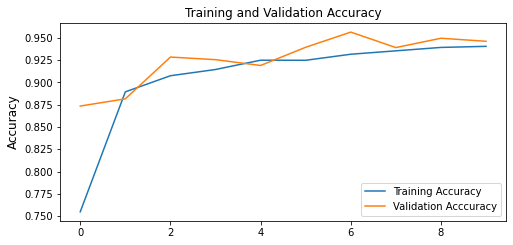

In [132]:

acc = History.history["accuracy"] # report of model
val_acc = History.history["val_accuracy"] # history of validation data

loss = History.history["loss"]        # Training loss
val_loss = History.history["val_loss"] # validation loss

plt.figure(figsize=(8,8))
plt.subplot(2,1,1) # 2 rows and 1 columns
#plotting respective accuracy
plt.plot(acc,label="Training Accuracy")
plt.plot(val_acc, label="Validation Acccuracy")

plt.legend()
plt.ylabel("Accuracy", fontsize=12)
plt.title("Training and Validation Accuracy", fontsize=12)

Text(0.5, 1.0, 'Training and Validation Losses')

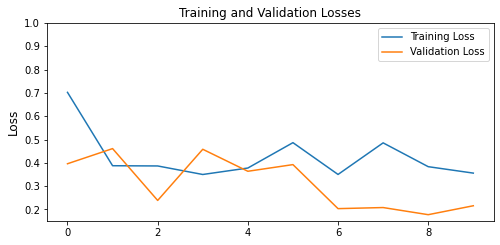

In [133]:
plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
 
plt.plot(loss, label="Training Loss")      #Training loss
plt.plot(val_loss, label="Validation Loss") # Validation Loss

plt.legend()
plt.ylim([min(plt.ylim()),1])
plt.ylabel("Loss", fontsize=12)
plt.title("Training and Validation Losses", fontsize=12)

In [1]:
model= load_model("seg_model_resnet50.h5")
model.evaluate(test, verbose=1)

NameError: name 'load_model' is not defined

In [150]:
pred = model.predict(test)
pred = np.argmax(pred, axis=1) #pick class with highest  probability

labels = (train.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred2 = [labels[k] for k in pred]

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableO

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
  52/1248 [>.............................] - ETA: 39sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
  54/1248 [>.............................] - ETA: 38sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_

Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
  80/1248 [>.............................] - ETA: 35sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
  82/1248 [>.............................] - ETA: 35sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 109/1248 [=>............................] - ETA: 33sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 111/1248 [=>............................] - ETA: 33sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identi

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 138/1248 [==>...........................] - ETA: 32sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/repl

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 166/1248 [==>...........................] - ETA: 31sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 168/1248 [===>..........................] - ETA: 31sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identi

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 194/1248 [===>..........................] - ETA: 30sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/repl

Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 223/1248 [====>.........................] - ETA: 29sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 225/1248 [====>.........................] - ETA: 2

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 251/1248 [=====>........................] - ETA: 28sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 253/1248 [=====>........................] - ETA: 28sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identi

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 279/1248 [=====>........................] - ETA: 27sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 281/1248 [=====>........................] - ETA: 27sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_

Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 307/1248 [======>.......................] - ETA: 26sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 309/1248 [======>.......................] - ETA: 26sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:

 335/1248 [=======>......................] - ETA: 25sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 337/1248 [=======>......................] - ETA: 25sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identi

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 365/1248 [=======>......................] - ETA: 24sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/repl

Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 393/1248 [========>.....................] - ETA: 23sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhos

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 421/1248 [=========>....................] - ETA: 22sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 423/1248 [=========>....................] - ETA: 22sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_

Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 449/1248 [=========>....................] - ETA: 22sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 451/1248 [=========>....................] - ETA: 22sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:

 477/1248 [==========>...................] - ETA: 21sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 479/1248 [==========>...................] - ETA: 21sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identi

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 506/1248 [===========>..................] - ETA: 20sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/repl

 534/1248 [===========>..................] - ETA: 19sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 536/1248 [===========>..................] - ETA: 19sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identi

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 564/1248 [============>.................] - ETA: 18sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/repl

Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 592/1248 [=============>................] - ETA: 18sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 594/1248 [=============>................] - ETA: 1

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 620/1248 [=============>................] - ETA: 17sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 622/1248 [=============>................] - ETA: 17sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identi

Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 648/1248 [==============>...............] - ETA: 16sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 650/1248 [==============>...............] - ETA: 16sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:

 676/1248 [===============>..............] - ETA: 15sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 678/1248 [===============>..............] - ETA: 15sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identi

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 706/1248 [===============>..............] - ETA: 14sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/repl

 733/1248 [================>.............] - ETA: 14sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 735/1248 [================>.............] - ETA: 14sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identi

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 762/1248 [=================>............] - ETA: 13sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 764/1248 [=================>............] - ETA: 13sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_

Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 790/1248 [=================>............] - ETA: 12sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 792/1248 [==================>...........] - ETA: 12sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:

 818/1248 [==================>...........] - ETA: 11sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 820/1248 [==================>...........] - ETA: 11sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identi

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 847/1248 [===================>..........] - ETA: 10sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 849/1248 [===================>..........] - ETA: 10sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 876/1248 [====================>.........] - ETA: 10sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 878/1248 [====================>.........] - ETA: 10sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identi

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 905/1248 [====================>.........] - ETA: 9sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/repli

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 933/1248 [=====================>........] - ETA: 8sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GP

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 962/1248 [======================>.......] - ETA: 7sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/repli

 989/1248 [======================>.......] - ETA: 7sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
 991/1248 [======================>.......] - ETA: 6sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
1018/1248 [=======================>......] - ETA: 6sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
1020/1248 [=======================>......] - ETA: 6sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_pr

Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
1046/1248 [========================>.....] - ETA: 5sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
1048/1248 [========================>.....] - ETA: 5sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
1104/1248 [=========================>....] - ETA: 3sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/repli

Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
1132/1248 [==========================>...] - ETA: 3sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
1134/1248 [==========================>...] - ETA: 3s

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
1160/1248 [==========================>...] - ETA: 2sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
1162/1248 [==========================>...] - ETA: 2sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
1189/1248 [===========================>..] - ETA: 1sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/repli

Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
1217/1248 [============================>.] - ETA: 0sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
1219/1248 [============================>.] - ETA: 0s

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
1245/1248 [============================>.] - ETA: 0sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_255588 in device /job:localhost/replica:0/task:0/device:GPU:0
1247/1248 [============================>.] - ETA: 0sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity

Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/repli

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/repli

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/

Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replic

Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/repli

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/repli

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/

Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replic

Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/repli

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/repli

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/

Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replic

Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/repli

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/repli

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/

Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replic

Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/repli

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/repli

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/

Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replic

Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/repli

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/repli

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/

Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replic

Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/repli

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/repli

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/

Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replic

Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/repli

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/repli

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/

Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replic

Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/repli

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/repli

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/

Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replic

Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/repli

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/repli

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/

Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replic

Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/repli

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/repli

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/

Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replic

Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/repli

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/repli

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/

Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replic

In [144]:
from sklearn.metrics import classification_report,accuracy_score

y_test = test.labels # set y_test to the expected output
print(y_test)
c=0
for i in pred:
    if i==0:
        pred[c]='first'
    if i==1:
        pred[c]='second'
    if i==2:
        pred[c]='third'
    if i==3:
        pred[c]='forth'
    if i==4:
        pred[c]='fifth'
    if i==5:
        pred[c]='sixth'
    
    c=c+1



print(classification_report(y_test, pred))
print("Accuracy of the Model:",accuracy_score(y_test, pred)*100,"%")

['fifth', 'fifth', 'second', 'fifth', 'fifth', 'first', 'second', 'fifth', 'fifth', 'fifth', 'sixth', 'fifth', 'second', 'fifth', 'first', 'forth', 'second', 'second', 'second', 'forth', 'sixth', 'first', 'fifth', 'second', 'fifth', 'fifth', 'third', 'fifth', 'sixth', 'first', 'second', 'fifth', 'sixth', 'fifth', 'sixth', 'sixth', 'sixth', 'fifth', 'fifth', 'second', 'fifth', 'sixth', 'fifth', 'sixth', 'forth', 'sixth', 'sixth', 'sixth', 'sixth', 'sixth', 'sixth', 'third', 'fifth', 'third', 'third', 'forth', 'forth', 'sixth', 'third', 'second', 'sixth', 'sixth', 'sixth', 'third', 'sixth', 'sixth', 'fifth', 'fifth', 'second', 'sixth', 'fifth', 'fifth', 'sixth', 'fifth', 'third', 'second', 'sixth', 'fifth', 'fifth', 'sixth', 'second', 'fifth', 'fifth', 'fifth', 'fifth', 'sixth', 'sixth', 'sixth', 'fifth', 'sixth', 'sixth', 'second', 'fifth', 'sixth', 'sixth', 'third', 'second', 'first', 'second', 'forth', 'second', 'first', 'fifth', 'fifth', 'fifth', 'sixth', 'second', 'fifth', 'forth', 

ValueError: invalid literal for int() with base 10: 'fifth'

In [151]:
pred

array([4, 4, 1, ..., 5, 2, 5], dtype=int64)

In [152]:
y_test = test.labels 

In [153]:
y_test

[4,
 4,
 1,
 4,
 4,
 0,
 1,
 4,
 4,
 4,
 5,
 4,
 1,
 4,
 0,
 3,
 1,
 1,
 1,
 3,
 5,
 2,
 4,
 1,
 4,
 4,
 3,
 4,
 5,
 0,
 1,
 4,
 5,
 4,
 5,
 5,
 5,
 4,
 4,
 1,
 4,
 5,
 4,
 5,
 3,
 5,
 5,
 5,
 2,
 5,
 5,
 3,
 4,
 2,
 3,
 3,
 3,
 3,
 5,
 1,
 5,
 5,
 5,
 2,
 5,
 5,
 4,
 4,
 1,
 5,
 4,
 4,
 5,
 4,
 4,
 1,
 5,
 4,
 4,
 5,
 1,
 4,
 4,
 4,
 4,
 5,
 5,
 5,
 4,
 5,
 5,
 1,
 4,
 5,
 5,
 3,
 1,
 0,
 1,
 3,
 1,
 0,
 4,
 4,
 4,
 5,
 1,
 4,
 3,
 5,
 1,
 4,
 4,
 4,
 5,
 3,
 2,
 4,
 3,
 3,
 4,
 0,
 0,
 4,
 2,
 4,
 5,
 2,
 3,
 5,
 5,
 2,
 4,
 2,
 1,
 1,
 4,
 4,
 4,
 3,
 1,
 1,
 0,
 3,
 4,
 2,
 3,
 1,
 5,
 5,
 3,
 4,
 1,
 5,
 5,
 1,
 4,
 3,
 4,
 2,
 0,
 3,
 0,
 4,
 1,
 1,
 0,
 5,
 5,
 4,
 1,
 4,
 1,
 5,
 1,
 0,
 4,
 5,
 2,
 4,
 1,
 4,
 5,
 1,
 3,
 4,
 3,
 5,
 5,
 1,
 4,
 4,
 3,
 5,
 4,
 3,
 0,
 4,
 4,
 3,
 4,
 3,
 3,
 3,
 2,
 4,
 4,
 2,
 4,
 5,
 4,
 2,
 3,
 4,
 5,
 1,
 3,
 5,
 4,
 4,
 4,
 3,
 3,
 3,
 3,
 1,
 1,
 1,
 5,
 4,
 4,
 5,
 5,
 5,
 2,
 4,
 1,
 4,
 0,
 4,
 1,
 2,
 1,
 4,
 3,
 4,
 4,
 5,
 3,
 1,


In [154]:
from sklearn.metrics import classification_report,accuracy_score
print(classification_report(y_test, pred))

              precision    recall  f1-score   support

           0       0.87      0.96      0.91       584
           1       0.96      0.98      0.97      1494
           2       0.78      0.86      0.81       603
           3       0.99      0.90      0.94      1376
           4       0.99      0.96      0.97      2692
           5       0.96      0.99      0.97      1982

    accuracy                           0.95      8731
   macro avg       0.92      0.94      0.93      8731
weighted avg       0.95      0.95      0.95      8731



In [155]:
print("Accuracy of the Model:",accuracy_score(y_test, pred)*100,"%")

Accuracy of the Model: 95.10938036880083 %


In [156]:
from keras.models import load_model
model.save("classification_model_VGG16.h5")

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

In [157]:
model.save_weights("network.h5")

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j